# Crossentropy method

This notebook will teach you to solve reinforcement learning problems with crossentropy method. We'll follow-up by scaling everything up and using neural network policy.

In [1]:
import os
from datetime import datetime

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")

Formatted current time: 19:28:58


In [30]:
import gymnasium as gym
import numpy as np, pandas as pd

env = gym.make("Taxi-v3", render_mode="rgb_array")
env.reset()
env.render()

array([[[110, 109, 106],
        [110, 109, 106],
        [124, 122, 122],
        ...,
        [108, 111, 109],
        [108, 111, 109],
        [118, 119, 119]],

       [[110, 109, 106],
        [110, 109, 106],
        [124, 122, 122],
        ...,
        [108, 111, 109],
        [108, 111, 109],
        [118, 119, 119]],

       [[114, 116, 115],
        [114, 116, 115],
        [126, 127, 126],
        ...,
        [112, 113, 111],
        [112, 113, 111],
        [118, 117, 115]],

       ...,

       [[116, 115, 116],
        [116, 115, 116],
        [106, 107, 108],
        ...,
        [113, 115, 114],
        [113, 115, 114],
        [117, 114, 117]],

       [[116, 115, 116],
        [116, 115, 116],
        [106, 107, 108],
        ...,
        [113, 115, 114],
        [113, 115, 114],
        [117, 114, 117]],

       [[115, 112, 112],
        [115, 112, 112],
        [119, 119, 117],
        ...,
        [123, 119, 118],
        [123, 119, 118],
        [114, 114, 117]]

In [3]:
n_states = env.observation_space.n
n_actions = env.action_space.n

print("n_states=%i, n_actions=%i"%(n_states,n_actions))

n_states=500, n_actions=6


# Create stochastic policy

This time our policy should be a probability distribution.

```policy[s,a] = P(take action a | in state s)```

Since we still use integer state and action representations, you can use a 2-dimensional array to represent the policy.

Please initialize policy __uniformly__, that is, probabililities of all actions should be equal.


# Initialize policy (0.5pts)

In [4]:
policy = np.full((n_states,n_actions),1/n_actions)
assert type(policy) in (np.ndarray,np.matrix)
assert np.allclose(policy,1./n_actions)
assert np.allclose(np.sum(policy,axis=1), 1)
print("Ok!")

Ok!


# Play the game (0.5pts)

Just like before, but we also record all states and actions we took.

In [5]:
import io
import random
#fig, ax = plt.subplots(figsize=(6, 6))

drawTaxi=False
randActionProb=0.5

def generate_session(policy,t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states,actions = [],[]
    total_reward = 0.
    
    s = env.reset()[0]
    
    arr=np.array(list(range(n_actions)))
    
    for t in range(t_max):
        if drawTaxi == True:
            clear_output(wait=True)
            plt.imshow(env.render())
            plt.axis('off') # Hide axes for cleaner display
            plt.show()
        
        a=0
        
        if random.random()<1-randActionProb:
            a = np.random.choice(arr, p = policy[s])
        else:
            a=random.randint(0,n_actions-1)
        
        new_s,r,done,tr,info = env.step(a)
        
        #print(new_s)
        
        #Record state, action and add up reward to states,actions and total_reward accordingly. 
        #add state
        states.append(s)
        
        #add action
        actions.append(a)
        
        #add reward
        total_reward+=r
        
        s = new_s
        
        
        if done:
            break
    return states,actions,total_reward
        

In [6]:
s,a,r = generate_session(policy)
print(r)
assert type(s) == type(a) == list
assert len(s) == len(a)
assert type(r) in [float]
print("Ok!")

-8496.0
Ok!


CPU times: user 8.6 s, sys: 88 ms, total: 8.69 s
Wall time: 9 s
Ok!


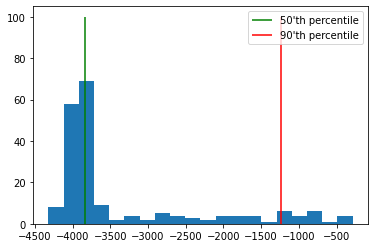

In [7]:
#let's see the initial reward distribution
import matplotlib.pyplot as plt
%matplotlib inline

%time sample_rewards = [generate_session(policy,t_max=1000)[-1] for _ in range(200)]

plt.hist(sample_rewards,bins=20);
plt.vlines([np.percentile(sample_rewards,50)],[0],[100],label="50'th percentile",color='green')
plt.vlines([np.percentile(sample_rewards,90)],[0],[100],label="90'th percentile",color='red')
plt.legend()
plt.plot()
print('Ok!')

### Crossentropy method steps (1pts)

In [8]:
def select_elites(states_batch,actions_batch,rewards_batch,percentile=50):
    """
    Select states and actions from games that have rewards >= percentile
    :param states_batch: list of lists of states, states_batch[session_i][t]
    :param actions_batch: list of lists of actions, actions_batch[session_i][t]
    :param rewards_batch: list of rewards, rewards_batch[session_i][t]
    
    :returns: elite_states,elite_actions, both 1D lists of states and respective actions from elite sessions
    
    Please return elite states and actions in their original order 
    [i.e. sorted by session number and timestep within session]
    
    If you're confused, see examples below. Please don't assume that states are integers (they'll get different later).
    """ 
    reward_threshold = np.percentile(rewards_batch,percentile) #recalc threshold. hint : np.percentile

    ind=np.where(rewards_batch>=reward_threshold)[0]
    
    elite_states1 = [states_batch[i] for i in ind]
    elite_states = [
        x
        for xs in elite_states1
        for x in xs
    ]
    
    elite_actions1 = [actions_batch[i] for i in ind]
    elite_actions = [
        x
        for xs in elite_actions1
        for x in xs
    ]
    
    #if(len(np.array(states_batch[0]).shape) == 1):
    #    elite_states = np.hstack()#states)
    #else:
    #    elite_states = np.vstack()#states)
    #        
    #elite_actions = np.hstack()#actions)
    
    return elite_states,elite_actions
    

In [9]:
states_batch = [
    np.array([1,2,3]),   #game1
    np.array([4,2,0,2]), #game2
    np.array([3,1])      #game3
]

actions_batch = [
    np.array([0,2,4]),   #game1
    np.array([3,2,0,1]), #game2
    np.array([3,3])      #game3
]
rewards_batch = np.array([
    3,         #game1
    4,         #game2
    5,         #game3
])

test_result_0 = select_elites(states_batch,actions_batch,rewards_batch,percentile=0)

test_result_40 = select_elites(states_batch,actions_batch,rewards_batch,percentile=30)
test_result_90 = select_elites(states_batch,actions_batch,rewards_batch,percentile=90)
test_result_100 = select_elites(states_batch,actions_batch,rewards_batch,percentile=100)

assert np.all(test_result_0[0] == [1, 2, 3, 4, 2, 0, 2, 3, 1])  \
   and np.all(test_result_0[1] == [0, 2, 4, 3, 2, 0, 1, 3, 3]),\
        "For percentile 0 you should return all states and actions in chronological order"
assert np.all(test_result_40[0] == [4, 2, 0, 2, 3, 1]) and \
        np.all(test_result_40[1] ==[3, 2, 0, 1, 3, 3]),\
        "For percentile 30 you should only select states/actions from two first"
assert np.all(test_result_90[0] == [3,1]) and \
        np.all(test_result_90[1] == [3,3]),\
        "For percentile 90 you should only select states/actions from one game"
assert np.all(test_result_100[0] == [3,1]) and\
       np.all(test_result_100[1] == [3,3]),\
        "Please make sure you use >=, not >. Also double-check how you compute percentile."
print("Ok!")

Ok!


In [10]:
def update_policy(elite_states,elite_actions):
    """
    Given old policy and a list of elite states/actions from select_elites,
    return new updated policy where each action probability is proportional to
    
    policy[s_i,a_i] ~ #[occurences of si and ai in elite states/actions]
    
    Don't forget to normalize policy to get valid probabilities and handle 0/0 case.
    In case you never visited a state, set probabilities for all actions to 1./n_actions
    
    :param elite_states: 1D list of states from elite sessions
    :param elite_actions: 1D list of actions from elite sessions
    
    """
    
    new_policy = np.zeros([n_states,n_actions])
    np.add.at(new_policy,(elite_states,elite_actions),1)
    
    all_zeros = np.all(new_policy == 0, axis=1)
    row_sums = new_policy.sum(axis=1, keepdims=True)
    non_zero_rows = ~all_zeros
    new_policy[non_zero_rows] = new_policy[non_zero_rows] / row_sums[non_zero_rows]
    new_policy[all_zeros] = 1 / new_policy.shape[1]
    
    #row_sums = new_policy.sum(axis=1)
    #new_policy = (new_policy / row_sums[:, np.newaxis])*(row_sums[:, np.newaxis]!=0)
    
    #<Your code here: update probabilities for actions given elite states & actions>
    #Don't forget to set 1/n_actions for all actions in unvisited states.
    
    return new_policy

In [11]:

elite_states, elite_actions = ([1, 2, 3, 4, 2, 0, 2, 3, 1], [0, 2, 4, 3, 2, 0, 1, 3, 3])


new_policy = update_policy(elite_states,elite_actions)
#for i in (new_policy):
#    print(i)

print(new_policy[:4,:5])

assert np.isfinite(new_policy).all(), "Your new policy contains NaNs or +-inf. Make sure you don't divide by zero."
assert np.all(new_policy>=0), "Your new policy can't have negative action probabilities"
assert np.allclose(new_policy.sum(axis=-1),1), "Your new policy should be a valid probability distribution over actions"
reference_answer = np.array([
       [ 1.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.5       ,  0.        ,  0.        ,  0.5       ,  0.        ],
       [ 0.        ,  0.33333333,  0.66666667,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.5       ,  0.5       ]])

assert np.allclose(new_policy[:4,:5],reference_answer)
print("Ok!")

[[1.         0.         0.         0.         0.        ]
 [0.5        0.         0.         0.5        0.        ]
 [0.         0.33333333 0.66666667 0.         0.        ]
 [0.         0.         0.         0.5        0.5       ]]
Ok!


# Training loop (1pts)
Generate sessions, select N best and fit to those.

In [12]:
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

def show_progress(rewards_batch,log, reward_range=[-990,+10]):
    """
    A convenience function that displays training progress. 
    No cool math here, just charts.
    """
    
    mean_reward = np.mean(rewards_batch)
    threshold = np.percentile(rewards_batch,percentile)
    log.append([mean_reward,threshold])

    #clear_output(True)
    print("mean reward = %.3f, threshold=%.3f"%(mean_reward,threshold))
    plt.figure(figsize=[8,4])
    plt.subplot(1,2,1)
    plt.plot(list(zip(*log))[0],label='Mean rewards')
    plt.plot(list(zip(*log))[1],label='Reward thresholds')
    plt.legend()
    plt.grid()
    
    plt.subplot(1,2,2)
    plt.hist(rewards_batch);
    plt.vlines([np.percentile(rewards_batch,percentile)],[0],[100],label="percentile",color='red')
    plt.legend()
    plt.grid()

    plt.show()


In [13]:
#reset policy just in case
policy = np.full((n_states,n_actions),1/n_actions)

Formatted current time: 19:29:11
i=0
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 35.00 seconds
mean reward = -10419.064, threshold=-4022.900


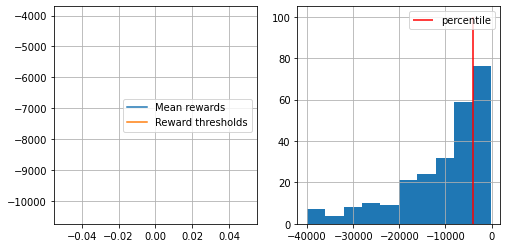

i=1
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 20.99 seconds
mean reward = -6735.152, threshold=-2405.200


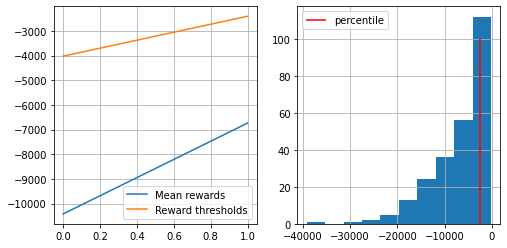

i=2
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 14.89 seconds
mean reward = -4817.404, threshold=-1906.800


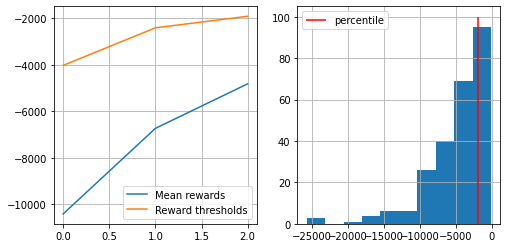

i=3
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 11.12 seconds
mean reward = -3466.036, threshold=-1498.700


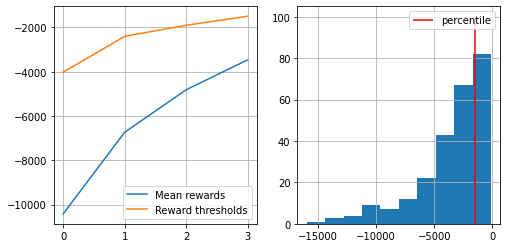

i=4
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 9.95 seconds
mean reward = -2607.168, threshold=-1279.800


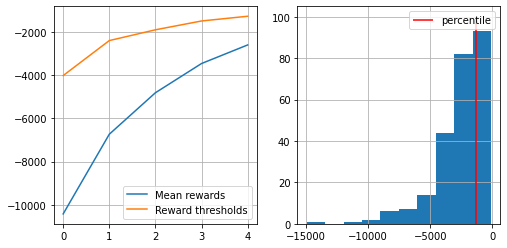

i=5
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 8.05 seconds
mean reward = -2200.784, threshold=-934.400


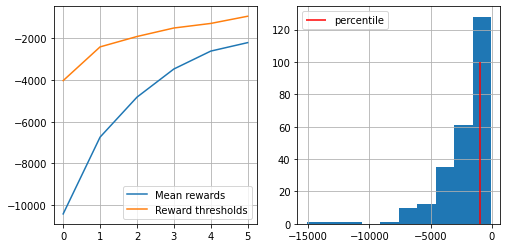

i=6
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 6.62 seconds
mean reward = -1817.176, threshold=-877.100


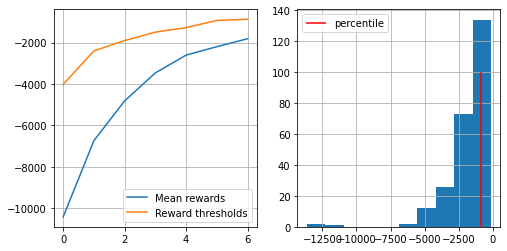

i=7
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 5.30 seconds
mean reward = -1408.848, threshold=-784.700


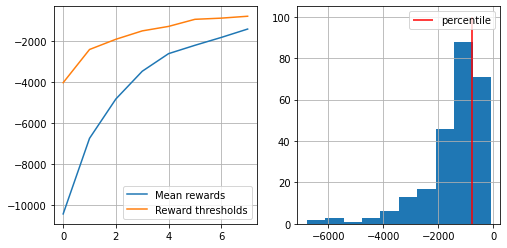

i=8
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 4.60 seconds
mean reward = -1205.976, threshold=-672.700


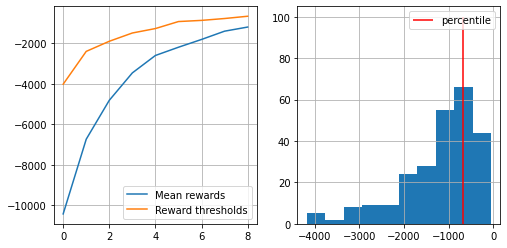

i=9
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 4.50 seconds
mean reward = -1170.616, threshold=-632.600


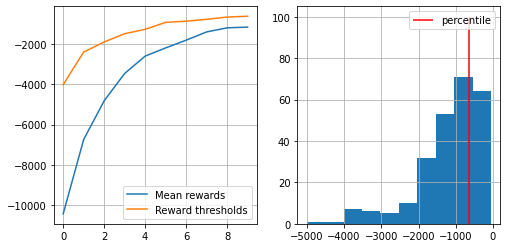

i=10
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 3.94 seconds
mean reward = -970.672, threshold=-544.700


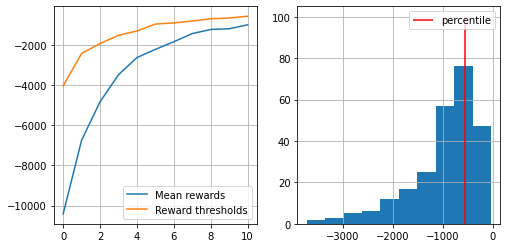

i=11
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 3.33 seconds
mean reward = -828.800, threshold=-489.400


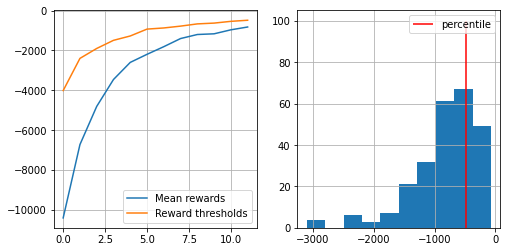

i=12
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 3.38 seconds
mean reward = -777.228, threshold=-463.000


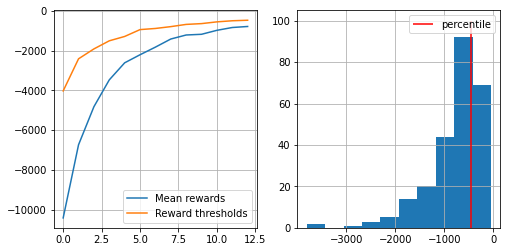

i=13
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 3.40 seconds
mean reward = -716.684, threshold=-439.800


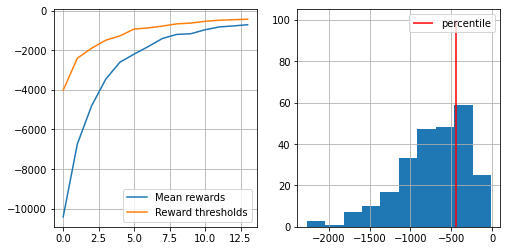

i=14
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 3.00 seconds
mean reward = -652.756, threshold=-406.700


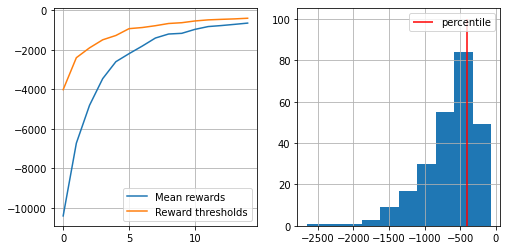

i=15
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.55 seconds
mean reward = -572.236, threshold=-343.100


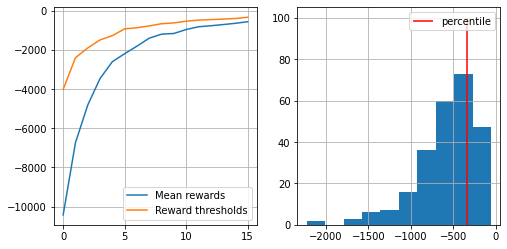

i=16
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.39 seconds
mean reward = -550.736, threshold=-330.000


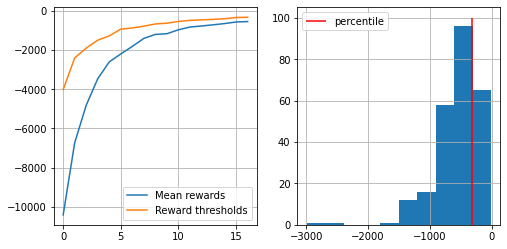

i=17
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.31 seconds
mean reward = -507.876, threshold=-316.800


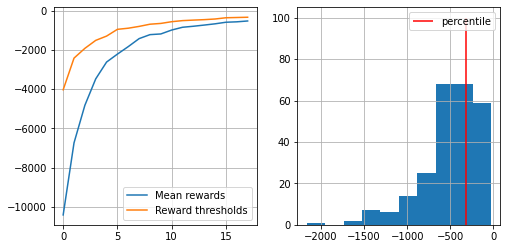

i=18
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.20 seconds
mean reward = -465.572, threshold=-291.000


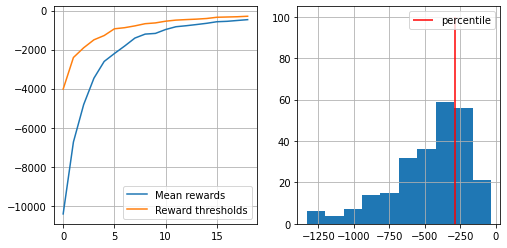

i=19
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.27 seconds
mean reward = -479.496, threshold=-310.400


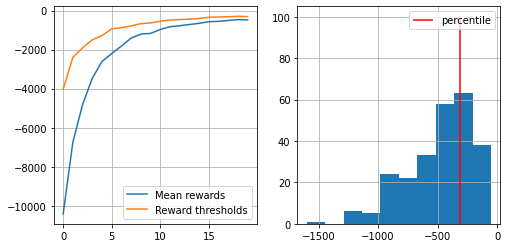

i=20
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.08 seconds
mean reward = -436.044, threshold=-253.000


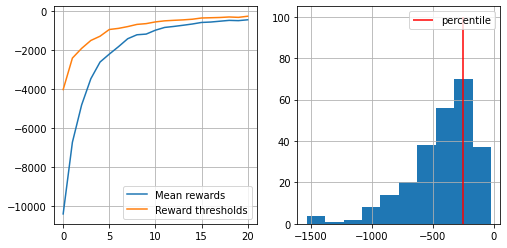

i=21
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.23 seconds
mean reward = -467.144, threshold=-279.800


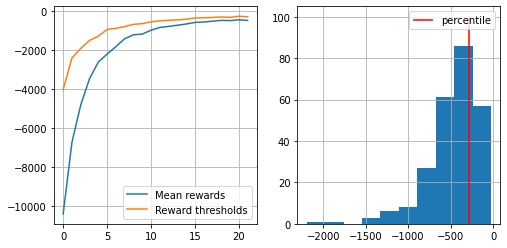

i=22
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 2.07 seconds
mean reward = -412.616, threshold=-268.700


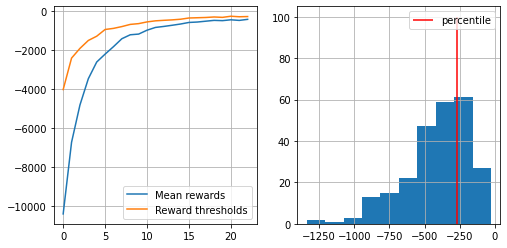

i=23
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.92 seconds
mean reward = -407.188, threshold=-240.700


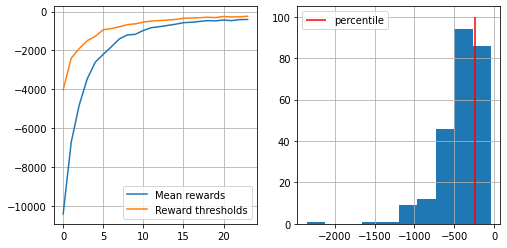

i=24
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.99 seconds
mean reward = -380.924, threshold=-223.000


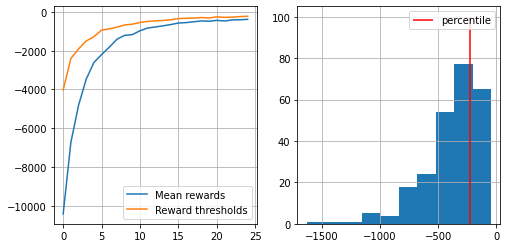

i=25
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.72 seconds
mean reward = -344.880, threshold=-204.700


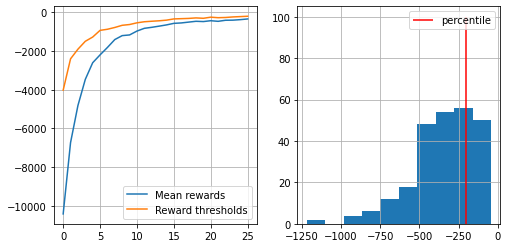

i=26
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.56 seconds
mean reward = -314.168, threshold=-204.400


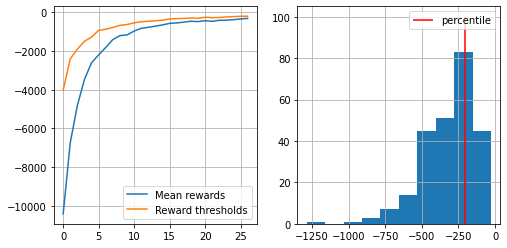

i=27
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.74 seconds
mean reward = -331.332, threshold=-217.000


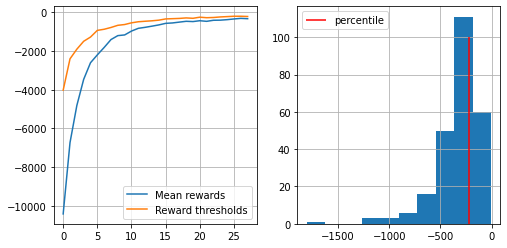

i=28
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.74 seconds
mean reward = -325.180, threshold=-201.400


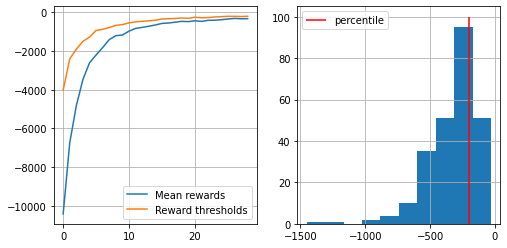

i=29
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.82 seconds
mean reward = -314.236, threshold=-195.000


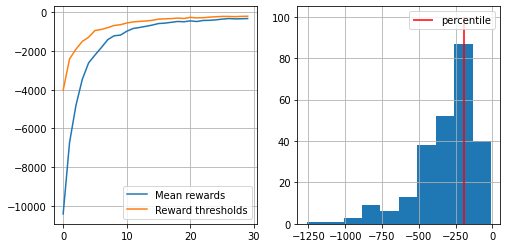

i=30
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.54 seconds
mean reward = -292.460, threshold=-160.700


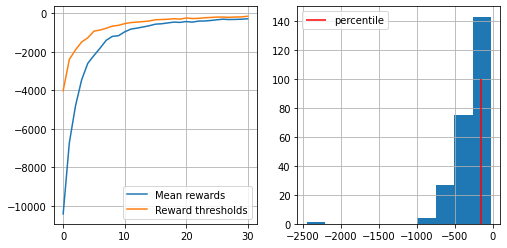

i=31
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.58 seconds
mean reward = -298.976, threshold=-181.000


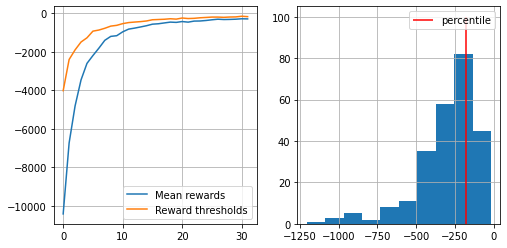

i=32
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.55 seconds
mean reward = -279.524, threshold=-170.000


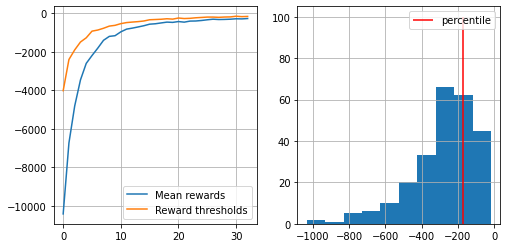

i=33
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.56 seconds
mean reward = -265.240, threshold=-172.800


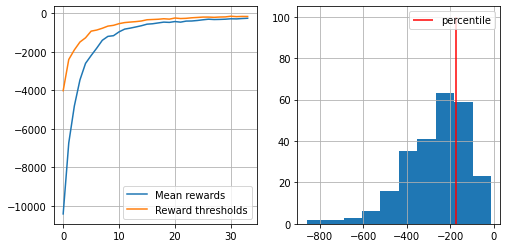

i=34
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.31 seconds
mean reward = -260.192, threshold=-168.700


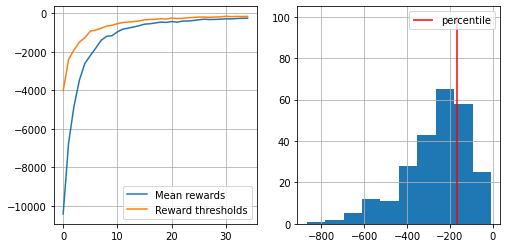

i=35
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.46 seconds
mean reward = -251.684, threshold=-146.700


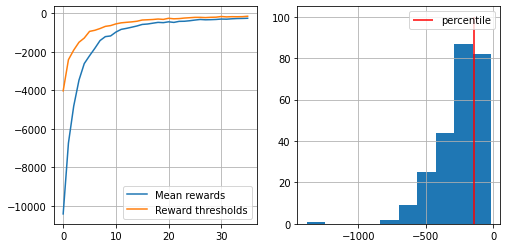

i=36
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.41 seconds
mean reward = -238.968, threshold=-135.700


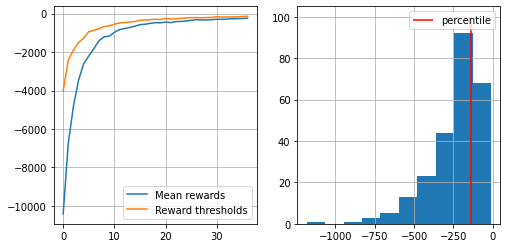

i=37
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.37 seconds
mean reward = -238.292, threshold=-138.100


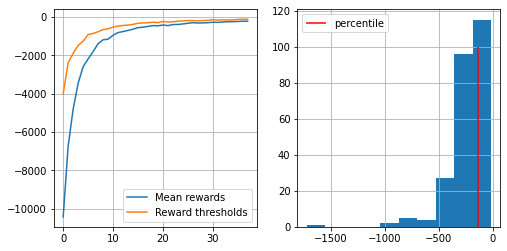

i=38
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.26 seconds
mean reward = -217.864, threshold=-128.700


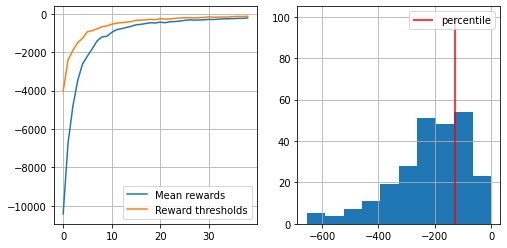

i=39
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.35 seconds
mean reward = -232.432, threshold=-150.000


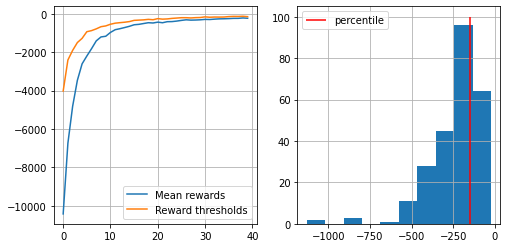

i=40
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.30 seconds
mean reward = -210.532, threshold=-128.000


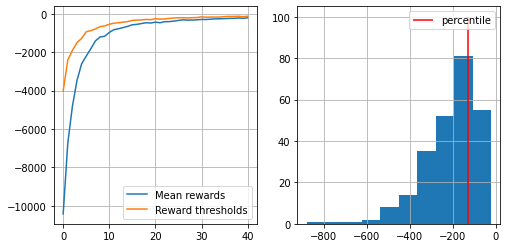

i=41
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.29 seconds
mean reward = -201.304, threshold=-133.400


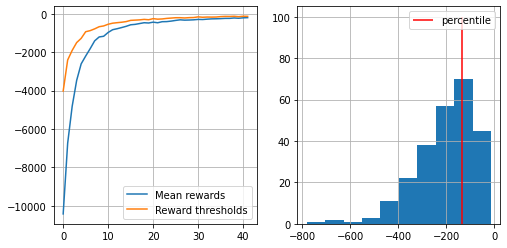

i=42
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.19 seconds
mean reward = -187.212, threshold=-111.700


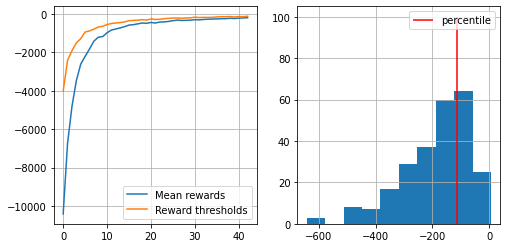

i=43
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.23 seconds
mean reward = -182.980, threshold=-110.700


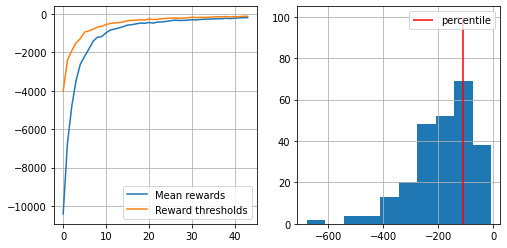

i=44
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.27 seconds
mean reward = -189.120, threshold=-116.000


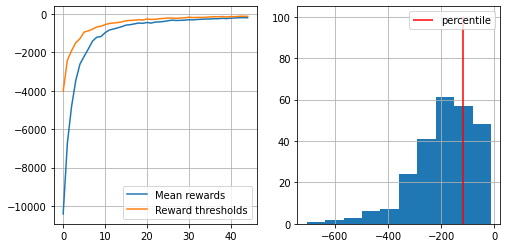

i=45
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.95 seconds
mean reward = -183.020, threshold=-112.000


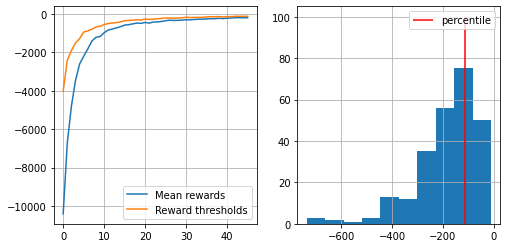

i=46
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.24 seconds
mean reward = -186.672, threshold=-108.100


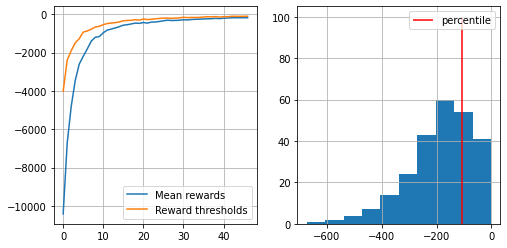

i=47
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.14 seconds
mean reward = -183.112, threshold=-102.000


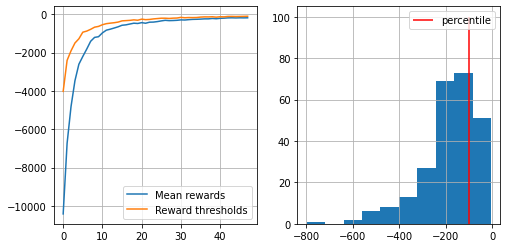

i=48
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.14 seconds
mean reward = -168.952, threshold=-92.000


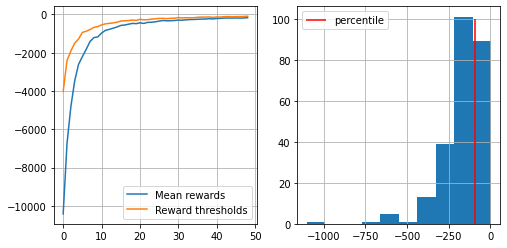

i=49
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.16 seconds
mean reward = -178.696, threshold=-104.400


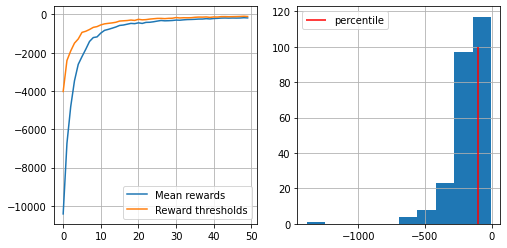

i=50
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.20 seconds
mean reward = -186.264, threshold=-101.700


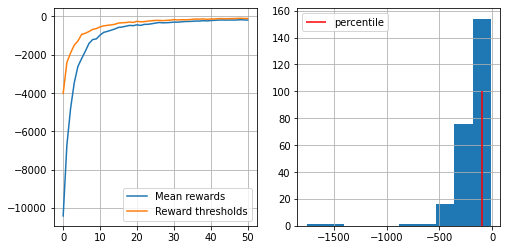

i=51
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.22 seconds
mean reward = -192.844, threshold=-107.000


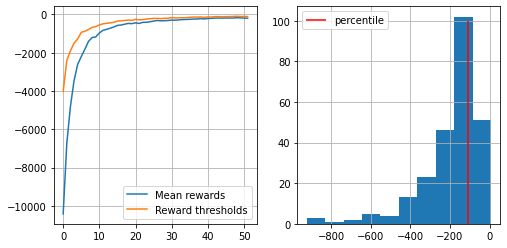

i=52
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.99 seconds
mean reward = -148.948, threshold=-83.700


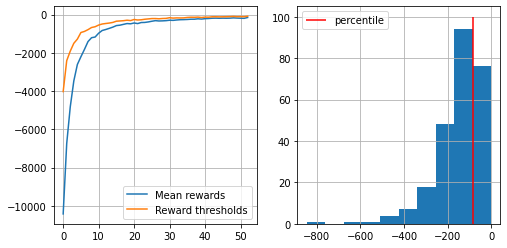

i=53
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.06 seconds
mean reward = -152.796, threshold=-85.700


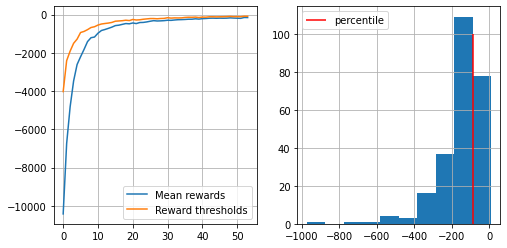

i=54
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.02 seconds
mean reward = -143.692, threshold=-85.700


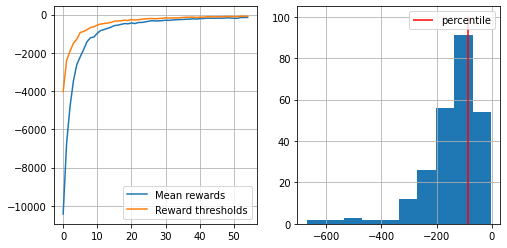

i=55
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.99 seconds
mean reward = -146.136, threshold=-86.700


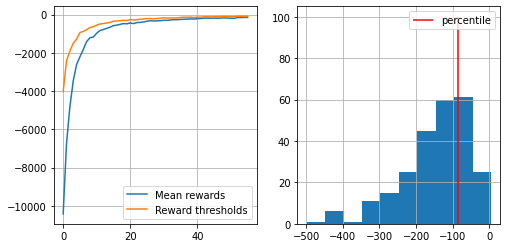

i=56
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.92 seconds
mean reward = -143.496, threshold=-87.000


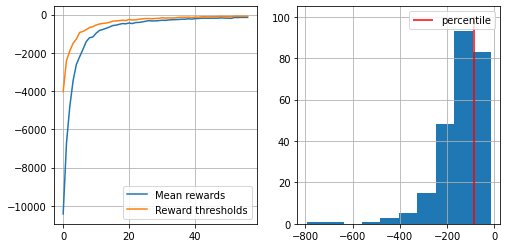

i=57
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.99 seconds
mean reward = -155.388, threshold=-90.700


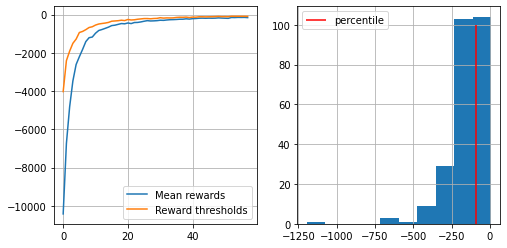

i=58
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.94 seconds
mean reward = -127.480, threshold=-71.000


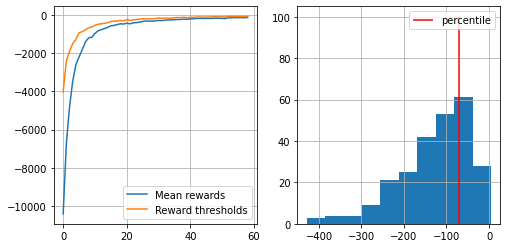

i=59
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.03 seconds
mean reward = -140.152, threshold=-88.000


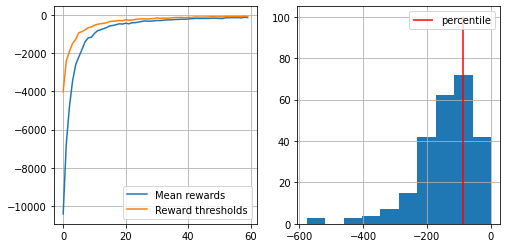

i=60
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.02 seconds
mean reward = -136.812, threshold=-81.700


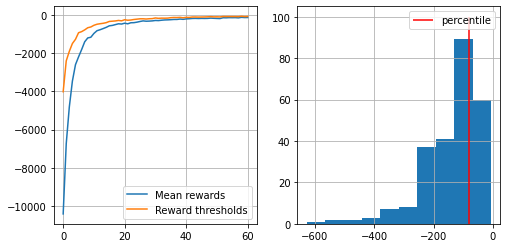

i=61
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.99 seconds
mean reward = -132.672, threshold=-75.000


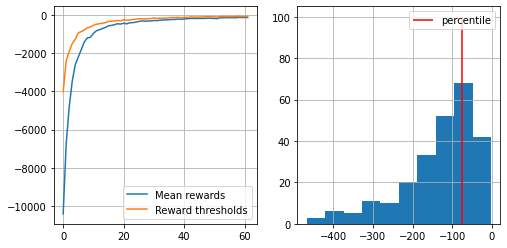

i=62
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.94 seconds
mean reward = -122.828, threshold=-72.000


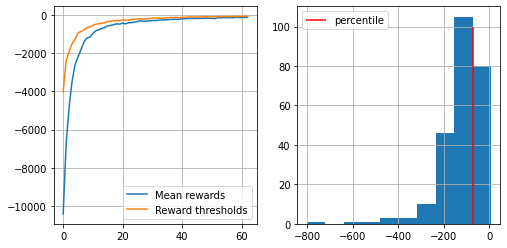

i=63
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.99 seconds
mean reward = -122.468, threshold=-62.700


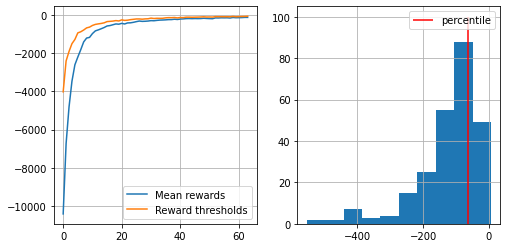

i=64
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.03 seconds
mean reward = -134.328, threshold=-79.700


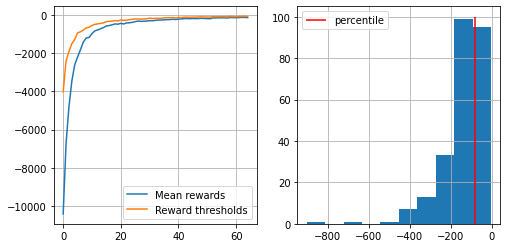

i=65
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.93 seconds
mean reward = -130.280, threshold=-71.000


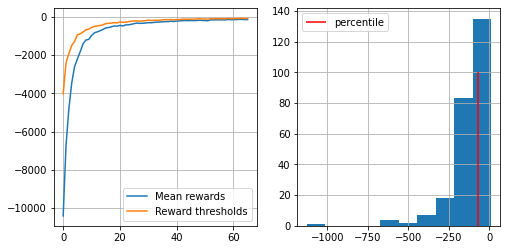

i=66
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.89 seconds
mean reward = -128.124, threshold=-61.000


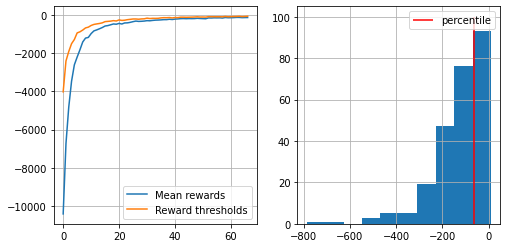

i=67
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.98 seconds
mean reward = -134.280, threshold=-64.700


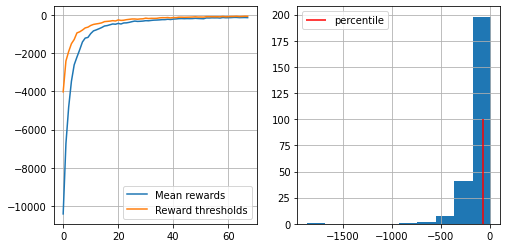

i=68
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.02 seconds
mean reward = -129.260, threshold=-66.100


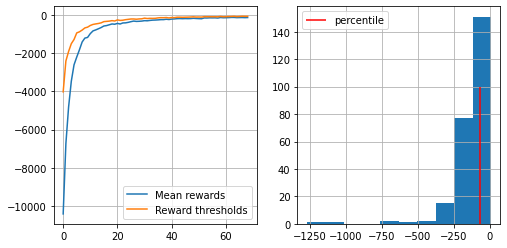

i=69
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.97 seconds
mean reward = -124.432, threshold=-55.700


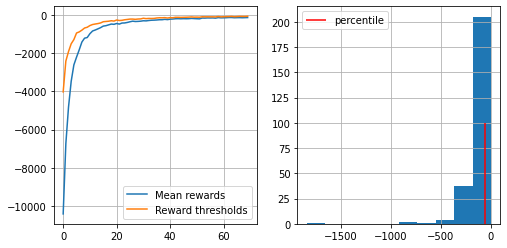

i=70
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.03 seconds
mean reward = -131.968, threshold=-52.000


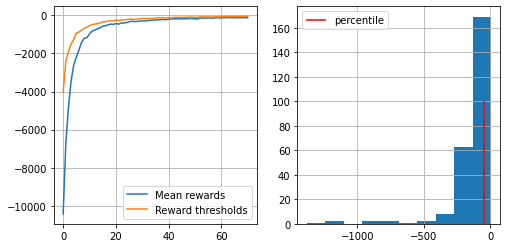

i=71
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.96 seconds
mean reward = -114.120, threshold=-52.000


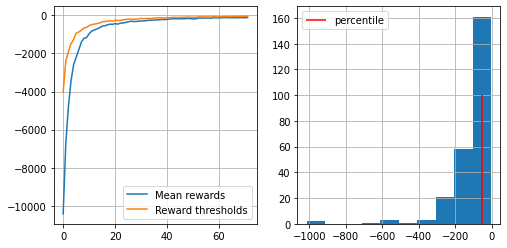

i=72
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 1.05 seconds
mean reward = -154.408, threshold=-57.700


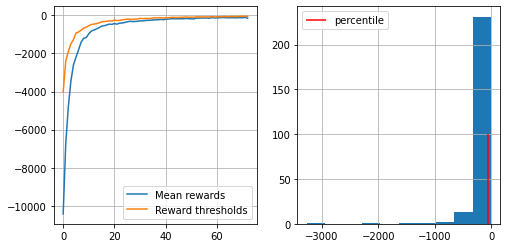

i=73
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.93 seconds
mean reward = -118.204, threshold=-50.000


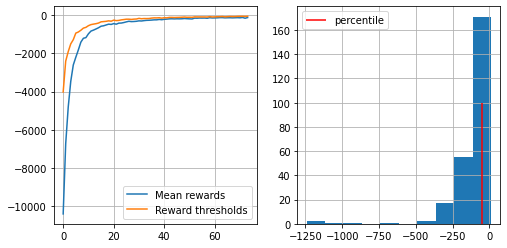

i=74
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.89 seconds
mean reward = -114.260, threshold=-52.000


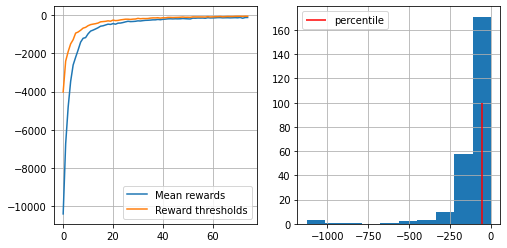

i=75
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.97 seconds
mean reward = -115.296, threshold=-50.000


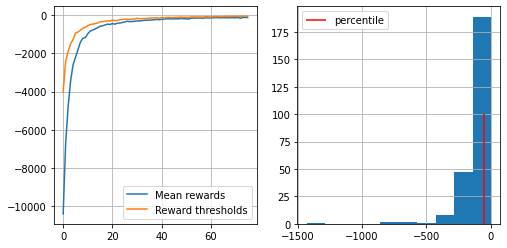

i=76
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.91 seconds
mean reward = -111.756, threshold=-45.400


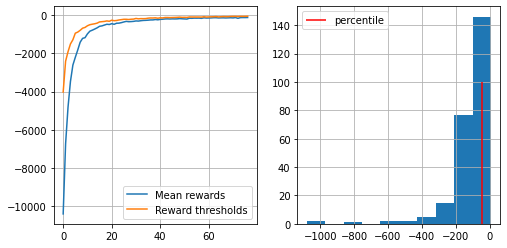

i=77
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.90 seconds
mean reward = -115.608, threshold=-52.000


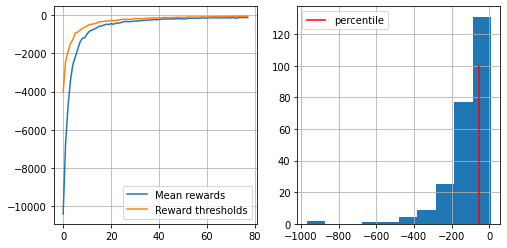

i=78
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.82 seconds
mean reward = -103.052, threshold=-58.000


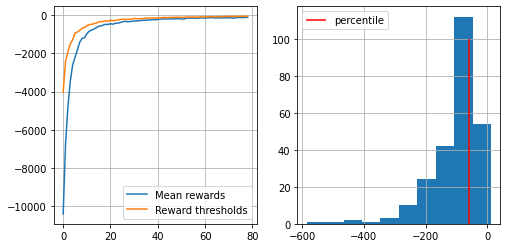

i=79
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.94 seconds
mean reward = -112.808, threshold=-58.000


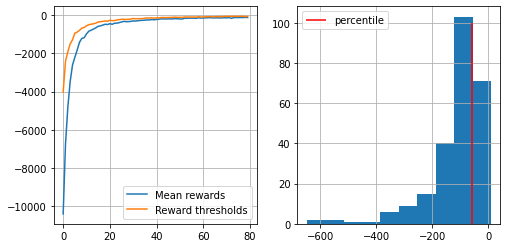

i=80
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.88 seconds
mean reward = -110.908, threshold=-45.700


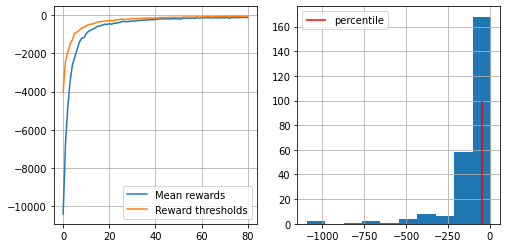

i=81
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.86 seconds
mean reward = -107.596, threshold=-46.000


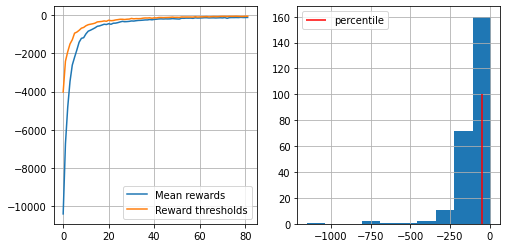

i=82
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.91 seconds
mean reward = -111.292, threshold=-50.700


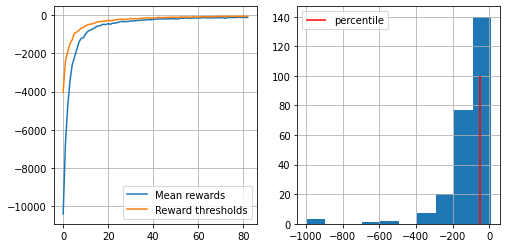

i=83
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.83 seconds
mean reward = -106.328, threshold=-41.000


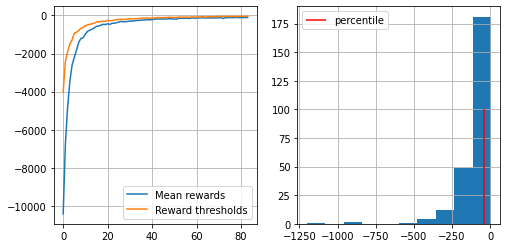

i=84
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.97 seconds
mean reward = -123.068, threshold=-43.700


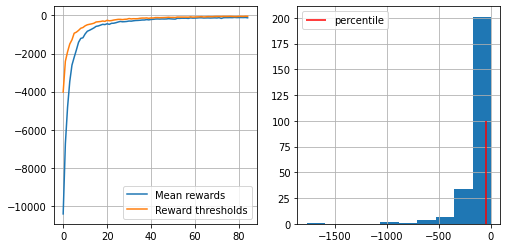

i=85
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.83 seconds
mean reward = -101.260, threshold=-42.700


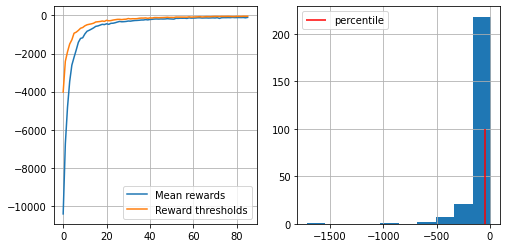

i=86
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.98 seconds
mean reward = -94.600, threshold=-34.700


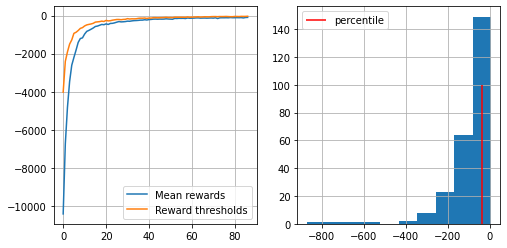

i=87
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.87 seconds
mean reward = -97.808, threshold=-42.700


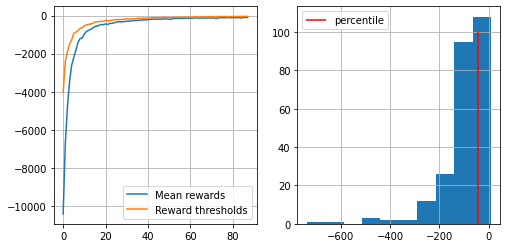

i=88
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.78 seconds
mean reward = -78.936, threshold=-39.000


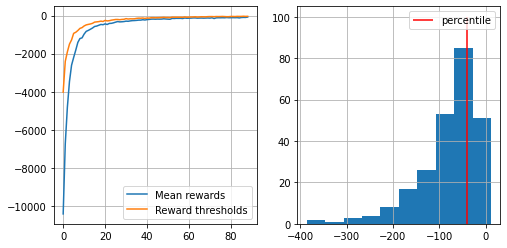

i=89
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.83 seconds
mean reward = -87.668, threshold=-36.700


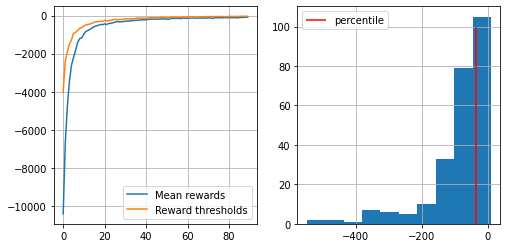

i=90
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.77 seconds
mean reward = -93.392, threshold=-33.700


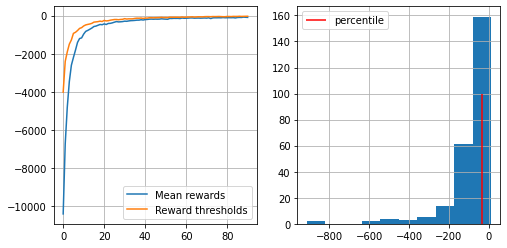

i=91
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.83 seconds
mean reward = -108.320, threshold=-36.000


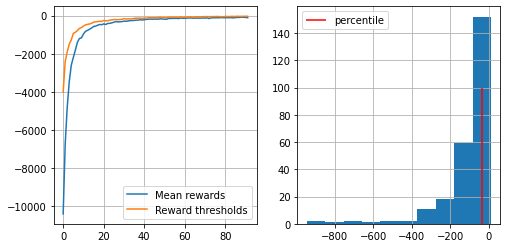

i=92
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.70 seconds
mean reward = -85.008, threshold=-33.700


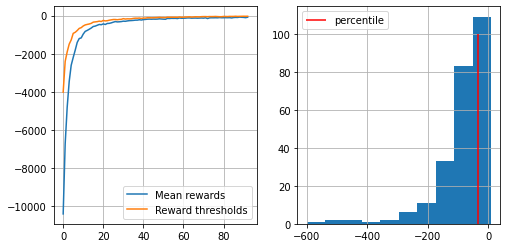

i=93
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.76 seconds
mean reward = -92.032, threshold=-33.000


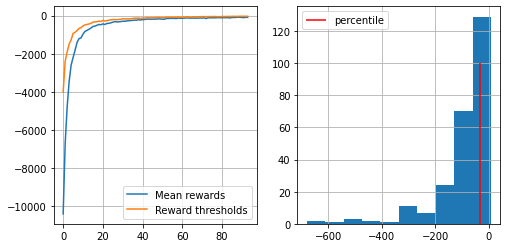

i=94
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.75 seconds
mean reward = -85.572, threshold=-30.700


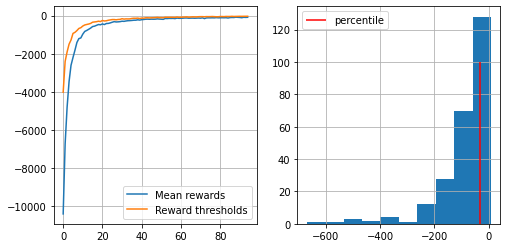

i=95
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.81 seconds
mean reward = -113.808, threshold=-36.000


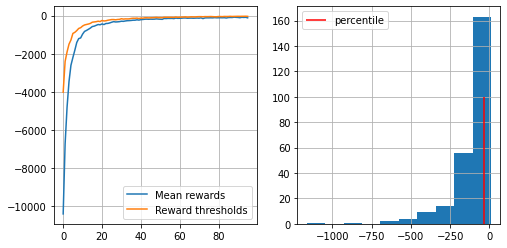

i=96
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.90 seconds
mean reward = -116.876, threshold=-39.000


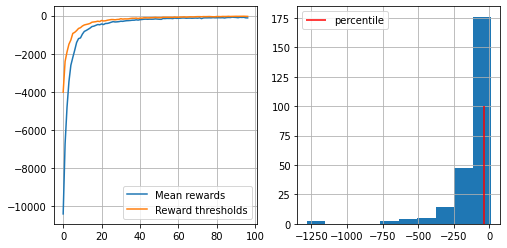

i=97
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.86 seconds
mean reward = -114.892, threshold=-33.000


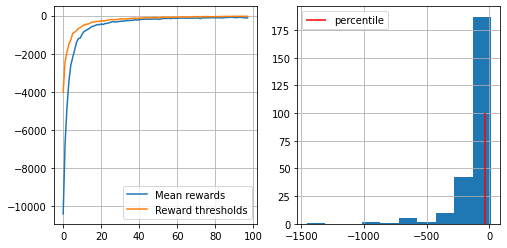

i=98
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.82 seconds
mean reward = -109.212, threshold=-37.700


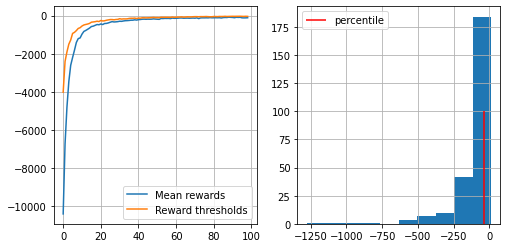

i=99
[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667]
0
50
100
150
200
Loop took 0.88 seconds
mean reward = -114.388, threshold=-28.000


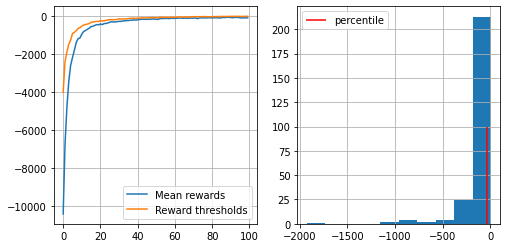

Training took 274.63 seconds
Formatted current time: 19:33:46


In [14]:
n_sessions = 250  #sample this many sessions
percentile = 70  #take this percent of session with highest rewards
learning_rate = 0.3  #add this thing to all counts for stability

log = []

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")

import time
startT = time.time()

doT1=True

for i in range(100):
    if doT1==False:
        break
    
    print(f'i={i}')
    print(policy[0])
    
    sessions=[]
    start = time.time()
    for j in range(n_sessions):
        sessions.append(generate_session(policy))
        if j % 50 == 0:
            print(j)
    
    
    randActionProb*=0.99
    end = time.time()
    print(f"Loop took {end - start:.2f} seconds")
    
#    %time sessions = [generate_session(policy) for _ in range(n_sessions)]
    
    states_batch,actions_batch,rewards_batch = zip(*sessions)

    elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=percentile)
    
    new_policy = update_policy(elite_states,elite_actions)
    
    policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy
    
    assert np.allclose(policy.sum(axis=-1),1)
    

    
    #display results on chart
    show_progress(rewards_batch,log)
    
    
endT = time.time()

print(f"Training took {endT - startT:.2f} seconds")

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


# Tabular crossentropy method

You may have noticed that the taxi problem quickly converges from -100 to a near-optimal score and then descends back into -50/-100. This is in part because the environment has some innate randomness. Namely, the starting points of passenger/driver change from episode to episode.

### Tasks
- __1.1__ (1 pts) Find out how the algorithm performance changes if you change different percentile and different n_samples. Show all precentiles on one graph and all n_samples on another
- __1.2__ (1 pts) Tune the algorithm to end up with positive average score.

It's okay to modify the existing code.


In [15]:

import numpy as np, pandas as pd

drawTaxi=False


env = gym.make("Taxi-v3")
env.reset()
n_states = env.observation_space.n
n_actions = env.action_space.n
policy = 1/6. * np.ones([n_states, n_actions])
assert type(policy) in (np.ndarray,np.matrix)
assert np.allclose(policy,1./n_actions)
assert np.allclose(np.sum(policy,axis=1), 1)
s,a,r = generate_session(policy)
assert type(s) == type(a) == list
assert len(s) == len(a)
assert type(r) in [float]
policy = np.ones([n_states,n_actions])/n_actions 
stepCounter = 40

CPU times: user 33.6 s, sys: 366 ms, total: 34 s
Wall time: 34.9 s
0
CPU times: user 24.8 s, sys: 198 ms, total: 25 s
Wall time: 25.1 s
1
CPU times: user 21.5 s, sys: 186 ms, total: 21.7 s
Wall time: 21.5 s
2
CPU times: user 19.4 s, sys: 134 ms, total: 19.5 s
Wall time: 19.4 s
3
CPU times: user 18.9 s, sys: 171 ms, total: 19.1 s
Wall time: 19 s
4
CPU times: user 18.9 s, sys: 168 ms, total: 19.1 s
Wall time: 19.2 s
5
CPU times: user 16.6 s, sys: 111 ms, total: 16.8 s
Wall time: 16.9 s
6
CPU times: user 16.5 s, sys: 86.1 ms, total: 16.6 s
Wall time: 16.6 s
7
CPU times: user 15.5 s, sys: 126 ms, total: 15.6 s
Wall time: 15.6 s
8
CPU times: user 17.4 s, sys: 135 ms, total: 17.6 s
Wall time: 17.6 s
9
CPU times: user 15.8 s, sys: 176 ms, total: 15.9 s
Wall time: 15.8 s
10
CPU times: user 14.4 s, sys: 133 ms, total: 14.6 s
Wall time: 14.6 s
11
CPU times: user 13.3 s, sys: 79.7 ms, total: 13.3 s
Wall time: 13.3 s
12
CPU times: user 12.7 s, sys: 147 ms, total: 12.8 s
Wall time: 12.8 s
13
CPU ti

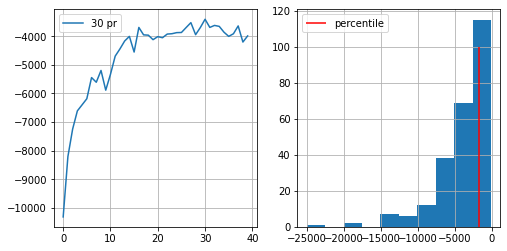

CPU times: user 30.5 s, sys: 196 ms, total: 30.7 s
Wall time: 30.6 s
0
CPU times: user 22.8 s, sys: 186 ms, total: 23 s
Wall time: 22.9 s
1
CPU times: user 19.3 s, sys: 180 ms, total: 19.5 s
Wall time: 19.4 s
2
CPU times: user 15.4 s, sys: 68.4 ms, total: 15.5 s
Wall time: 15.5 s
3
CPU times: user 13.1 s, sys: 159 ms, total: 13.3 s
Wall time: 13.2 s
4
CPU times: user 13.8 s, sys: 116 ms, total: 13.9 s
Wall time: 13.8 s
5
CPU times: user 10.8 s, sys: 61.9 ms, total: 10.9 s
Wall time: 10.8 s
6
CPU times: user 9.83 s, sys: 105 ms, total: 9.93 s
Wall time: 9.87 s
7
CPU times: user 8.99 s, sys: 90 ms, total: 9.08 s
Wall time: 9.02 s
8
CPU times: user 8.05 s, sys: 62.9 ms, total: 8.11 s
Wall time: 8.07 s
9
CPU times: user 8.41 s, sys: 143 ms, total: 8.56 s
Wall time: 8.47 s
10
CPU times: user 7.9 s, sys: 150 ms, total: 8.05 s
Wall time: 7.95 s
11
CPU times: user 7.11 s, sys: 150 ms, total: 7.26 s
Wall time: 7.17 s
12
CPU times: user 7.37 s, sys: 176 ms, total: 7.55 s
Wall time: 7.44 s
13
CPU

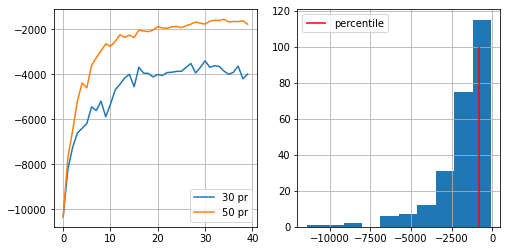

CPU times: user 27.9 s, sys: 211 ms, total: 28.1 s
Wall time: 28 s
0
CPU times: user 18.6 s, sys: 124 ms, total: 18.8 s
Wall time: 18.7 s
1
CPU times: user 13.5 s, sys: 123 ms, total: 13.7 s
Wall time: 13.6 s
2
CPU times: user 10.5 s, sys: 118 ms, total: 10.6 s
Wall time: 10.5 s
3
CPU times: user 9.37 s, sys: 88.4 ms, total: 9.46 s
Wall time: 9.62 s
4
CPU times: user 7.81 s, sys: 102 ms, total: 7.92 s
Wall time: 8.09 s
5
CPU times: user 6.51 s, sys: 46.4 ms, total: 6.55 s
Wall time: 6.56 s
6
CPU times: user 5.04 s, sys: 40.6 ms, total: 5.08 s
Wall time: 5.06 s
7
CPU times: user 4.53 s, sys: 160 ms, total: 4.69 s
Wall time: 4.58 s
8
CPU times: user 4.58 s, sys: 18.3 ms, total: 4.59 s
Wall time: 4.58 s
9
CPU times: user 4.31 s, sys: 138 ms, total: 4.45 s
Wall time: 4.36 s
10
CPU times: user 3.64 s, sys: 65.1 ms, total: 3.71 s
Wall time: 3.67 s
11
CPU times: user 3.73 s, sys: 64.6 ms, total: 3.79 s
Wall time: 3.76 s
12
CPU times: user 3.22 s, sys: 34.8 ms, total: 3.26 s
Wall time: 3.24 s


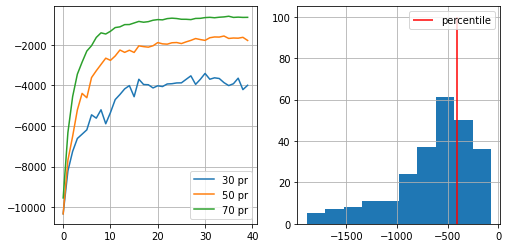

CPU times: user 27.4 s, sys: 284 ms, total: 27.7 s
Wall time: 27.5 s
0
CPU times: user 13.9 s, sys: 164 ms, total: 14.1 s
Wall time: 14 s
1
CPU times: user 8.41 s, sys: 61.8 ms, total: 8.48 s
Wall time: 8.47 s
2
CPU times: user 5.41 s, sys: 19.4 ms, total: 5.43 s
Wall time: 5.42 s
3
CPU times: user 4.4 s, sys: 119 ms, total: 4.52 s
Wall time: 4.45 s
4
CPU times: user 3.5 s, sys: 90.2 ms, total: 3.59 s
Wall time: 3.53 s
5
CPU times: user 3.5 s, sys: 96.9 ms, total: 3.6 s
Wall time: 3.63 s
6
CPU times: user 2.92 s, sys: 41.3 ms, total: 2.97 s
Wall time: 3.04 s
7
CPU times: user 2.92 s, sys: 42.3 ms, total: 2.96 s
Wall time: 3.03 s
8
CPU times: user 3.07 s, sys: 63.3 ms, total: 3.13 s
Wall time: 3.25 s
9
CPU times: user 2.44 s, sys: 33.5 ms, total: 2.47 s
Wall time: 2.49 s
10
CPU times: user 3.04 s, sys: 32.9 ms, total: 3.08 s
Wall time: 3.1 s
11
CPU times: user 2.71 s, sys: 51.3 ms, total: 2.76 s
Wall time: 2.79 s
12
CPU times: user 3.17 s, sys: 67.6 ms, total: 3.24 s
Wall time: 3.34 s
1

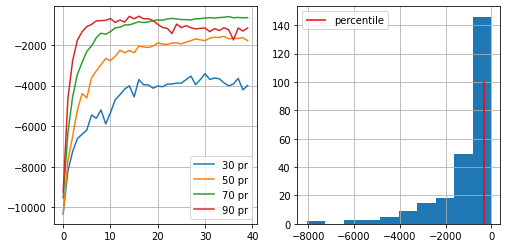

Formatted current time: 19:55:10


In [16]:
n_sessions = 250  #sample this many sessions
percentiles = [30,50,70,90]  #take this percent of session with highest rewards
learning_rate = 0.3  #add this thing to all counts for stability

log = []
mean = []
doPerc=True
for percentile1 in percentiles:
    if doPerc==False:
        break
    curMean = []
    policy = np.ones([n_states,n_actions])/n_actions
    randActionProb=0.5
    for i in range(stepCounter):

        %time sessions = [generate_session(policy) for _ in range(n_sessions)]
        
        print(i)

        states_batch,actions_batch,rewards_batch = zip(*sessions)

        elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=percentile1)

        #set new policy
        new_policy = update_policy(elite_states,elite_actions)
        
        #update policy
        policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy
        
        #add mean value
        curMean.append(np.mean(rewards_batch))
        
        #clear_output(True)
    mean.append(curMean)
    #display results on chart
    
    plt.figure(figsize=[8,4])
    plt.subplot(1,2,1)
    for i in range(len(mean)):
        plt.plot(mean[i],label=f'{percentiles[i]} pr')
    plt.legend()
    plt.grid()
    
    plt.subplot(1,2,2)
    plt.hist(rewards_batch);
    plt.vlines([np.percentile(rewards_batch,percentile)],[0],[100],label="percentile",color='red')
    plt.legend()
    plt.grid()

    plt.show()
    #show_progress(rewards_batch,log)
    

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


# How do different percentiles affect training efficiency?

In [17]:
# 70% is the best

CPU times: user 2.78 s, sys: 36.8 ms, total: 2.82 s
Wall time: 2.8 s
CPU times: user 2.18 s, sys: 53.2 ms, total: 2.24 s
Wall time: 2.2 s
CPU times: user 1.96 s, sys: 63.1 ms, total: 2.02 s
Wall time: 1.98 s
CPU times: user 1.12 s, sys: 110 ms, total: 1.23 s
Wall time: 1.16 s
CPU times: user 712 ms, sys: 25.4 ms, total: 737 ms
Wall time: 721 ms
CPU times: user 991 ms, sys: 68.4 ms, total: 1.06 s
Wall time: 1.01 s
CPU times: user 497 ms, sys: 58.2 ms, total: 555 ms
Wall time: 517 ms
CPU times: user 790 ms, sys: 65.6 ms, total: 855 ms
Wall time: 813 ms
CPU times: user 571 ms, sys: 62.1 ms, total: 633 ms
Wall time: 591 ms
CPU times: user 448 ms, sys: 36.8 ms, total: 485 ms
Wall time: 460 ms
CPU times: user 745 ms, sys: 96.3 ms, total: 841 ms
Wall time: 777 ms
CPU times: user 895 ms, sys: 27.8 ms, total: 923 ms
Wall time: 904 ms
CPU times: user 848 ms, sys: 49.6 ms, total: 898 ms
Wall time: 865 ms
CPU times: user 765 ms, sys: 59.4 ms, total: 824 ms
Wall time: 784 ms
CPU times: user 619 ms,

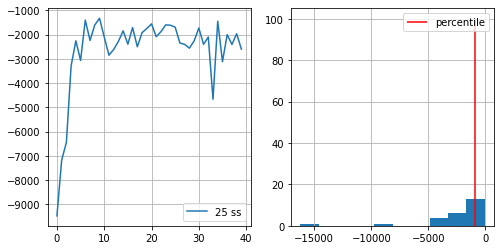

CPU times: user 5.36 s, sys: 91.4 ms, total: 5.46 s
Wall time: 5.4 s
CPU times: user 3.89 s, sys: 36.6 ms, total: 3.92 s
Wall time: 3.9 s
CPU times: user 3.48 s, sys: 82.7 ms, total: 3.56 s
Wall time: 3.51 s
CPU times: user 2.34 s, sys: 106 ms, total: 2.45 s
Wall time: 2.38 s
CPU times: user 1.96 s, sys: 92.2 ms, total: 2.05 s
Wall time: 1.99 s
CPU times: user 1.95 s, sys: 25.9 ms, total: 1.97 s
Wall time: 2.06 s
CPU times: user 1.49 s, sys: 22.2 ms, total: 1.51 s
Wall time: 1.57 s
CPU times: user 1.26 s, sys: 151 ms, total: 1.41 s
Wall time: 1.31 s
CPU times: user 1.15 s, sys: 82.1 ms, total: 1.23 s
Wall time: 1.18 s
CPU times: user 1.08 s, sys: 30.9 ms, total: 1.11 s
Wall time: 1.09 s
CPU times: user 1.2 s, sys: 23.5 ms, total: 1.22 s
Wall time: 1.22 s
CPU times: user 985 ms, sys: 21.6 ms, total: 1.01 s
Wall time: 993 ms
CPU times: user 1.37 s, sys: 43 ms, total: 1.41 s
Wall time: 1.38 s
CPU times: user 1.49 s, sys: 102 ms, total: 1.59 s
Wall time: 1.52 s
CPU times: user 1.06 s, sys:

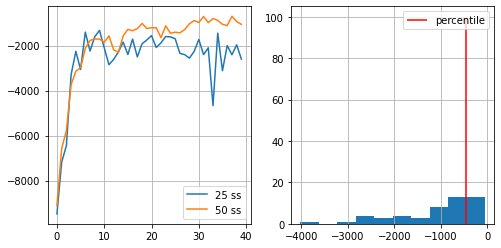

CPU times: user 10.3 s, sys: 74.6 ms, total: 10.4 s
Wall time: 10.4 s
CPU times: user 7.44 s, sys: 152 ms, total: 7.6 s
Wall time: 7.5 s
CPU times: user 4.76 s, sys: 66.9 ms, total: 4.83 s
Wall time: 4.78 s
CPU times: user 3.1 s, sys: 58.4 ms, total: 3.16 s
Wall time: 3.15 s
CPU times: user 2.61 s, sys: 53.4 ms, total: 2.67 s
Wall time: 2.63 s
CPU times: user 2.14 s, sys: 93.4 ms, total: 2.23 s
Wall time: 2.17 s
CPU times: user 1.85 s, sys: 69.1 ms, total: 1.92 s
Wall time: 1.87 s
CPU times: user 1.74 s, sys: 83 ms, total: 1.82 s
Wall time: 1.77 s
CPU times: user 1.48 s, sys: 51.7 ms, total: 1.53 s
Wall time: 1.49 s
CPU times: user 1.39 s, sys: 74.2 ms, total: 1.47 s
Wall time: 1.42 s
CPU times: user 1.27 s, sys: 15.1 ms, total: 1.29 s
Wall time: 1.28 s
CPU times: user 1.36 s, sys: 84.9 ms, total: 1.45 s
Wall time: 1.39 s
CPU times: user 1.21 s, sys: 65 ms, total: 1.27 s
Wall time: 1.23 s
CPU times: user 1.22 s, sys: 110 ms, total: 1.33 s
Wall time: 1.25 s
CPU times: user 1.23 s, sys: 

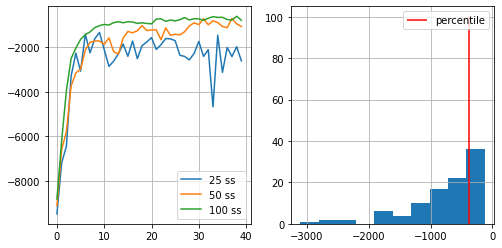

CPU times: user 15 s, sys: 118 ms, total: 15.2 s
Wall time: 15.1 s
CPU times: user 11.5 s, sys: 159 ms, total: 11.6 s
Wall time: 11.5 s
CPU times: user 7.11 s, sys: 115 ms, total: 7.23 s
Wall time: 7.16 s
CPU times: user 5.69 s, sys: 111 ms, total: 5.8 s
Wall time: 5.73 s
CPU times: user 4.13 s, sys: 27.7 ms, total: 4.16 s
Wall time: 4.15 s
CPU times: user 3.57 s, sys: 71.8 ms, total: 3.64 s
Wall time: 3.6 s
CPU times: user 3.09 s, sys: 66.4 ms, total: 3.16 s
Wall time: 3.11 s
CPU times: user 2.69 s, sys: 132 ms, total: 2.82 s
Wall time: 2.73 s
CPU times: user 2.52 s, sys: 58 ms, total: 2.58 s
Wall time: 2.54 s
CPU times: user 2.41 s, sys: 94.9 ms, total: 2.51 s
Wall time: 2.44 s
CPU times: user 2.07 s, sys: 29 ms, total: 2.1 s
Wall time: 2.09 s
CPU times: user 2.02 s, sys: 35.2 ms, total: 2.05 s
Wall time: 2.1 s
CPU times: user 2.15 s, sys: 152 ms, total: 2.3 s
Wall time: 2.2 s
CPU times: user 1.77 s, sys: 90.8 ms, total: 1.86 s
Wall time: 1.8 s
CPU times: user 1.74 s, sys: 90.6 ms, t

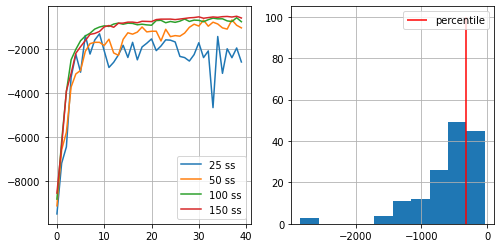

CPU times: user 22.5 s, sys: 213 ms, total: 22.7 s
Wall time: 22.6 s
CPU times: user 13.5 s, sys: 147 ms, total: 13.7 s
Wall time: 13.6 s
CPU times: user 10.9 s, sys: 116 ms, total: 11 s
Wall time: 11 s
CPU times: user 8.04 s, sys: 67.2 ms, total: 8.11 s
Wall time: 8.07 s
CPU times: user 6.38 s, sys: 93.2 ms, total: 6.47 s
Wall time: 6.42 s
CPU times: user 5.07 s, sys: 106 ms, total: 5.18 s
Wall time: 5.1 s
CPU times: user 4.13 s, sys: 105 ms, total: 4.24 s
Wall time: 4.17 s
CPU times: user 3.67 s, sys: 78.2 ms, total: 3.75 s
Wall time: 3.7 s
CPU times: user 3.31 s, sys: 51.4 ms, total: 3.36 s
Wall time: 3.33 s
CPU times: user 3.19 s, sys: 117 ms, total: 3.31 s
Wall time: 3.23 s
CPU times: user 2.85 s, sys: 37.4 ms, total: 2.89 s
Wall time: 2.86 s
CPU times: user 2.43 s, sys: 60.4 ms, total: 2.49 s
Wall time: 2.45 s
CPU times: user 2.21 s, sys: 47 ms, total: 2.26 s
Wall time: 2.23 s
CPU times: user 2.08 s, sys: 11.6 ms, total: 2.09 s
Wall time: 2.11 s
CPU times: user 2.19 s, sys: 88.5 

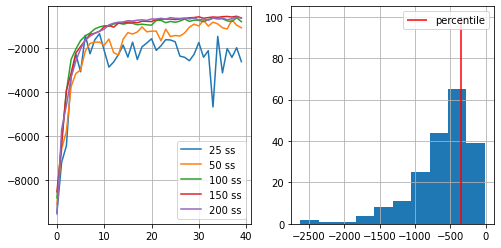

Formatted current time: 20:01:52


In [18]:
n_sessions_ar = [25,50,100,150,200]  #sample this many sessions
perc = 70  #take this percent of session with highest rewards
learning_rate = 0.3  #add this thing to all counts for stability

log = []
mean = []
doNss=True
for n_sessions in n_sessions_ar:
    if doNss==False:
        break
    curMean = []
    policy = np.ones([n_states,n_actions])/n_actions
    randActionProb=0.5
    for i in range(stepCounter):

        %time sessions = [generate_session(policy) for _ in range(n_sessions)]

        states_batch,actions_batch,rewards_batch = zip(*sessions)

        elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=perc)
            

    

        #set new policy
        new_policy = update_policy(elite_states,elite_actions)
        
        #update policy
        policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy
        
        #add mean value
        curMean.append(np.mean(rewards_batch))
        
        #clear_output(True)
    mean.append(curMean)
    #display results on chart
    
    plt.figure(figsize=[8,4])
    plt.subplot(1,2,1)
    for i in range(len(mean)):
        plt.plot(mean[i],label=f'{n_sessions_ar[i]} ss')
    plt.legend()
    plt.grid()
    
    plt.subplot(1,2,2)
    plt.hist(rewards_batch);
    plt.vlines([np.percentile(rewards_batch,percentile)],[0],[100],label="percentile",color='red')
    plt.legend()
    plt.grid()

    plt.show()
    
    #show_progress(rewards_batch,log)
    
    

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


In [19]:
# after n=100 training doesn't change

# Stabilize positive rewards by averaging policy across 10 games (2 pts)

In [20]:
import io
import random
#fig, ax = plt.subplots(figsize=(6, 6))

drawTaxi=False
randActionProb=0.5

numOfGames=10

def generate_session(policy,t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states,actions = [],[]
    total_reward = 0.
    
    
    arr=np.array(list(range(n_actions)))
    for games in range(numOfGames):
        s = env.reset()[0]
        for t in range(t_max):
            if drawTaxi == True:
                clear_output(wait=True)
                plt.imshow(env.render())
                plt.axis('off') # Hide axes for cleaner display
                plt.show()

            a=0

            if random.random()<1-randActionProb:
                a = np.random.choice(arr, p = policy[s])
            else:
                a=random.randint(0,n_actions-1)

            new_s,r,done,tr,info = env.step(a)

            #print(new_s)

            #Record state, action and add up reward to states,actions and total_reward accordingly. 
            #add state
            states.append(s)

            #add action
            actions.append(a)

            #add reward
            total_reward+=r

            s = new_s


            if done:
                break
    return states,actions,total_reward/numOfGames
        
    
    

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


Formatted current time: 20:01:52


0
CPU times: user 1min 25s, sys: 489 ms, total: 1min 25s
Wall time: 1min 25s
mean reward = -9618.908, threshold=-7921.360


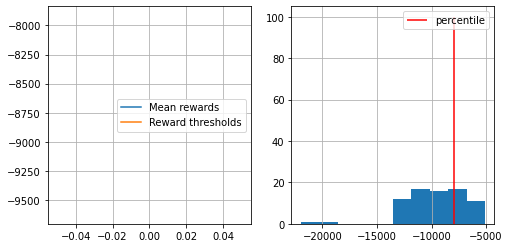

1
CPU times: user 1min 15s, sys: 714 ms, total: 1min 15s
Wall time: 1min 15s
mean reward = -8248.408, threshold=-6701.140


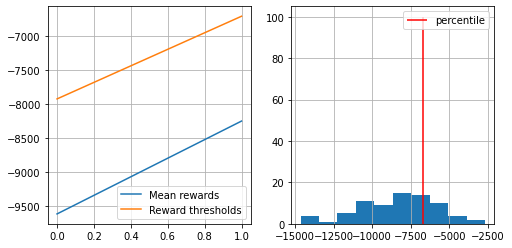

2
CPU times: user 1min 18s, sys: 708 ms, total: 1min 19s
Wall time: 1min 19s
mean reward = -8355.264, threshold=-6805.520


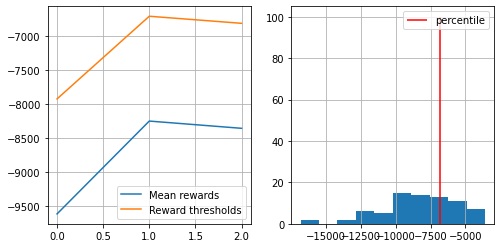

3
CPU times: user 1min 17s, sys: 790 ms, total: 1min 18s
Wall time: 1min 19s
mean reward = -7682.889, threshold=-6806.700


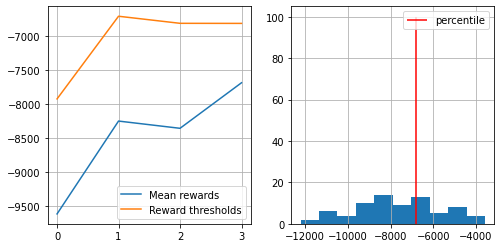

4
CPU times: user 1min 14s, sys: 853 ms, total: 1min 15s
Wall time: 1min 22s
mean reward = -7057.737, threshold=-5857.420


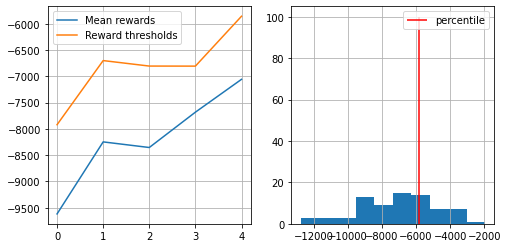

5
CPU times: user 1min 4s, sys: 505 ms, total: 1min 5s
Wall time: 1min 6s
mean reward = -6258.969, threshold=-5434.040


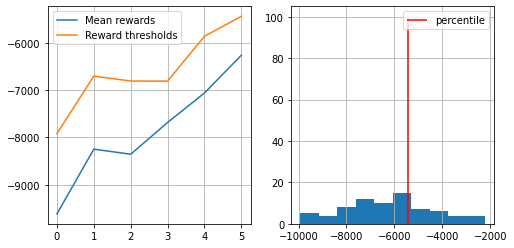

6
CPU times: user 1min 3s, sys: 418 ms, total: 1min 3s
Wall time: 1min 3s
mean reward = -6357.367, threshold=-5169.860


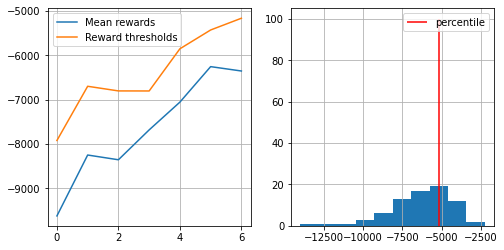

7
CPU times: user 1min 4s, sys: 536 ms, total: 1min 5s
Wall time: 1min 6s
mean reward = -6164.524, threshold=-5137.080


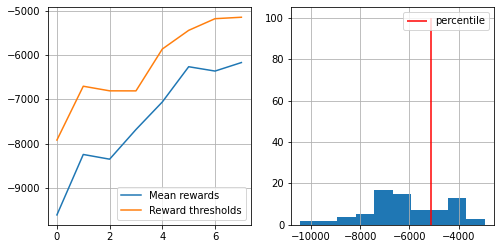

8
CPU times: user 57 s, sys: 464 ms, total: 57.4 s
Wall time: 58 s
mean reward = -5445.937, threshold=-4549.580


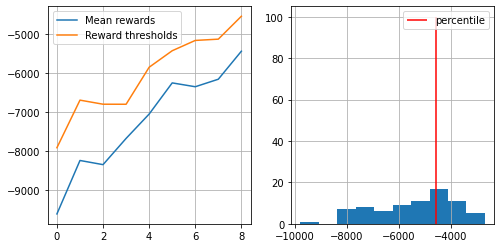

9
CPU times: user 59.4 s, sys: 504 ms, total: 59.9 s
Wall time: 1min 2s
mean reward = -5535.712, threshold=-4554.180


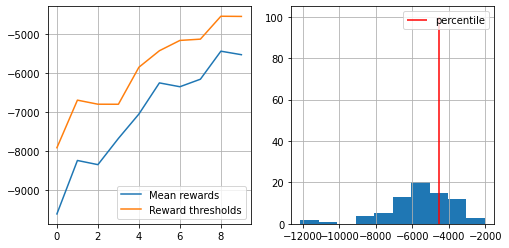

10
CPU times: user 55.4 s, sys: 456 ms, total: 55.8 s
Wall time: 58.9 s
mean reward = -5007.025, threshold=-4126.220


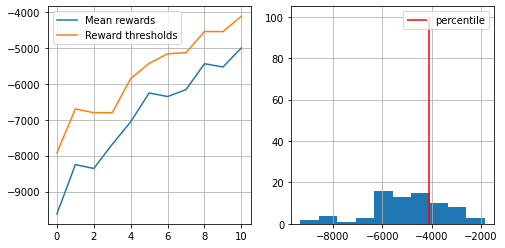

11
CPU times: user 53.8 s, sys: 581 ms, total: 54.4 s
Wall time: 55.2 s
mean reward = -4873.496, threshold=-3900.580


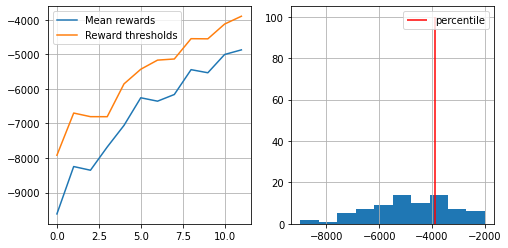

12
CPU times: user 51.4 s, sys: 525 ms, total: 52 s
Wall time: 53.7 s
mean reward = -4424.631, threshold=-3616.160


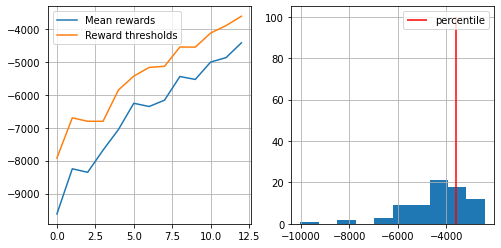

13
CPU times: user 49.2 s, sys: 515 ms, total: 49.7 s
Wall time: 52.4 s
mean reward = -4155.597, threshold=-3235.680


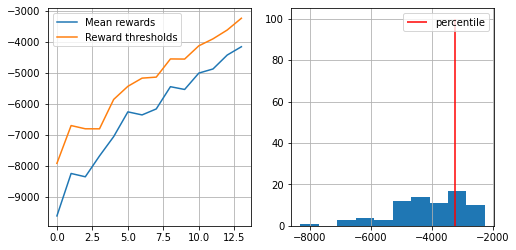

14
CPU times: user 46.9 s, sys: 479 ms, total: 47.4 s
Wall time: 49.2 s
mean reward = -3992.004, threshold=-3330.600


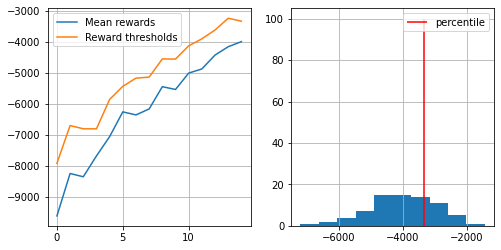

15
CPU times: user 49 s, sys: 655 ms, total: 49.6 s
Wall time: 52.4 s
mean reward = -3800.585, threshold=-3124.260


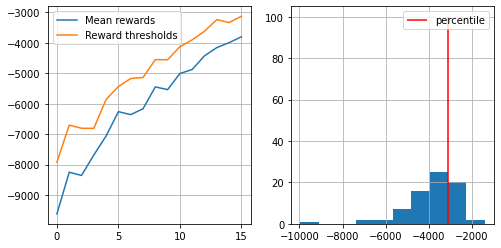

16
CPU times: user 44.4 s, sys: 471 ms, total: 44.8 s
Wall time: 46.4 s
mean reward = -3584.811, threshold=-3046.900


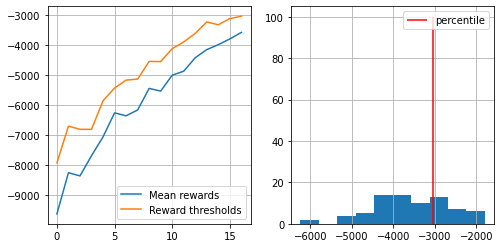

17
CPU times: user 43.1 s, sys: 591 ms, total: 43.7 s
Wall time: 47.4 s
mean reward = -3329.752, threshold=-2648.300


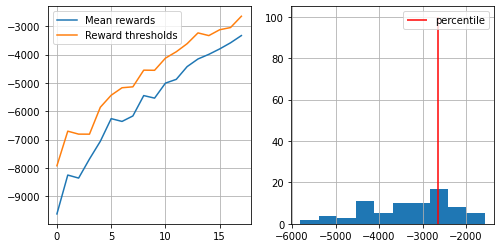

18
CPU times: user 38.7 s, sys: 379 ms, total: 39.1 s
Wall time: 40.2 s
mean reward = -3225.544, threshold=-2612.940


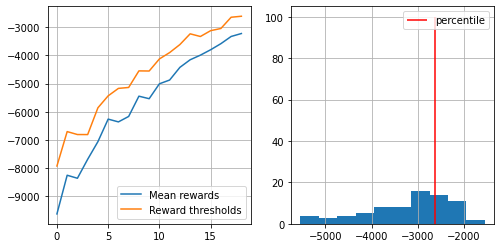

19
CPU times: user 39.1 s, sys: 460 ms, total: 39.6 s
Wall time: 41.7 s
mean reward = -3060.737, threshold=-2566.160


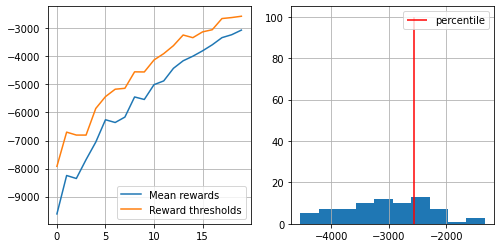

20
CPU times: user 35.3 s, sys: 408 ms, total: 35.7 s
Wall time: 36.9 s
mean reward = -2787.701, threshold=-2336.740


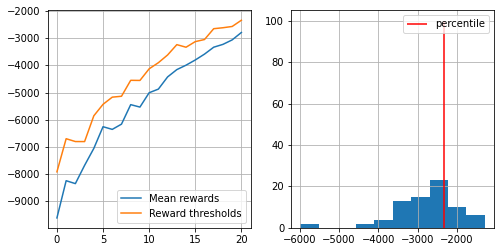

21
CPU times: user 37.4 s, sys: 688 ms, total: 38.1 s
Wall time: 44.5 s
mean reward = -2491.260, threshold=-2126.020


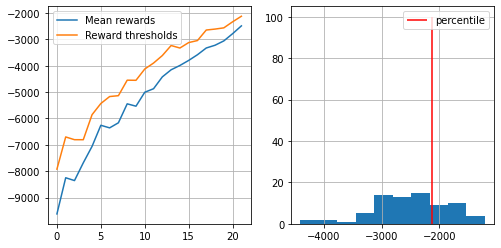

22
CPU times: user 35.3 s, sys: 621 ms, total: 35.9 s
Wall time: 42.5 s
mean reward = -2422.407, threshold=-1976.220


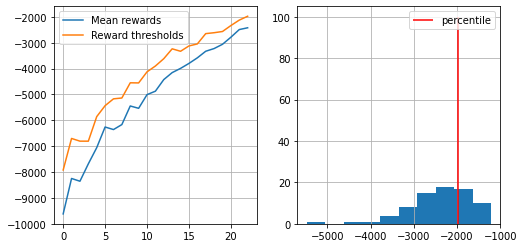

23
CPU times: user 29.5 s, sys: 320 ms, total: 29.8 s
Wall time: 30.7 s
mean reward = -2325.081, threshold=-1973.740


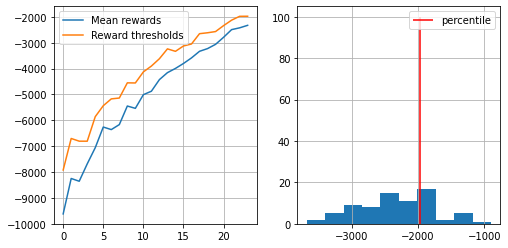

24
CPU times: user 27.9 s, sys: 264 ms, total: 28.2 s
Wall time: 29.1 s
mean reward = -2196.523, threshold=-1909.440


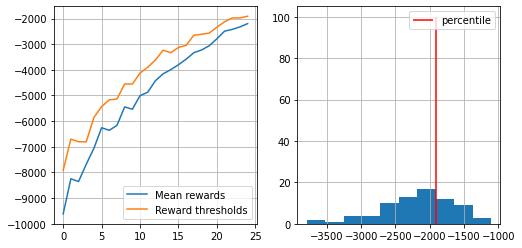

25
CPU times: user 25.1 s, sys: 102 ms, total: 25.2 s
Wall time: 25.2 s
mean reward = -2180.443, threshold=-1883.340


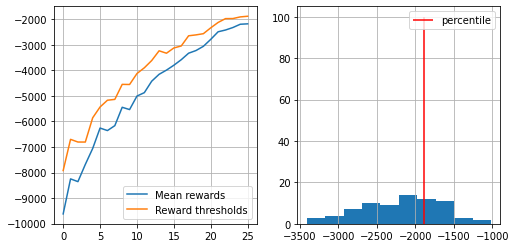

26
CPU times: user 22.8 s, sys: 208 ms, total: 23 s
Wall time: 22.9 s
mean reward = -1951.375, threshold=-1632.460


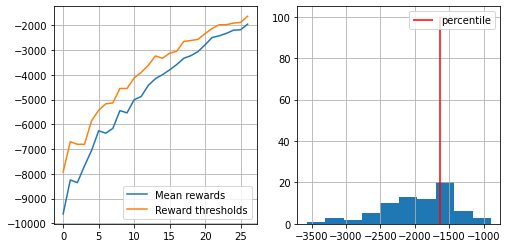

27
CPU times: user 23.6 s, sys: 202 ms, total: 23.8 s
Wall time: 24 s
mean reward = -1955.747, threshold=-1704.100


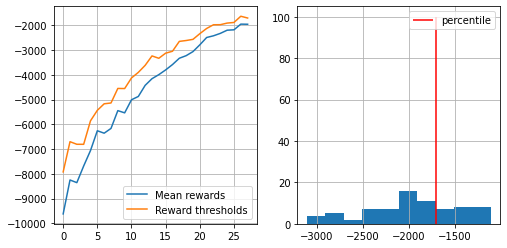

28
CPU times: user 20 s, sys: 98.1 ms, total: 20.1 s
Wall time: 20 s
mean reward = -1710.619, threshold=-1465.940


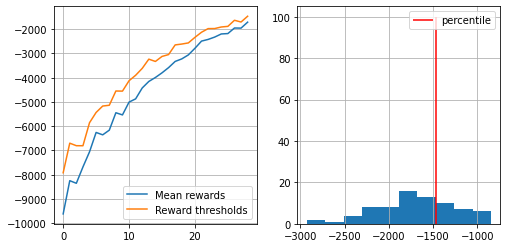

29
CPU times: user 22.2 s, sys: 361 ms, total: 22.5 s
Wall time: 23.1 s
mean reward = -1675.936, threshold=-1487.140


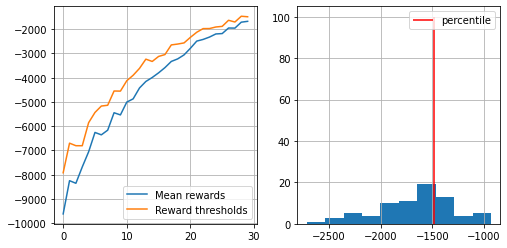

30
CPU times: user 19.5 s, sys: 152 ms, total: 19.7 s
Wall time: 20 s
mean reward = -1530.944, threshold=-1323.140


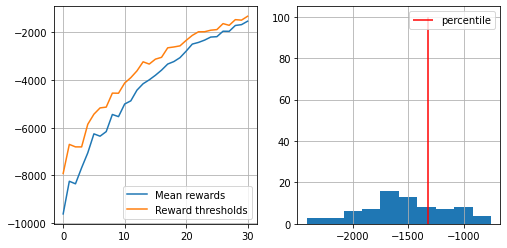

31
CPU times: user 18.9 s, sys: 198 ms, total: 19.1 s
Wall time: 19.6 s
mean reward = -1426.447, threshold=-1255.120


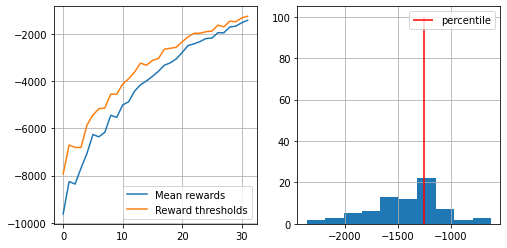

32
CPU times: user 17.5 s, sys: 170 ms, total: 17.7 s
Wall time: 18.1 s
mean reward = -1325.479, threshold=-1141.740


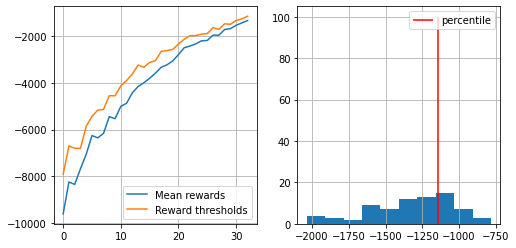

33
CPU times: user 16.2 s, sys: 124 ms, total: 16.4 s
Wall time: 16.5 s
mean reward = -1261.561, threshold=-1113.280


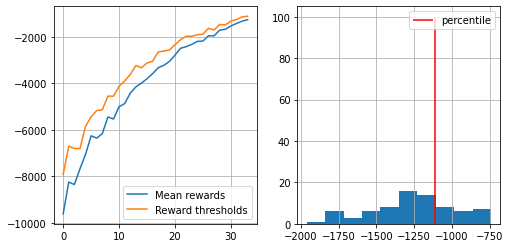

34
CPU times: user 14.7 s, sys: 227 ms, total: 14.9 s
Wall time: 14.7 s
mean reward = -1196.732, threshold=-1044.560


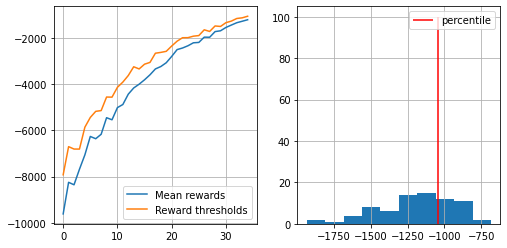

35
CPU times: user 13.7 s, sys: 112 ms, total: 13.8 s
Wall time: 13.8 s
mean reward = -1115.193, threshold=-965.900


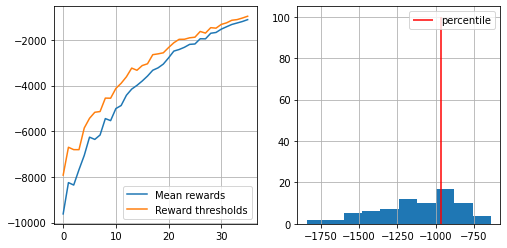

36
CPU times: user 13.2 s, sys: 190 ms, total: 13.4 s
Wall time: 13.4 s
mean reward = -1048.865, threshold=-915.420


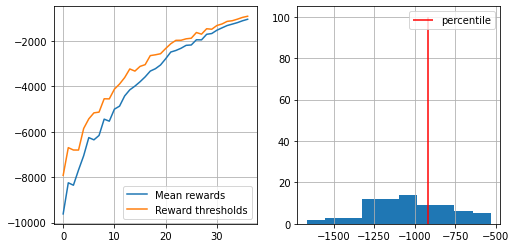

37
CPU times: user 11.5 s, sys: 118 ms, total: 11.6 s
Wall time: 11.5 s
mean reward = -921.181, threshold=-806.600


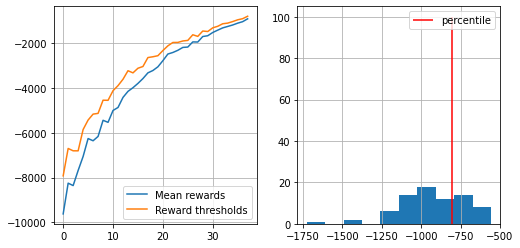

38
CPU times: user 10.8 s, sys: 83.6 ms, total: 10.9 s
Wall time: 10.8 s
mean reward = -857.809, threshold=-725.320


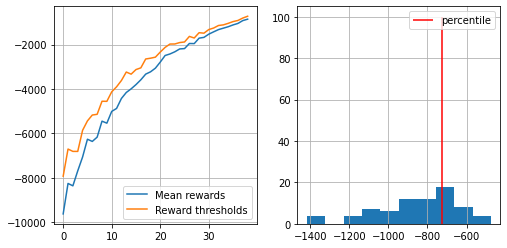

39
CPU times: user 10.2 s, sys: 131 ms, total: 10.3 s
Wall time: 10.2 s
mean reward = -805.265, threshold=-690.000


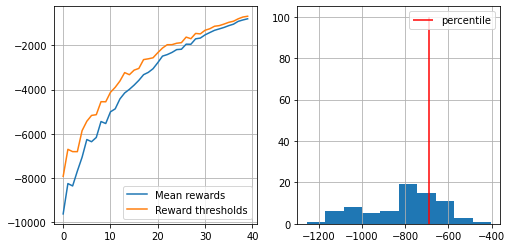

40
CPU times: user 10.5 s, sys: 85.2 ms, total: 10.6 s
Wall time: 10.5 s
mean reward = -779.708, threshold=-693.240


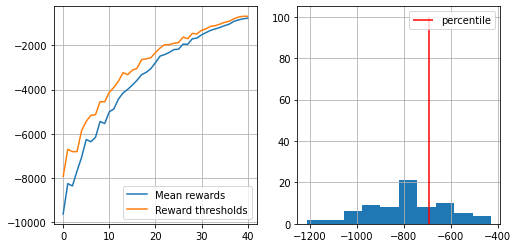

41
CPU times: user 9.59 s, sys: 83.9 ms, total: 9.67 s
Wall time: 9.77 s
mean reward = -709.792, threshold=-626.920


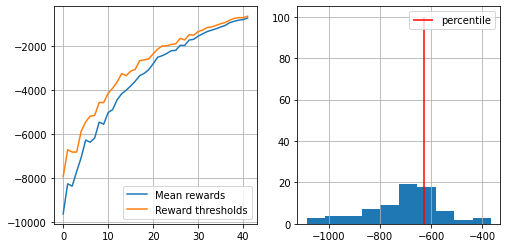

42
CPU times: user 8.77 s, sys: 135 ms, total: 8.9 s
Wall time: 8.82 s
mean reward = -672.424, threshold=-582.560


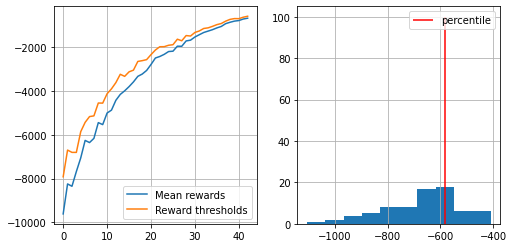

43
CPU times: user 7.81 s, sys: 76.3 ms, total: 7.89 s
Wall time: 7.85 s
mean reward = -603.103, threshold=-541.680


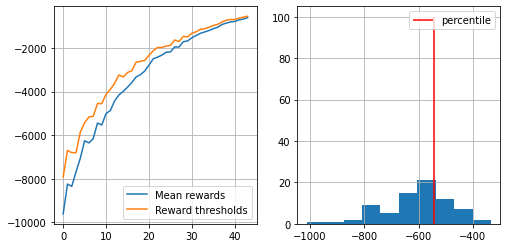

44
CPU times: user 7.58 s, sys: 23.5 ms, total: 7.6 s
Wall time: 7.6 s
mean reward = -584.284, threshold=-514.760


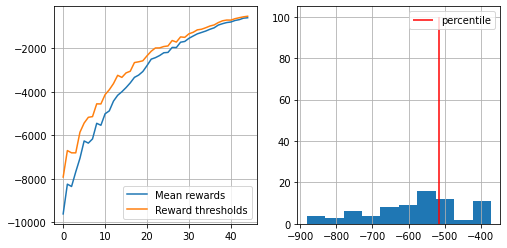

45
CPU times: user 6.92 s, sys: 99.4 ms, total: 7.02 s
Wall time: 6.96 s
mean reward = -520.559, threshold=-470.620


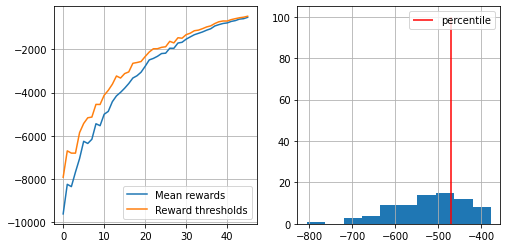

46
CPU times: user 6.69 s, sys: 137 ms, total: 6.83 s
Wall time: 6.74 s
mean reward = -493.215, threshold=-432.600


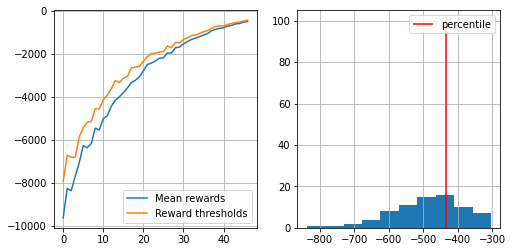

47
CPU times: user 6.08 s, sys: 67.1 ms, total: 6.15 s
Wall time: 6.11 s
mean reward = -449.925, threshold=-395.900


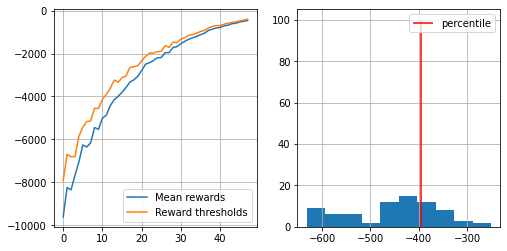

48
CPU times: user 6.18 s, sys: 95.9 ms, total: 6.28 s
Wall time: 6.22 s
mean reward = -442.396, threshold=-399.240


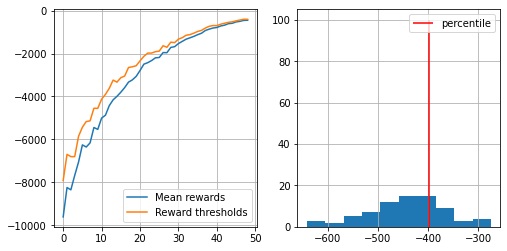

49
CPU times: user 5.85 s, sys: 97.3 ms, total: 5.95 s
Wall time: 5.9 s
mean reward = -419.911, threshold=-375.920


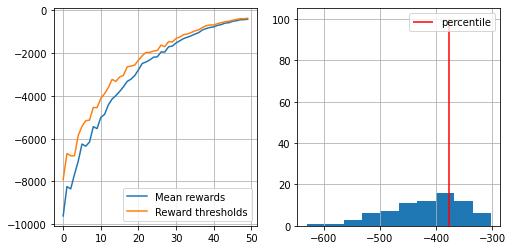

50
CPU times: user 5.64 s, sys: 158 ms, total: 5.79 s
Wall time: 5.7 s
mean reward = -397.061, threshold=-356.900


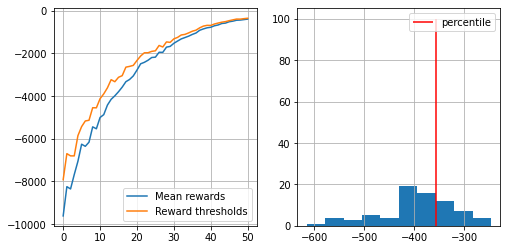

51
CPU times: user 5.2 s, sys: 112 ms, total: 5.31 s
Wall time: 5.24 s
mean reward = -364.445, threshold=-323.860


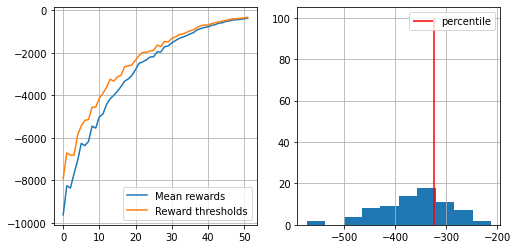

52
CPU times: user 5.05 s, sys: 79.1 ms, total: 5.13 s
Wall time: 5.09 s
mean reward = -350.788, threshold=-308.240


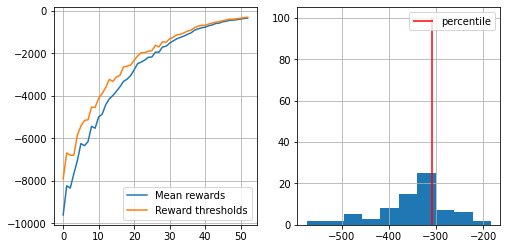

53
CPU times: user 4.81 s, sys: 58.9 ms, total: 4.87 s
Wall time: 4.84 s
mean reward = -326.717, threshold=-282.620


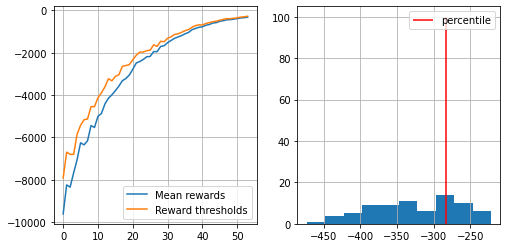

54
CPU times: user 4.45 s, sys: 33.3 ms, total: 4.48 s
Wall time: 4.47 s
mean reward = -299.583, threshold=-261.440


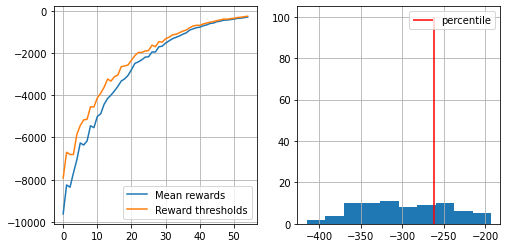

55
CPU times: user 4.32 s, sys: 72.9 ms, total: 4.4 s
Wall time: 4.35 s
mean reward = -287.527, threshold=-253.440


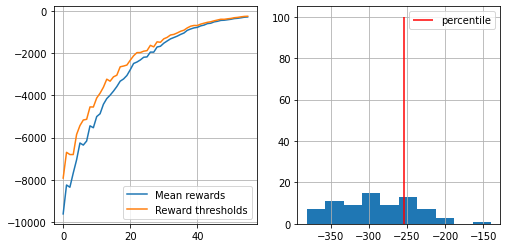

56
CPU times: user 4.02 s, sys: 41.4 ms, total: 4.06 s
Wall time: 4.04 s
mean reward = -265.233, threshold=-235.400


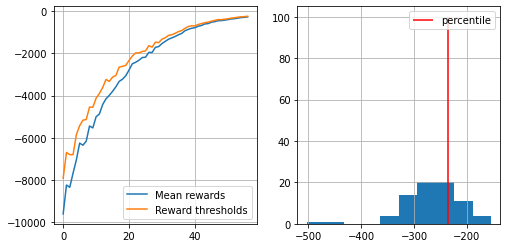

57
CPU times: user 3.94 s, sys: 109 ms, total: 4.05 s
Wall time: 3.98 s
mean reward = -250.748, threshold=-234.820


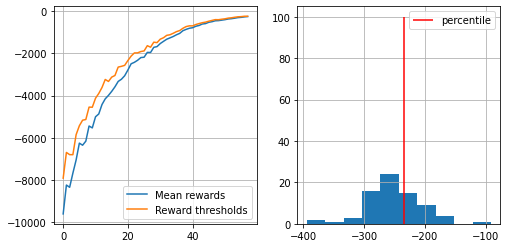

58
CPU times: user 3.68 s, sys: 59.6 ms, total: 3.74 s
Wall time: 3.71 s
mean reward = -226.632, threshold=-206.200


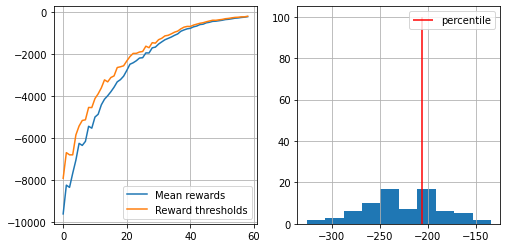

59
CPU times: user 3.45 s, sys: 58.4 ms, total: 3.51 s
Wall time: 3.47 s
mean reward = -209.903, threshold=-186.160


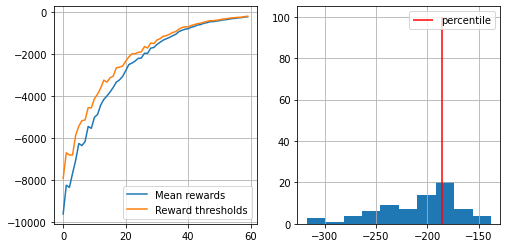

60
CPU times: user 3.47 s, sys: 60.9 ms, total: 3.53 s
Wall time: 3.49 s
mean reward = -202.752, threshold=-178.200


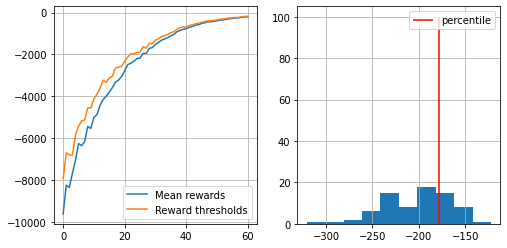

61
CPU times: user 3.14 s, sys: 91.6 ms, total: 3.23 s
Wall time: 3.17 s
mean reward = -184.168, threshold=-161.340


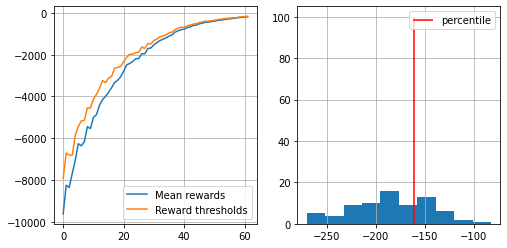

62
CPU times: user 2.9 s, sys: 70.3 ms, total: 2.97 s
Wall time: 2.93 s
mean reward = -164.435, threshold=-152.760


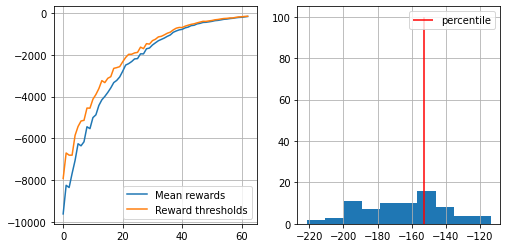

63
CPU times: user 2.79 s, sys: 42.3 ms, total: 2.83 s
Wall time: 2.81 s
mean reward = -156.239, threshold=-141.300


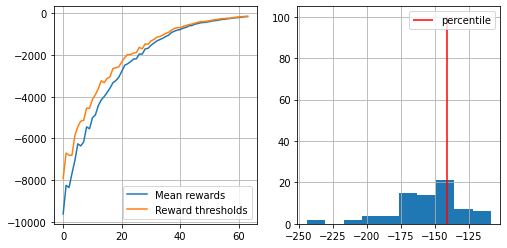

64
CPU times: user 2.83 s, sys: 111 ms, total: 2.94 s
Wall time: 2.87 s
mean reward = -150.215, threshold=-136.220


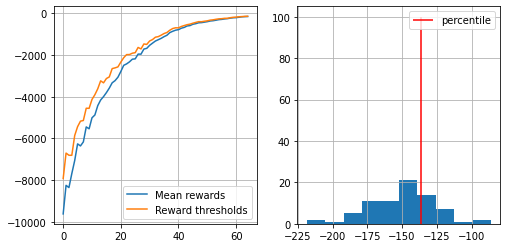

65
CPU times: user 2.7 s, sys: 78.3 ms, total: 2.78 s
Wall time: 2.74 s
mean reward = -144.613, threshold=-128.880


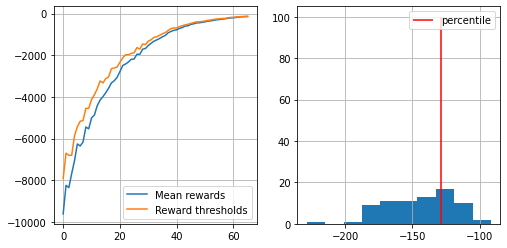

66
CPU times: user 2.62 s, sys: 127 ms, total: 2.75 s
Wall time: 2.67 s
mean reward = -133.649, threshold=-122.820


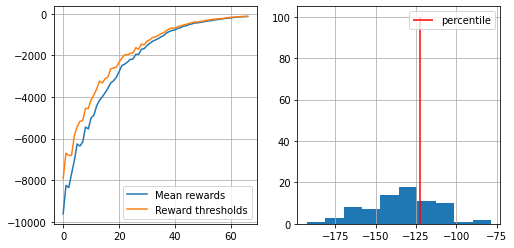

67
CPU times: user 2.75 s, sys: 76.7 ms, total: 2.83 s
Wall time: 2.91 s
mean reward = -128.431, threshold=-115.580


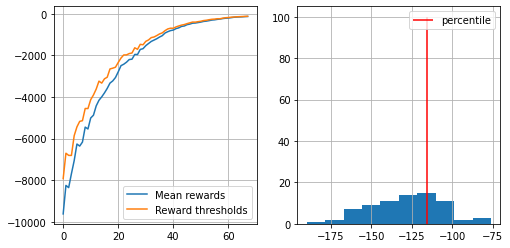

68
CPU times: user 2.94 s, sys: 50.9 ms, total: 2.99 s
Wall time: 3.14 s
mean reward = -118.981, threshold=-104.420


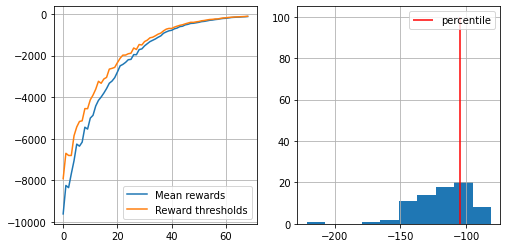

69
CPU times: user 2.52 s, sys: 40.9 ms, total: 2.56 s
Wall time: 2.59 s
mean reward = -112.213, threshold=-97.420


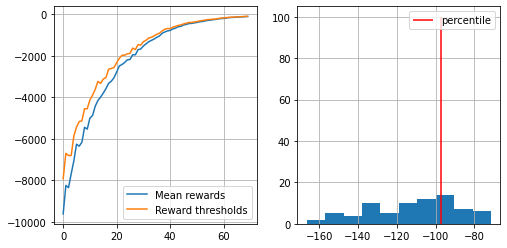

70
CPU times: user 2.36 s, sys: 33.5 ms, total: 2.39 s
Wall time: 2.41 s
mean reward = -99.401, threshold=-89.780


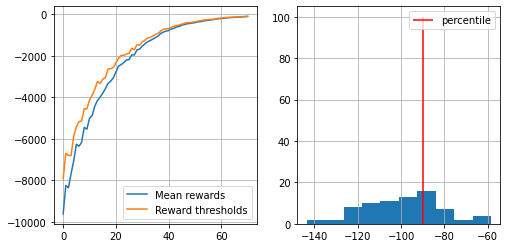

71
CPU times: user 2.35 s, sys: 66.2 ms, total: 2.41 s
Wall time: 2.48 s
mean reward = -95.345, threshold=-86.600


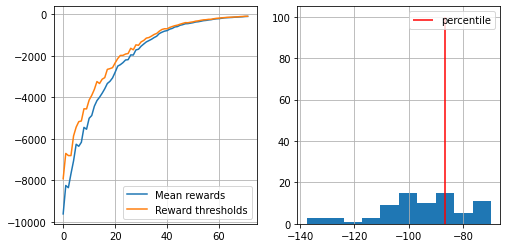

72
CPU times: user 2.18 s, sys: 23.7 ms, total: 2.2 s
Wall time: 2.24 s
mean reward = -86.305, threshold=-74.440


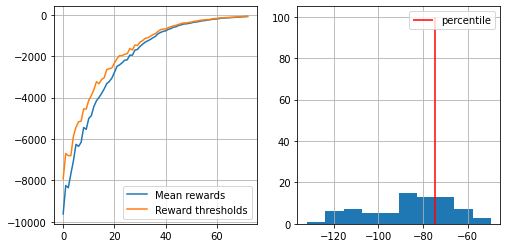

73
CPU times: user 2.18 s, sys: 42.2 ms, total: 2.22 s
Wall time: 2.28 s
mean reward = -82.816, threshold=-75.480


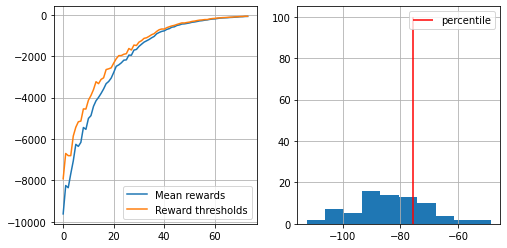

74
CPU times: user 2.14 s, sys: 31.6 ms, total: 2.17 s
Wall time: 2.22 s
mean reward = -80.025, threshold=-73.580


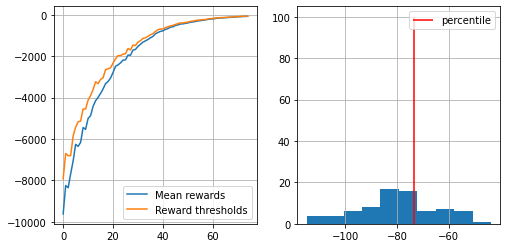

75
CPU times: user 2.07 s, sys: 33.5 ms, total: 2.11 s
Wall time: 2.16 s
mean reward = -74.591, threshold=-66.420


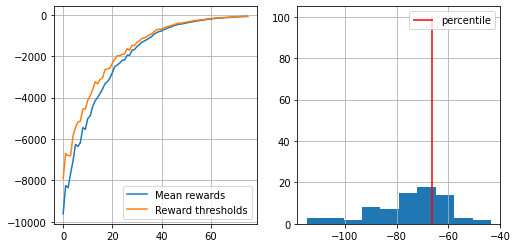

76
CPU times: user 2.11 s, sys: 35.1 ms, total: 2.15 s
Wall time: 2.27 s
mean reward = -67.607, threshold=-59.880


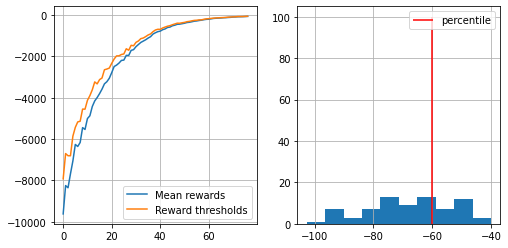

77
CPU times: user 2.15 s, sys: 44.5 ms, total: 2.2 s
Wall time: 2.28 s
mean reward = -64.995, threshold=-57.020


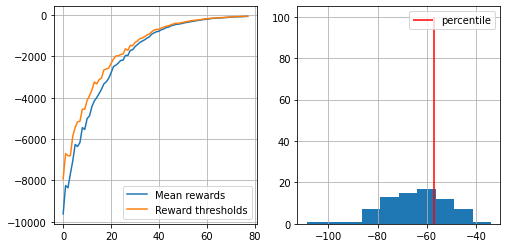

78
CPU times: user 1.89 s, sys: 32.2 ms, total: 1.93 s
Wall time: 1.99 s
mean reward = -56.628, threshold=-49.220


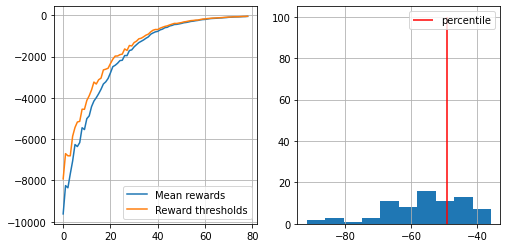

79
CPU times: user 2 s, sys: 43.6 ms, total: 2.04 s
Wall time: 2.08 s
mean reward = -55.011, threshold=-50.320


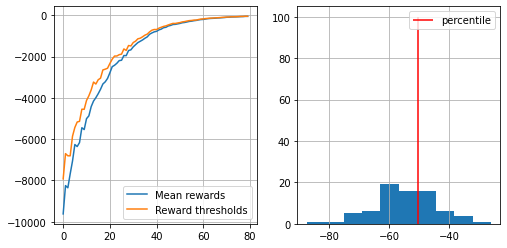

80
CPU times: user 1.99 s, sys: 36.2 ms, total: 2.02 s
Wall time: 2.11 s
mean reward = -52.527, threshold=-46.480


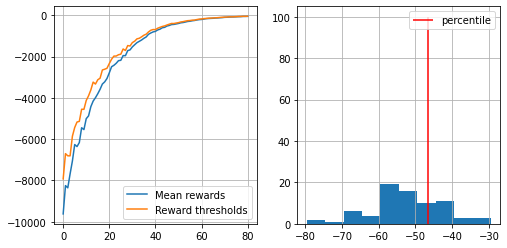

81
CPU times: user 1.73 s, sys: 30.7 ms, total: 1.77 s
Wall time: 1.85 s
mean reward = -50.093, threshold=-45.460


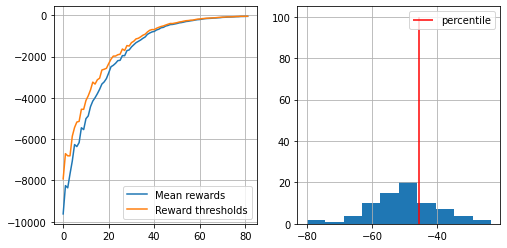

82
CPU times: user 1.68 s, sys: 32.6 ms, total: 1.71 s
Wall time: 1.76 s
mean reward = -45.673, threshold=-41.580


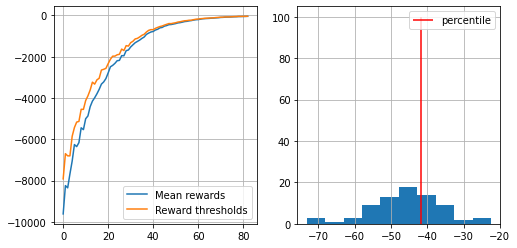

83
CPU times: user 1.62 s, sys: 30.5 ms, total: 1.65 s
Wall time: 1.7 s
mean reward = -42.452, threshold=-37.300


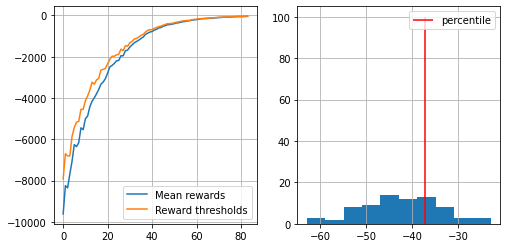

84
CPU times: user 1.62 s, sys: 30.4 ms, total: 1.65 s
Wall time: 1.72 s
mean reward = -40.881, threshold=-37.320


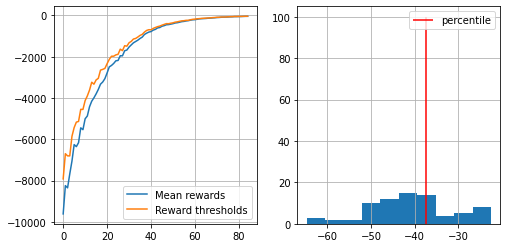

85
CPU times: user 1.55 s, sys: 31.4 ms, total: 1.58 s
Wall time: 1.6 s
mean reward = -37.777, threshold=-32.640


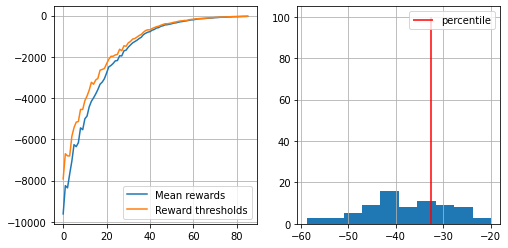

86
CPU times: user 1.44 s, sys: 28.2 ms, total: 1.46 s
Wall time: 1.47 s
mean reward = -35.072, threshold=-29.440


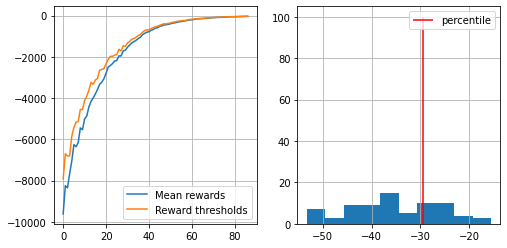

87
CPU times: user 1.54 s, sys: 31.6 ms, total: 1.57 s
Wall time: 1.61 s
mean reward = -32.463, threshold=-27.940


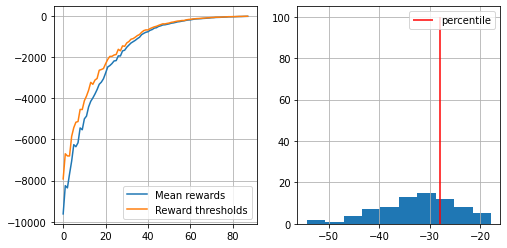

88
CPU times: user 1.46 s, sys: 24 ms, total: 1.48 s
Wall time: 1.53 s
mean reward = -29.152, threshold=-26.180


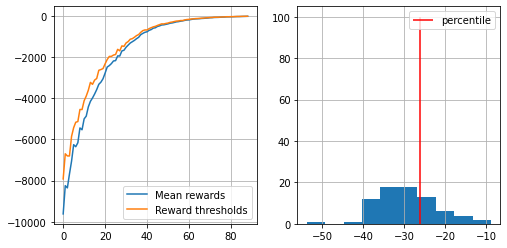

89
CPU times: user 1.45 s, sys: 26.5 ms, total: 1.48 s
Wall time: 1.52 s
mean reward = -28.403, threshold=-23.040


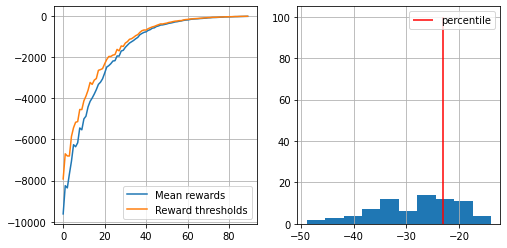

90
CPU times: user 1.35 s, sys: 42.6 ms, total: 1.39 s
Wall time: 1.39 s
mean reward = -25.740, threshold=-20.620


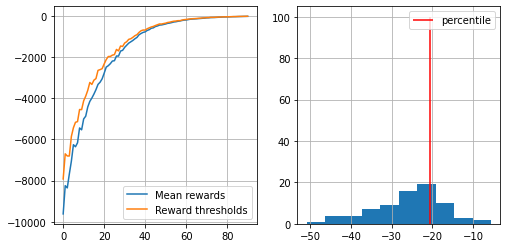

91
CPU times: user 1.21 s, sys: 30 ms, total: 1.24 s
Wall time: 1.23 s
mean reward = -23.183, threshold=-19.120


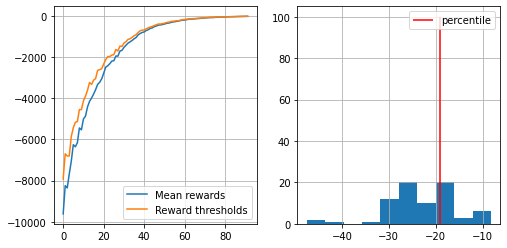

92
CPU times: user 1.2 s, sys: 54.8 ms, total: 1.26 s
Wall time: 1.25 s
mean reward = -21.204, threshold=-17.700


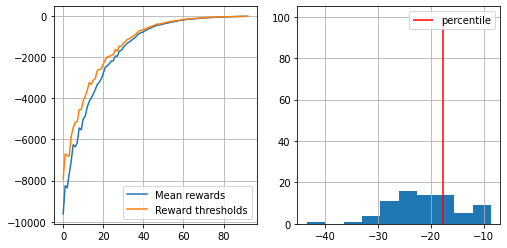

93
CPU times: user 1.23 s, sys: 94.4 ms, total: 1.32 s
Wall time: 1.27 s
mean reward = -19.155, threshold=-15.640


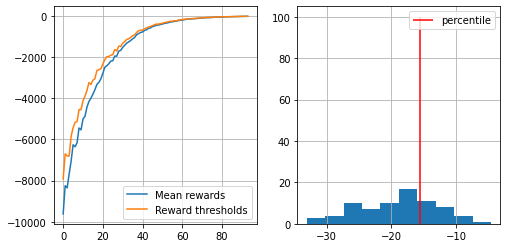

94
CPU times: user 1.26 s, sys: 86.5 ms, total: 1.35 s
Wall time: 1.29 s
mean reward = -19.165, threshold=-15.720


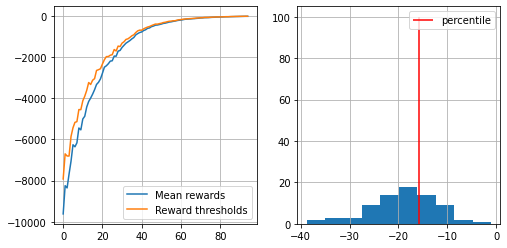

95
CPU times: user 1.18 s, sys: 58.5 ms, total: 1.23 s
Wall time: 1.2 s
mean reward = -16.879, threshold=-14.200


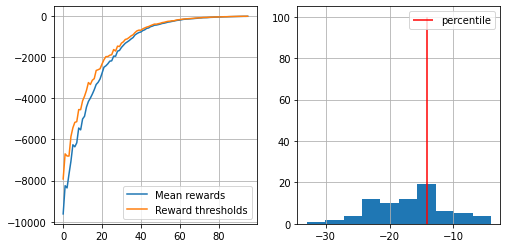

96
CPU times: user 1.18 s, sys: 90.7 ms, total: 1.27 s
Wall time: 1.22 s
mean reward = -14.468, threshold=-11.140


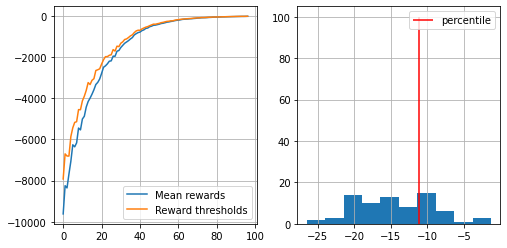

97
CPU times: user 1.12 s, sys: 68.2 ms, total: 1.19 s
Wall time: 1.15 s
mean reward = -13.680, threshold=-9.920


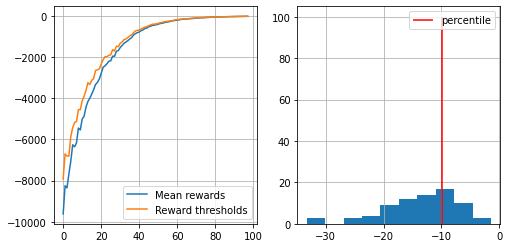

98
CPU times: user 1.13 s, sys: 89.4 ms, total: 1.21 s
Wall time: 1.16 s
mean reward = -12.016, threshold=-7.720


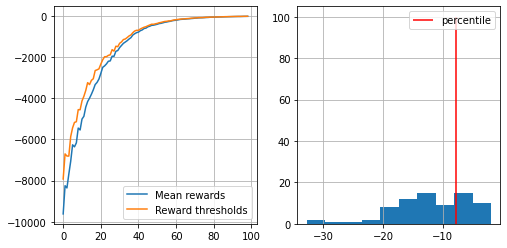

99
CPU times: user 1.18 s, sys: 119 ms, total: 1.3 s
Wall time: 1.22 s
mean reward = -12.873, threshold=-8.960


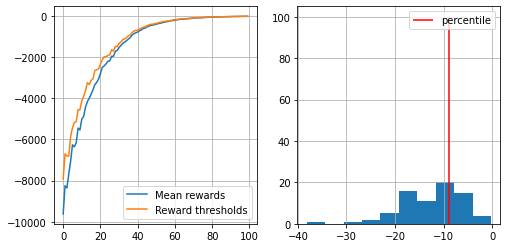

100
CPU times: user 1.14 s, sys: 131 ms, total: 1.27 s
Wall time: 1.19 s
mean reward = -10.004, threshold=-6.920


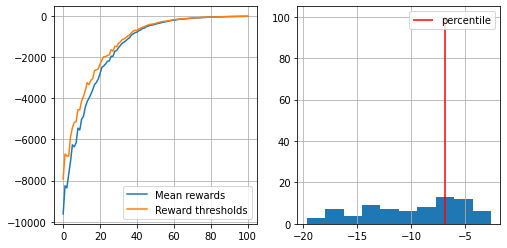

101
CPU times: user 1.14 s, sys: 124 ms, total: 1.26 s
Wall time: 1.19 s
mean reward = -9.443, threshold=-6.700


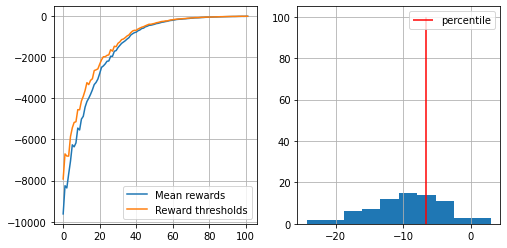

102
CPU times: user 1.08 s, sys: 102 ms, total: 1.18 s
Wall time: 1.12 s
mean reward = -7.821, threshold=-4.320


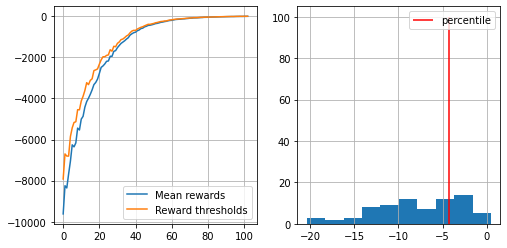

103
CPU times: user 1.1 s, sys: 130 ms, total: 1.23 s
Wall time: 1.15 s
mean reward = -7.247, threshold=-3.640


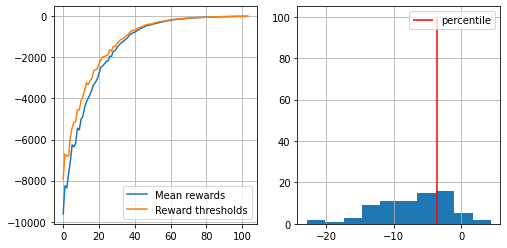

104
CPU times: user 1 s, sys: 39.9 ms, total: 1.04 s
Wall time: 1.02 s
mean reward = -7.211, threshold=-4.500


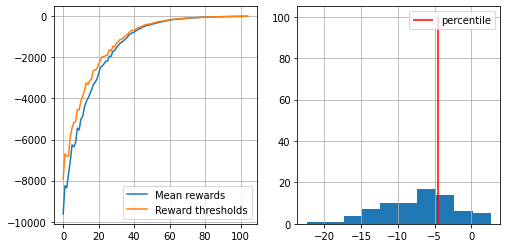

105
CPU times: user 989 ms, sys: 9.04 ms, total: 998 ms
Wall time: 1.01 s
mean reward = -5.881, threshold=-2.720


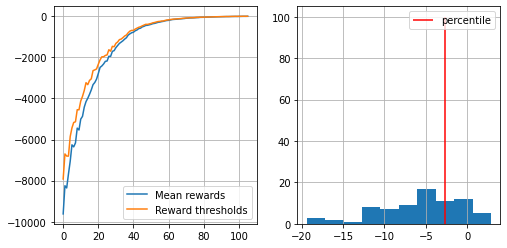

106
CPU times: user 1.04 s, sys: 58.5 ms, total: 1.1 s
Wall time: 1.09 s
mean reward = -5.109, threshold=-1.820


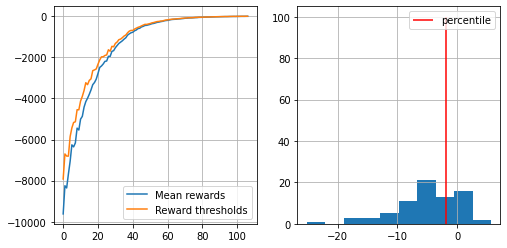

107
CPU times: user 1.05 s, sys: 84.1 ms, total: 1.13 s
Wall time: 1.08 s
mean reward = -5.740, threshold=-2.600


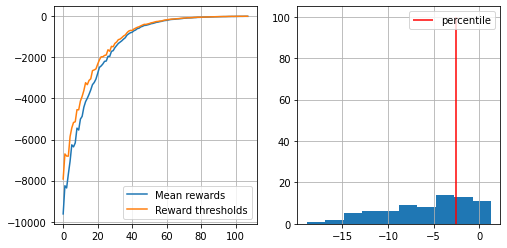

108
CPU times: user 981 ms, sys: 46.7 ms, total: 1.03 s
Wall time: 1e+03 ms
mean reward = -4.932, threshold=-1.840


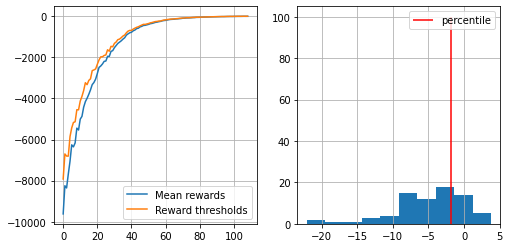

109
CPU times: user 950 ms, sys: 31.3 ms, total: 982 ms
Wall time: 963 ms
mean reward = -3.952, threshold=-0.940


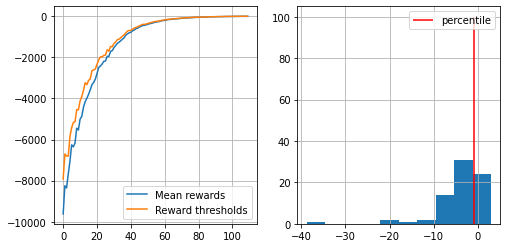

110
CPU times: user 968 ms, sys: 47.3 ms, total: 1.02 s
Wall time: 987 ms
mean reward = -3.607, threshold=-0.840


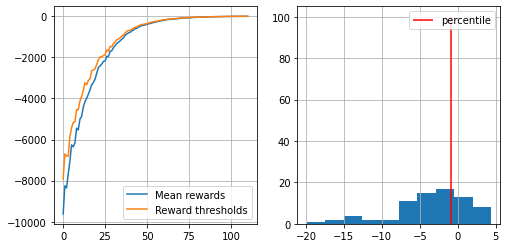

111
CPU times: user 1.01 s, sys: 99 ms, total: 1.11 s
Wall time: 1.04 s
mean reward = -3.164, threshold=0.640


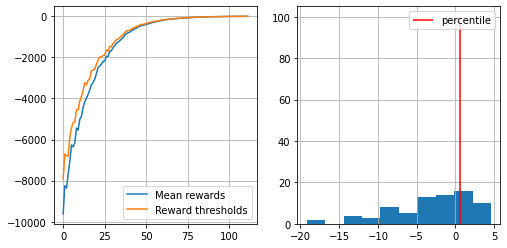

112
CPU times: user 1.05 s, sys: 108 ms, total: 1.15 s
Wall time: 1.09 s
mean reward = -3.891, threshold=0.000


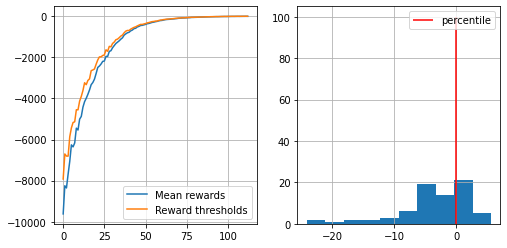

113
CPU times: user 997 ms, sys: 46.7 ms, total: 1.04 s
Wall time: 1 s
mean reward = -2.969, threshold=-0.300


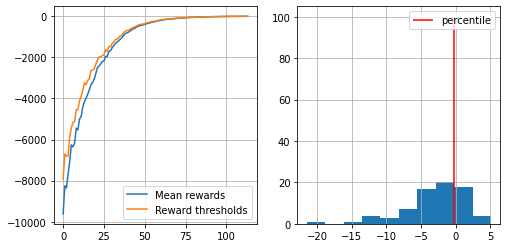

114
CPU times: user 1.03 s, sys: 122 ms, total: 1.15 s
Wall time: 1.1 s
mean reward = -2.920, threshold=-0.020


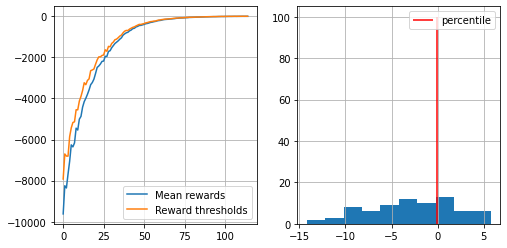

115
CPU times: user 1.12 s, sys: 29.7 ms, total: 1.15 s
Wall time: 1.23 s
mean reward = -1.169, threshold=0.880


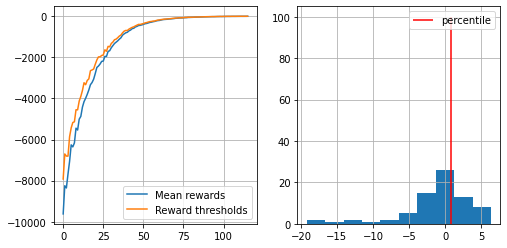

116
CPU times: user 1.05 s, sys: 17.5 ms, total: 1.06 s
Wall time: 1.11 s
mean reward = -2.392, threshold=1.060


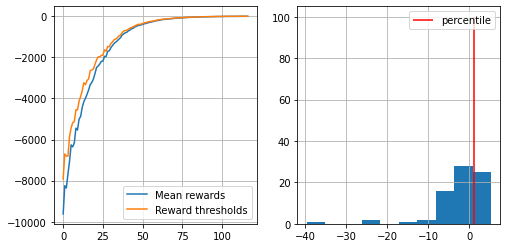

117
CPU times: user 995 ms, sys: 26.6 ms, total: 1.02 s
Wall time: 1.04 s
mean reward = -2.215, threshold=0.660


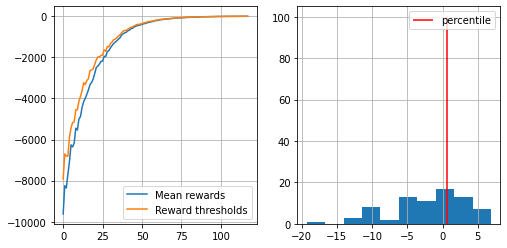

118
CPU times: user 961 ms, sys: 20.8 ms, total: 982 ms
Wall time: 997 ms
mean reward = -1.335, threshold=1.280


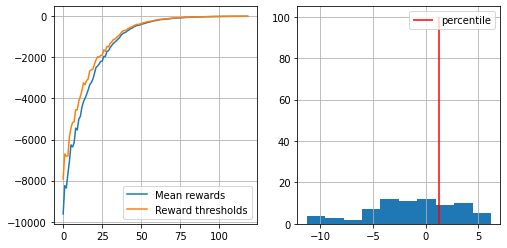

119
CPU times: user 980 ms, sys: 31.1 ms, total: 1.01 s
Wall time: 1.02 s
mean reward = -0.256, threshold=2.060


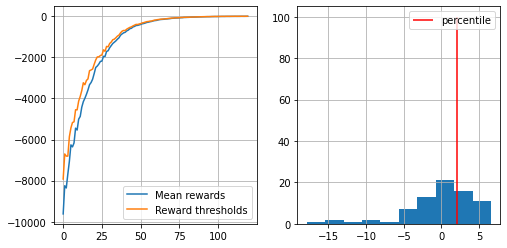

120
CPU times: user 981 ms, sys: 23.2 ms, total: 1 s
Wall time: 1.03 s
mean reward = 0.896, threshold=2.880


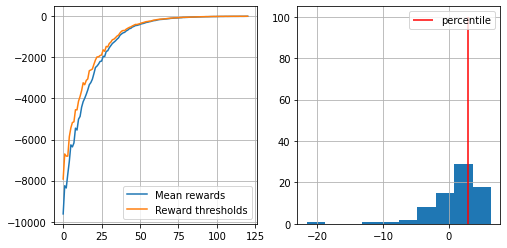

121
CPU times: user 944 ms, sys: 14.9 ms, total: 959 ms
Wall time: 979 ms
mean reward = -0.279, threshold=2.480


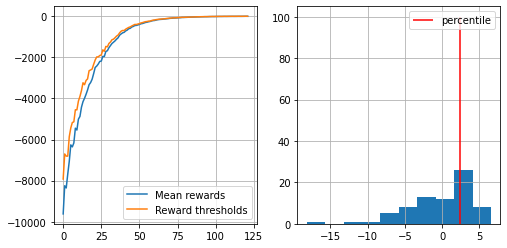

122
CPU times: user 911 ms, sys: 18.5 ms, total: 929 ms
Wall time: 938 ms
mean reward = 1.463, threshold=3.480


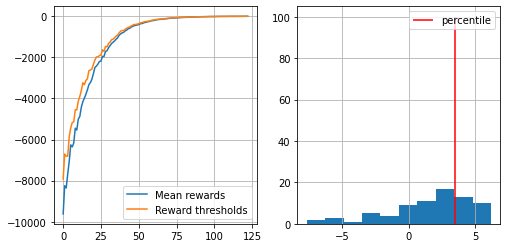

123
CPU times: user 988 ms, sys: 36.6 ms, total: 1.03 s
Wall time: 1.04 s
mean reward = 0.860, threshold=3.760


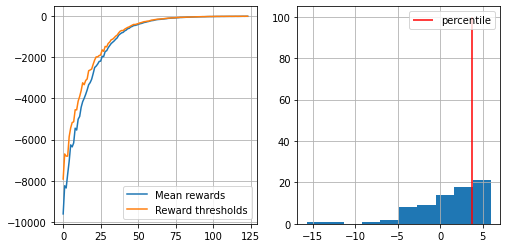

124
CPU times: user 956 ms, sys: 20.7 ms, total: 976 ms
Wall time: 997 ms
mean reward = -0.136, threshold=2.380


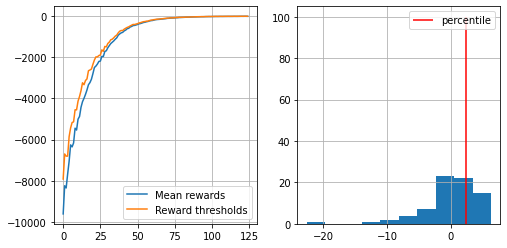

125
CPU times: user 932 ms, sys: 18.5 ms, total: 950 ms
Wall time: 965 ms
mean reward = 0.869, threshold=3.800


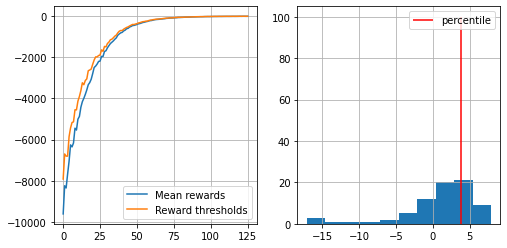

126
CPU times: user 945 ms, sys: 19.6 ms, total: 965 ms
Wall time: 977 ms
mean reward = 0.443, threshold=2.900


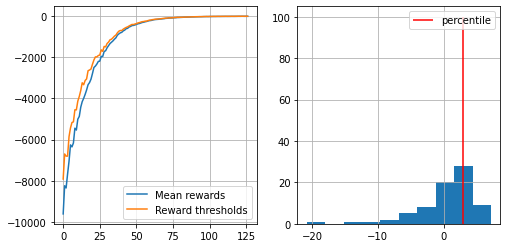

127
CPU times: user 958 ms, sys: 25.2 ms, total: 983 ms
Wall time: 1 s
mean reward = 0.617, threshold=3.380


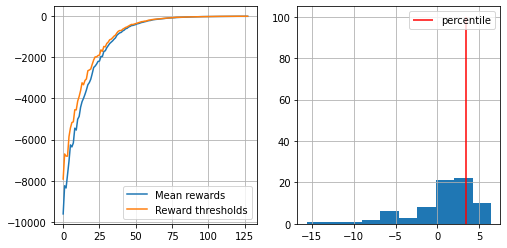

128
CPU times: user 902 ms, sys: 25 ms, total: 927 ms
Wall time: 931 ms
mean reward = 1.089, threshold=3.780


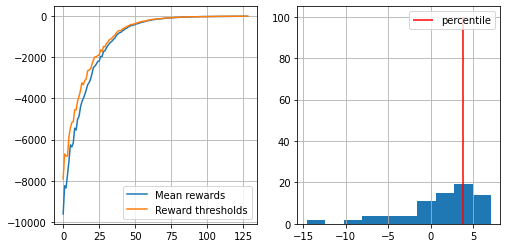

129
CPU times: user 970 ms, sys: 20.1 ms, total: 990 ms
Wall time: 1.01 s
mean reward = 0.001, threshold=3.100


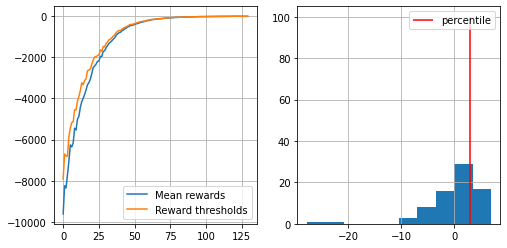

130
CPU times: user 955 ms, sys: 21.5 ms, total: 976 ms
Wall time: 998 ms
mean reward = 0.996, threshold=3.380


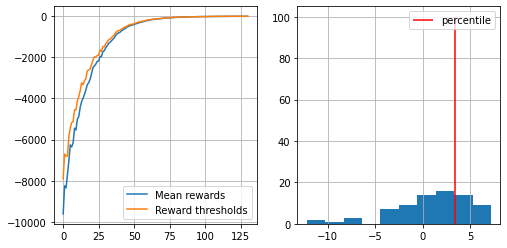

131
CPU times: user 939 ms, sys: 20.4 ms, total: 959 ms
Wall time: 971 ms
mean reward = -0.116, threshold=2.780


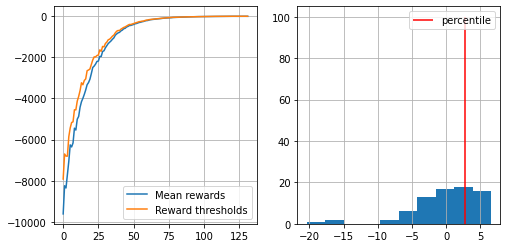

132
CPU times: user 909 ms, sys: 23.7 ms, total: 932 ms
Wall time: 944 ms
mean reward = 2.063, threshold=4.180


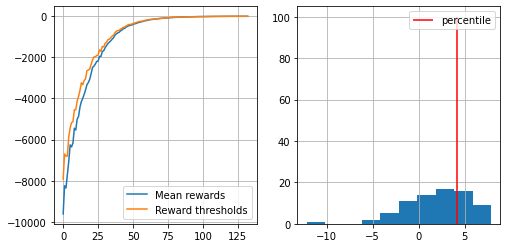

133
CPU times: user 885 ms, sys: 14.2 ms, total: 899 ms
Wall time: 911 ms
mean reward = 0.092, threshold=3.200


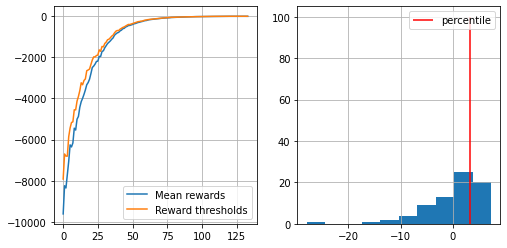

134
CPU times: user 866 ms, sys: 26.9 ms, total: 893 ms
Wall time: 894 ms
mean reward = 2.029, threshold=4.360


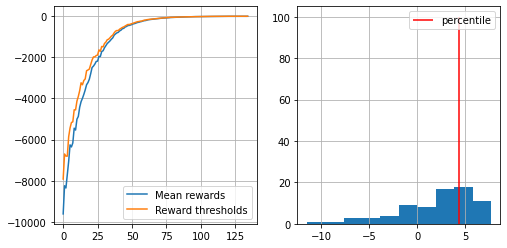

135
CPU times: user 930 ms, sys: 20.2 ms, total: 951 ms
Wall time: 972 ms
mean reward = 1.269, threshold=3.740


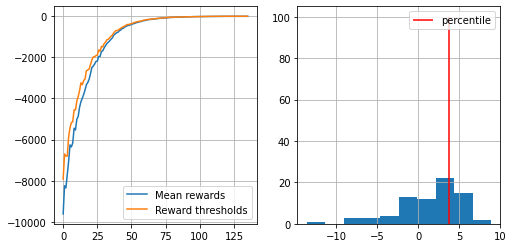

136
CPU times: user 879 ms, sys: 19.4 ms, total: 898 ms
Wall time: 905 ms
mean reward = 0.675, threshold=3.980


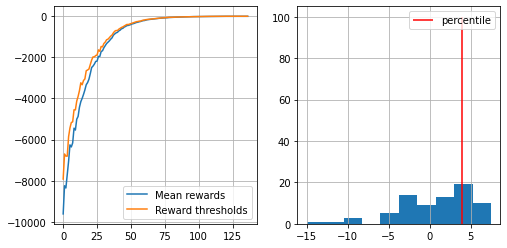

137
CPU times: user 896 ms, sys: 16.9 ms, total: 913 ms
Wall time: 930 ms
mean reward = 1.063, threshold=3.580


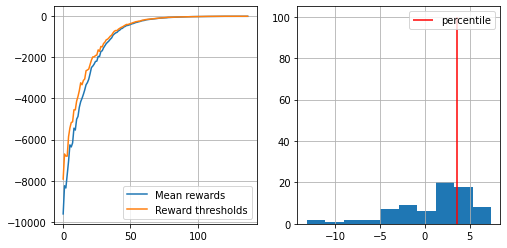

138
CPU times: user 942 ms, sys: 25.1 ms, total: 967 ms
Wall time: 969 ms
mean reward = 0.964, threshold=3.780


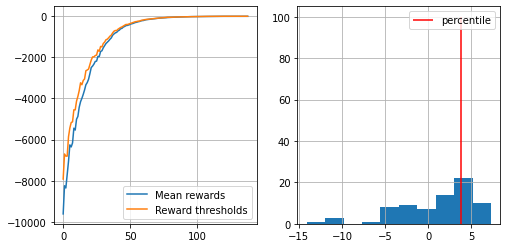

139
CPU times: user 873 ms, sys: 21.1 ms, total: 894 ms
Wall time: 904 ms
mean reward = 2.069, threshold=4.200


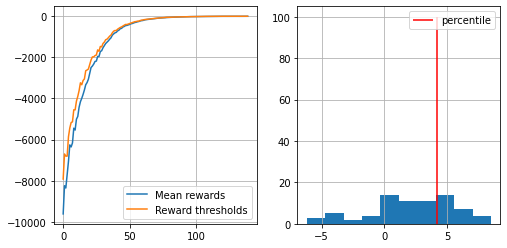

140
CPU times: user 871 ms, sys: 21.3 ms, total: 892 ms
Wall time: 893 ms
mean reward = 0.591, threshold=3.580


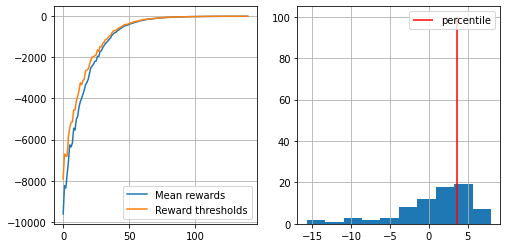

141
CPU times: user 853 ms, sys: 14.6 ms, total: 868 ms
Wall time: 881 ms
mean reward = 2.292, threshold=4.200


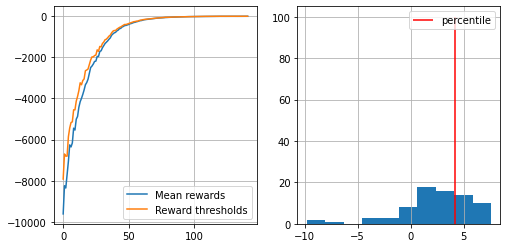

142
CPU times: user 874 ms, sys: 14.9 ms, total: 889 ms
Wall time: 904 ms
mean reward = 1.555, threshold=4.260


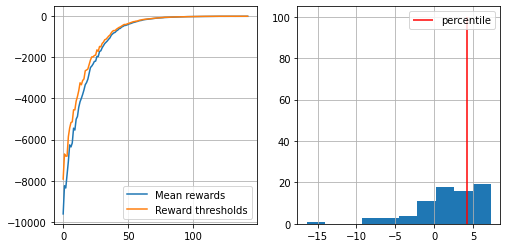

143
CPU times: user 877 ms, sys: 15.8 ms, total: 892 ms
Wall time: 900 ms
mean reward = 0.681, threshold=3.100


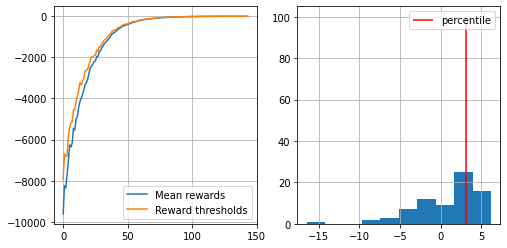

144
CPU times: user 903 ms, sys: 24.6 ms, total: 928 ms
Wall time: 934 ms
mean reward = 2.163, threshold=3.980


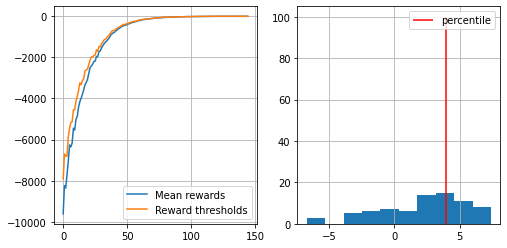

145
CPU times: user 896 ms, sys: 28.6 ms, total: 924 ms
Wall time: 929 ms
mean reward = 1.896, threshold=4.660


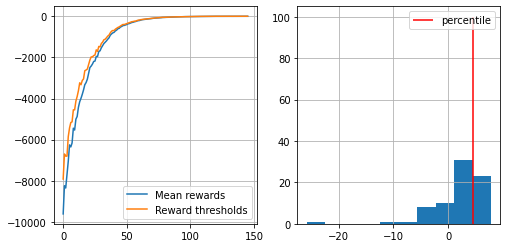

146
CPU times: user 871 ms, sys: 15 ms, total: 886 ms
Wall time: 900 ms
mean reward = 2.345, threshold=4.300


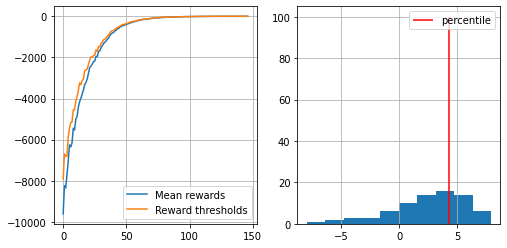

147
CPU times: user 870 ms, sys: 20.1 ms, total: 890 ms
Wall time: 903 ms
mean reward = 2.324, threshold=5.100


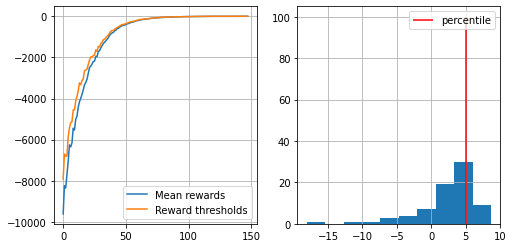

148
CPU times: user 848 ms, sys: 15.7 ms, total: 864 ms
Wall time: 874 ms
mean reward = 2.125, threshold=4.500


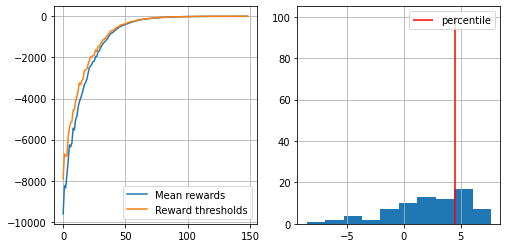

149
CPU times: user 850 ms, sys: 31 ms, total: 881 ms
Wall time: 873 ms
mean reward = 2.303, threshold=3.900


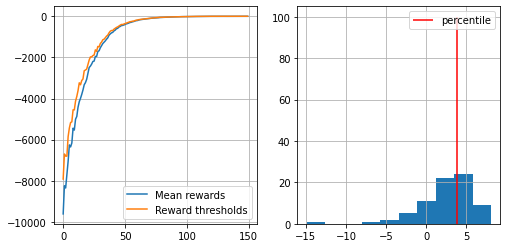

150
CPU times: user 853 ms, sys: 22.6 ms, total: 876 ms
Wall time: 880 ms
mean reward = 2.431, threshold=3.980


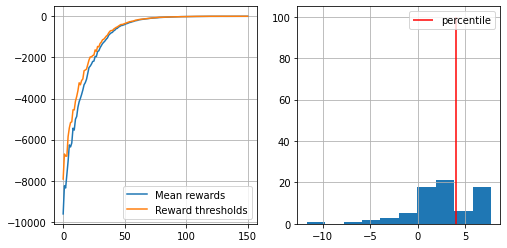

151
CPU times: user 856 ms, sys: 16.8 ms, total: 873 ms
Wall time: 885 ms
mean reward = 2.308, threshold=4.300


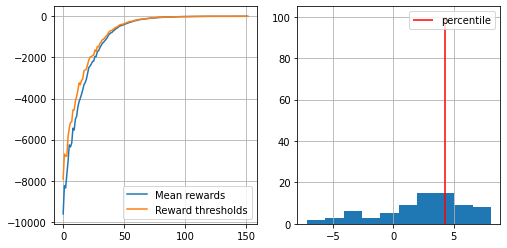

152
CPU times: user 837 ms, sys: 20.9 ms, total: 858 ms
Wall time: 891 ms
mean reward = 3.853, threshold=5.560


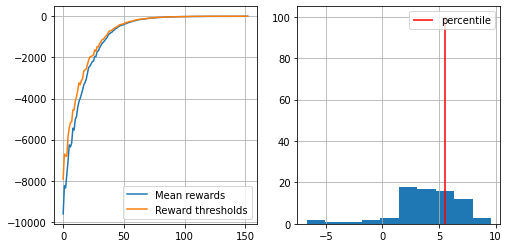

win!
Formatted current time: 20:34:48


In [21]:



n_sessions = 75  #sample this many sessions
perc = 70  #take this percent of session with highest rewards
learning_rate = 0.3  #add this thing to all counts for stability

log = []
mean = []
policy = np.ones([n_states,n_actions])/n_actions
randActionProb=0.5
for i in range(1000):
    print(i)
    %time sessions = [generate_session(policy) for _ in range(n_sessions)]
    randActionProb*=0.95

    states_batch,actions_batch,rewards_batch = zip(*sessions)

    elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=perc)




    #set new policy
    new_policy = update_policy(elite_states,elite_actions)

    #update policy
    policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy

    #add mean value
    #curMean.append(np.mean(rewards_batch))

    
    #code here

    show_progress(rewards_batch,log)
    
    if(np.mean(rewards_batch) > 3):
        print("win!")
        break
        

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


0
CPU times: user 4.51 s, sys: 134 ms, total: 4.65 s
Wall time: 4.67 s
mean reward = -2.379, threshold=-1.288


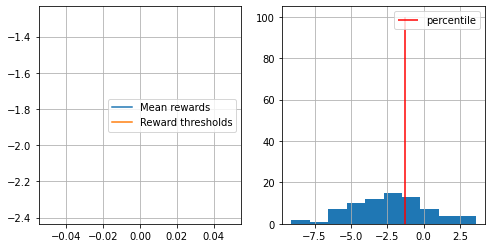

1
CPU times: user 4.58 s, sys: 133 ms, total: 4.72 s
Wall time: 4.8 s
mean reward = -1.417, threshold=-0.064


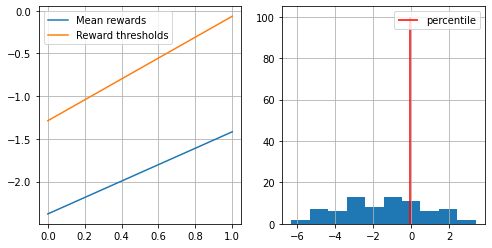

2
CPU times: user 4.45 s, sys: 114 ms, total: 4.56 s
Wall time: 4.58 s
mean reward = -0.868, threshold=0.416


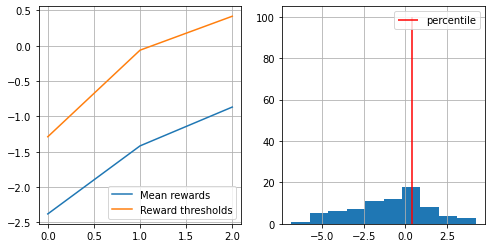

3
CPU times: user 4.37 s, sys: 110 ms, total: 4.48 s
Wall time: 4.51 s
mean reward = -0.350, threshold=0.688


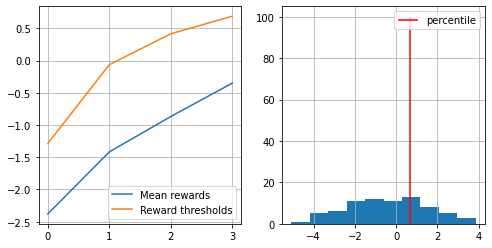

4
CPU times: user 4.33 s, sys: 133 ms, total: 4.46 s
Wall time: 4.44 s
mean reward = 0.182, threshold=1.228


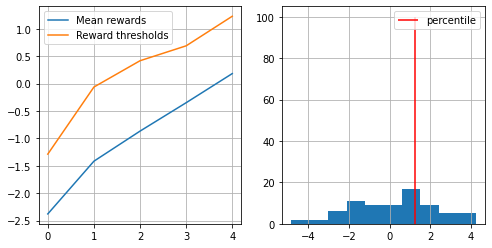

5
CPU times: user 4.33 s, sys: 112 ms, total: 4.44 s
Wall time: 4.47 s
mean reward = 0.311, threshold=1.472


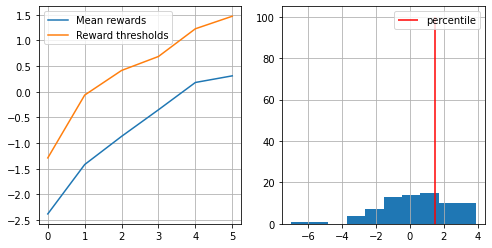

6
CPU times: user 4.16 s, sys: 97.6 ms, total: 4.26 s
Wall time: 4.25 s
mean reward = 1.393, threshold=2.676


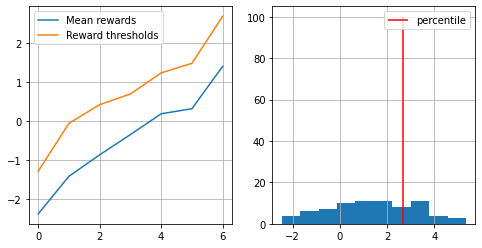

7
CPU times: user 3.97 s, sys: 71.7 ms, total: 4.04 s
Wall time: 4 s
mean reward = 1.362, threshold=2.380


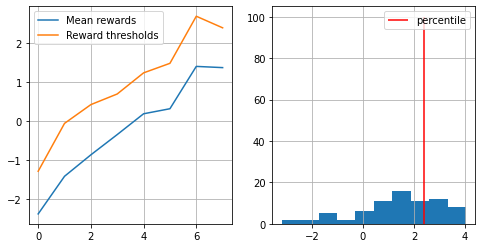

8
CPU times: user 3.92 s, sys: 83.3 ms, total: 4.01 s
Wall time: 3.96 s
mean reward = 2.073, threshold=3.112


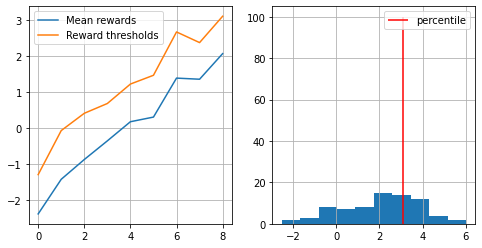

9
CPU times: user 3.75 s, sys: 59.3 ms, total: 3.81 s
Wall time: 3.74 s
mean reward = 1.992, threshold=2.824


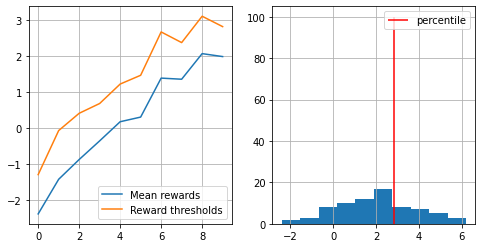

10
CPU times: user 3.87 s, sys: 108 ms, total: 3.98 s
Wall time: 3.89 s
mean reward = 2.692, threshold=3.684


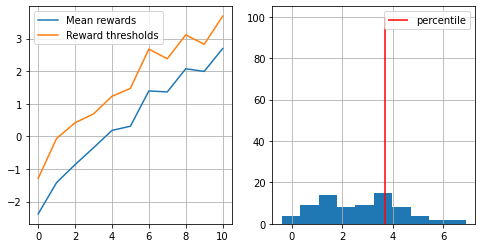

11
CPU times: user 4.04 s, sys: 93.3 ms, total: 4.13 s
Wall time: 4.21 s
mean reward = 3.367, threshold=4.132


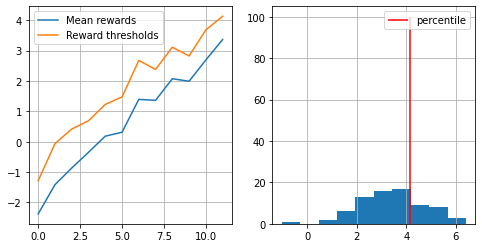

12
CPU times: user 3.71 s, sys: 67.6 ms, total: 3.78 s
Wall time: 3.72 s
mean reward = 3.433, threshold=4.116


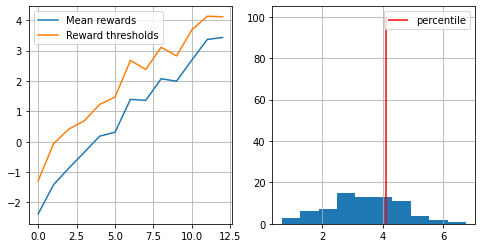

13
CPU times: user 3.66 s, sys: 80.4 ms, total: 3.74 s
Wall time: 3.66 s
mean reward = 3.614, threshold=4.436


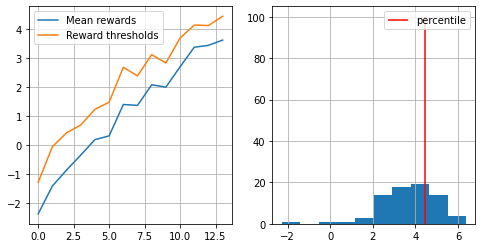

14
CPU times: user 3.64 s, sys: 65.2 ms, total: 3.71 s
Wall time: 3.64 s
mean reward = 3.837, threshold=4.452


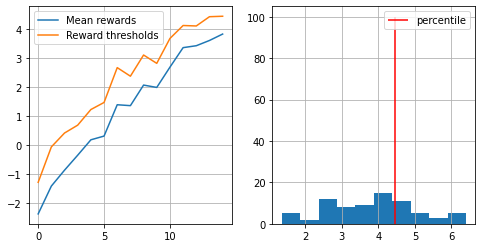

15
CPU times: user 3.64 s, sys: 84.7 ms, total: 3.73 s
Wall time: 3.65 s
mean reward = 4.155, threshold=4.600


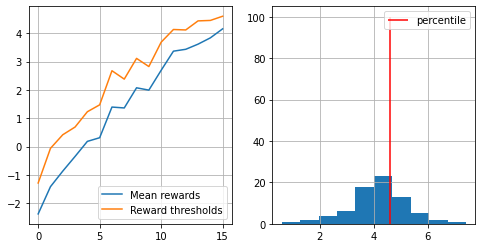

16
CPU times: user 3.64 s, sys: 109 ms, total: 3.75 s
Wall time: 3.65 s
mean reward = 4.495, threshold=5.132


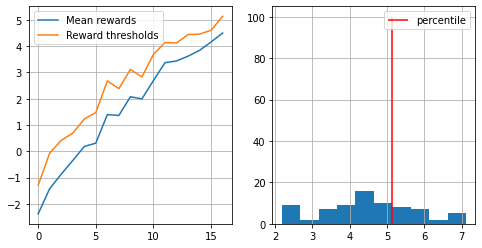

17
CPU times: user 3.61 s, sys: 74.2 ms, total: 3.68 s
Wall time: 3.61 s
mean reward = 4.867, threshold=5.332


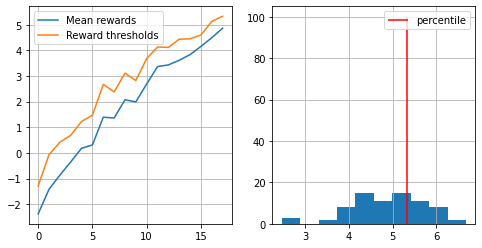

18
CPU times: user 3.62 s, sys: 96.8 ms, total: 3.72 s
Wall time: 3.63 s
mean reward = 4.873, threshold=5.384


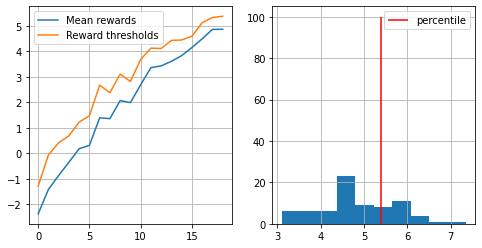

19
CPU times: user 3.54 s, sys: 63.5 ms, total: 3.6 s
Wall time: 3.53 s
mean reward = 5.301, threshold=5.780


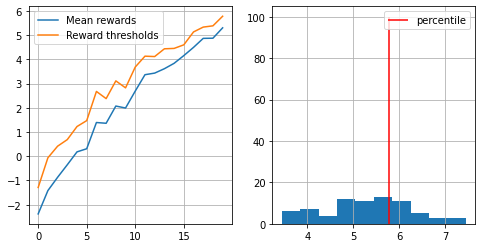

20
CPU times: user 3.66 s, sys: 79.6 ms, total: 3.74 s
Wall time: 3.66 s
mean reward = 5.466, threshold=5.984


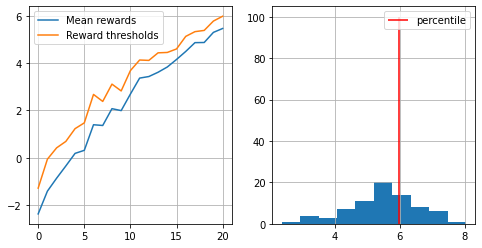

21
CPU times: user 3.56 s, sys: 72.7 ms, total: 3.63 s
Wall time: 3.56 s
mean reward = 5.471, threshold=5.932


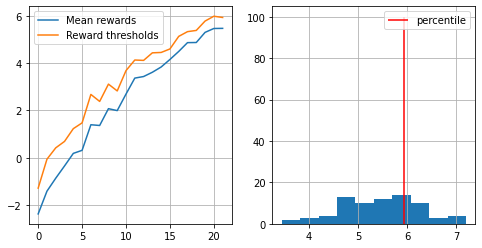

22
CPU times: user 3.52 s, sys: 54.4 ms, total: 3.57 s
Wall time: 3.51 s
mean reward = 5.683, threshold=6.252


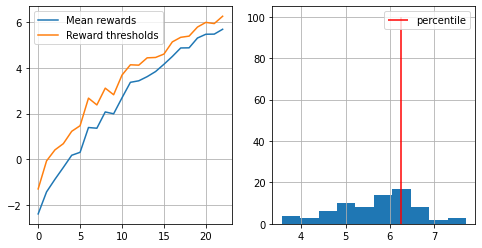

23
CPU times: user 3.54 s, sys: 117 ms, total: 3.66 s
Wall time: 3.56 s
mean reward = 5.922, threshold=6.340


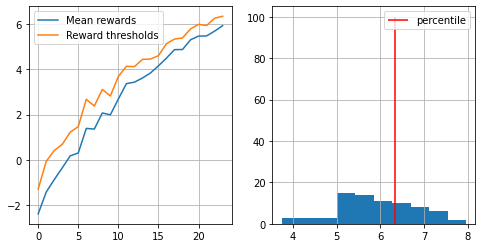

24
CPU times: user 3.47 s, sys: 66.1 ms, total: 3.53 s
Wall time: 3.46 s
mean reward = 6.087, threshold=6.476


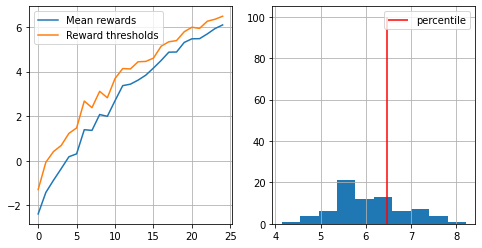

25
CPU times: user 3.55 s, sys: 100 ms, total: 3.65 s
Wall time: 3.56 s
mean reward = 6.104, threshold=6.568


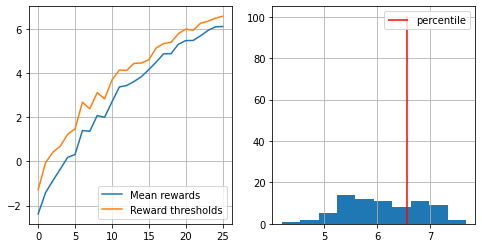

26
CPU times: user 3.47 s, sys: 78.4 ms, total: 3.55 s
Wall time: 3.47 s
mean reward = 6.451, threshold=6.856


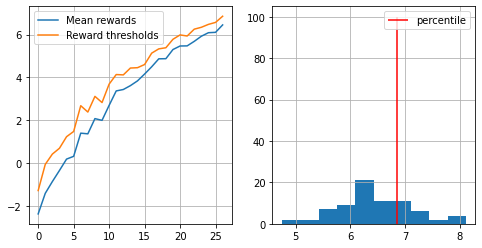

27
CPU times: user 3.5 s, sys: 79.2 ms, total: 3.57 s
Wall time: 3.5 s
mean reward = 6.426, threshold=6.840


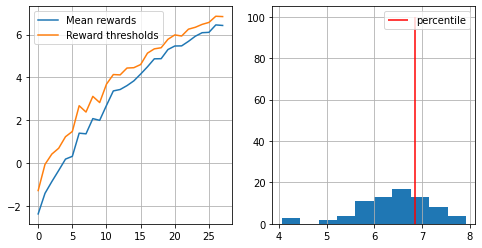

28
CPU times: user 3.53 s, sys: 87.6 ms, total: 3.62 s
Wall time: 3.54 s
mean reward = 6.586, threshold=6.796


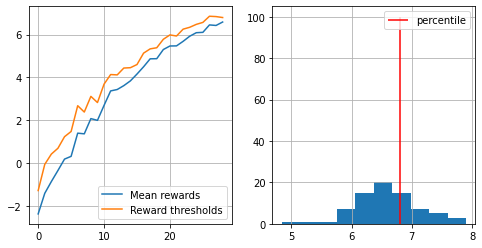

29
CPU times: user 3.46 s, sys: 69.2 ms, total: 3.53 s
Wall time: 3.46 s
mean reward = 6.601, threshold=6.900


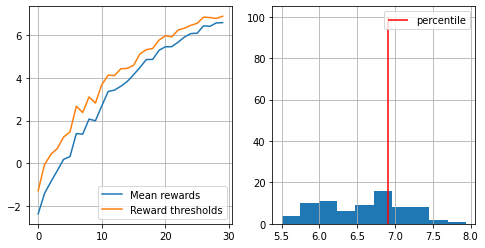

30
CPU times: user 3.46 s, sys: 96.8 ms, total: 3.55 s
Wall time: 3.46 s
mean reward = 6.807, threshold=7.096


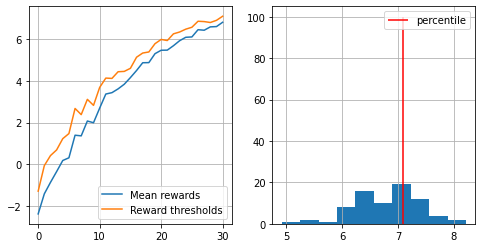

31
CPU times: user 3.46 s, sys: 72.2 ms, total: 3.54 s
Wall time: 3.46 s
mean reward = 6.648, threshold=6.940


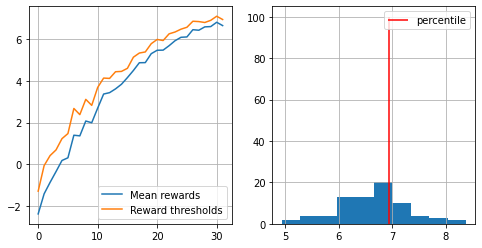

32
CPU times: user 3.51 s, sys: 75.6 ms, total: 3.59 s
Wall time: 3.54 s
mean reward = 6.750, threshold=6.996


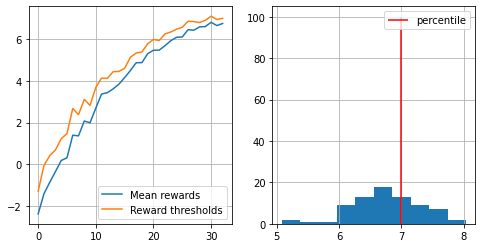

33
CPU times: user 3.46 s, sys: 86 ms, total: 3.55 s
Wall time: 3.46 s
mean reward = 6.784, threshold=7.056


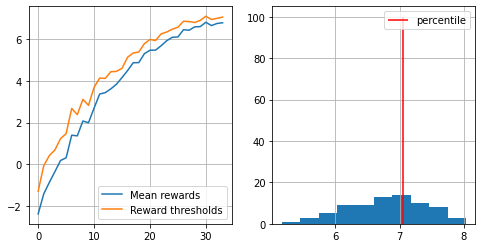

34
CPU times: user 3.43 s, sys: 66.4 ms, total: 3.49 s
Wall time: 3.42 s
mean reward = 6.808, threshold=7.060


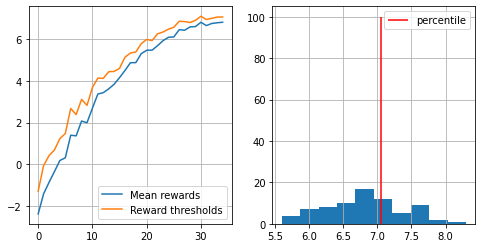

35
CPU times: user 3.41 s, sys: 65.8 ms, total: 3.47 s
Wall time: 3.41 s
mean reward = 7.035, threshold=7.320


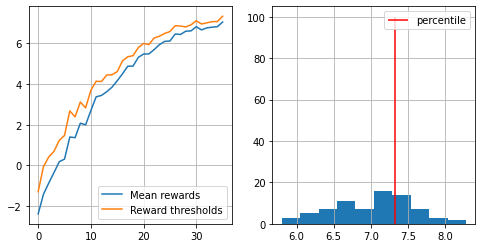

36
CPU times: user 3.42 s, sys: 63 ms, total: 3.49 s
Wall time: 3.42 s
mean reward = 6.999, threshold=7.260


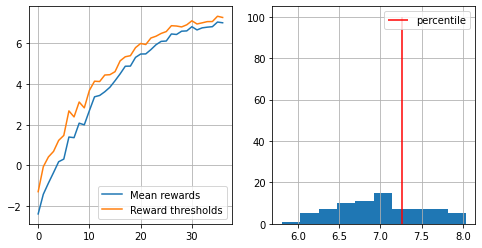

37
CPU times: user 3.43 s, sys: 73.1 ms, total: 3.51 s
Wall time: 3.43 s
mean reward = 7.050, threshold=7.260


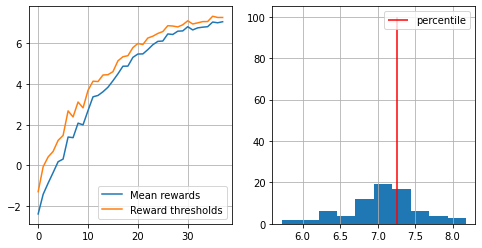

38
CPU times: user 3.39 s, sys: 62.6 ms, total: 3.45 s
Wall time: 3.39 s
mean reward = 7.117, threshold=7.412


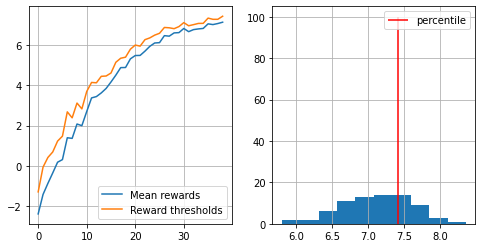

39
CPU times: user 3.4 s, sys: 69.1 ms, total: 3.47 s
Wall time: 3.4 s
mean reward = 7.133, threshold=7.412


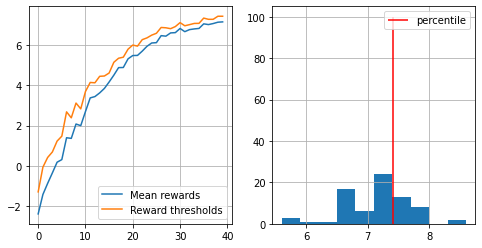

40
CPU times: user 3.41 s, sys: 60.7 ms, total: 3.47 s
Wall time: 3.4 s
mean reward = 7.131, threshold=7.420


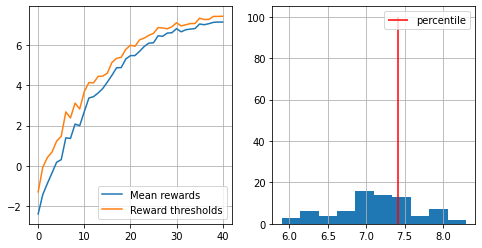

41
CPU times: user 3.57 s, sys: 84.9 ms, total: 3.65 s
Wall time: 3.58 s
mean reward = 7.166, threshold=7.540


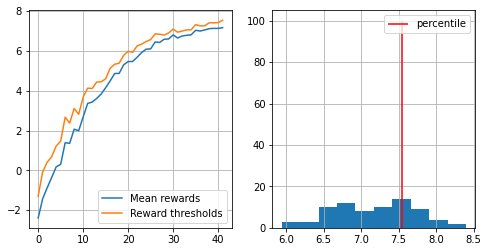

42
CPU times: user 3.4 s, sys: 54.8 ms, total: 3.45 s
Wall time: 3.4 s
mean reward = 7.340, threshold=7.552


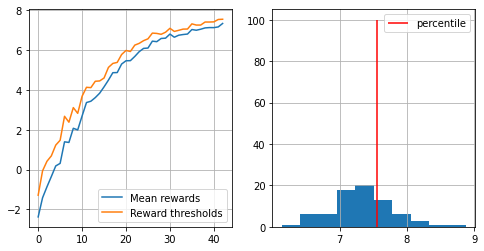

43
CPU times: user 3.45 s, sys: 82.8 ms, total: 3.54 s
Wall time: 3.46 s
mean reward = 7.327, threshold=7.532


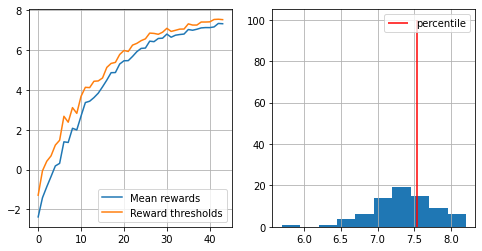

44
CPU times: user 3.41 s, sys: 80.7 ms, total: 3.49 s
Wall time: 3.4 s
mean reward = 7.381, threshold=7.604


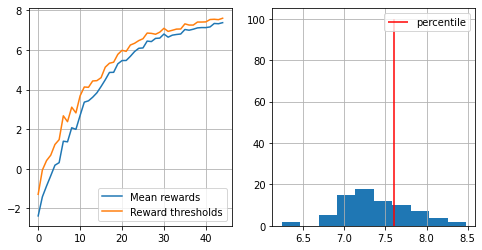

45
CPU times: user 3.53 s, sys: 85.7 ms, total: 3.61 s
Wall time: 3.55 s
mean reward = 7.353, threshold=7.520


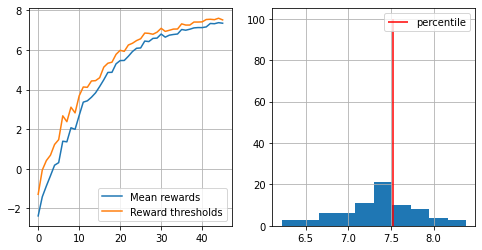

46
CPU times: user 3.38 s, sys: 62.5 ms, total: 3.44 s
Wall time: 3.37 s
mean reward = 7.342, threshold=7.612


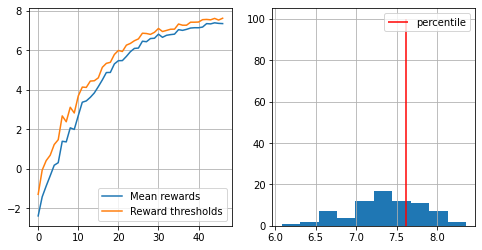

47
CPU times: user 3.38 s, sys: 65 ms, total: 3.45 s
Wall time: 3.38 s
mean reward = 7.337, threshold=7.520


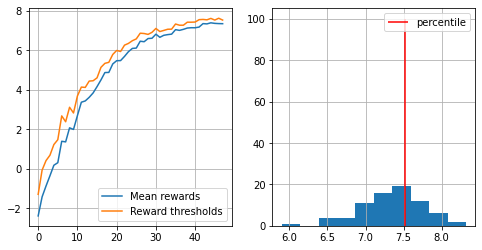

48
CPU times: user 3.4 s, sys: 67 ms, total: 3.46 s
Wall time: 3.4 s
mean reward = 7.355, threshold=7.632


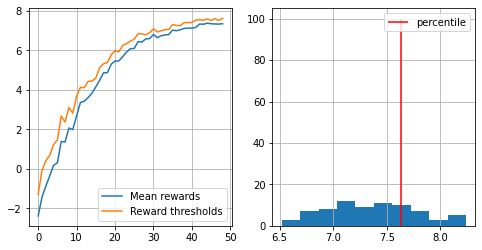

49
CPU times: user 3.39 s, sys: 90.1 ms, total: 3.48 s
Wall time: 3.4 s
mean reward = 7.363, threshold=7.640


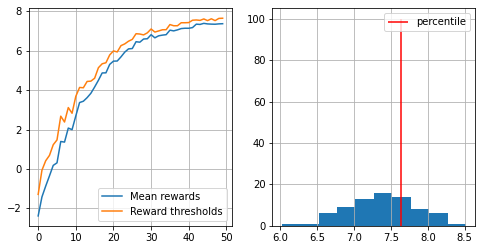

50
CPU times: user 3.37 s, sys: 80.5 ms, total: 3.45 s
Wall time: 3.37 s
mean reward = 7.469, threshold=7.760


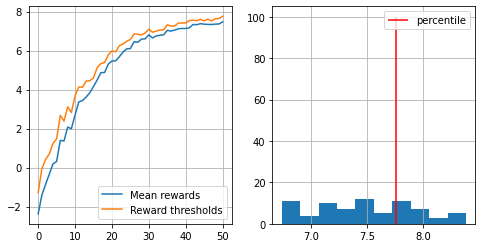

51
CPU times: user 3.45 s, sys: 95.1 ms, total: 3.55 s
Wall time: 3.46 s
mean reward = 7.313, threshold=7.576


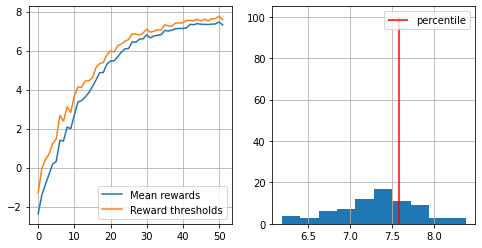

52
CPU times: user 3.42 s, sys: 67.1 ms, total: 3.49 s
Wall time: 3.42 s
mean reward = 7.374, threshold=7.576


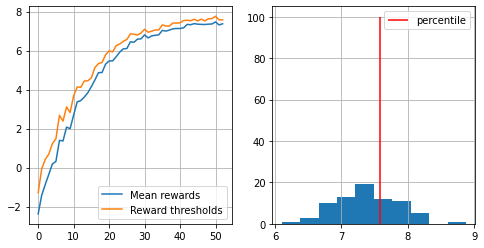

53
CPU times: user 3.39 s, sys: 58.4 ms, total: 3.45 s
Wall time: 3.38 s
mean reward = 7.378, threshold=7.640


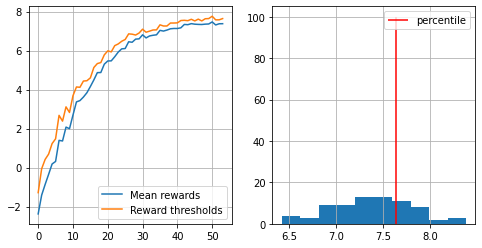

54
CPU times: user 3.39 s, sys: 69.9 ms, total: 3.46 s
Wall time: 3.38 s
mean reward = 7.327, threshold=7.532


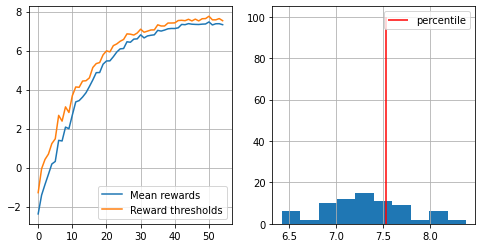

55
CPU times: user 3.36 s, sys: 61 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.385, threshold=7.560


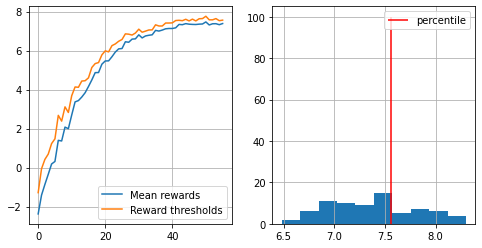

56
CPU times: user 3.4 s, sys: 101 ms, total: 3.5 s
Wall time: 3.41 s
mean reward = 7.473, threshold=7.676


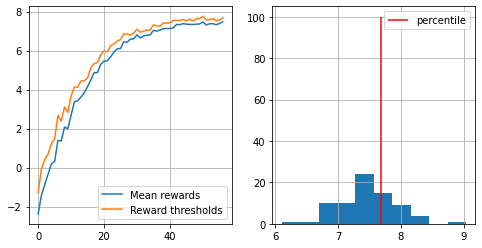

57
CPU times: user 3.36 s, sys: 68.4 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.455, threshold=7.712


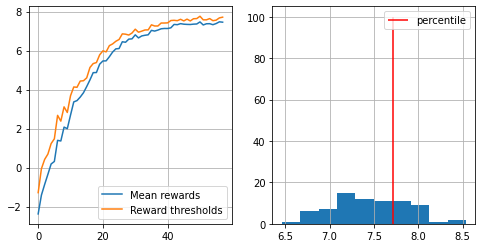

58
CPU times: user 3.47 s, sys: 113 ms, total: 3.58 s
Wall time: 3.48 s
mean reward = 7.475, threshold=7.656


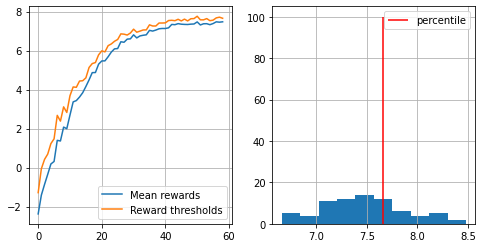

59
CPU times: user 3.43 s, sys: 125 ms, total: 3.55 s
Wall time: 3.45 s
mean reward = 7.503, threshold=7.788


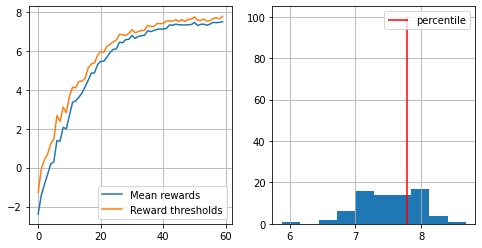

60
CPU times: user 3.44 s, sys: 100 ms, total: 3.54 s
Wall time: 3.46 s
mean reward = 7.510, threshold=7.740


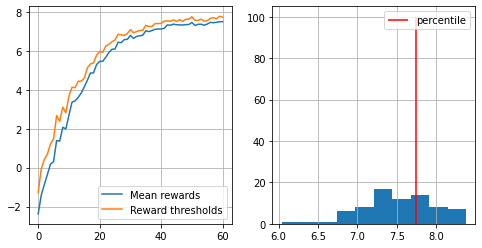

61
CPU times: user 3.38 s, sys: 77.9 ms, total: 3.46 s
Wall time: 3.38 s
mean reward = 7.498, threshold=7.720


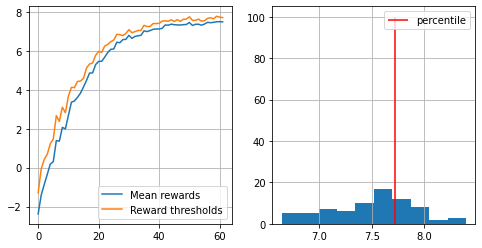

62
CPU times: user 3.34 s, sys: 68.7 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.546, threshold=7.796


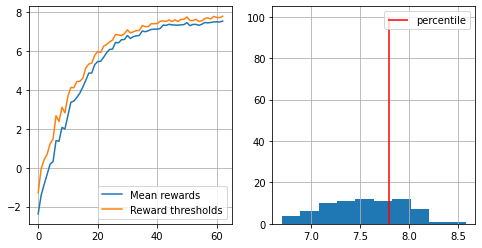

63
CPU times: user 3.33 s, sys: 59.8 ms, total: 3.39 s
Wall time: 3.33 s
mean reward = 7.543, threshold=7.756


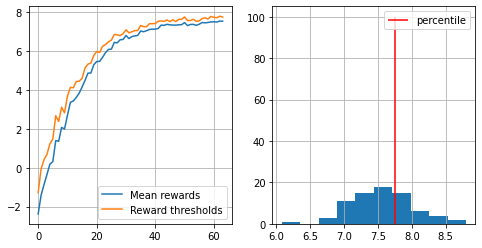

64
CPU times: user 3.68 s, sys: 107 ms, total: 3.79 s
Wall time: 3.82 s
mean reward = 7.511, threshold=7.756


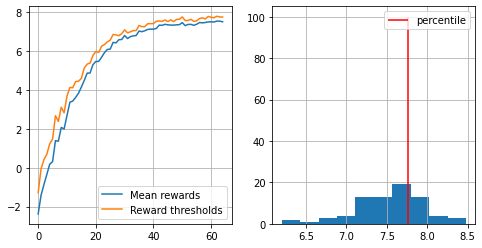

65
CPU times: user 3.95 s, sys: 97.7 ms, total: 4.05 s
Wall time: 4.11 s
mean reward = 7.441, threshold=7.640


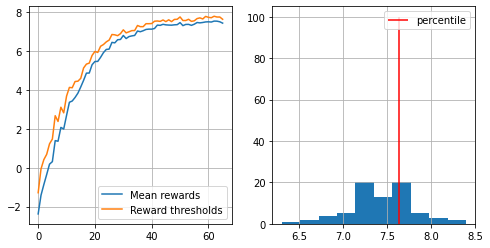

66
CPU times: user 3.8 s, sys: 86 ms, total: 3.89 s
Wall time: 3.91 s
mean reward = 7.432, threshold=7.692


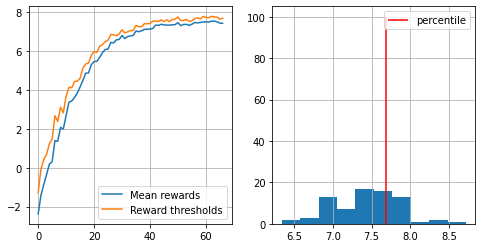

67
CPU times: user 3.86 s, sys: 95.7 ms, total: 3.96 s
Wall time: 3.98 s
mean reward = 7.509, threshold=7.740


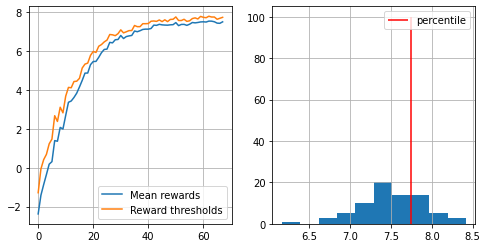

68
CPU times: user 3.74 s, sys: 91.3 ms, total: 3.83 s
Wall time: 3.96 s
mean reward = 7.560, threshold=7.796


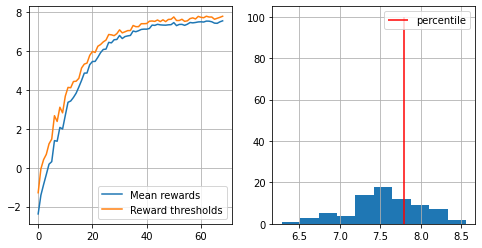

69
CPU times: user 3.42 s, sys: 76.4 ms, total: 3.5 s
Wall time: 3.43 s
mean reward = 7.465, threshold=7.668


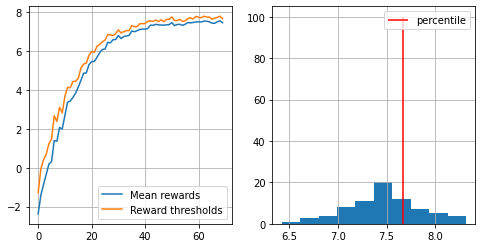

70
CPU times: user 3.4 s, sys: 92.8 ms, total: 3.49 s
Wall time: 3.4 s
mean reward = 7.460, threshold=7.756


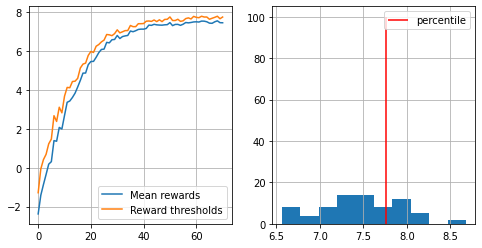

71
CPU times: user 3.36 s, sys: 74.8 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.509, threshold=7.700


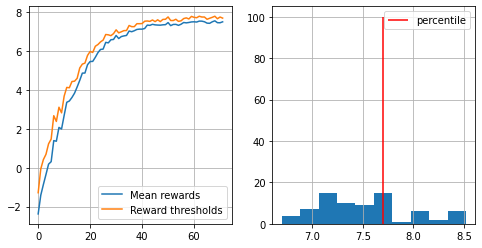

72
CPU times: user 3.46 s, sys: 75.1 ms, total: 3.54 s
Wall time: 3.46 s
mean reward = 7.518, threshold=7.780


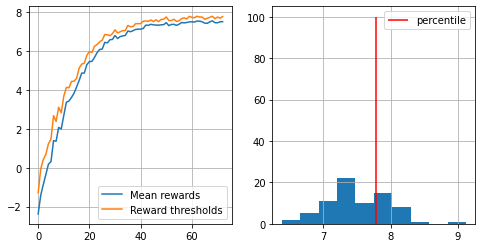

73
CPU times: user 3.46 s, sys: 77 ms, total: 3.53 s
Wall time: 3.46 s
mean reward = 7.486, threshold=7.660


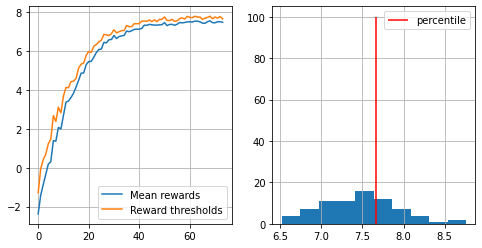

74
CPU times: user 3.34 s, sys: 81.9 ms, total: 3.43 s
Wall time: 3.35 s
mean reward = 7.566, threshold=7.788


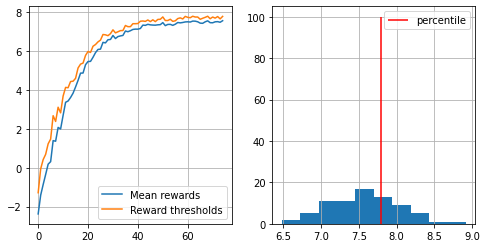

75
CPU times: user 3.35 s, sys: 66.1 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.488, threshold=7.660


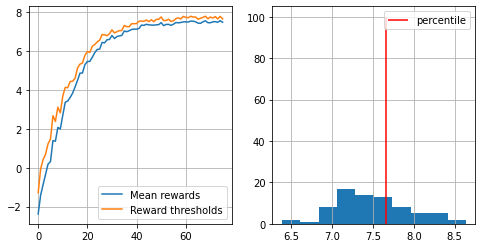

76
CPU times: user 3.33 s, sys: 68.2 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.517, threshold=7.780


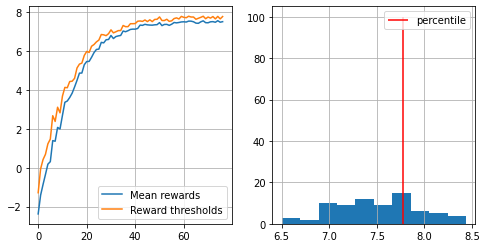

77
CPU times: user 3.32 s, sys: 53.4 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.543, threshold=7.760


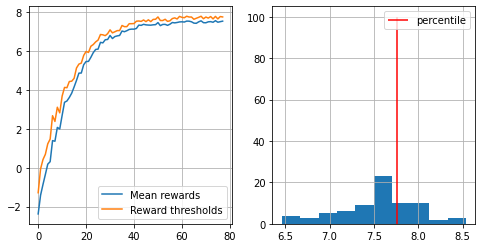

78
CPU times: user 3.34 s, sys: 81.1 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.602, threshold=7.836


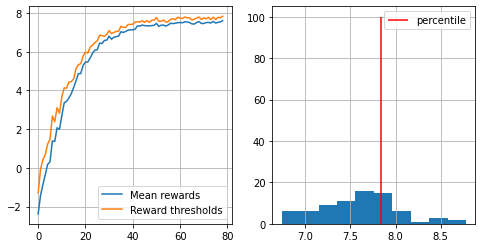

79
CPU times: user 3.36 s, sys: 90.9 ms, total: 3.45 s
Wall time: 3.37 s
mean reward = 7.666, threshold=7.880


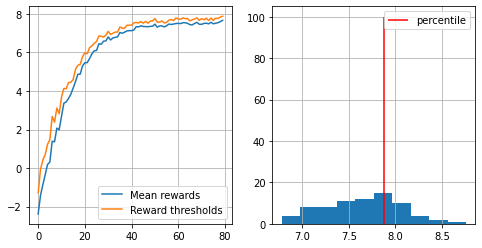

80
CPU times: user 3.33 s, sys: 69.4 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.594, threshold=7.780


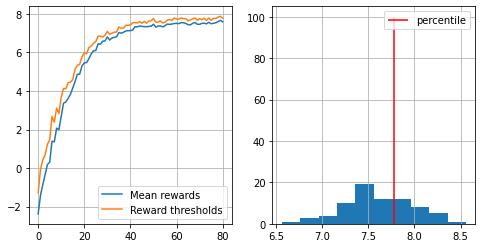

81
CPU times: user 3.43 s, sys: 85.6 ms, total: 3.51 s
Wall time: 3.43 s
mean reward = 7.621, threshold=7.880


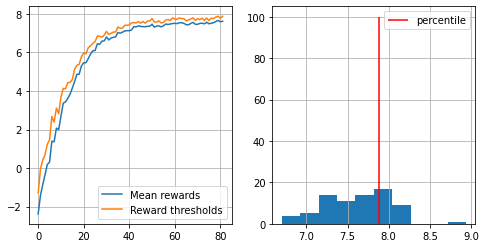

82
CPU times: user 3.52 s, sys: 84.3 ms, total: 3.6 s
Wall time: 3.52 s
mean reward = 7.525, threshold=7.776


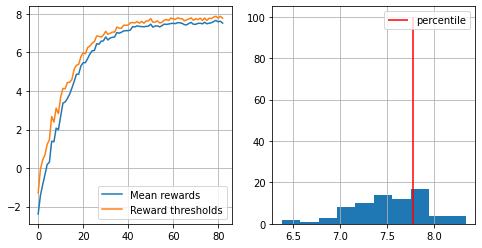

83
CPU times: user 3.37 s, sys: 75.7 ms, total: 3.45 s
Wall time: 3.39 s
mean reward = 7.580, threshold=7.740


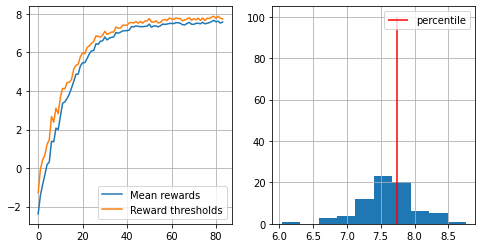

84
CPU times: user 3.35 s, sys: 82.7 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.607, threshold=7.880


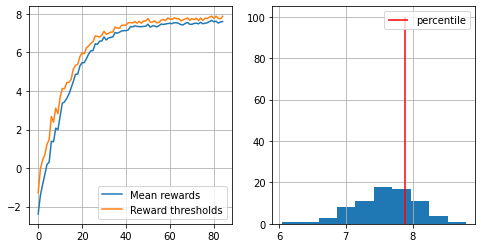

85
CPU times: user 3.36 s, sys: 72 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.576, threshold=7.720


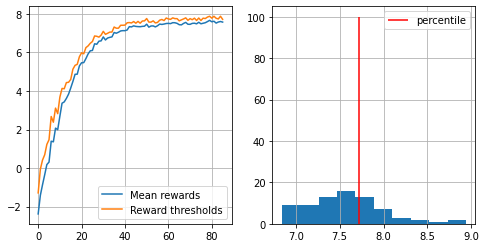

86
CPU times: user 3.35 s, sys: 64.4 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.536, threshold=7.760


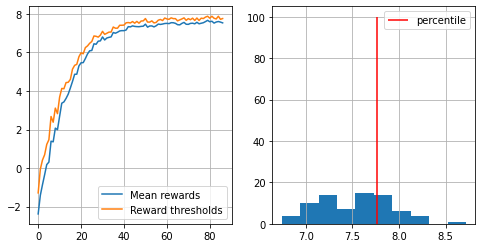

87
CPU times: user 3.33 s, sys: 80.4 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.625, threshold=7.876


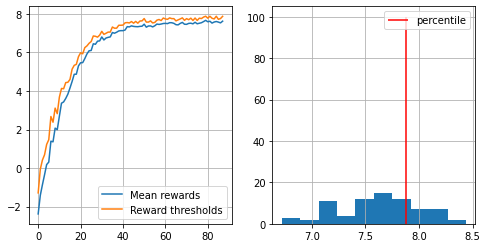

88
CPU times: user 3.33 s, sys: 61.2 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.540, threshold=7.712


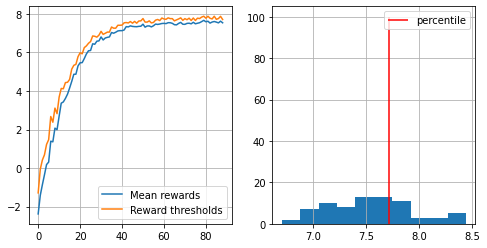

89
CPU times: user 3.33 s, sys: 75.9 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.570, threshold=7.796


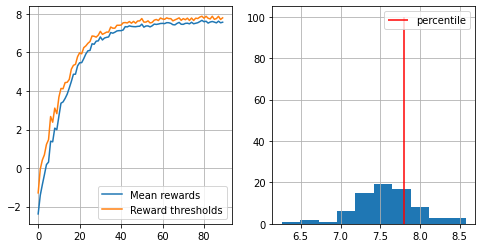

90
CPU times: user 3.35 s, sys: 70.2 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.577, threshold=7.836


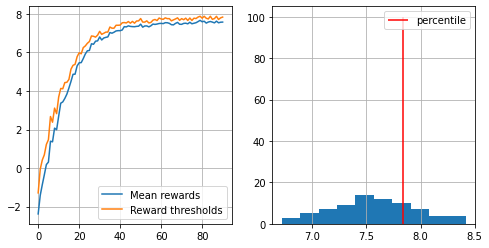

91
CPU times: user 3.4 s, sys: 78.2 ms, total: 3.48 s
Wall time: 3.4 s
mean reward = 7.617, threshold=7.792


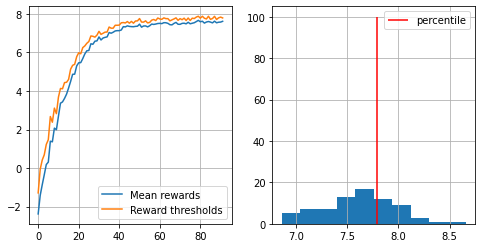

92
CPU times: user 3.34 s, sys: 99.5 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.636, threshold=7.812


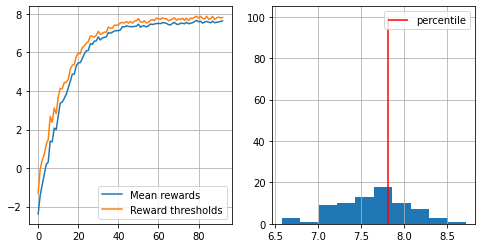

93
CPU times: user 3.31 s, sys: 59 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.623, threshold=7.852


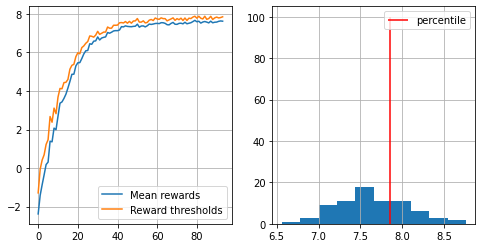

94
CPU times: user 3.34 s, sys: 86.9 ms, total: 3.43 s
Wall time: 3.35 s
mean reward = 7.585, threshold=7.836


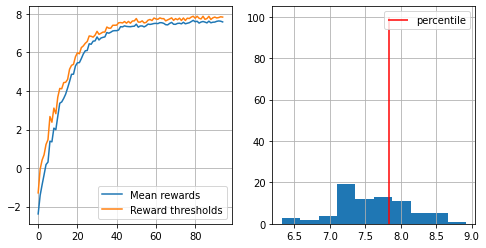

95
CPU times: user 3.38 s, sys: 95 ms, total: 3.47 s
Wall time: 3.38 s
mean reward = 7.536, threshold=7.780


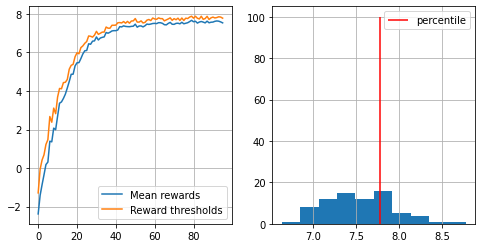

96
CPU times: user 3.32 s, sys: 61.1 ms, total: 3.38 s
Wall time: 3.32 s
mean reward = 7.692, threshold=7.952


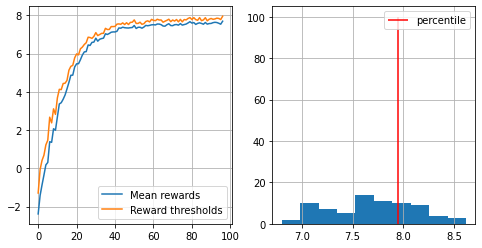

97
CPU times: user 3.35 s, sys: 97.5 ms, total: 3.45 s
Wall time: 3.36 s
mean reward = 7.577, threshold=7.760


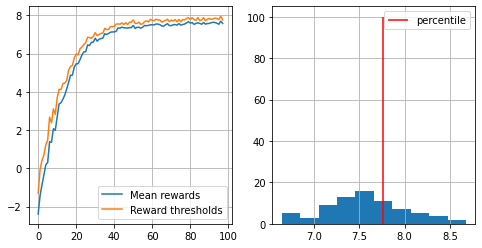

98
CPU times: user 3.36 s, sys: 100 ms, total: 3.46 s
Wall time: 3.38 s
mean reward = 7.625, threshold=7.896


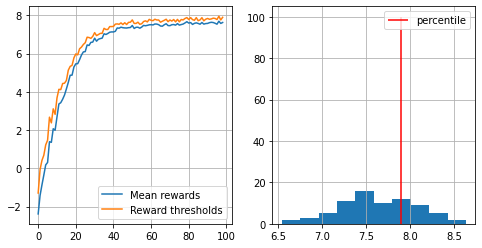

99
CPU times: user 3.39 s, sys: 63.4 ms, total: 3.45 s
Wall time: 3.39 s
mean reward = 7.534, threshold=7.756


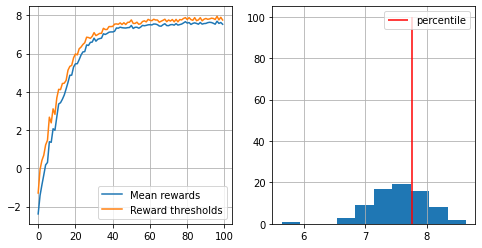

100
CPU times: user 3.32 s, sys: 62.3 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.613, threshold=7.896


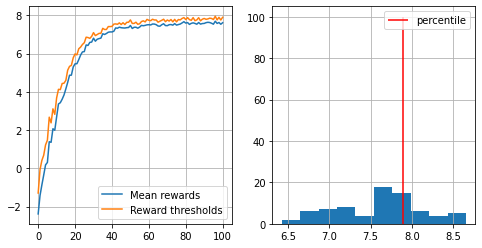

101
CPU times: user 3.35 s, sys: 92.1 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.658, threshold=7.876


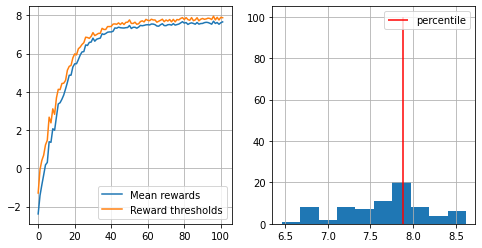

102
CPU times: user 3.3 s, sys: 60.9 ms, total: 3.36 s
Wall time: 3.3 s
mean reward = 7.618, threshold=7.876


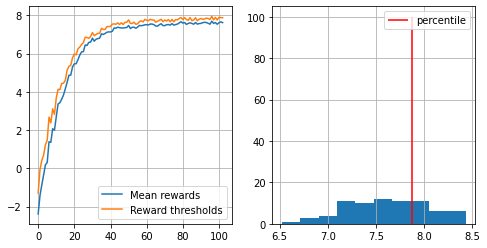

103
CPU times: user 3.32 s, sys: 80 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.674, threshold=7.876


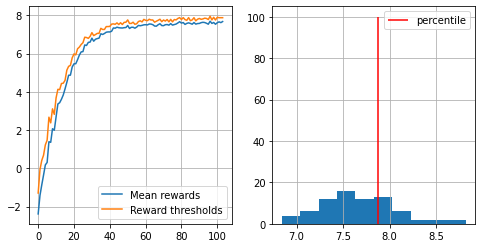

104
CPU times: user 3.33 s, sys: 60.5 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.572, threshold=7.836


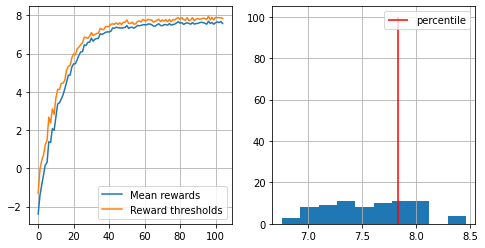

105
CPU times: user 3.51 s, sys: 109 ms, total: 3.62 s
Wall time: 3.53 s
mean reward = 7.614, threshold=7.900


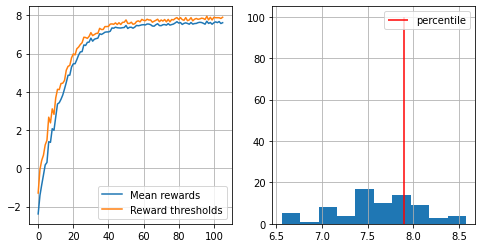

106
CPU times: user 3.32 s, sys: 72.5 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.658, threshold=7.820


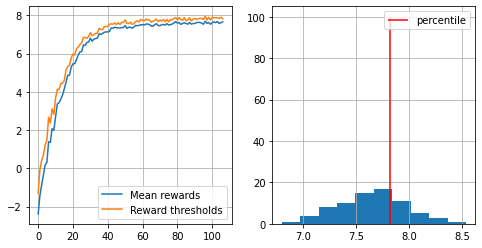

107
CPU times: user 3.35 s, sys: 63.5 ms, total: 3.41 s
Wall time: 3.35 s
mean reward = 7.655, threshold=7.860


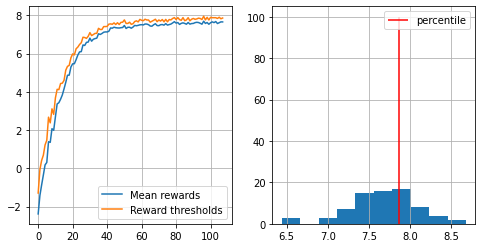

108
CPU times: user 3.31 s, sys: 75.8 ms, total: 3.39 s
Wall time: 3.35 s
mean reward = 7.709, threshold=7.896


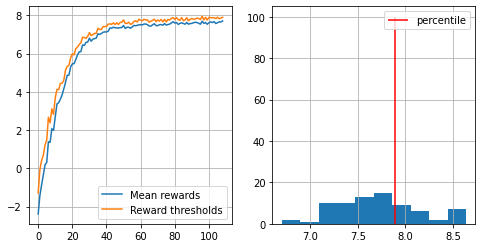

109
CPU times: user 3.34 s, sys: 91 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.728, threshold=7.960


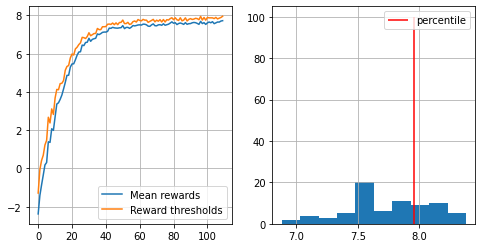

110
CPU times: user 3.33 s, sys: 56.7 ms, total: 3.38 s
Wall time: 3.32 s
mean reward = 7.687, threshold=7.880


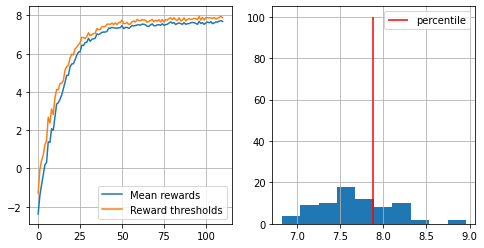

111
CPU times: user 3.3 s, sys: 70.3 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.672, threshold=7.840


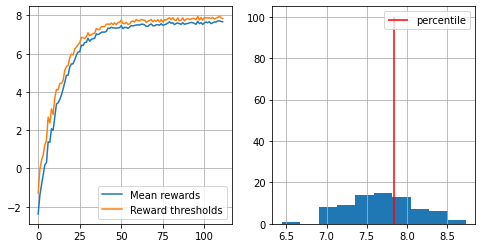

112
CPU times: user 3.35 s, sys: 86.3 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.661, threshold=7.920


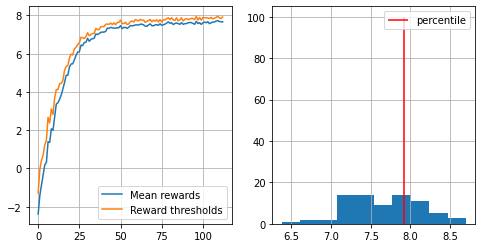

113
CPU times: user 3.3 s, sys: 62.8 ms, total: 3.36 s
Wall time: 3.3 s
mean reward = 7.646, threshold=7.860


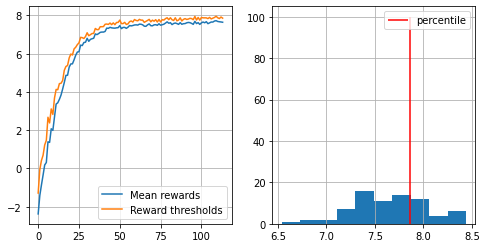

114
CPU times: user 3.36 s, sys: 85 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.697, threshold=7.856


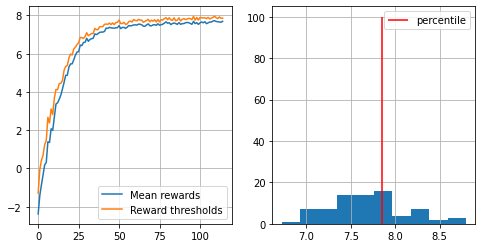

115
CPU times: user 3.41 s, sys: 92.6 ms, total: 3.51 s
Wall time: 3.42 s
mean reward = 7.694, threshold=7.880


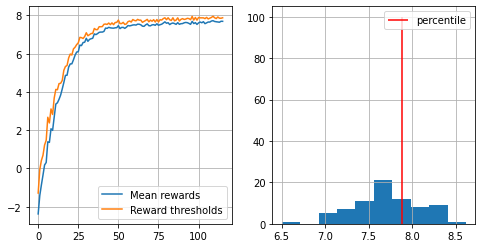

116
CPU times: user 3.34 s, sys: 105 ms, total: 3.45 s
Wall time: 3.35 s
mean reward = 7.695, threshold=7.960


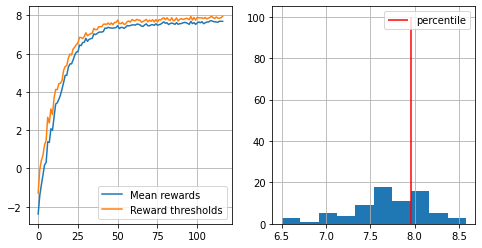

117
CPU times: user 3.33 s, sys: 81.5 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.656, threshold=7.900


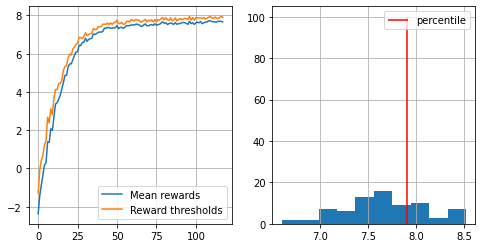

118
CPU times: user 3.29 s, sys: 68.8 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.778, threshold=8.000


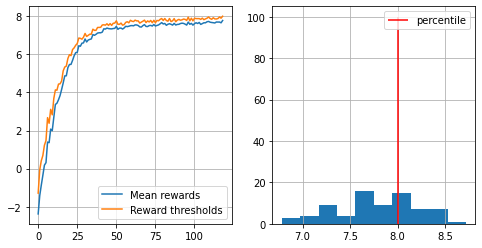

119
CPU times: user 3.3 s, sys: 73.9 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.701, threshold=7.980


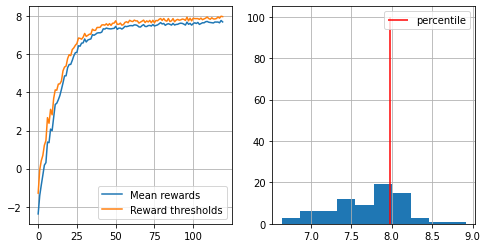

120
CPU times: user 3.31 s, sys: 81.3 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.710, threshold=7.960


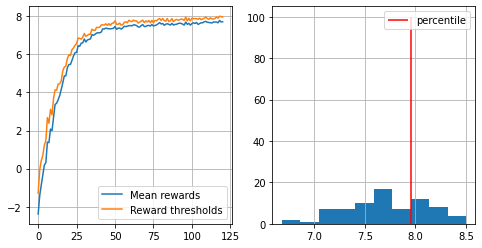

121
CPU times: user 3.35 s, sys: 80.3 ms, total: 3.43 s
Wall time: 3.35 s
mean reward = 7.568, threshold=7.800


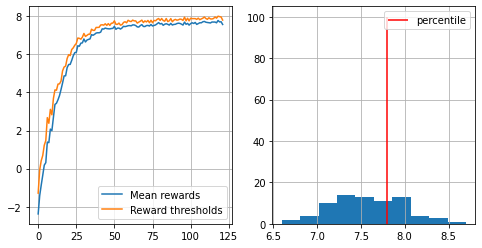

122
CPU times: user 3.34 s, sys: 91 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.627, threshold=7.956


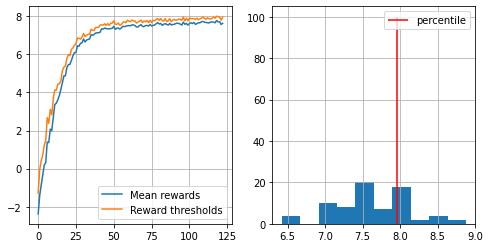

123
CPU times: user 3.32 s, sys: 65.8 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.619, threshold=7.840


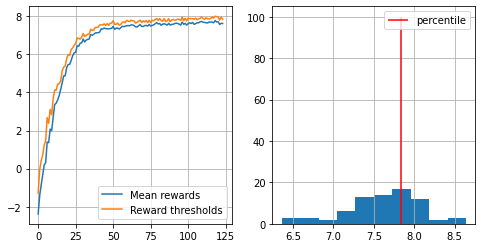

124
CPU times: user 3.39 s, sys: 96.4 ms, total: 3.49 s
Wall time: 3.41 s
mean reward = 7.639, threshold=7.832


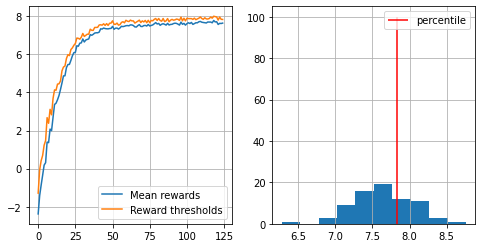

125
CPU times: user 3.31 s, sys: 85.7 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.757, threshold=7.956


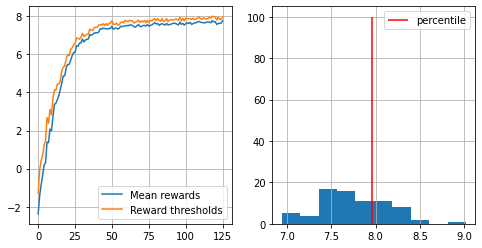

126
CPU times: user 3.3 s, sys: 75.1 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.722, threshold=7.916


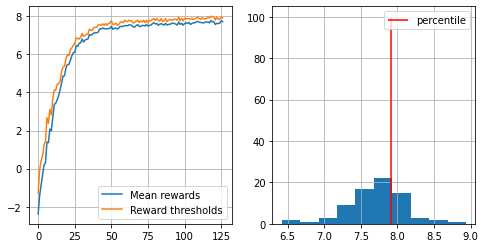

127
CPU times: user 3.3 s, sys: 64.8 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.718, threshold=7.876


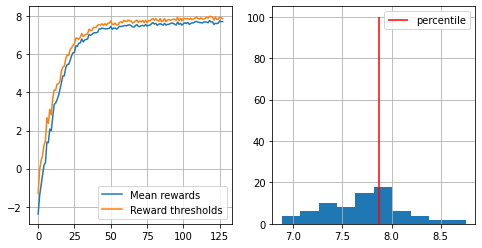

128
CPU times: user 3.31 s, sys: 66.9 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.622, threshold=7.880


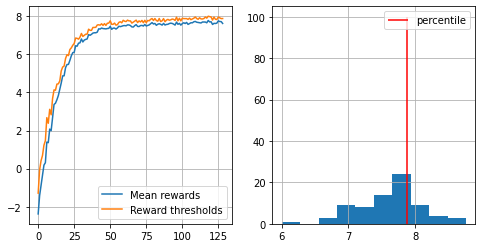

129
CPU times: user 3.31 s, sys: 58.7 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.652, threshold=7.856


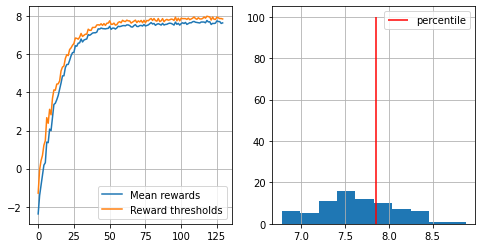

130
CPU times: user 3.35 s, sys: 74.1 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.597, threshold=7.840


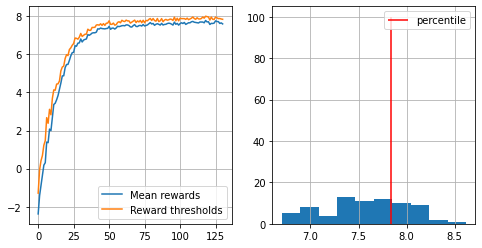

131
CPU times: user 3.32 s, sys: 73.2 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.722, threshold=7.936


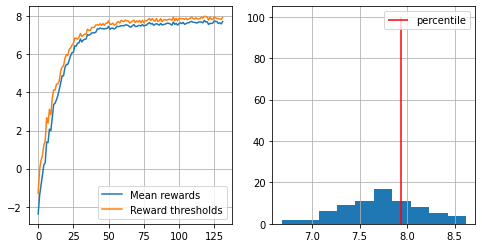

132
CPU times: user 3.36 s, sys: 60.7 ms, total: 3.42 s
Wall time: 3.36 s
mean reward = 7.653, threshold=7.888


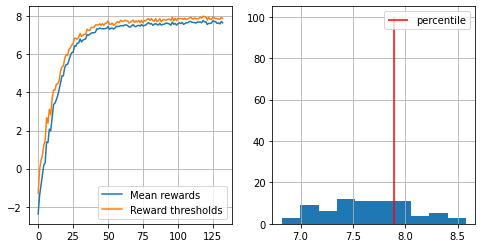

133
CPU times: user 3.33 s, sys: 78.2 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.658, threshold=7.840


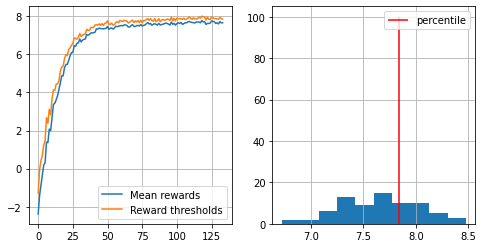

134
CPU times: user 3.34 s, sys: 95.3 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.782, threshold=8.012


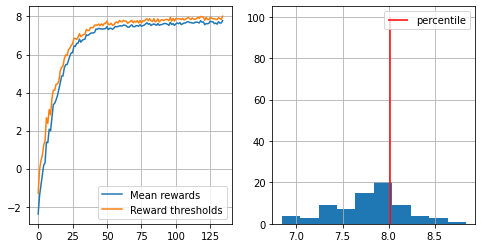

135
CPU times: user 3.33 s, sys: 84.5 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.679, threshold=7.892


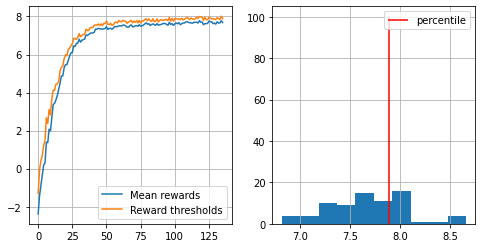

136
CPU times: user 3.3 s, sys: 71.9 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.807, threshold=8.036


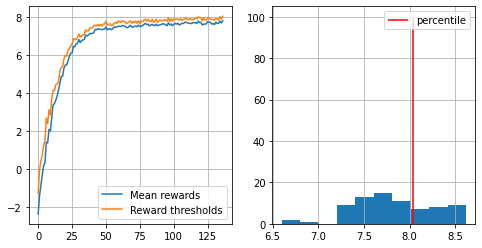

137
CPU times: user 3.46 s, sys: 113 ms, total: 3.57 s
Wall time: 3.5 s
mean reward = 7.672, threshold=7.936


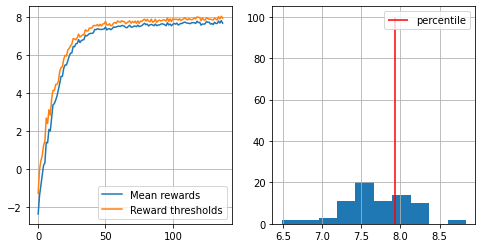

138
CPU times: user 3.39 s, sys: 96.9 ms, total: 3.49 s
Wall time: 3.4 s
mean reward = 7.679, threshold=7.916


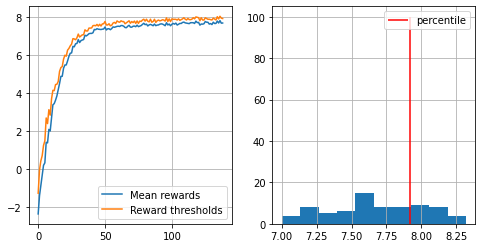

139
CPU times: user 3.33 s, sys: 70.6 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.706, threshold=7.896


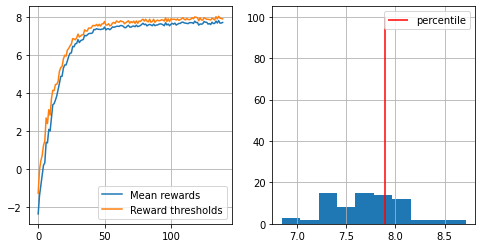

140
CPU times: user 3.39 s, sys: 58.2 ms, total: 3.45 s
Wall time: 3.39 s
mean reward = 7.615, threshold=7.840


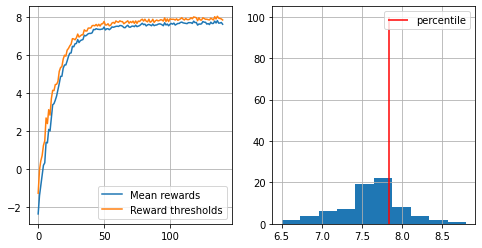

141
CPU times: user 3.32 s, sys: 74 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.793, threshold=8.020


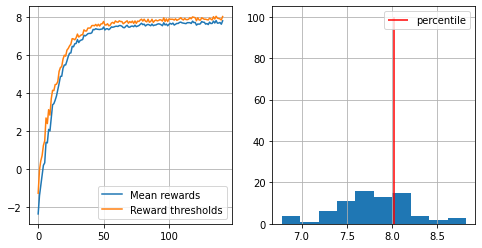

142
CPU times: user 3.3 s, sys: 98.8 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.839, threshold=8.072


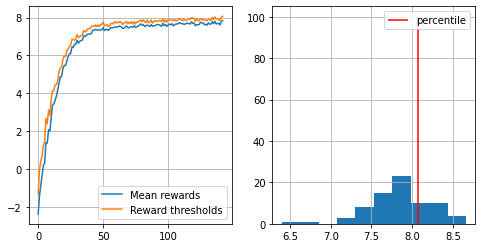

143
CPU times: user 3.3 s, sys: 60 ms, total: 3.36 s
Wall time: 3.3 s
mean reward = 7.666, threshold=7.872


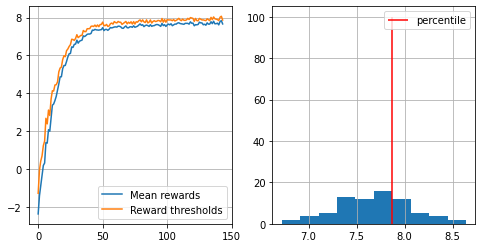

144
CPU times: user 3.33 s, sys: 85.7 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.694, threshold=7.860


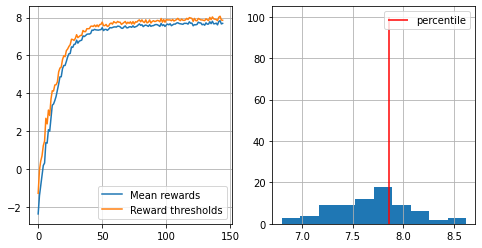

145
CPU times: user 3.33 s, sys: 84.3 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.690, threshold=7.896


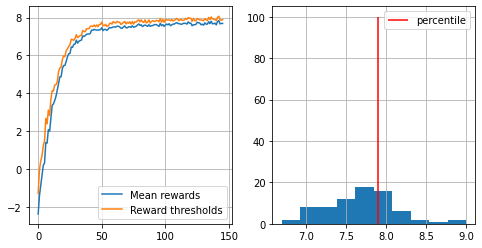

146
CPU times: user 3.29 s, sys: 57.4 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.761, threshold=7.900


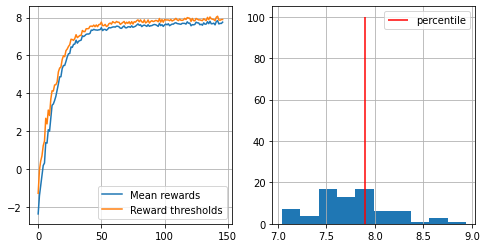

147
CPU times: user 3.36 s, sys: 61.9 ms, total: 3.42 s
Wall time: 3.36 s
mean reward = 7.709, threshold=7.912


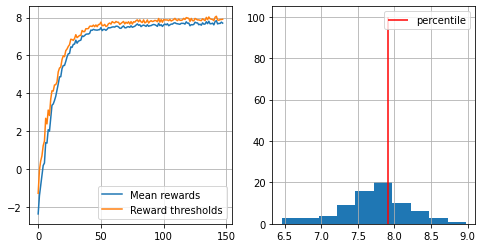

148
CPU times: user 3.38 s, sys: 88.9 ms, total: 3.47 s
Wall time: 3.39 s
mean reward = 7.779, threshold=8.056


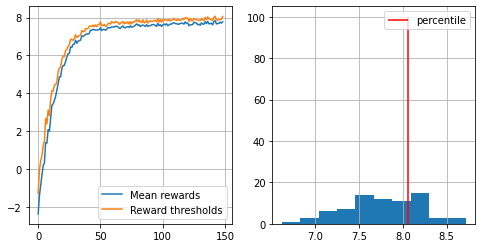

149
CPU times: user 3.32 s, sys: 66 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.524, threshold=7.780


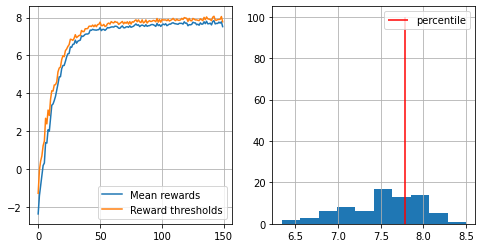

150
CPU times: user 3.38 s, sys: 83.7 ms, total: 3.47 s
Wall time: 3.39 s
mean reward = 7.684, threshold=7.940


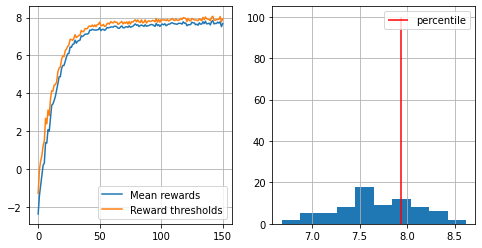

151
CPU times: user 3.31 s, sys: 87.6 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.652, threshold=7.936


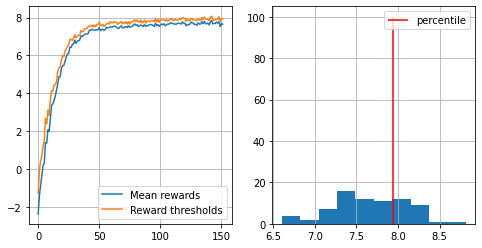

152
CPU times: user 3.3 s, sys: 69.6 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.666, threshold=7.880


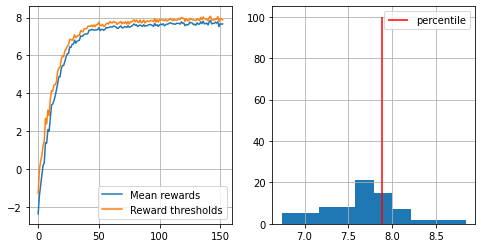

153
CPU times: user 3.3 s, sys: 76.5 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.637, threshold=7.820


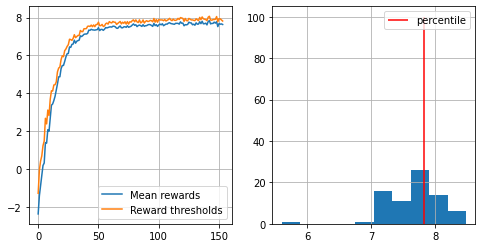

154
CPU times: user 3.34 s, sys: 110 ms, total: 3.45 s
Wall time: 3.36 s
mean reward = 7.695, threshold=7.856


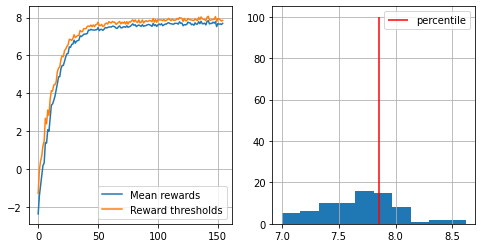

155
CPU times: user 3.3 s, sys: 69.9 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.706, threshold=7.972


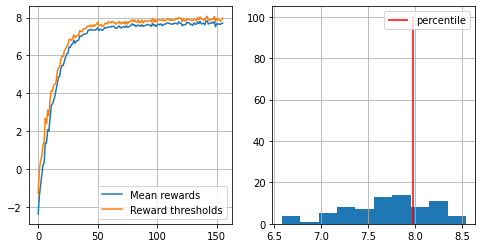

156
CPU times: user 3.37 s, sys: 96.9 ms, total: 3.47 s
Wall time: 3.38 s
mean reward = 7.738, threshold=7.972


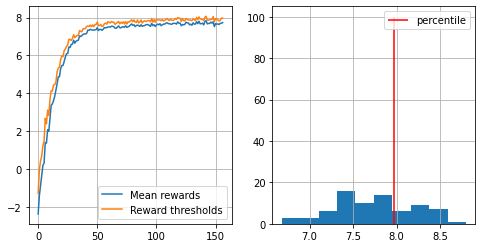

157
CPU times: user 3.29 s, sys: 86.5 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.728, threshold=7.952


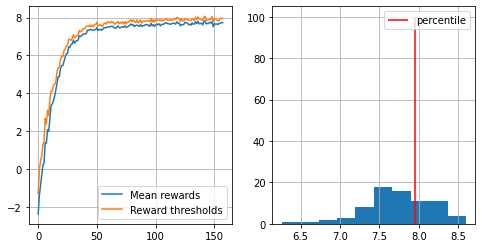

158
CPU times: user 3.29 s, sys: 67.1 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.669, threshold=7.860


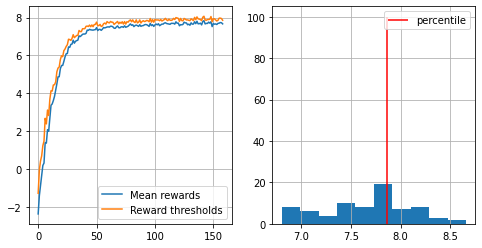

159
CPU times: user 3.28 s, sys: 87.1 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.802, threshold=8.036


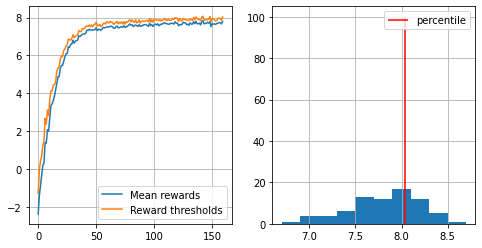

160
CPU times: user 3.36 s, sys: 142 ms, total: 3.5 s
Wall time: 3.39 s
mean reward = 7.759, threshold=8.016


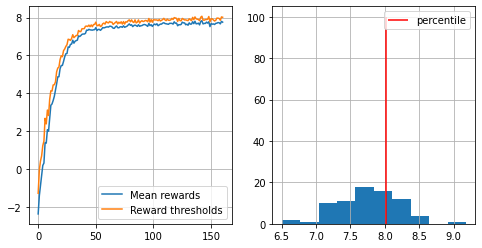

161
CPU times: user 3.28 s, sys: 69.5 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.825, threshold=8.088


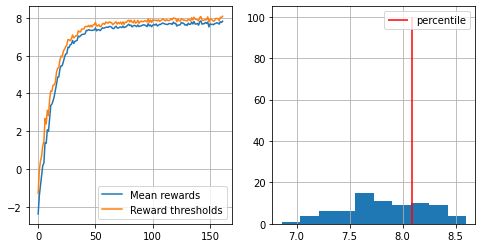

162
CPU times: user 3.32 s, sys: 106 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.783, threshold=8.000


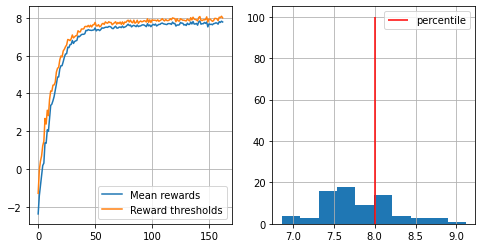

163
CPU times: user 3.27 s, sys: 60.7 ms, total: 3.33 s
Wall time: 3.27 s
mean reward = 7.767, threshold=7.920


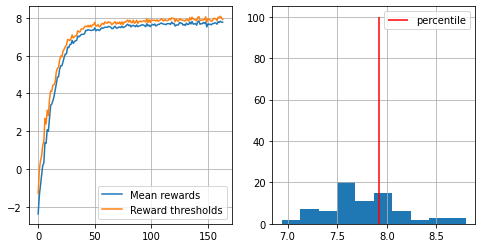

164
CPU times: user 3.32 s, sys: 75 ms, total: 3.39 s
Wall time: 3.33 s
mean reward = 7.683, threshold=7.836


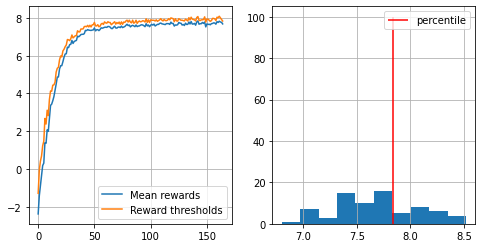

165
CPU times: user 3.43 s, sys: 59.9 ms, total: 3.49 s
Wall time: 3.43 s
mean reward = 7.758, threshold=7.996


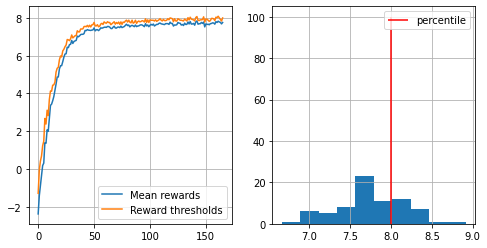

166
CPU times: user 3.34 s, sys: 72 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.717, threshold=7.976


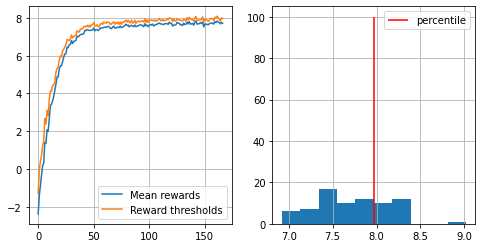

167
CPU times: user 3.31 s, sys: 91.1 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.721, threshold=7.876


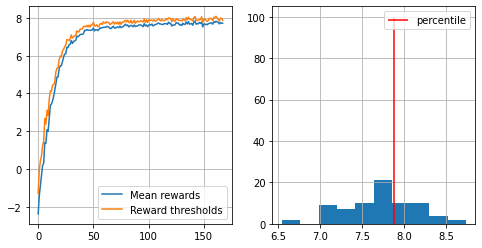

168
CPU times: user 3.28 s, sys: 62.7 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.760, threshold=7.916


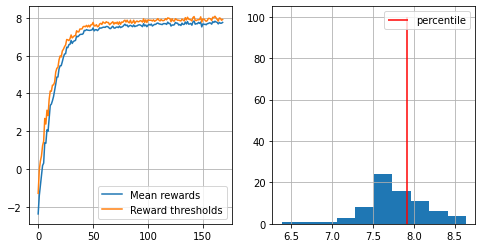

169
CPU times: user 3.55 s, sys: 75.3 ms, total: 3.63 s
Wall time: 3.59 s
mean reward = 7.800, threshold=7.900


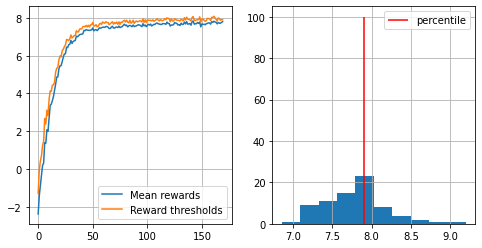

170
CPU times: user 3.52 s, sys: 87.6 ms, total: 3.6 s
Wall time: 3.53 s
mean reward = 7.758, threshold=7.876


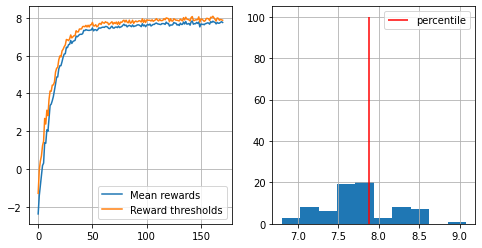

171
CPU times: user 3.35 s, sys: 58.7 ms, total: 3.41 s
Wall time: 3.35 s
mean reward = 7.813, threshold=7.940


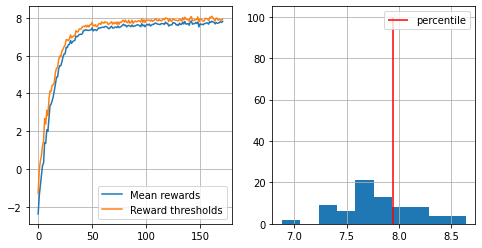

172
CPU times: user 3.39 s, sys: 82 ms, total: 3.47 s
Wall time: 3.4 s
mean reward = 7.797, threshold=7.992


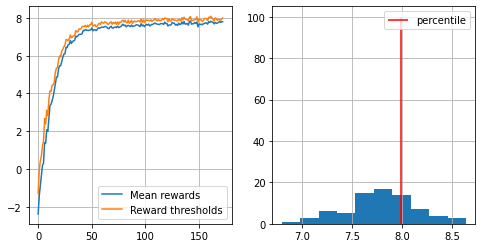

173
CPU times: user 3.28 s, sys: 65 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.799, threshold=8.020


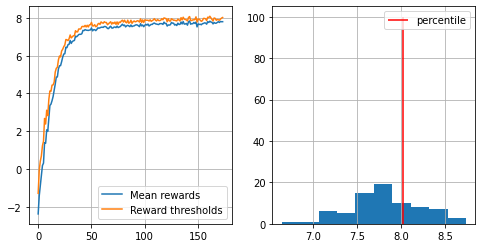

174
CPU times: user 3.32 s, sys: 85.5 ms, total: 3.41 s
Wall time: 3.32 s
mean reward = 7.707, threshold=7.876


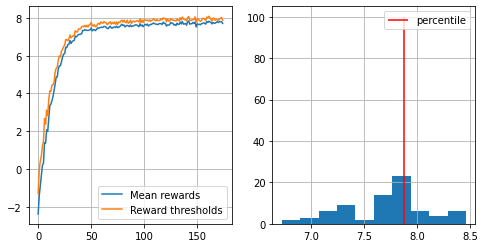

175
CPU times: user 3.3 s, sys: 57.7 ms, total: 3.35 s
Wall time: 3.29 s
mean reward = 7.774, threshold=7.936


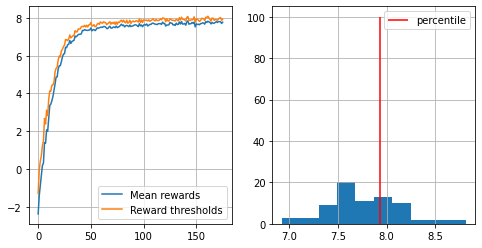

176
CPU times: user 3.3 s, sys: 83.9 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.761, threshold=8.040


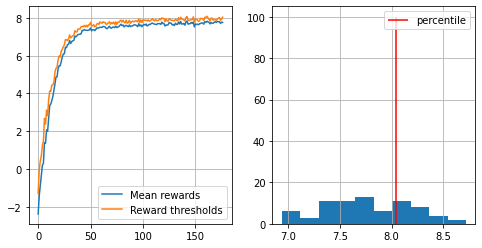

177
CPU times: user 3.31 s, sys: 61.5 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.692, threshold=7.916


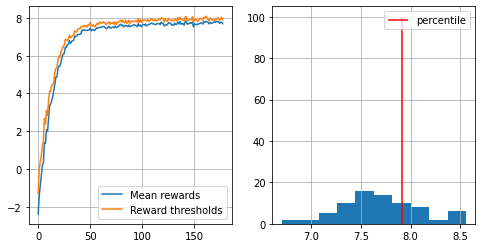

178
CPU times: user 3.28 s, sys: 59.5 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.719, threshold=7.896


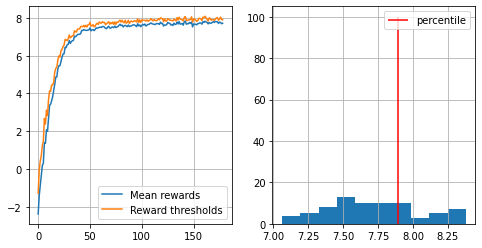

179
CPU times: user 3.32 s, sys: 81.8 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.677, threshold=7.940


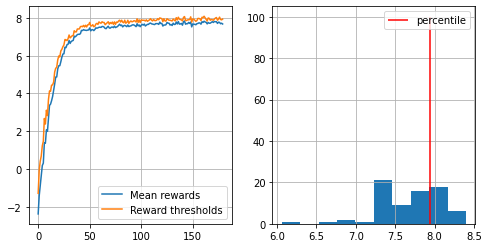

180
CPU times: user 3.27 s, sys: 52.3 ms, total: 3.32 s
Wall time: 3.27 s
mean reward = 7.773, threshold=7.956


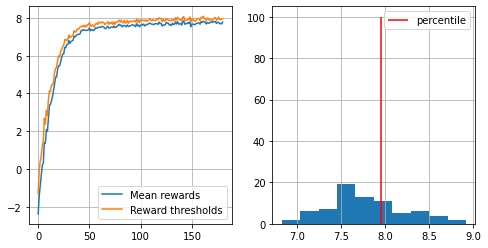

181
CPU times: user 3.39 s, sys: 71.5 ms, total: 3.46 s
Wall time: 3.4 s
mean reward = 7.650, threshold=7.860


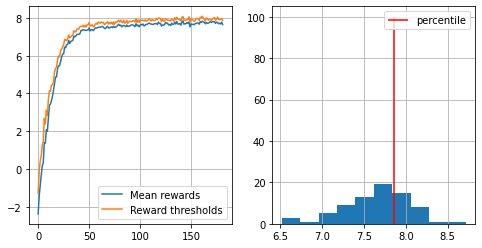

182
CPU times: user 3.29 s, sys: 79.5 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.745, threshold=7.920


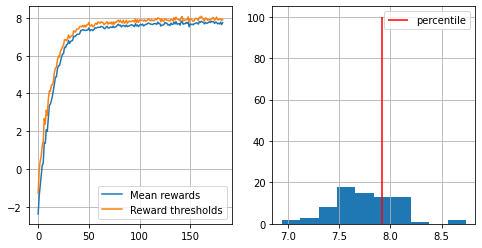

183
CPU times: user 3.29 s, sys: 72.5 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.791, threshold=8.052


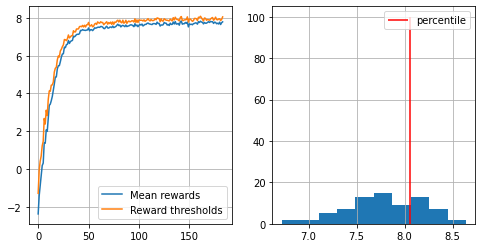

184
CPU times: user 3.29 s, sys: 67.5 ms, total: 3.36 s
Wall time: 3.3 s
mean reward = 7.647, threshold=7.916


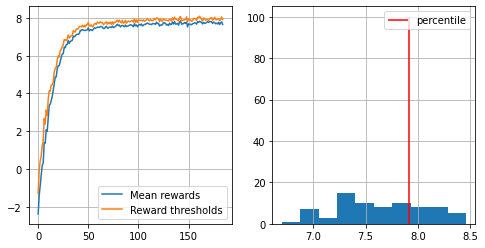

185
CPU times: user 3.27 s, sys: 68.9 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.830, threshold=8.052


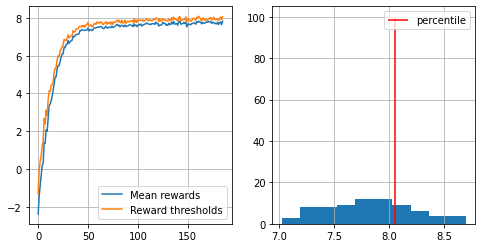

186
CPU times: user 3.26 s, sys: 53.4 ms, total: 3.32 s
Wall time: 3.26 s
mean reward = 7.715, threshold=7.940


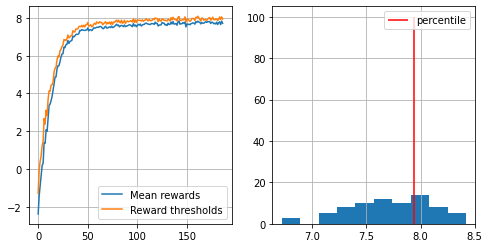

187
CPU times: user 3.29 s, sys: 70.5 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.726, threshold=7.896


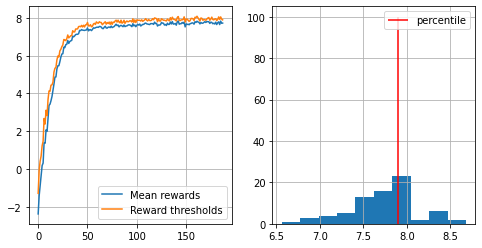

188
CPU times: user 3.35 s, sys: 111 ms, total: 3.46 s
Wall time: 3.37 s
mean reward = 7.755, threshold=8.036


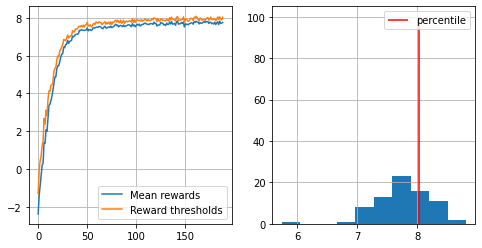

189
CPU times: user 3.35 s, sys: 65.4 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.724, threshold=7.940


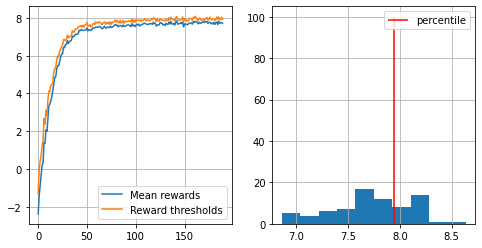

190
CPU times: user 3.29 s, sys: 71.7 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.823, threshold=7.980


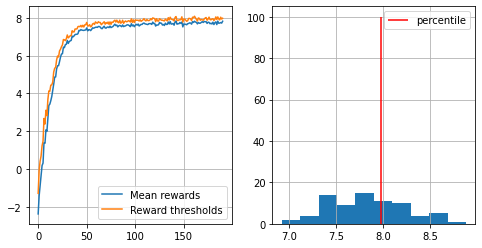

191
CPU times: user 3.34 s, sys: 112 ms, total: 3.45 s
Wall time: 3.36 s
mean reward = 7.779, threshold=7.956


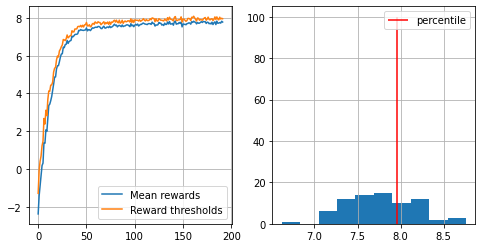

192
CPU times: user 3.3 s, sys: 88.2 ms, total: 3.39 s
Wall time: 3.3 s
mean reward = 7.779, threshold=7.936


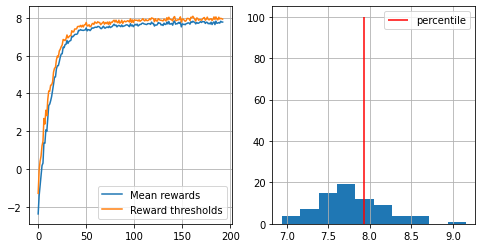

193
CPU times: user 3.32 s, sys: 91.9 ms, total: 3.41 s
Wall time: 3.32 s
mean reward = 7.794, threshold=8.032


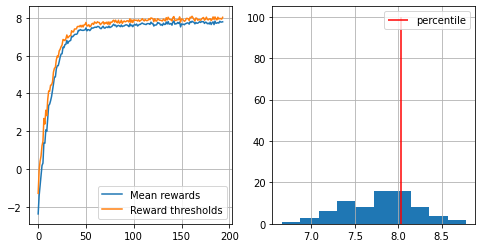

194
CPU times: user 3.29 s, sys: 69.3 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.817, threshold=8.016


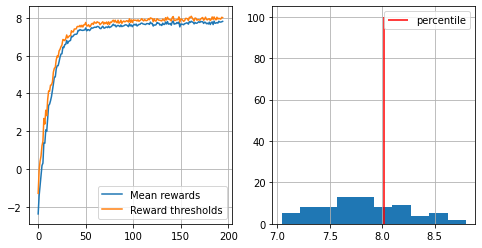

195
CPU times: user 3.33 s, sys: 96.5 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.785, threshold=7.916


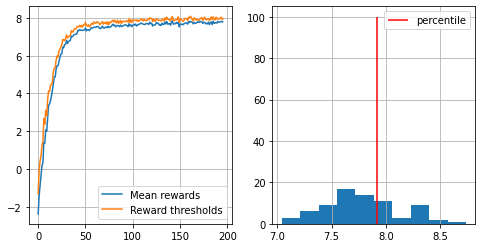

196
CPU times: user 3.28 s, sys: 70.6 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.833, threshold=8.060


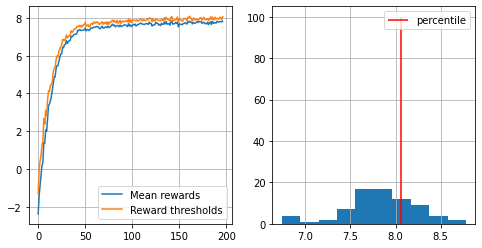

197
CPU times: user 3.4 s, sys: 86.1 ms, total: 3.49 s
Wall time: 3.41 s
mean reward = 7.766, threshold=7.916


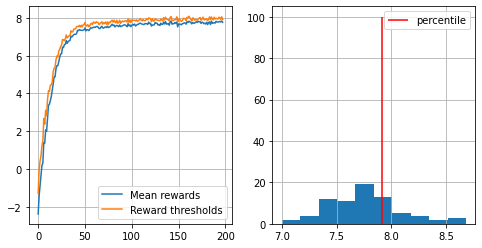

198
CPU times: user 3.31 s, sys: 66.3 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.675, threshold=7.896


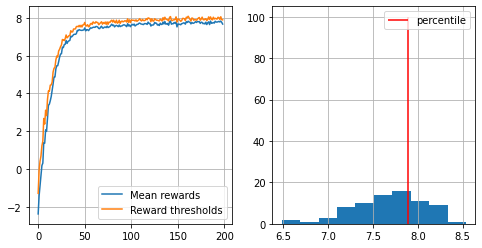

199
CPU times: user 3.33 s, sys: 97 ms, total: 3.42 s
Wall time: 3.34 s
mean reward = 7.804, threshold=7.996


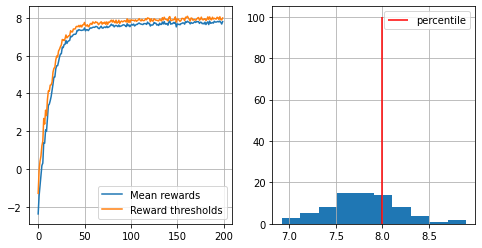

200
CPU times: user 3.29 s, sys: 75.9 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.743, threshold=8.056


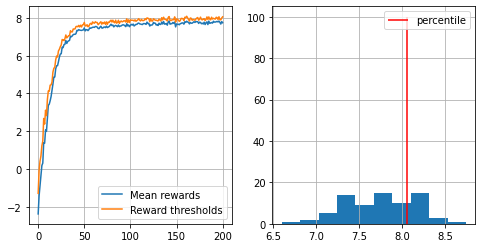

201
CPU times: user 3.31 s, sys: 66.9 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.722, threshold=7.940


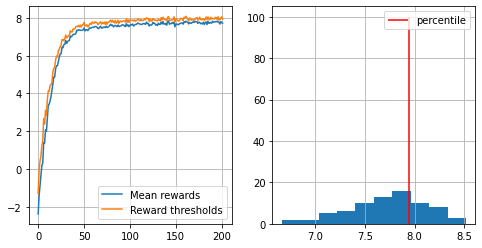

202
CPU times: user 3.3 s, sys: 82.5 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.757, threshold=7.920


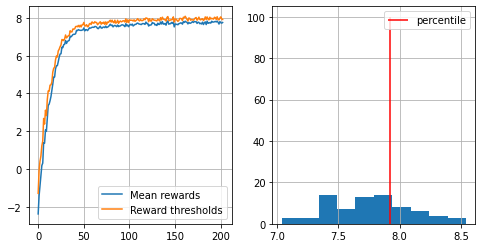

203
CPU times: user 3.52 s, sys: 112 ms, total: 3.63 s
Wall time: 3.55 s
mean reward = 7.863, threshold=8.060


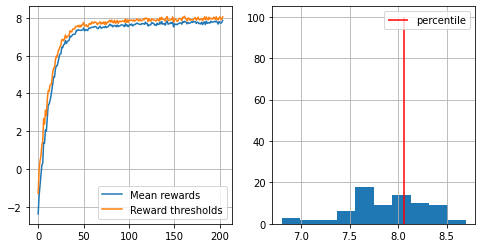

204
CPU times: user 3.3 s, sys: 67 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.762, threshold=7.900


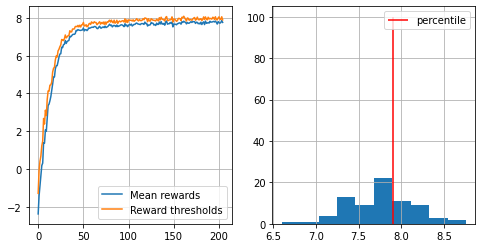

205
CPU times: user 3.27 s, sys: 57.8 ms, total: 3.33 s
Wall time: 3.27 s
mean reward = 7.802, threshold=7.976


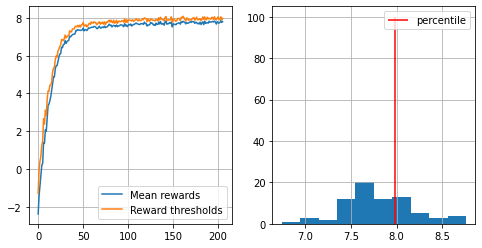

206
CPU times: user 3.32 s, sys: 60.3 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.788, threshold=7.980


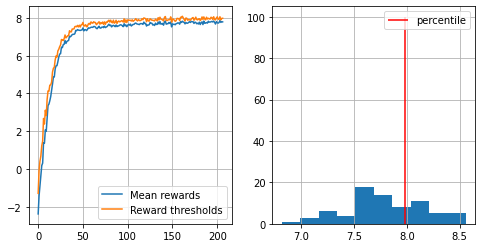

207
CPU times: user 3.29 s, sys: 86.2 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.772, threshold=7.980


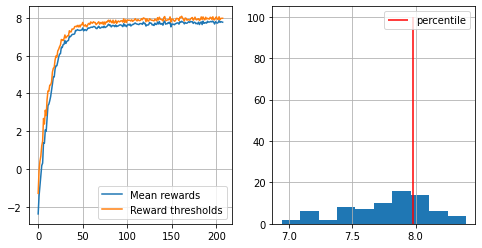

208
CPU times: user 3.27 s, sys: 72.3 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.842, threshold=8.076


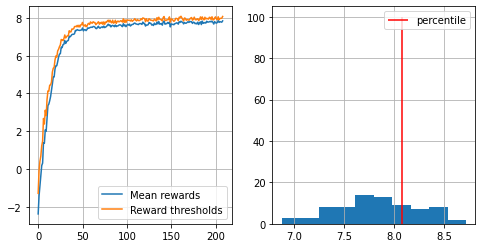

209
CPU times: user 3.29 s, sys: 80.4 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.788, threshold=7.936


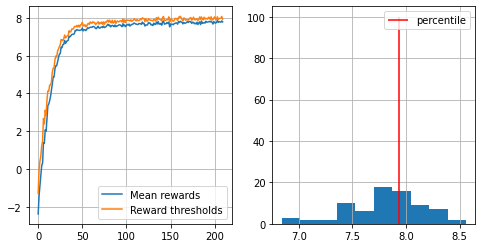

210
CPU times: user 3.33 s, sys: 94.6 ms, total: 3.42 s
Wall time: 3.34 s
mean reward = 7.727, threshold=7.896


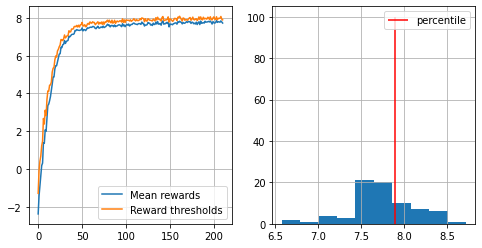

211
CPU times: user 3.28 s, sys: 76 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.835, threshold=8.076


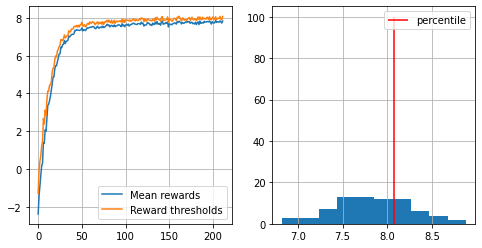

212
CPU times: user 3.29 s, sys: 72.4 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.805, threshold=8.048


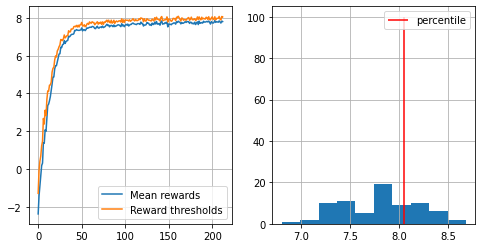

213
CPU times: user 3.29 s, sys: 69.1 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.784, threshold=7.940


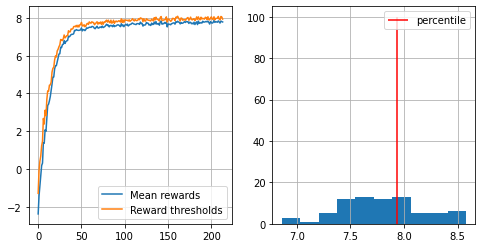

214
CPU times: user 3.35 s, sys: 64.8 ms, total: 3.41 s
Wall time: 3.35 s
mean reward = 7.714, threshold=7.900


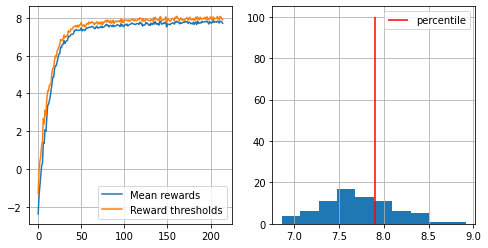

215
CPU times: user 3.29 s, sys: 62.4 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.759, threshold=7.916


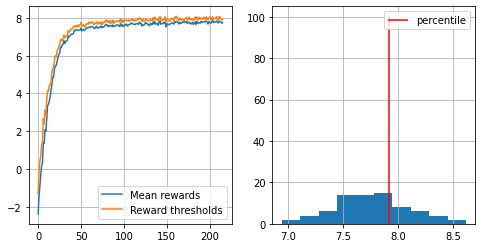

216
CPU times: user 3.34 s, sys: 102 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.748, threshold=7.936


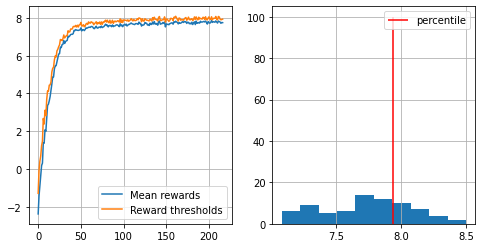

217
CPU times: user 3.28 s, sys: 52.8 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.758, threshold=7.920


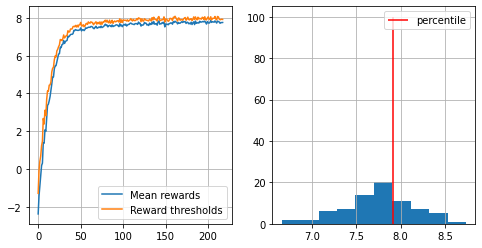

218
CPU times: user 3.29 s, sys: 82.8 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.810, threshold=8.000


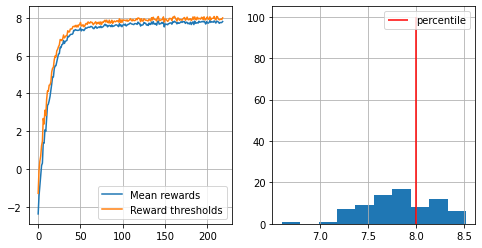

219
CPU times: user 3.27 s, sys: 57.8 ms, total: 3.33 s
Wall time: 3.27 s
mean reward = 7.751, threshold=7.996


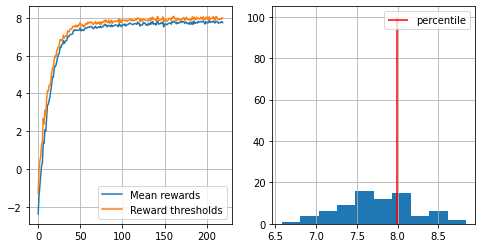

220
CPU times: user 3.27 s, sys: 70.9 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.794, threshold=8.008


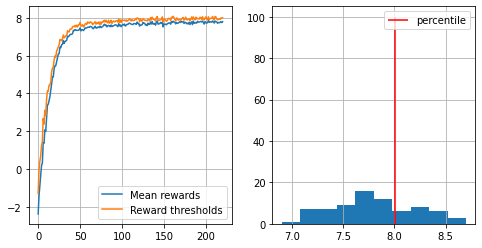

221
CPU times: user 3.3 s, sys: 72.4 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.741, threshold=7.952


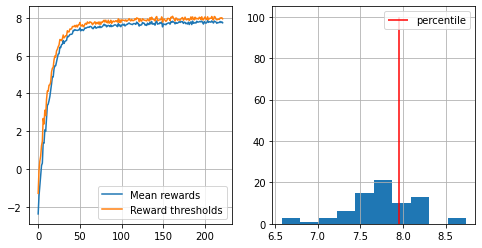

222
CPU times: user 3.35 s, sys: 95.7 ms, total: 3.45 s
Wall time: 3.35 s
mean reward = 7.768, threshold=7.996


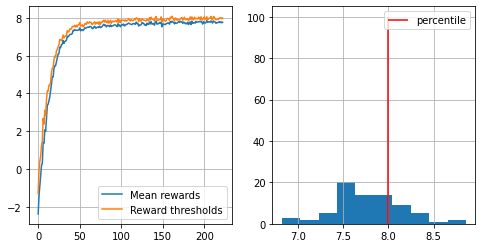

223
CPU times: user 3.26 s, sys: 52.7 ms, total: 3.31 s
Wall time: 3.25 s
mean reward = 7.774, threshold=7.980


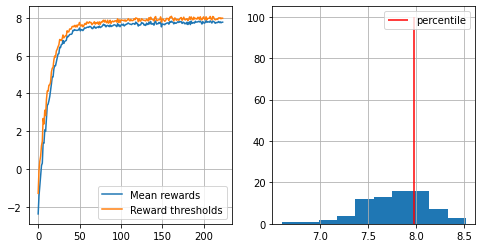

224
CPU times: user 3.3 s, sys: 93.1 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.754, threshold=7.980


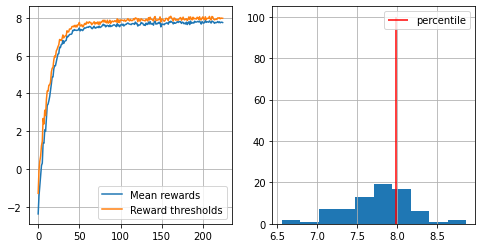

225
CPU times: user 3.29 s, sys: 70 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.671, threshold=7.860


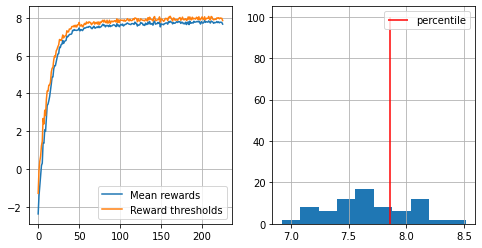

226
CPU times: user 3.31 s, sys: 74.8 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.682, threshold=7.864


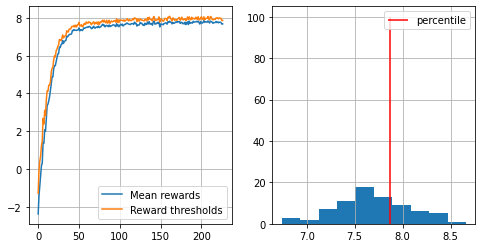

227
CPU times: user 3.34 s, sys: 88.7 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.679, threshold=7.896


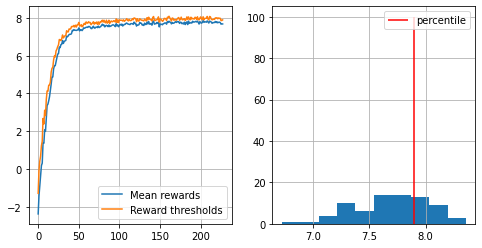

228
CPU times: user 3.32 s, sys: 98.2 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.734, threshold=7.956


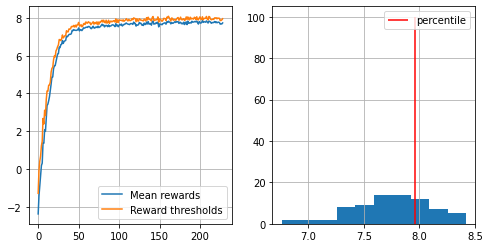

229
CPU times: user 3.29 s, sys: 59.9 ms, total: 3.35 s
Wall time: 3.29 s
mean reward = 7.753, threshold=7.940


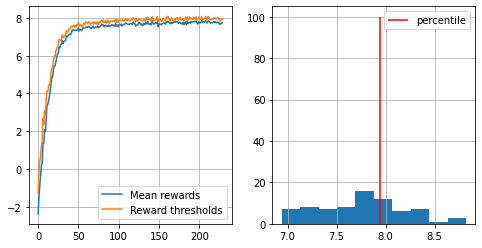

230
CPU times: user 3.34 s, sys: 63.9 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.747, threshold=7.980


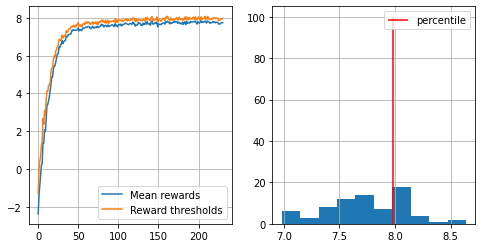

231
CPU times: user 3.31 s, sys: 76.9 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.703, threshold=7.912


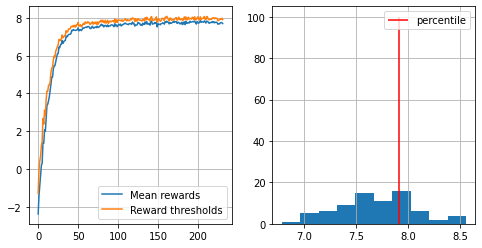

232
CPU times: user 3.35 s, sys: 68.4 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.702, threshold=7.960


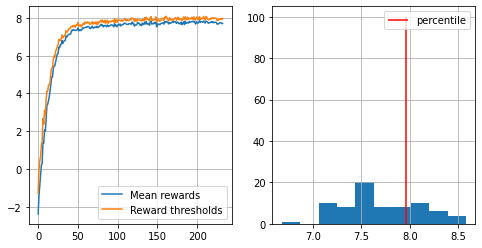

233
CPU times: user 3.29 s, sys: 76.8 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.737, threshold=7.916


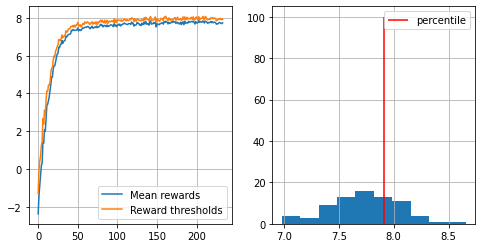

234
CPU times: user 3.31 s, sys: 90.3 ms, total: 3.4 s
Wall time: 3.31 s
mean reward = 7.741, threshold=7.920


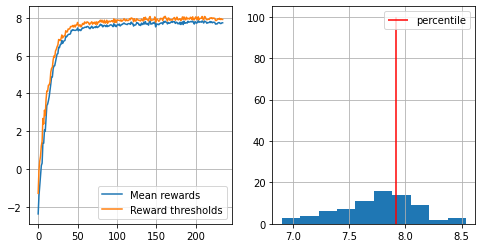

235
CPU times: user 3.32 s, sys: 81.4 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.752, threshold=7.960


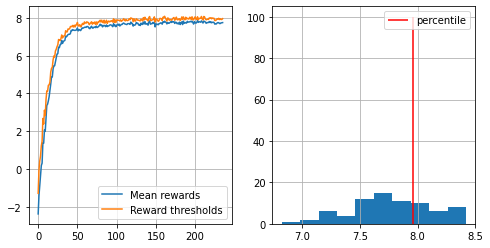

236
CPU times: user 3.5 s, sys: 120 ms, total: 3.62 s
Wall time: 3.52 s
mean reward = 7.895, threshold=8.096


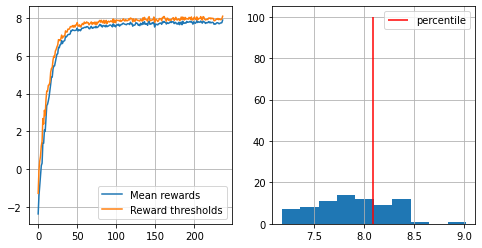

237
CPU times: user 3.39 s, sys: 63.8 ms, total: 3.45 s
Wall time: 3.4 s
mean reward = 7.697, threshold=7.936


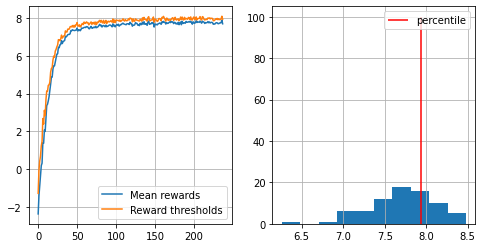

238
CPU times: user 3.28 s, sys: 66.6 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.800, threshold=8.032


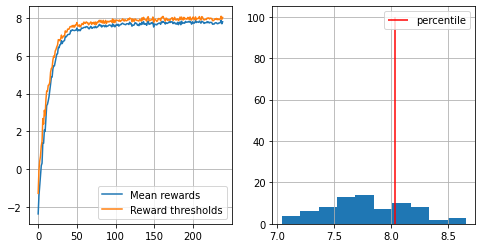

239
CPU times: user 3.27 s, sys: 62.2 ms, total: 3.33 s
Wall time: 3.26 s
mean reward = 7.828, threshold=8.120


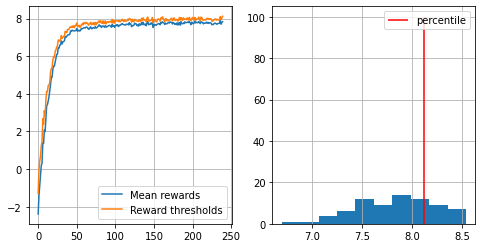

240
CPU times: user 3.31 s, sys: 81.3 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.764, threshold=7.916


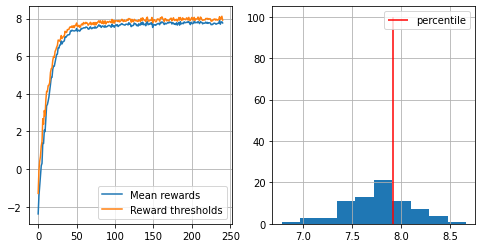

241
CPU times: user 3.3 s, sys: 72.8 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.846, threshold=8.096


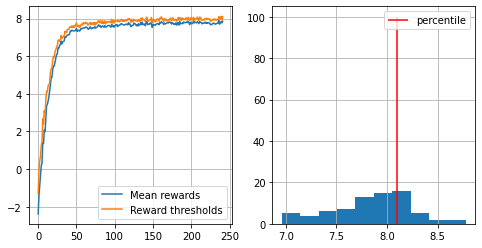

242
CPU times: user 3.31 s, sys: 64.7 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.705, threshold=7.896


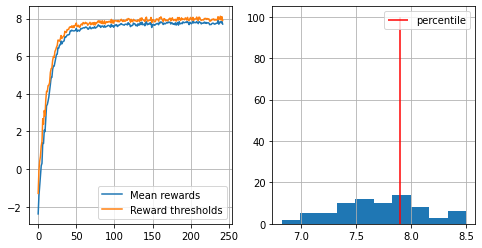

243
CPU times: user 3.28 s, sys: 69.3 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.845, threshold=8.036


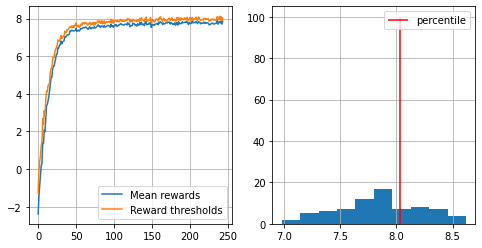

244
CPU times: user 3.26 s, sys: 55.8 ms, total: 3.32 s
Wall time: 3.26 s
mean reward = 7.790, threshold=8.000


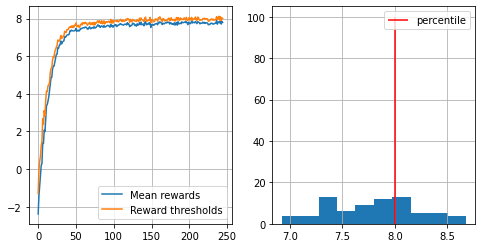

245
CPU times: user 3.29 s, sys: 59.3 ms, total: 3.35 s
Wall time: 3.29 s
mean reward = 7.712, threshold=7.976


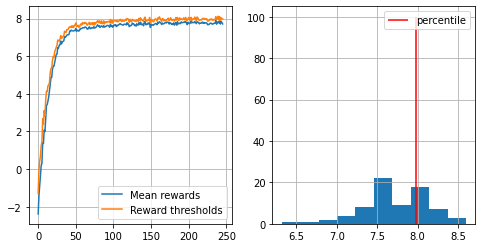

246
CPU times: user 3.31 s, sys: 92.5 ms, total: 3.4 s
Wall time: 3.31 s
mean reward = 7.775, threshold=7.940


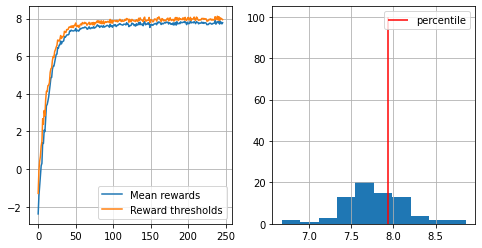

247
CPU times: user 3.36 s, sys: 74.1 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.722, threshold=7.876


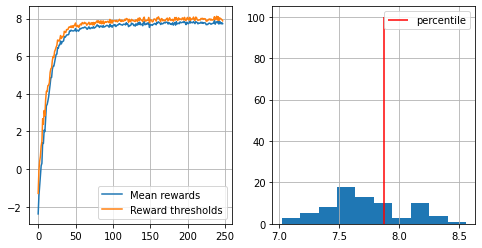

248
CPU times: user 3.27 s, sys: 51.5 ms, total: 3.32 s
Wall time: 3.26 s
mean reward = 7.781, threshold=7.976


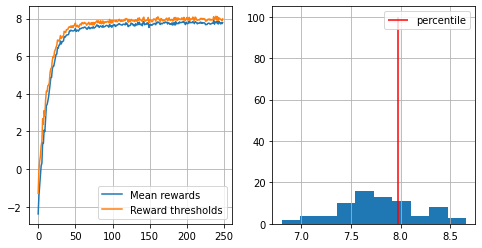

249
CPU times: user 3.29 s, sys: 55.1 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.703, threshold=7.916


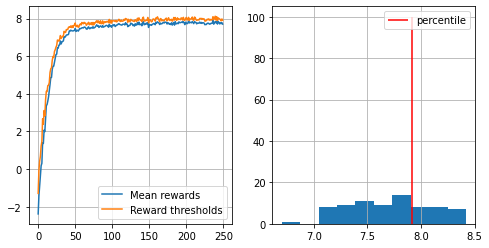

250
CPU times: user 3.29 s, sys: 93.4 ms, total: 3.39 s
Wall time: 3.3 s
mean reward = 7.834, threshold=8.016


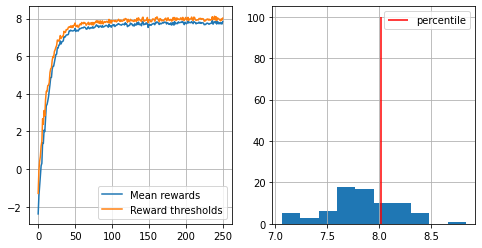

251
CPU times: user 3.3 s, sys: 80.4 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.779, threshold=8.008


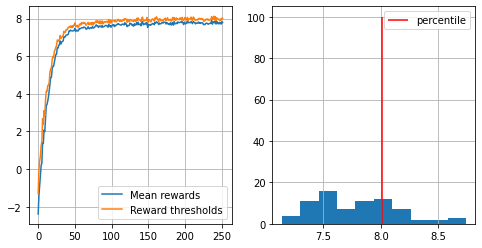

252
CPU times: user 3.28 s, sys: 81.5 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.813, threshold=7.996


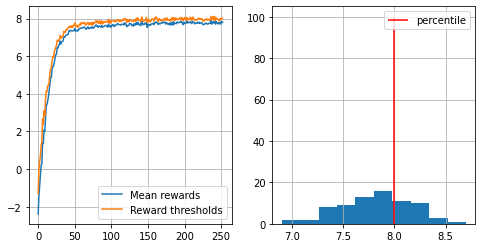

253
CPU times: user 3.3 s, sys: 67.2 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.752, threshold=7.920


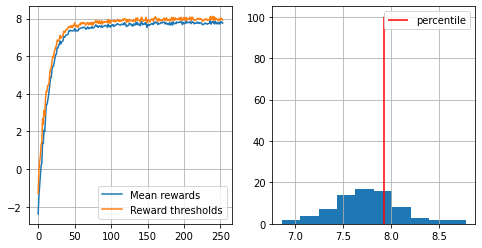

254
CPU times: user 3.28 s, sys: 65.8 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.825, threshold=8.060


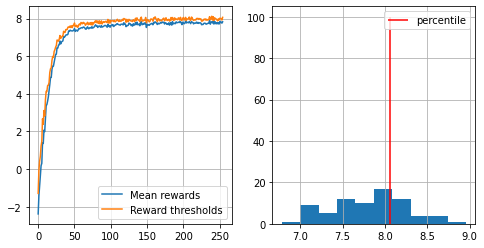

255
CPU times: user 3.43 s, sys: 59.8 ms, total: 3.49 s
Wall time: 3.43 s
mean reward = 7.813, threshold=8.012


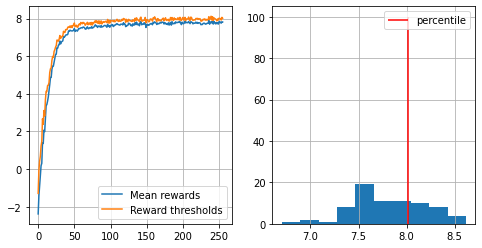

256
CPU times: user 3.25 s, sys: 50.2 ms, total: 3.3 s
Wall time: 3.25 s
mean reward = 7.790, threshold=7.960


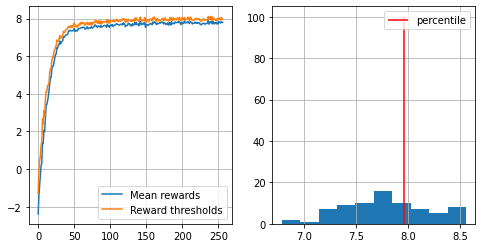

257
CPU times: user 3.32 s, sys: 111 ms, total: 3.43 s
Wall time: 3.33 s
mean reward = 7.791, threshold=8.036


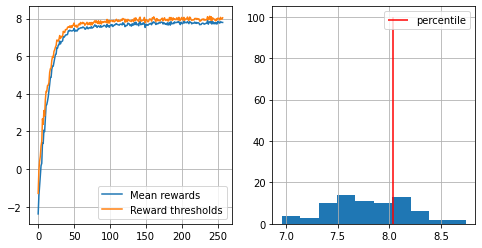

258
CPU times: user 3.29 s, sys: 85.6 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.803, threshold=7.956


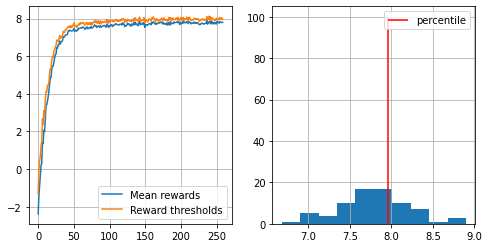

259
CPU times: user 3.36 s, sys: 59.3 ms, total: 3.42 s
Wall time: 3.36 s
mean reward = 7.724, threshold=7.940


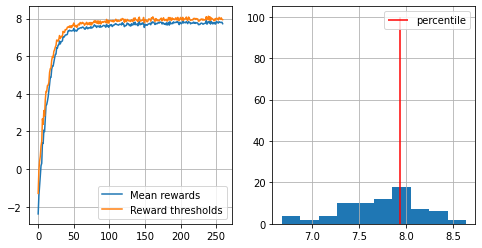

260
CPU times: user 3.3 s, sys: 71.6 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.790, threshold=7.956


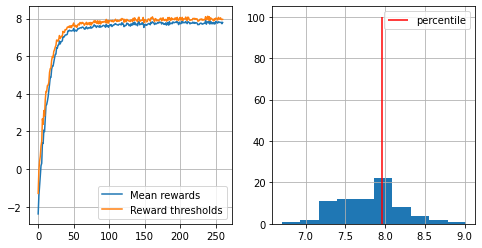

261
CPU times: user 3.48 s, sys: 72 ms, total: 3.55 s
Wall time: 3.56 s
mean reward = 7.814, threshold=8.060


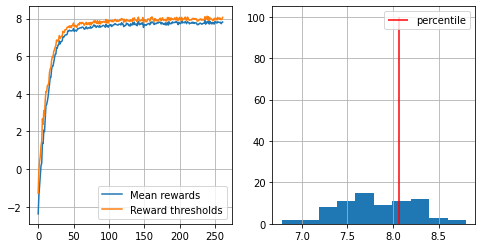

262
CPU times: user 3.92 s, sys: 107 ms, total: 4.03 s
Wall time: 4.19 s
mean reward = 7.834, threshold=8.040


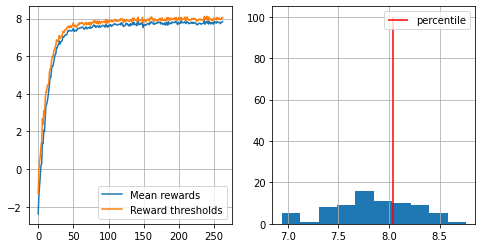

263
CPU times: user 3.44 s, sys: 80.9 ms, total: 3.52 s
Wall time: 3.48 s
mean reward = 7.735, threshold=7.916


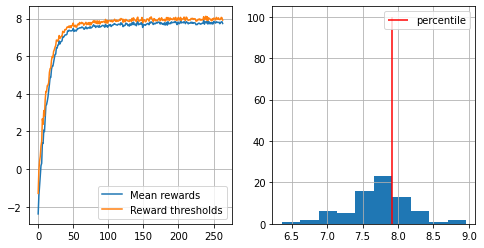

264
CPU times: user 3.3 s, sys: 81.5 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.741, threshold=7.916


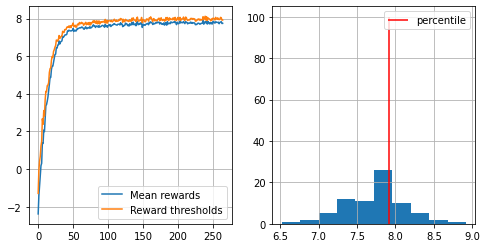

265
CPU times: user 3.29 s, sys: 53.5 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.769, threshold=8.040


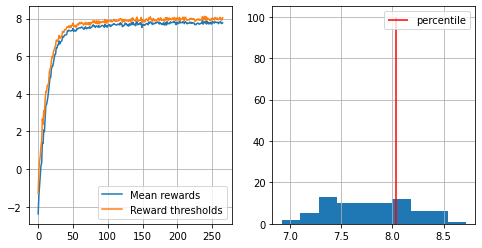

266
CPU times: user 3.31 s, sys: 76.4 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.761, threshold=8.000


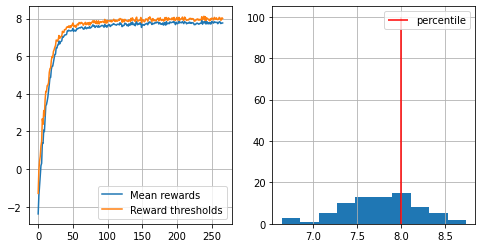

267
CPU times: user 3.28 s, sys: 73.8 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.806, threshold=7.960


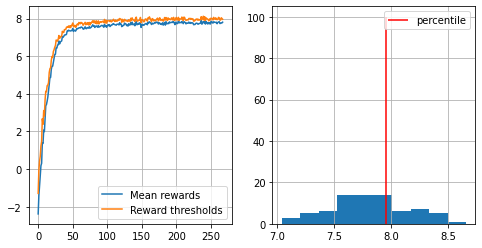

268
CPU times: user 3.38 s, sys: 60 ms, total: 3.44 s
Wall time: 3.39 s
mean reward = 7.826, threshold=8.016


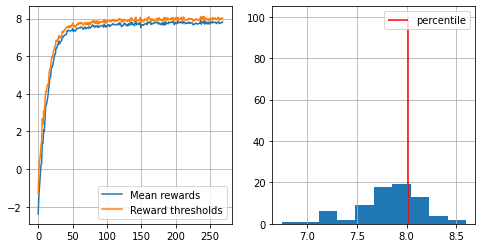

269
CPU times: user 3.39 s, sys: 101 ms, total: 3.49 s
Wall time: 3.42 s
mean reward = 7.836, threshold=8.020


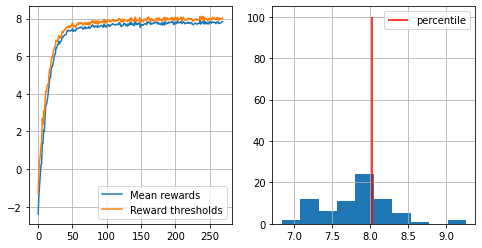

270
CPU times: user 3.32 s, sys: 81.5 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.747, threshold=7.952


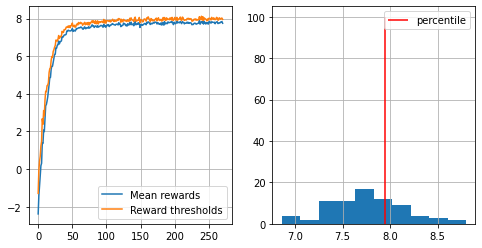

271
CPU times: user 3.35 s, sys: 80 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.853, threshold=8.096


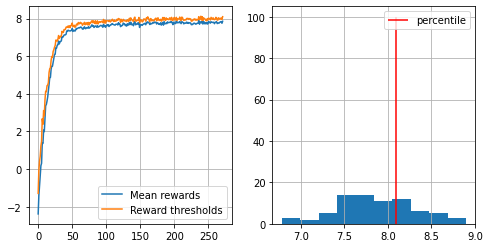

272
CPU times: user 3.31 s, sys: 62.7 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.720, threshold=7.960


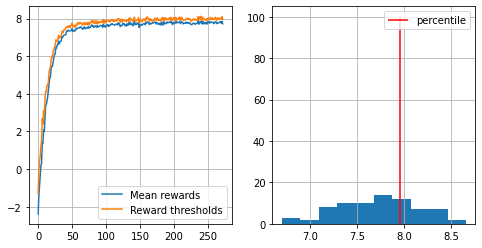

273
CPU times: user 3.28 s, sys: 71.4 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.837, threshold=8.068


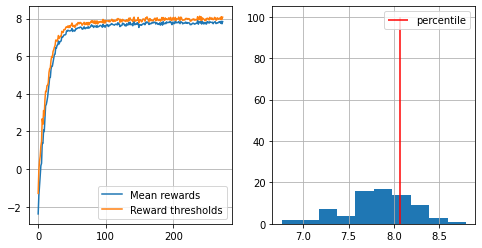

274
CPU times: user 3.34 s, sys: 84.4 ms, total: 3.42 s
Wall time: 3.34 s
mean reward = 7.661, threshold=7.840


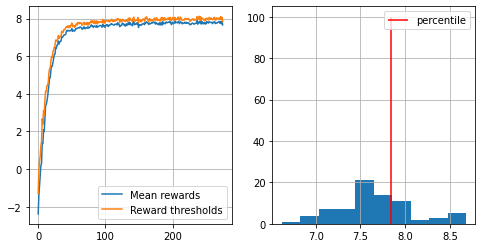

275
CPU times: user 3.32 s, sys: 91.3 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.678, threshold=7.916


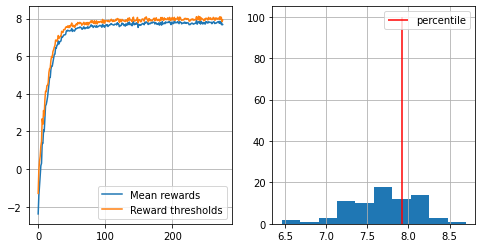

276
CPU times: user 3.32 s, sys: 103 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.774, threshold=8.076


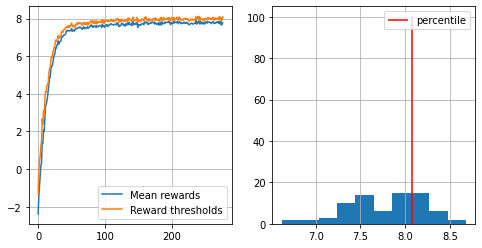

277
CPU times: user 3.29 s, sys: 56.3 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.722, threshold=7.960


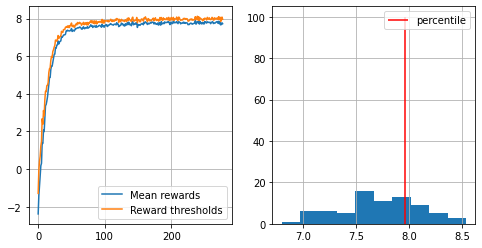

278
CPU times: user 3.32 s, sys: 64 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.664, threshold=7.820


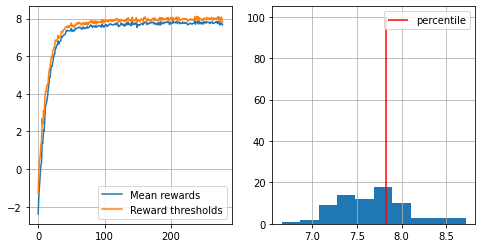

279
CPU times: user 3.35 s, sys: 81.3 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.810, threshold=8.040


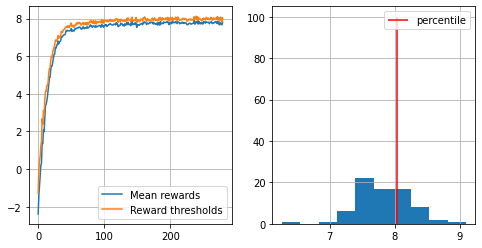

280
CPU times: user 3.34 s, sys: 96.3 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.725, threshold=7.896


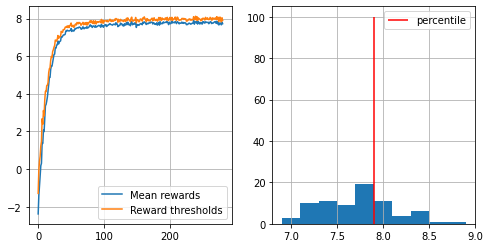

281
CPU times: user 3.29 s, sys: 66.1 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.785, threshold=8.040


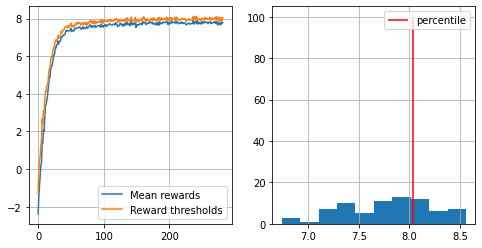

282
CPU times: user 3.28 s, sys: 55.7 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.734, threshold=7.956


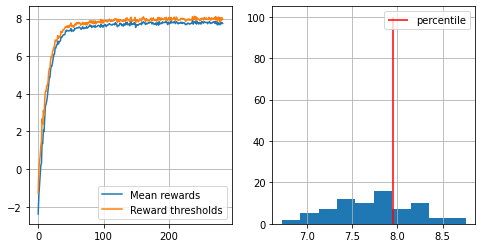

283
CPU times: user 3.26 s, sys: 71.6 ms, total: 3.33 s
Wall time: 3.26 s
mean reward = 7.829, threshold=8.000


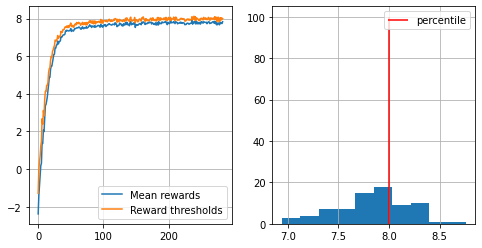

284
CPU times: user 3.28 s, sys: 77.1 ms, total: 3.36 s
Wall time: 3.28 s
mean reward = 7.799, threshold=8.076


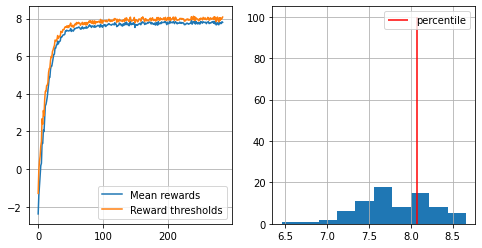

285
CPU times: user 3.3 s, sys: 91.2 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.765, threshold=7.976


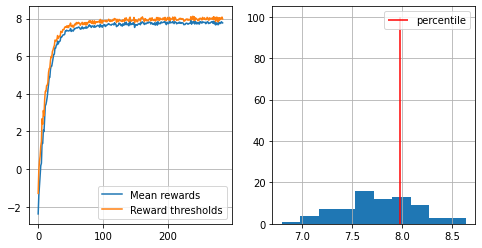

286
CPU times: user 3.29 s, sys: 51.5 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.776, threshold=8.040


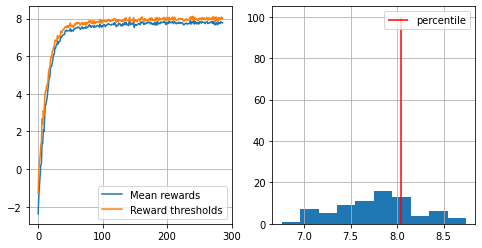

287
CPU times: user 3.39 s, sys: 86.1 ms, total: 3.48 s
Wall time: 3.39 s
mean reward = 7.733, threshold=7.948


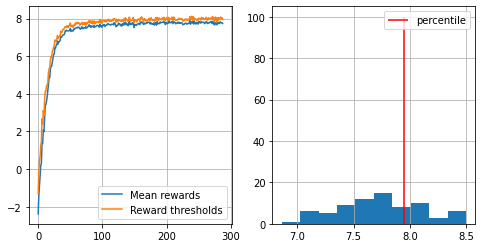

288
CPU times: user 3.28 s, sys: 76.4 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.834, threshold=8.036


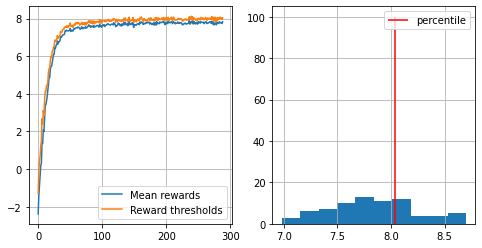

289
CPU times: user 3.29 s, sys: 74.7 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.754, threshold=8.036


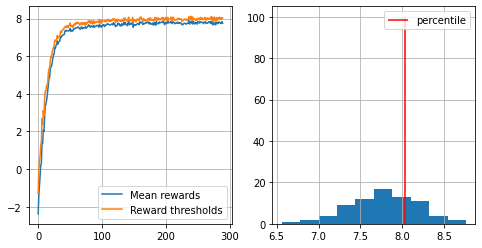

290
CPU times: user 3.32 s, sys: 74.4 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.713, threshold=7.900


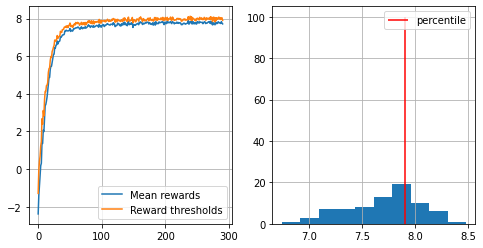

291
CPU times: user 3.31 s, sys: 67.3 ms, total: 3.38 s
Wall time: 3.32 s
mean reward = 7.797, threshold=7.960


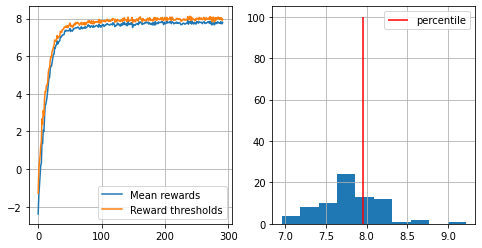

292
CPU times: user 3.35 s, sys: 110 ms, total: 3.46 s
Wall time: 3.37 s
mean reward = 7.769, threshold=7.956


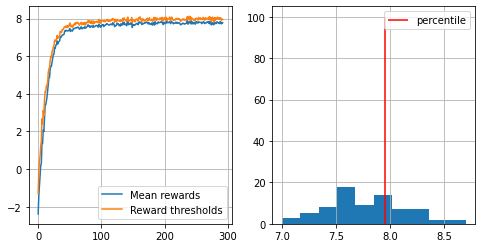

293
CPU times: user 3.31 s, sys: 60.8 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.722, threshold=7.900


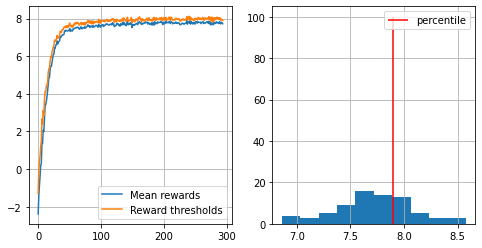

294
CPU times: user 3.26 s, sys: 54.1 ms, total: 3.31 s
Wall time: 3.25 s
mean reward = 7.776, threshold=7.960


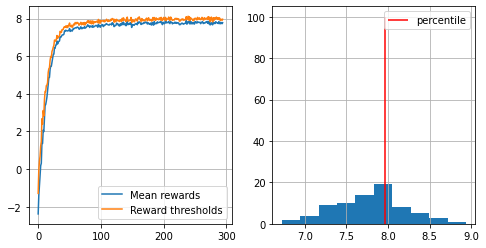

295
CPU times: user 3.36 s, sys: 66.5 ms, total: 3.43 s
Wall time: 3.37 s
mean reward = 7.838, threshold=8.036


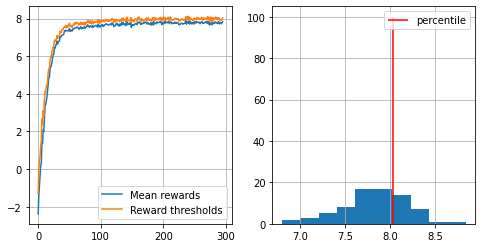

296
CPU times: user 3.29 s, sys: 70.1 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.712, threshold=7.940


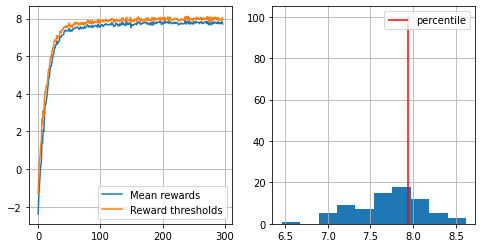

297
CPU times: user 3.29 s, sys: 71.1 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.780, threshold=7.980


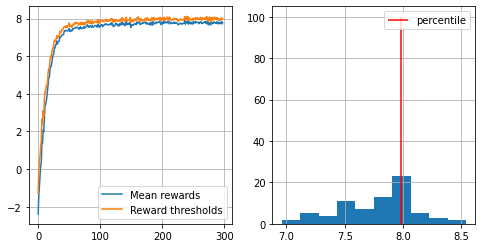

298
CPU times: user 3.28 s, sys: 56.2 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.800, threshold=7.960


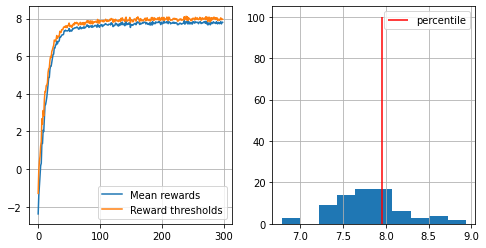

299
CPU times: user 3.31 s, sys: 81.4 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.711, threshold=7.876


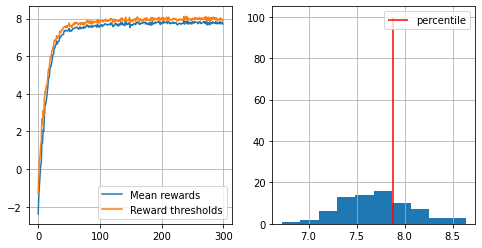

300
CPU times: user 3.3 s, sys: 75.1 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.730, threshold=7.916


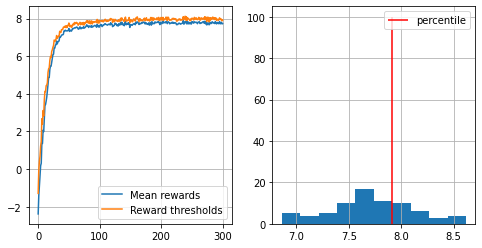

301
CPU times: user 3.46 s, sys: 89.1 ms, total: 3.55 s
Wall time: 3.47 s
mean reward = 7.873, threshold=8.080


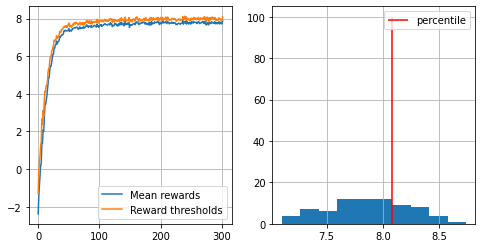

302
CPU times: user 3.36 s, sys: 74.4 ms, total: 3.43 s
Wall time: 3.39 s
mean reward = 7.858, threshold=8.092


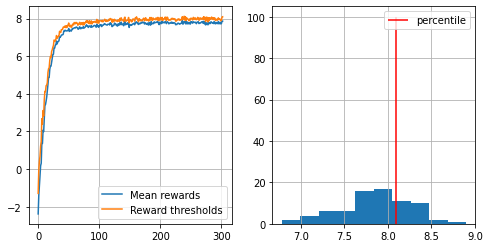

303
CPU times: user 3.33 s, sys: 92.4 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.873, threshold=8.080


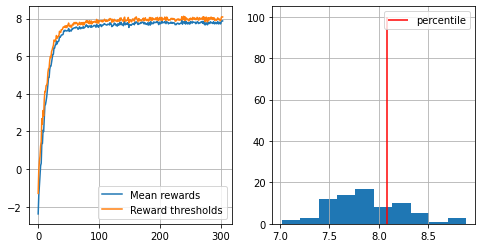

304
CPU times: user 3.37 s, sys: 85.9 ms, total: 3.46 s
Wall time: 3.38 s
mean reward = 7.780, threshold=7.956


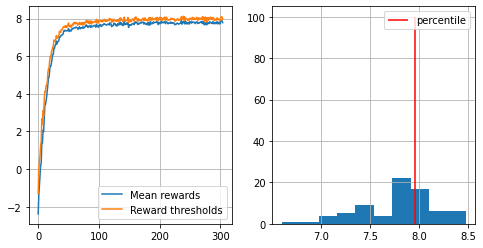

305
CPU times: user 3.32 s, sys: 74 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.738, threshold=7.960


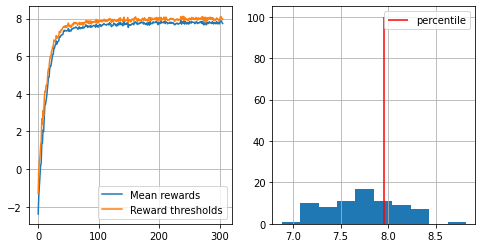

306
CPU times: user 3.31 s, sys: 90 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.770, threshold=7.940


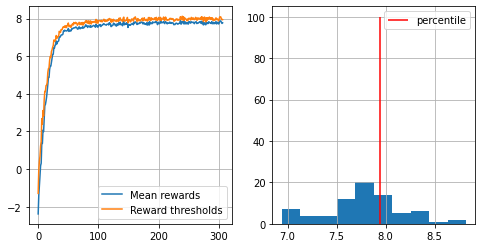

307
CPU times: user 3.3 s, sys: 80.8 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.743, threshold=7.976


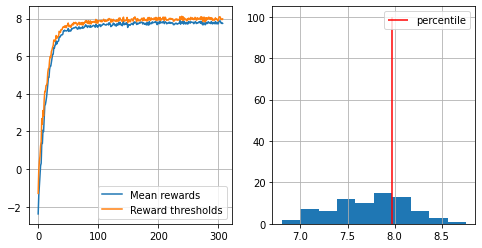

308
CPU times: user 3.33 s, sys: 106 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.754, threshold=8.016


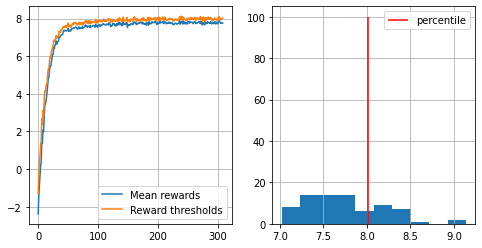

309
CPU times: user 3.34 s, sys: 102 ms, total: 3.45 s
Wall time: 3.36 s
mean reward = 7.737, threshold=7.936


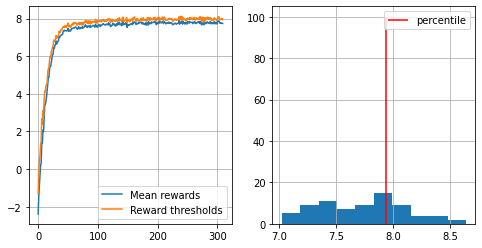

310
CPU times: user 3.28 s, sys: 77.8 ms, total: 3.36 s
Wall time: 3.28 s
mean reward = 7.872, threshold=8.020


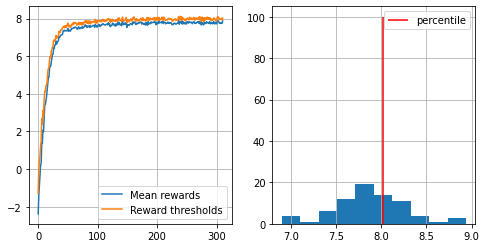

311
CPU times: user 3.34 s, sys: 103 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.743, threshold=7.956


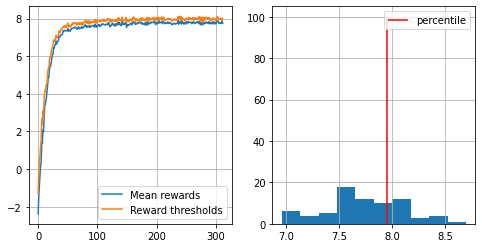

312
CPU times: user 3.35 s, sys: 79.8 ms, total: 3.43 s
Wall time: 3.35 s
mean reward = 7.843, threshold=8.144


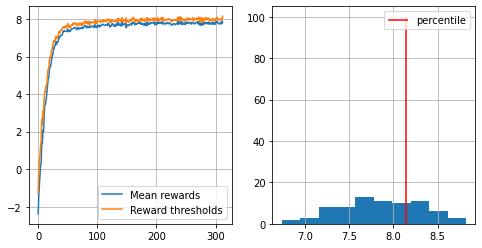

313
CPU times: user 3.31 s, sys: 78.5 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.754, threshold=7.940


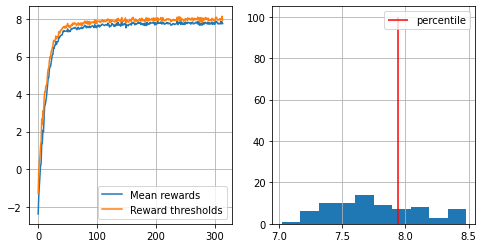

314
CPU times: user 3.28 s, sys: 55.6 ms, total: 3.33 s
Wall time: 3.27 s
mean reward = 7.754, threshold=7.960


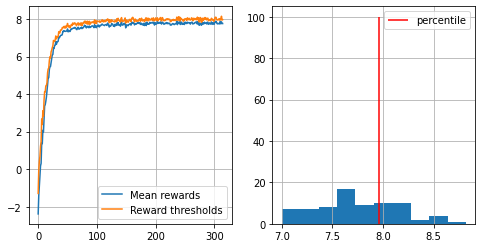

315
CPU times: user 3.3 s, sys: 85.2 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.790, threshold=8.020


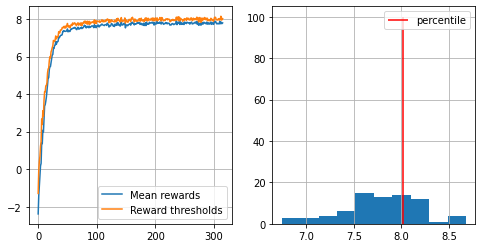

316
CPU times: user 3.32 s, sys: 84.7 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.688, threshold=7.920


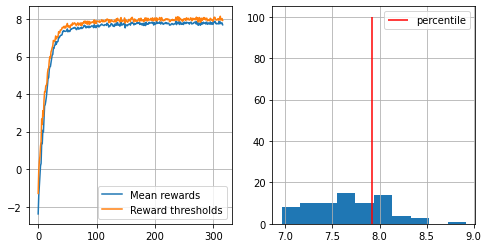

317
CPU times: user 3.28 s, sys: 68.4 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.815, threshold=8.012


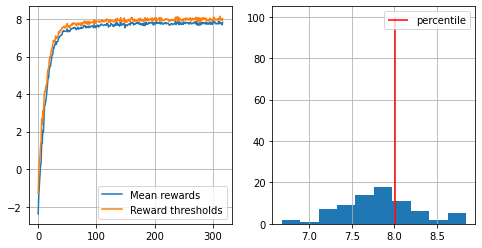

318
CPU times: user 3.31 s, sys: 86.5 ms, total: 3.4 s
Wall time: 3.31 s
mean reward = 7.789, threshold=8.020


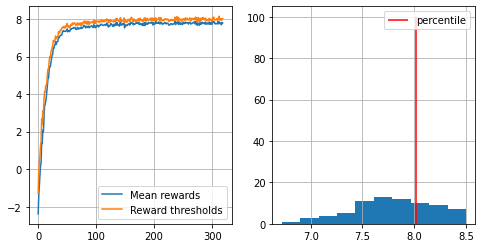

319
CPU times: user 3.34 s, sys: 70.9 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.804, threshold=8.000


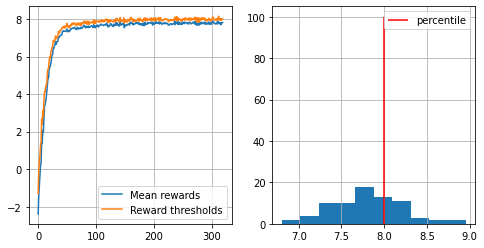

320
CPU times: user 3.36 s, sys: 72 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.741, threshold=7.936


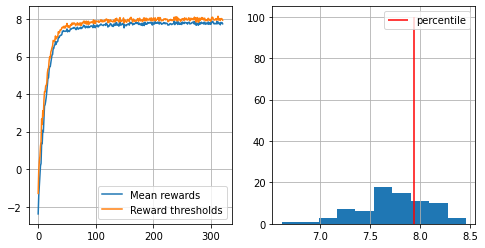

321
CPU times: user 3.81 s, sys: 120 ms, total: 3.93 s
Wall time: 3.93 s
mean reward = 7.770, threshold=7.956


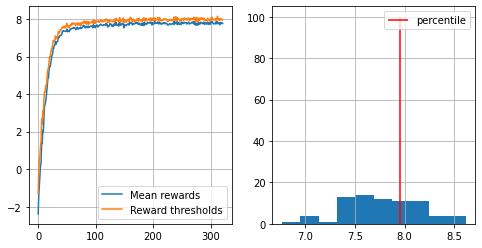

322
CPU times: user 3.78 s, sys: 108 ms, total: 3.89 s
Wall time: 3.92 s
mean reward = 7.794, threshold=7.976


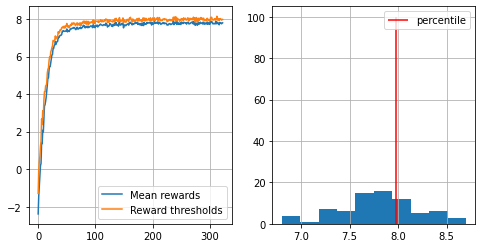

323
CPU times: user 3.31 s, sys: 58.4 ms, total: 3.36 s
Wall time: 3.31 s
mean reward = 7.795, threshold=8.060


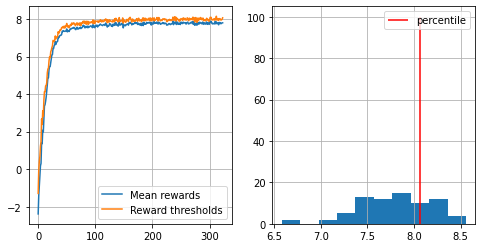

324
CPU times: user 3.32 s, sys: 96.1 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.777, threshold=8.000


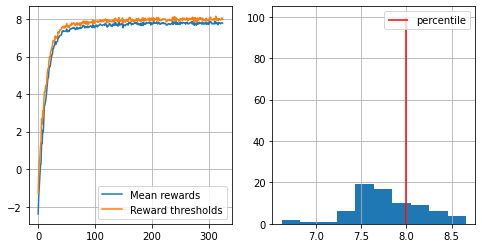

325
CPU times: user 3.29 s, sys: 76.4 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.788, threshold=8.040


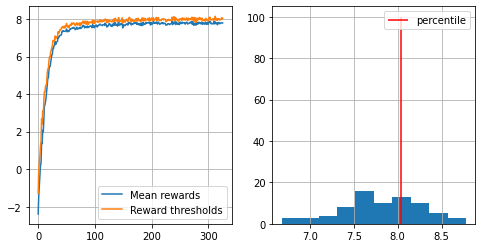

326
CPU times: user 3.33 s, sys: 70.5 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.737, threshold=7.992


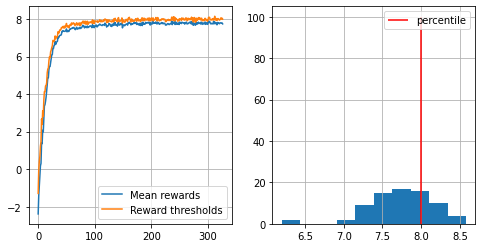

327
CPU times: user 3.35 s, sys: 103 ms, total: 3.45 s
Wall time: 3.36 s
mean reward = 7.705, threshold=7.880


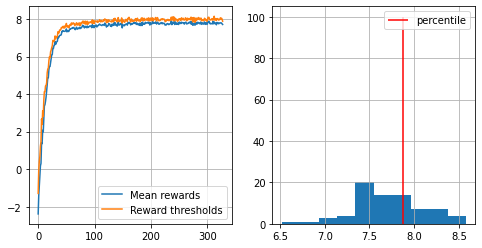

328
CPU times: user 3.28 s, sys: 62.7 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.761, threshold=8.000


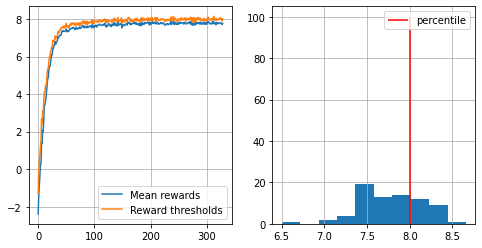

329
CPU times: user 3.32 s, sys: 106 ms, total: 3.43 s
Wall time: 3.33 s
mean reward = 7.735, threshold=7.940


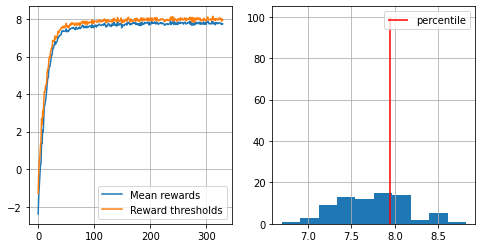

330
CPU times: user 3.26 s, sys: 51.2 ms, total: 3.31 s
Wall time: 3.25 s
mean reward = 7.794, threshold=8.020


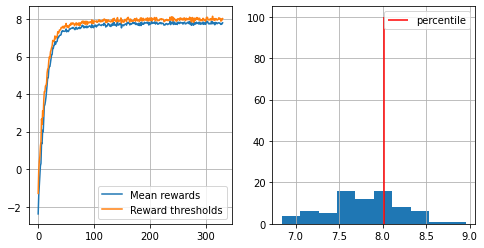

331
CPU times: user 3.28 s, sys: 64.8 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.777, threshold=7.980


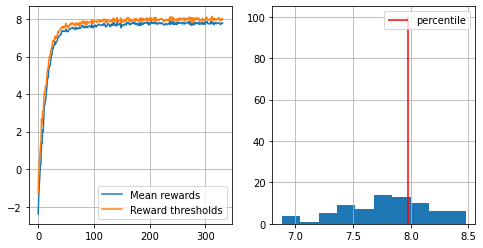

332
CPU times: user 3.32 s, sys: 85.4 ms, total: 3.4 s
Wall time: 3.33 s
mean reward = 7.671, threshold=7.860


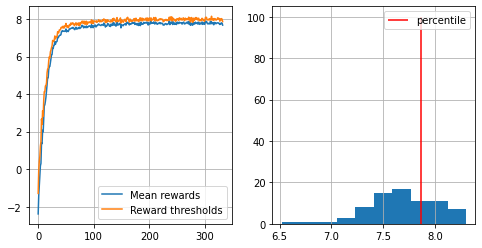

333
CPU times: user 3.34 s, sys: 63.6 ms, total: 3.4 s
Wall time: 3.34 s
mean reward = 7.780, threshold=8.040


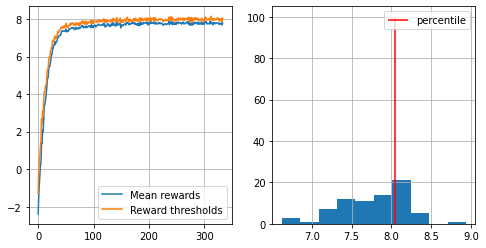

334
CPU times: user 3.48 s, sys: 47.8 ms, total: 3.52 s
Wall time: 3.49 s
mean reward = 7.801, threshold=8.000


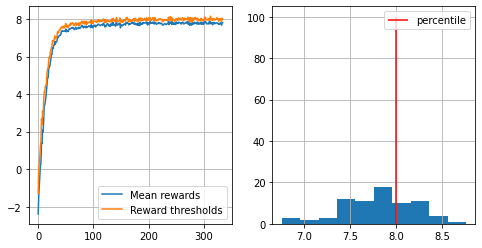

335
CPU times: user 3.41 s, sys: 85.5 ms, total: 3.5 s
Wall time: 3.42 s
mean reward = 7.775, threshold=8.000


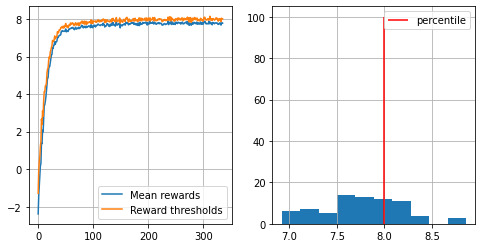

336
CPU times: user 3.29 s, sys: 81.2 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.751, threshold=7.936


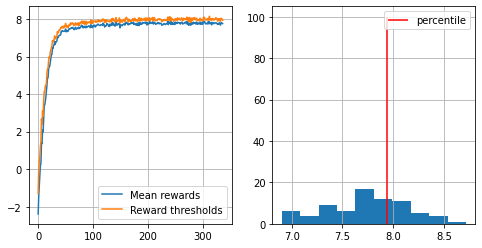

337
CPU times: user 3.29 s, sys: 75.9 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.735, threshold=7.968


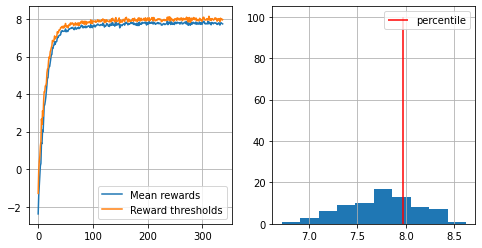

338
CPU times: user 3.31 s, sys: 66.3 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.659, threshold=7.920


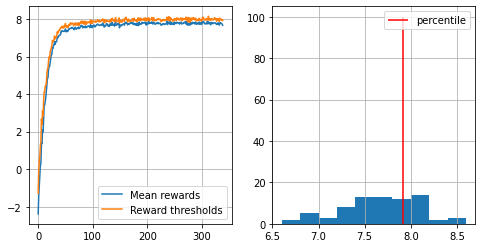

339
CPU times: user 3.37 s, sys: 110 ms, total: 3.48 s
Wall time: 3.39 s
mean reward = 7.722, threshold=7.920


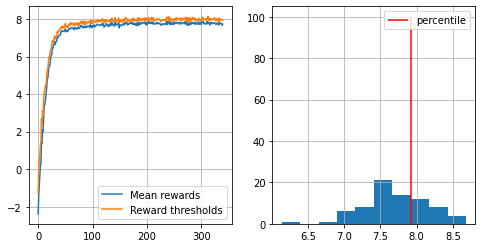

340
CPU times: user 3.31 s, sys: 56 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.735, threshold=8.000


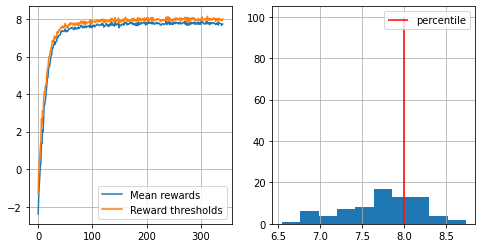

341
CPU times: user 3.29 s, sys: 66.2 ms, total: 3.35 s
Wall time: 3.29 s
mean reward = 7.772, threshold=8.000


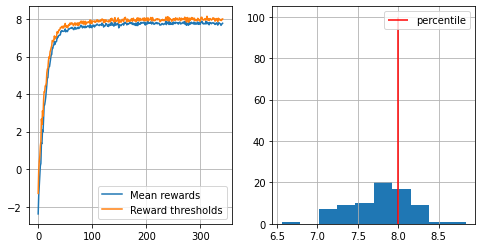

342
CPU times: user 3.3 s, sys: 70.5 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.736, threshold=7.956


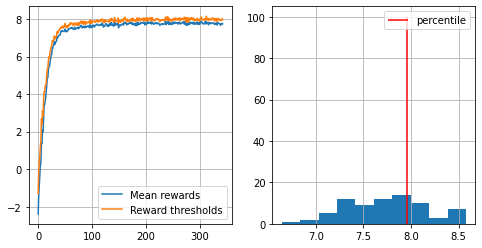

343
CPU times: user 3.33 s, sys: 75.2 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.671, threshold=7.856


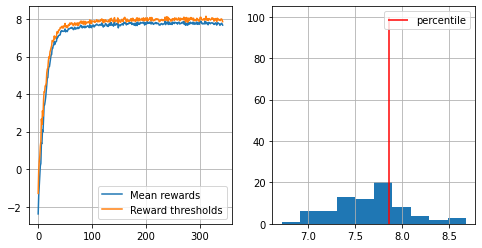

344
CPU times: user 3.44 s, sys: 59.7 ms, total: 3.5 s
Wall time: 3.44 s
mean reward = 7.708, threshold=7.900


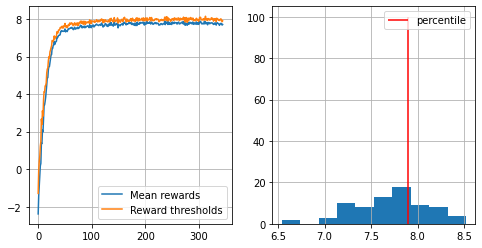

345
CPU times: user 3.28 s, sys: 66.1 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.752, threshold=8.020


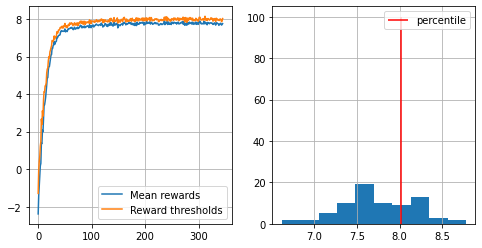

346
CPU times: user 3.34 s, sys: 73.6 ms, total: 3.42 s
Wall time: 3.34 s
mean reward = 7.602, threshold=7.840


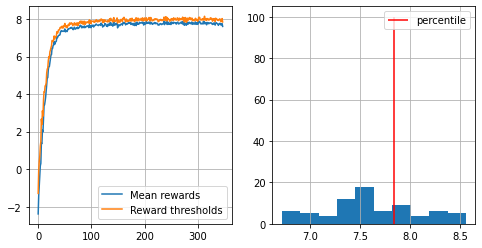

347
CPU times: user 3.3 s, sys: 80.7 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.752, threshold=7.996


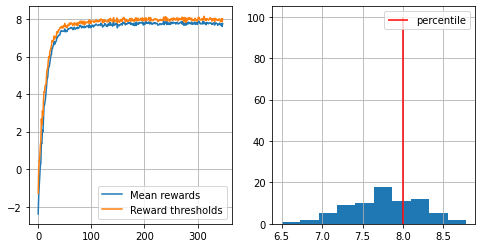

348
CPU times: user 3.4 s, sys: 101 ms, total: 3.5 s
Wall time: 3.41 s
mean reward = 7.751, threshold=7.976


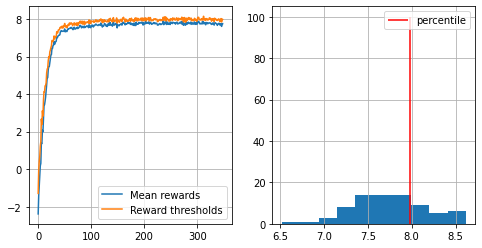

349
CPU times: user 3.31 s, sys: 74.4 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.779, threshold=7.992


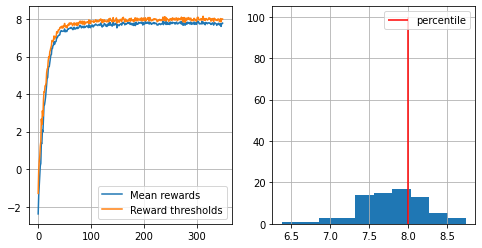

350
CPU times: user 3.63 s, sys: 99.5 ms, total: 3.73 s
Wall time: 3.72 s
mean reward = 7.763, threshold=7.940


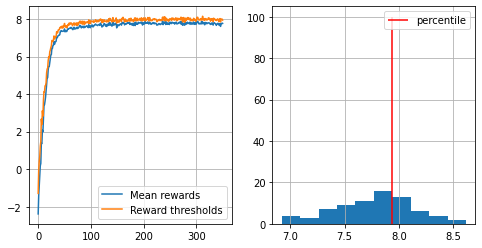

351
CPU times: user 3.4 s, sys: 62.9 ms, total: 3.46 s
Wall time: 3.43 s
mean reward = 7.788, threshold=8.052


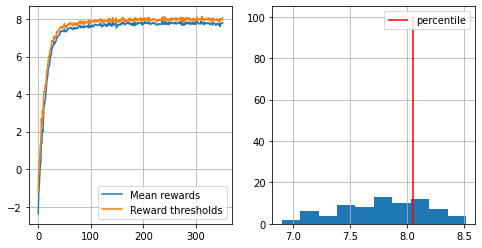

352
CPU times: user 3.41 s, sys: 124 ms, total: 3.53 s
Wall time: 3.43 s
mean reward = 7.704, threshold=7.880


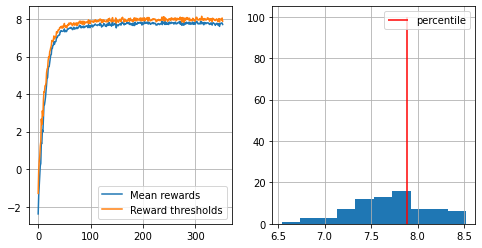

353
CPU times: user 3.33 s, sys: 92.5 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.715, threshold=7.896


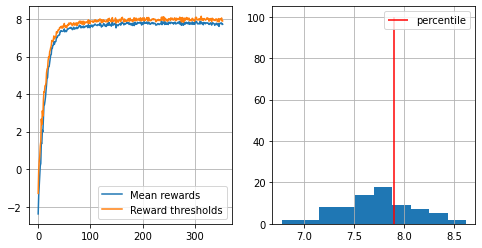

354
CPU times: user 3.31 s, sys: 107 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.795, threshold=7.996


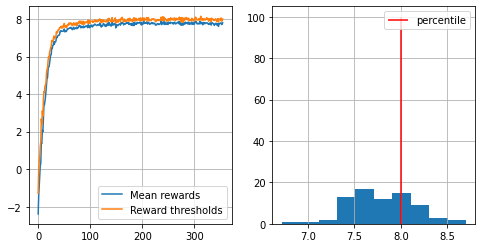

355
CPU times: user 3.28 s, sys: 67.2 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.777, threshold=7.980


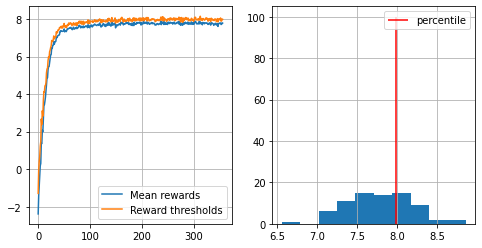

356
CPU times: user 3.3 s, sys: 82.9 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.788, threshold=7.996


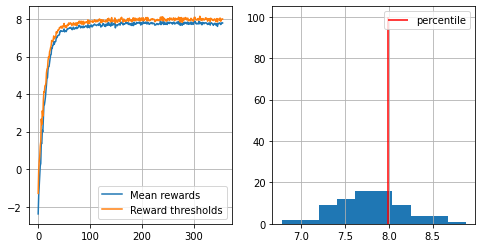

357
CPU times: user 3.32 s, sys: 70.5 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.724, threshold=7.916


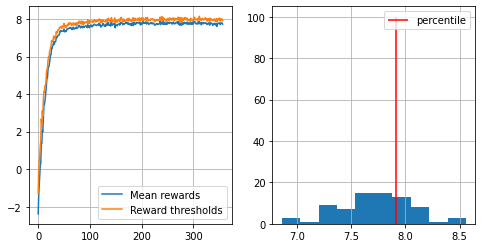

358
CPU times: user 3.26 s, sys: 65.6 ms, total: 3.33 s
Wall time: 3.26 s
mean reward = 7.810, threshold=7.940


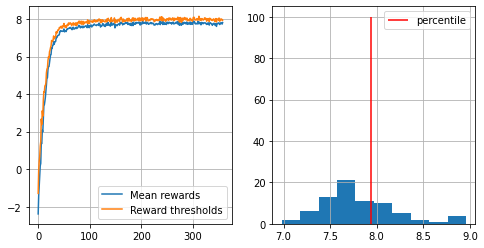

359
CPU times: user 3.26 s, sys: 66.5 ms, total: 3.33 s
Wall time: 3.26 s
mean reward = 7.863, threshold=8.120


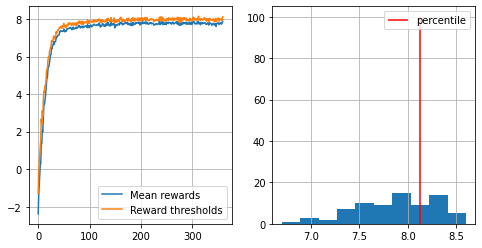

360
CPU times: user 3.36 s, sys: 72 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.851, threshold=8.000


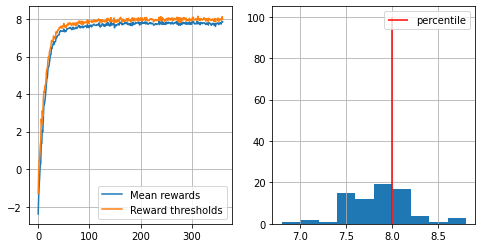

361
CPU times: user 3.32 s, sys: 57.9 ms, total: 3.38 s
Wall time: 3.32 s
mean reward = 7.738, threshold=7.936


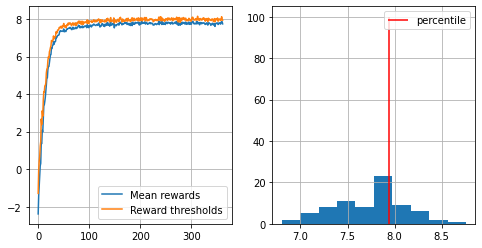

362
CPU times: user 3.27 s, sys: 66.2 ms, total: 3.33 s
Wall time: 3.26 s
mean reward = 7.801, threshold=7.920


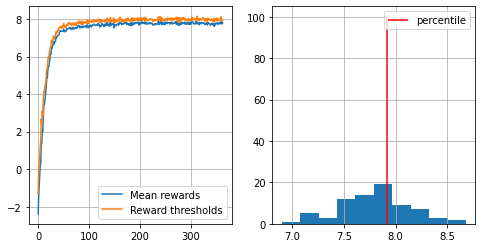

363
CPU times: user 3.33 s, sys: 111 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.746, threshold=7.940


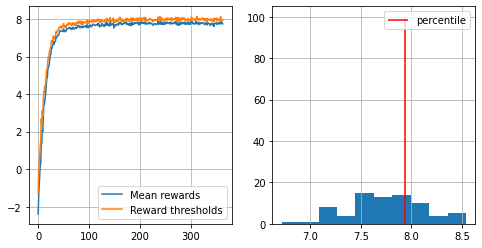

364
CPU times: user 3.3 s, sys: 76.2 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.744, threshold=7.960


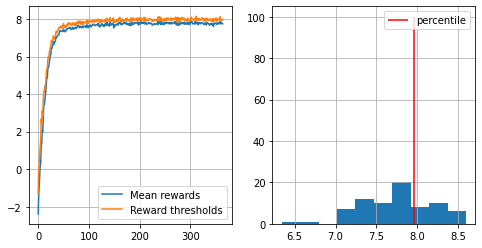

365
CPU times: user 3.25 s, sys: 49.8 ms, total: 3.3 s
Wall time: 3.24 s
mean reward = 7.824, threshold=8.056


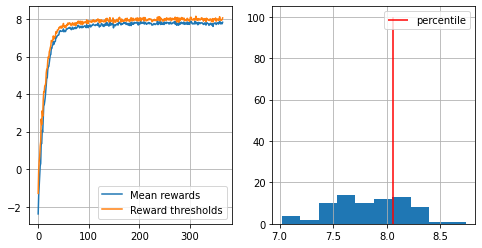

366
CPU times: user 3.46 s, sys: 57.3 ms, total: 3.52 s
Wall time: 3.46 s
mean reward = 7.698, threshold=7.936


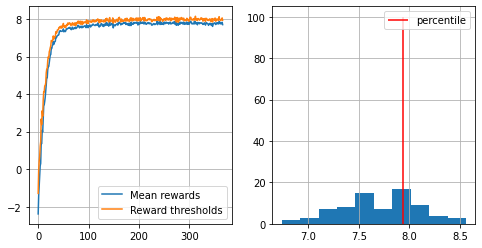

367
CPU times: user 3.4 s, sys: 106 ms, total: 3.51 s
Wall time: 3.43 s
mean reward = 7.717, threshold=7.936


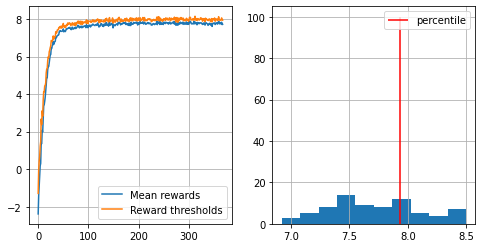

368
CPU times: user 3.42 s, sys: 129 ms, total: 3.55 s
Wall time: 3.45 s
mean reward = 7.718, threshold=7.900


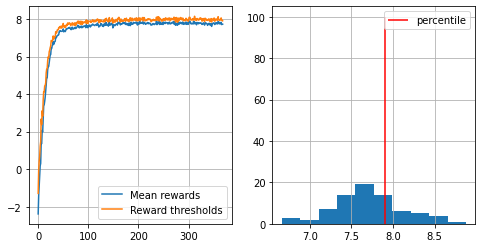

369
CPU times: user 3.37 s, sys: 124 ms, total: 3.49 s
Wall time: 3.38 s
mean reward = 7.731, threshold=8.020


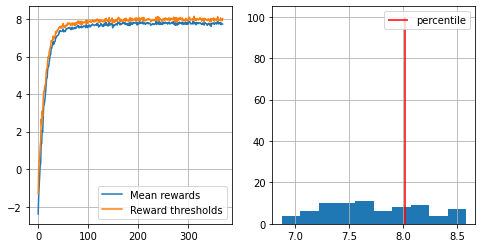

370
CPU times: user 3.28 s, sys: 63.4 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.765, threshold=7.996


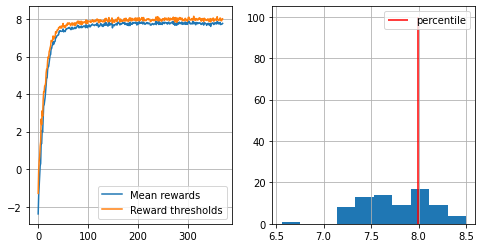

371
CPU times: user 3.29 s, sys: 83.8 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.878, threshold=8.120


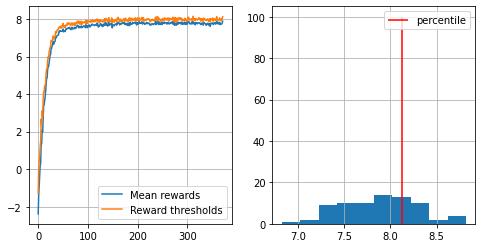

372
CPU times: user 3.26 s, sys: 62.2 ms, total: 3.32 s
Wall time: 3.26 s
mean reward = 7.859, threshold=8.080


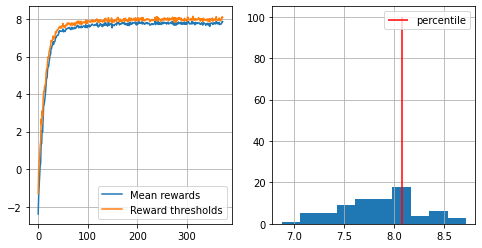

373
CPU times: user 3.28 s, sys: 59 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.727, threshold=7.876


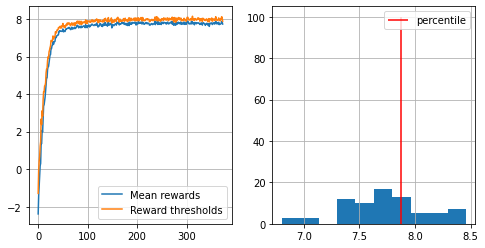

374
CPU times: user 3.28 s, sys: 59 ms, total: 3.34 s
Wall time: 3.27 s
mean reward = 7.748, threshold=7.916


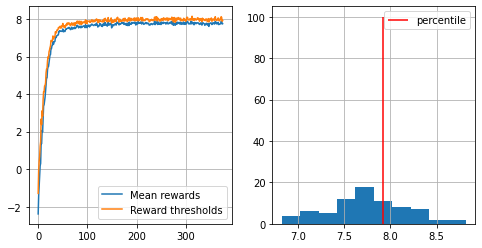

375
CPU times: user 3.28 s, sys: 60.5 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.711, threshold=7.896


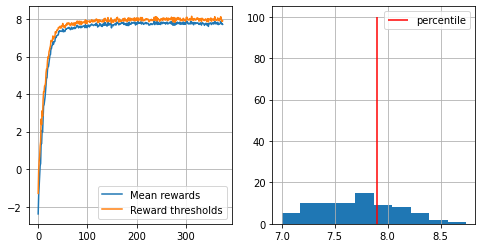

376
CPU times: user 3.33 s, sys: 94.6 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.829, threshold=8.036


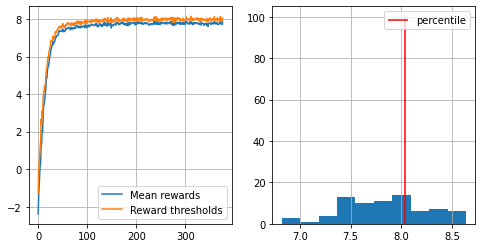

377
CPU times: user 3.36 s, sys: 73.5 ms, total: 3.44 s
Wall time: 3.37 s
mean reward = 7.711, threshold=7.880


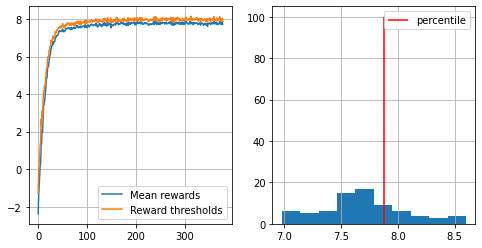

378
CPU times: user 3.31 s, sys: 85.3 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.761, threshold=7.960


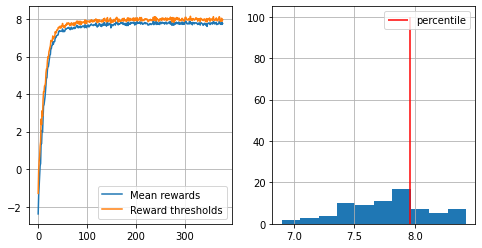

379
CPU times: user 3.33 s, sys: 87.1 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.772, threshold=7.980


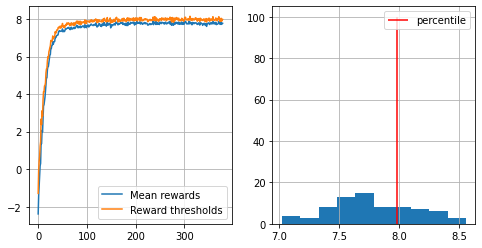

380
CPU times: user 3.27 s, sys: 51.9 ms, total: 3.32 s
Wall time: 3.26 s
mean reward = 7.857, threshold=8.116


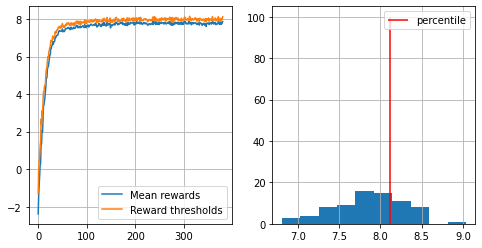

381
CPU times: user 3.33 s, sys: 97.3 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.752, threshold=7.880


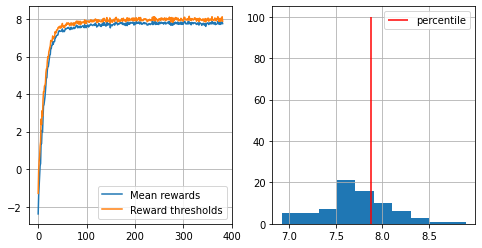

382
CPU times: user 3.33 s, sys: 109 ms, total: 3.44 s
Wall time: 3.34 s
mean reward = 7.756, threshold=7.940


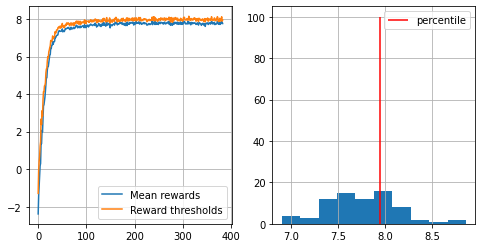

383
CPU times: user 3.31 s, sys: 93.8 ms, total: 3.4 s
Wall time: 3.31 s
mean reward = 7.771, threshold=8.016


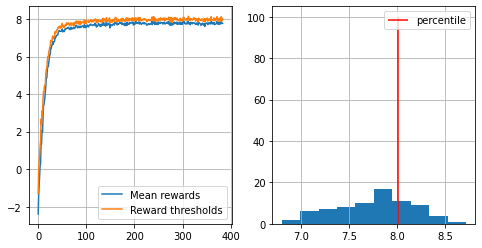

384
CPU times: user 3.31 s, sys: 74.2 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.807, threshold=8.020


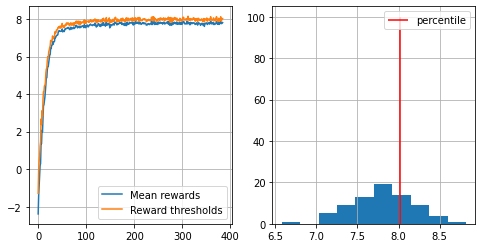

385
CPU times: user 3.39 s, sys: 94.3 ms, total: 3.49 s
Wall time: 3.4 s
mean reward = 7.759, threshold=8.000


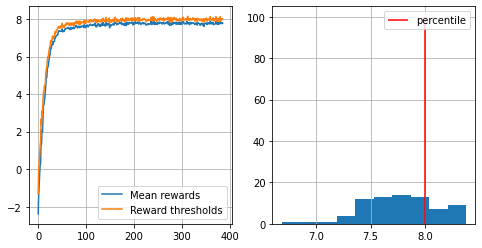

386
CPU times: user 3.3 s, sys: 81.2 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.711, threshold=7.896


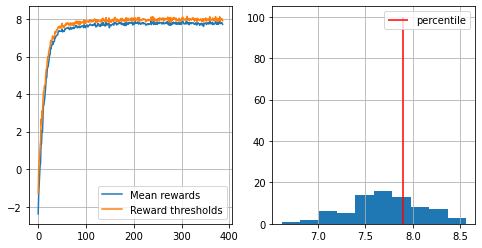

387
CPU times: user 3.31 s, sys: 75.1 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.710, threshold=7.956


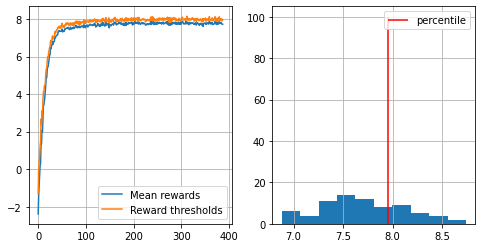

388
CPU times: user 3.3 s, sys: 74.5 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.788, threshold=8.000


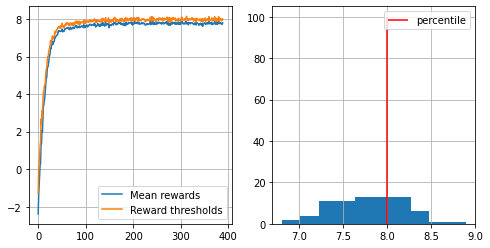

389
CPU times: user 3.3 s, sys: 70 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.735, threshold=7.960


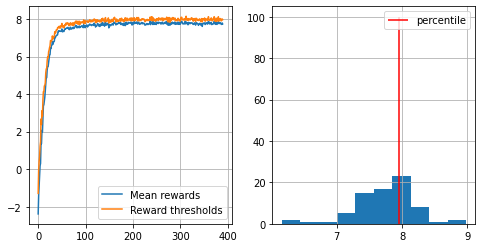

390
CPU times: user 3.32 s, sys: 104 ms, total: 3.42 s
Wall time: 3.33 s
mean reward = 7.838, threshold=8.060


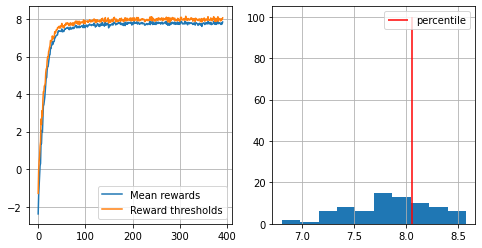

391
CPU times: user 3.28 s, sys: 72.7 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.843, threshold=8.060


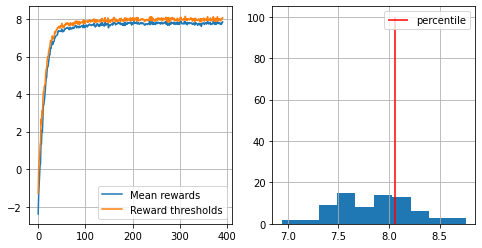

392
CPU times: user 3.28 s, sys: 59.1 ms, total: 3.34 s
Wall time: 3.28 s
mean reward = 7.773, threshold=7.976


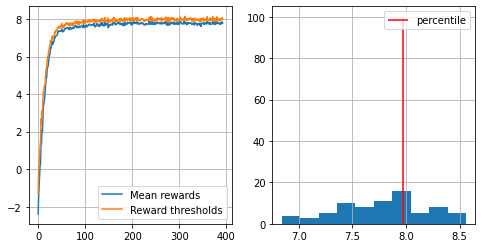

393
CPU times: user 3.36 s, sys: 81.4 ms, total: 3.44 s
Wall time: 3.37 s
mean reward = 7.704, threshold=7.896


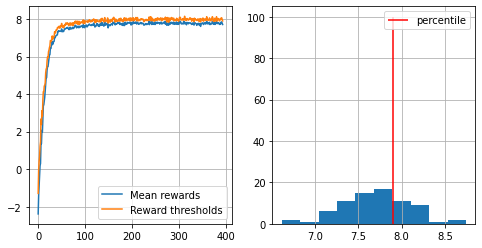

394
CPU times: user 3.28 s, sys: 73.9 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.827, threshold=8.116


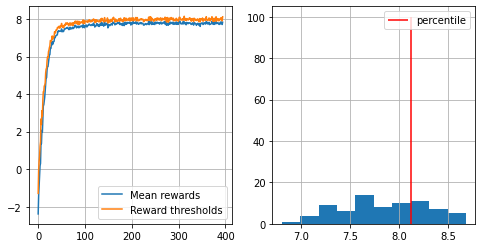

395
CPU times: user 3.3 s, sys: 80.3 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.787, threshold=8.052


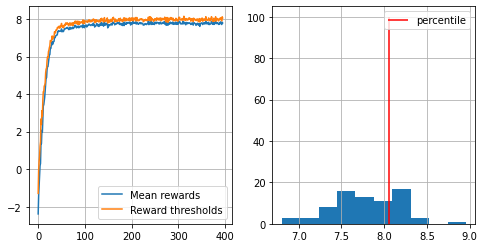

396
CPU times: user 3.29 s, sys: 66.8 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.746, threshold=7.992


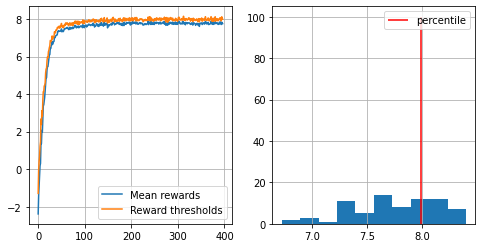

397
CPU times: user 3.31 s, sys: 80.4 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.736, threshold=7.940


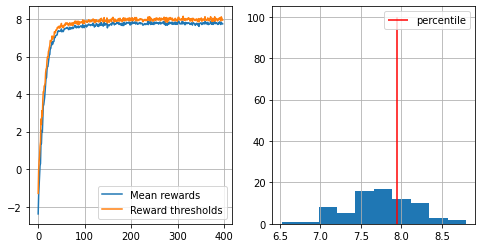

398
CPU times: user 3.28 s, sys: 69 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.841, threshold=8.016


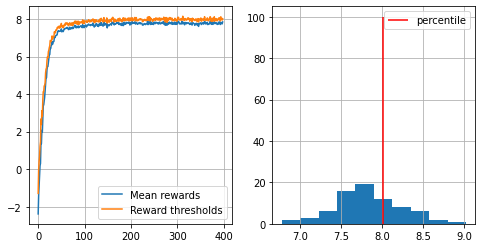

399
CPU times: user 3.6 s, sys: 90.4 ms, total: 3.69 s
Wall time: 3.62 s
mean reward = 7.684, threshold=7.976


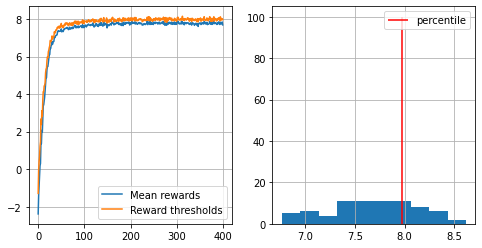

400
CPU times: user 3.33 s, sys: 77.9 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.767, threshold=7.956


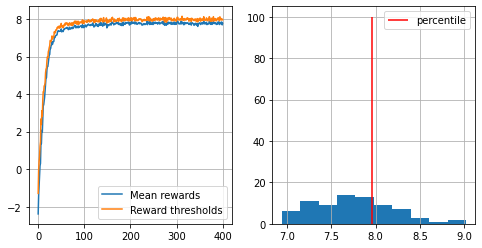

401
CPU times: user 3.34 s, sys: 97.7 ms, total: 3.44 s
Wall time: 3.35 s
mean reward = 7.715, threshold=7.936


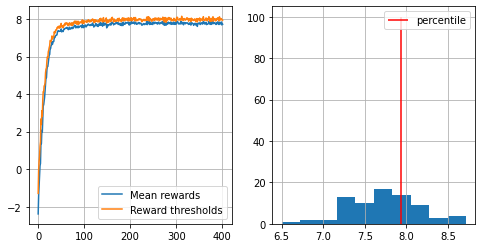

402
CPU times: user 3.32 s, sys: 76.2 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.717, threshold=7.876


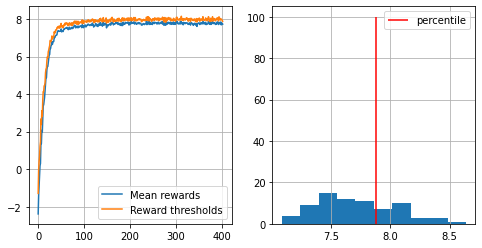

403
CPU times: user 3.28 s, sys: 71.3 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.841, threshold=8.112


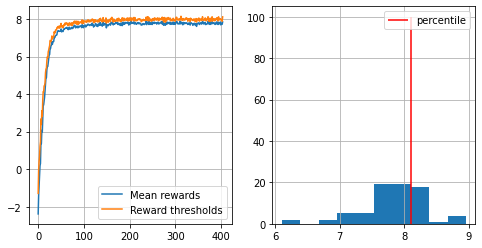

404
CPU times: user 3.35 s, sys: 93.7 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.745, threshold=8.040


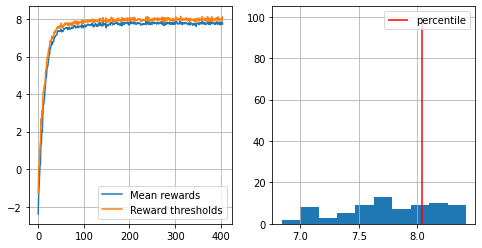

405
CPU times: user 3.29 s, sys: 75.1 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.763, threshold=7.948


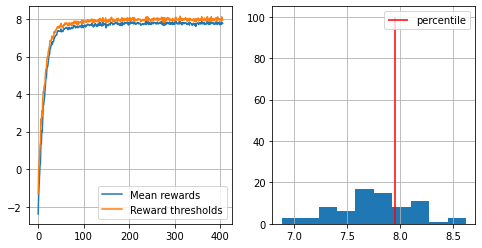

406
CPU times: user 3.31 s, sys: 72.3 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.686, threshold=7.964


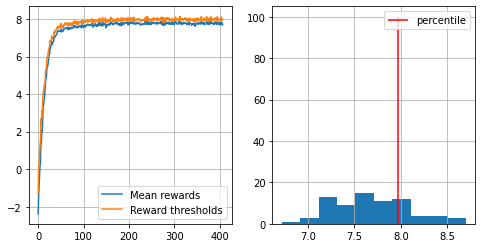

407
CPU times: user 3.29 s, sys: 63.6 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.710, threshold=7.900


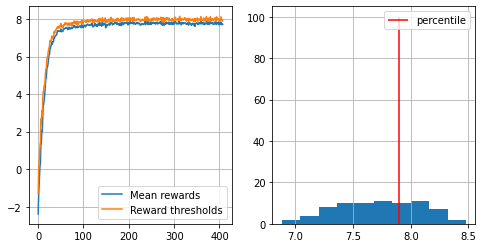

408
CPU times: user 3.35 s, sys: 63.4 ms, total: 3.41 s
Wall time: 3.35 s
mean reward = 7.771, threshold=7.900


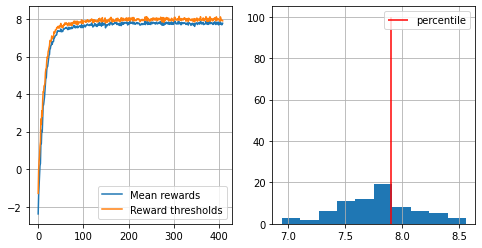

409
CPU times: user 3.32 s, sys: 82.8 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.781, threshold=8.000


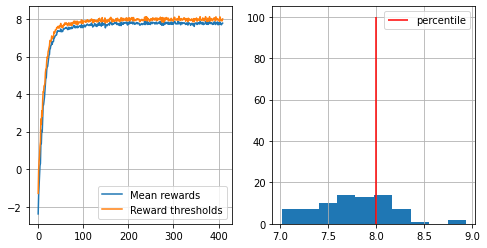

410
CPU times: user 3.35 s, sys: 68.5 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.683, threshold=7.936


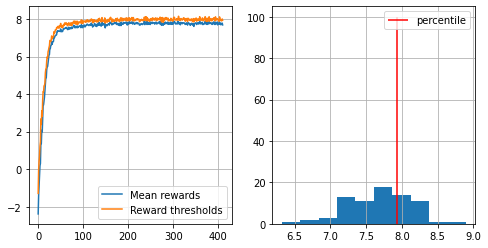

411
CPU times: user 3.29 s, sys: 78.8 ms, total: 3.37 s
Wall time: 3.3 s
mean reward = 7.777, threshold=7.980


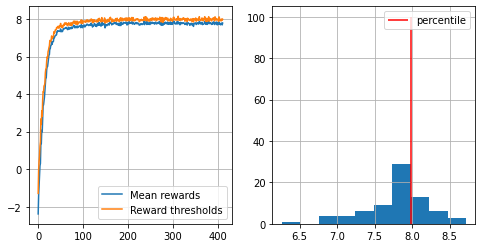

412
CPU times: user 3.35 s, sys: 106 ms, total: 3.45 s
Wall time: 3.36 s
mean reward = 7.775, threshold=7.956


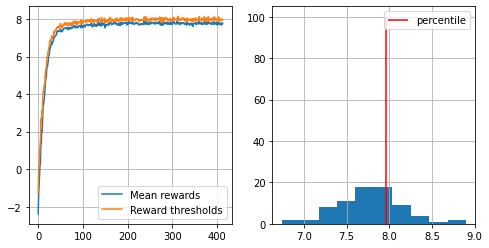

413
CPU times: user 3.35 s, sys: 63.1 ms, total: 3.41 s
Wall time: 3.34 s
mean reward = 7.639, threshold=7.840


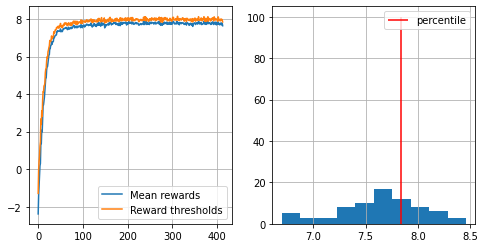

414
CPU times: user 3.28 s, sys: 68.2 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.859, threshold=8.020


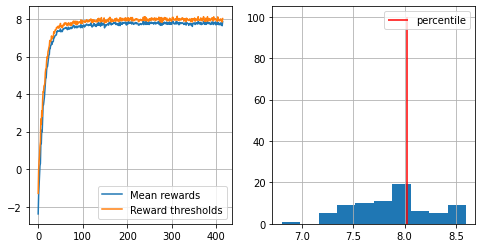

415
CPU times: user 3.31 s, sys: 87.1 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.760, threshold=7.936


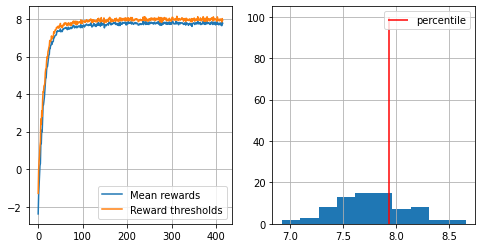

416
CPU times: user 3.39 s, sys: 95.4 ms, total: 3.49 s
Wall time: 3.4 s
mean reward = 7.763, threshold=7.956


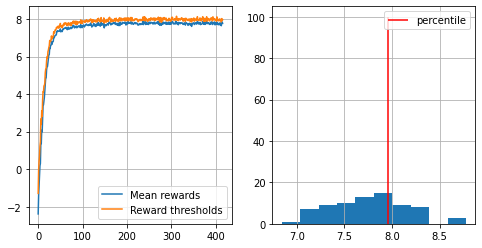

417
CPU times: user 3.32 s, sys: 64.5 ms, total: 3.38 s
Wall time: 3.32 s
mean reward = 7.733, threshold=7.960


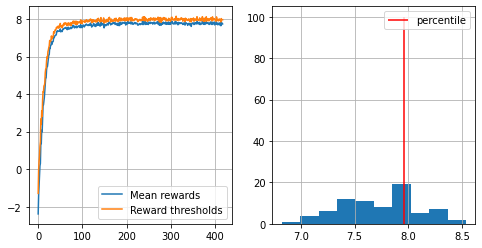

418
CPU times: user 3.36 s, sys: 74.9 ms, total: 3.44 s
Wall time: 3.36 s
mean reward = 7.780, threshold=7.956


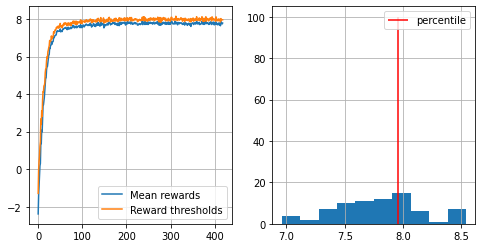

419
CPU times: user 3.39 s, sys: 69.5 ms, total: 3.46 s
Wall time: 3.42 s
mean reward = 7.873, threshold=8.120


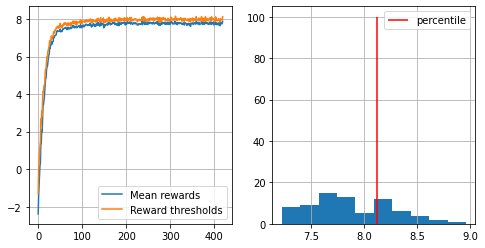

420
CPU times: user 3.81 s, sys: 109 ms, total: 3.92 s
Wall time: 3.99 s
mean reward = 7.786, threshold=7.956


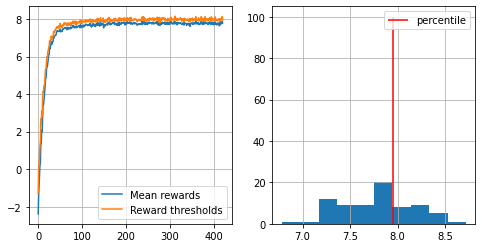

421
CPU times: user 3.79 s, sys: 108 ms, total: 3.9 s
Wall time: 3.96 s
mean reward = 7.740, threshold=7.980


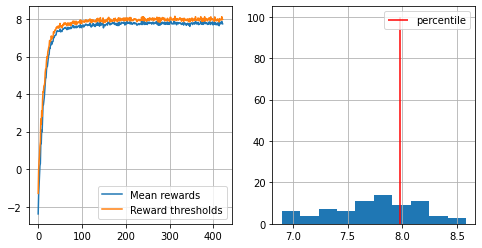

422
CPU times: user 3.37 s, sys: 83.2 ms, total: 3.45 s
Wall time: 3.37 s
mean reward = 7.762, threshold=8.000


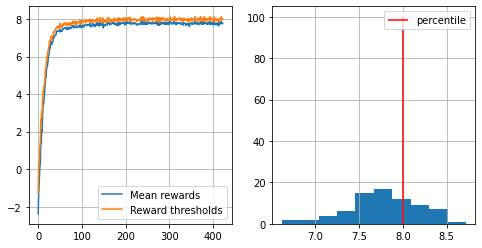

423
CPU times: user 3.29 s, sys: 59.3 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.799, threshold=8.032


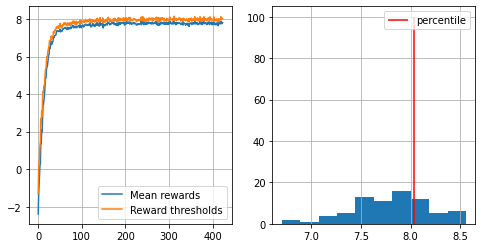

424
CPU times: user 3.34 s, sys: 53.8 ms, total: 3.39 s
Wall time: 3.33 s
mean reward = 7.814, threshold=7.956


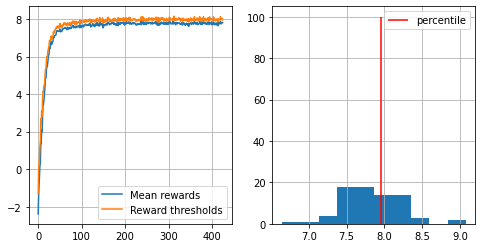

425
CPU times: user 3.29 s, sys: 75.3 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.790, threshold=7.976


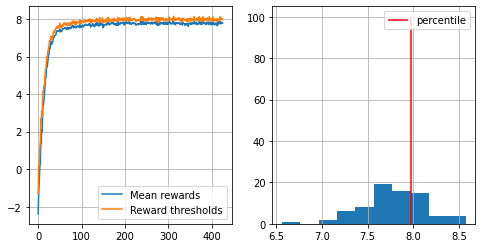

426
CPU times: user 3.33 s, sys: 94.7 ms, total: 3.42 s
Wall time: 3.34 s
mean reward = 7.789, threshold=8.000


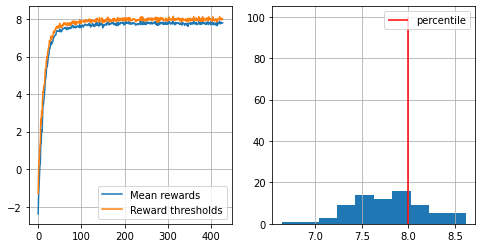

427
CPU times: user 3.32 s, sys: 88 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.707, threshold=7.956


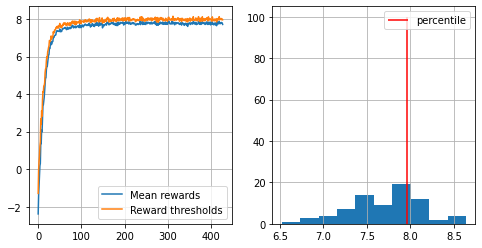

428
CPU times: user 3.31 s, sys: 60.3 ms, total: 3.37 s
Wall time: 3.31 s
mean reward = 7.702, threshold=7.956


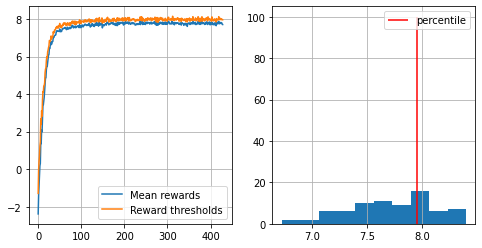

429
CPU times: user 3.29 s, sys: 62.2 ms, total: 3.35 s
Wall time: 3.29 s
mean reward = 7.743, threshold=7.960


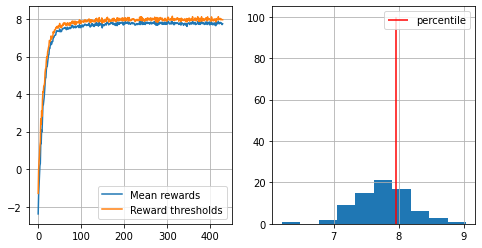

430
CPU times: user 3.36 s, sys: 65 ms, total: 3.43 s
Wall time: 3.36 s
mean reward = 7.801, threshold=7.980


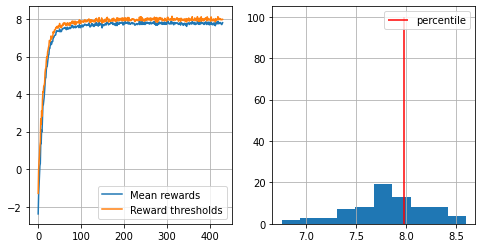

431
CPU times: user 3.5 s, sys: 75.8 ms, total: 3.58 s
Wall time: 3.51 s
mean reward = 7.759, threshold=7.996


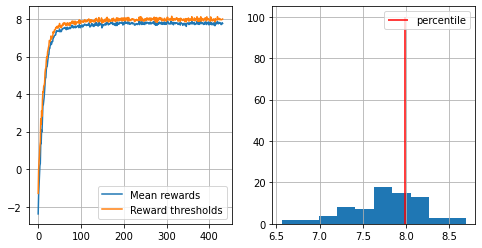

432
CPU times: user 3.45 s, sys: 119 ms, total: 3.57 s
Wall time: 3.45 s
mean reward = 7.701, threshold=7.896


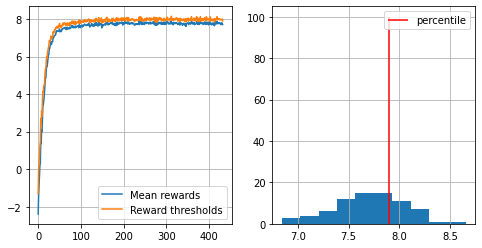

433
CPU times: user 3.44 s, sys: 90.9 ms, total: 3.54 s
Wall time: 3.46 s
mean reward = 7.757, threshold=7.912


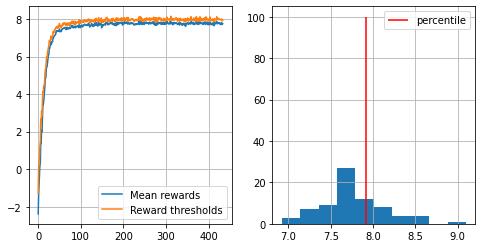

434
CPU times: user 3.38 s, sys: 79.4 ms, total: 3.46 s
Wall time: 3.38 s
mean reward = 7.723, threshold=7.896


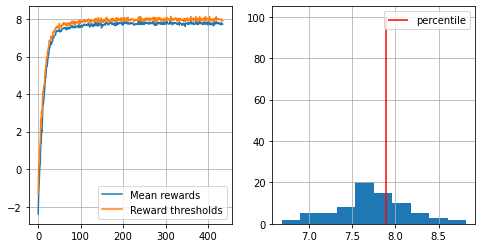

435
CPU times: user 3.3 s, sys: 66.8 ms, total: 3.36 s
Wall time: 3.29 s
mean reward = 7.798, threshold=7.960


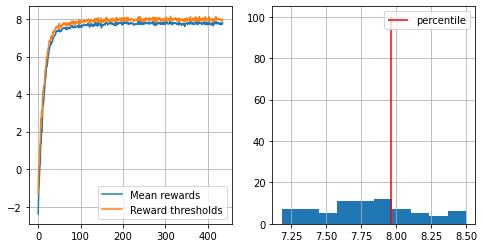

436
CPU times: user 3.35 s, sys: 68.5 ms, total: 3.42 s
Wall time: 3.35 s
mean reward = 7.615, threshold=7.856


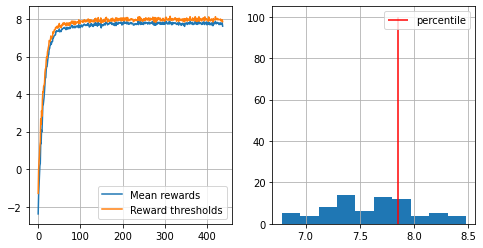

437
CPU times: user 3.3 s, sys: 80.5 ms, total: 3.38 s
Wall time: 3.3 s
mean reward = 7.767, threshold=7.976


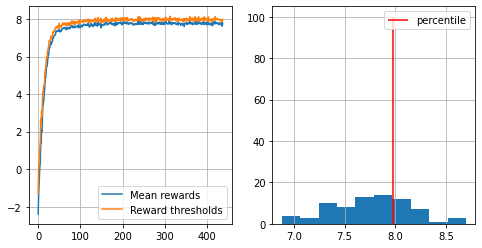

438
CPU times: user 3.38 s, sys: 87.7 ms, total: 3.47 s
Wall time: 3.39 s
mean reward = 7.758, threshold=7.976


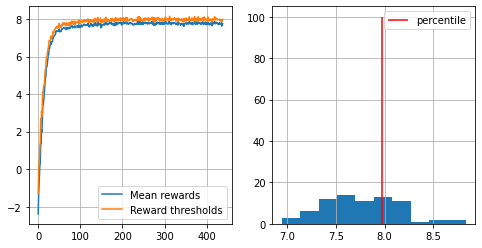

439
CPU times: user 3.32 s, sys: 76.1 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.755, threshold=8.000


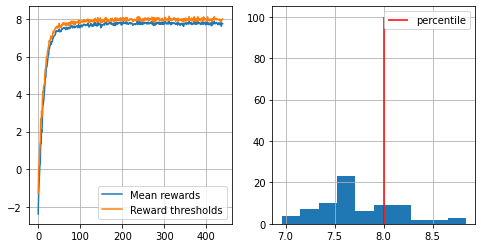

440
CPU times: user 3.37 s, sys: 85.9 ms, total: 3.46 s
Wall time: 3.38 s
mean reward = 7.736, threshold=7.936


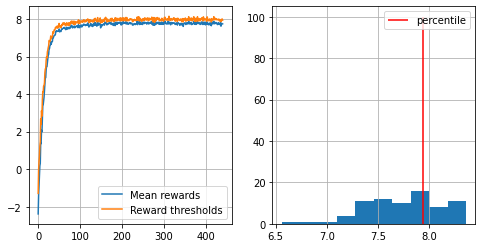

441
CPU times: user 3.34 s, sys: 57.5 ms, total: 3.4 s
Wall time: 3.34 s
mean reward = 7.674, threshold=7.856


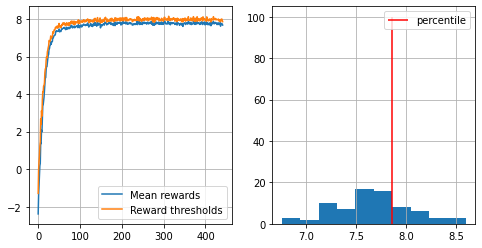

442
CPU times: user 3.29 s, sys: 85.3 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.777, threshold=8.100


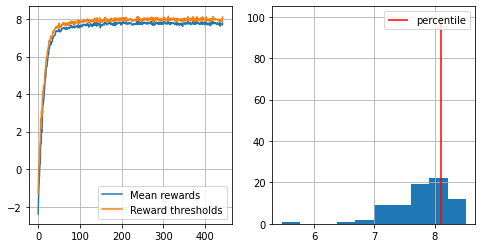

443
CPU times: user 3.33 s, sys: 101 ms, total: 3.43 s
Wall time: 3.34 s
mean reward = 7.785, threshold=8.036


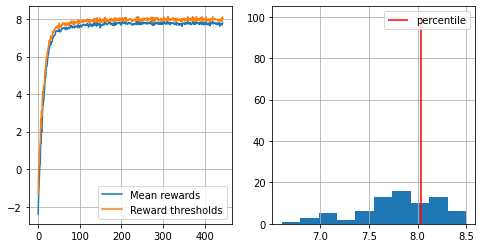

444
CPU times: user 3.32 s, sys: 74.1 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.689, threshold=7.872


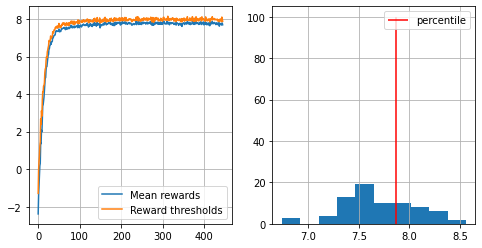

445
CPU times: user 3.33 s, sys: 84.2 ms, total: 3.41 s
Wall time: 3.33 s
mean reward = 7.629, threshold=7.796


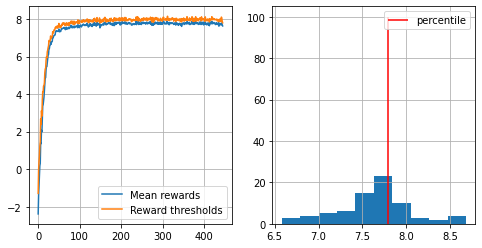

446
CPU times: user 3.29 s, sys: 64.2 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.737, threshold=7.940


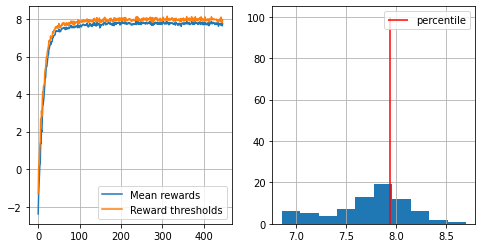

447
CPU times: user 3.31 s, sys: 70.3 ms, total: 3.38 s
Wall time: 3.31 s
mean reward = 7.731, threshold=8.000


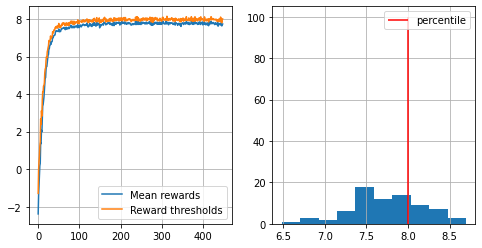

448
CPU times: user 3.29 s, sys: 76.2 ms, total: 3.37 s
Wall time: 3.29 s
mean reward = 7.750, threshold=8.000


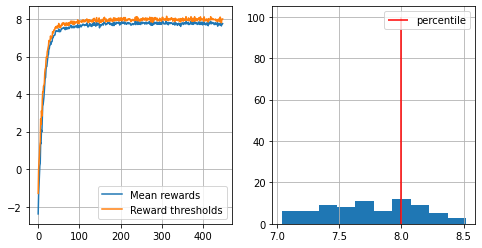

449
CPU times: user 3.32 s, sys: 64.9 ms, total: 3.39 s
Wall time: 3.32 s
mean reward = 7.666, threshold=7.876


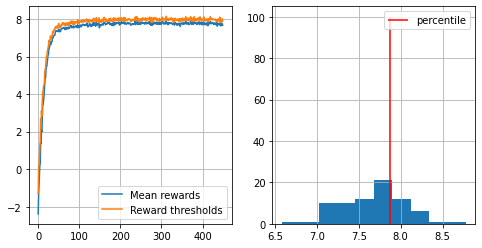

450
CPU times: user 3.37 s, sys: 66.9 ms, total: 3.44 s
Wall time: 3.37 s
mean reward = 7.741, threshold=7.940


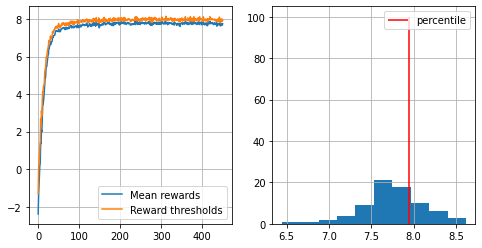

451
CPU times: user 3.29 s, sys: 63.1 ms, total: 3.35 s
Wall time: 3.28 s
mean reward = 7.704, threshold=7.896


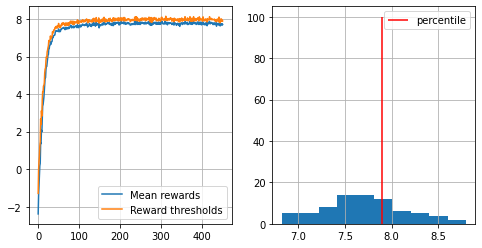

452
CPU times: user 3.31 s, sys: 87 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.748, threshold=8.000


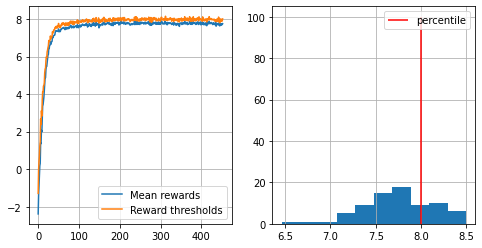

453
CPU times: user 3.31 s, sys: 77.4 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.733, threshold=7.940


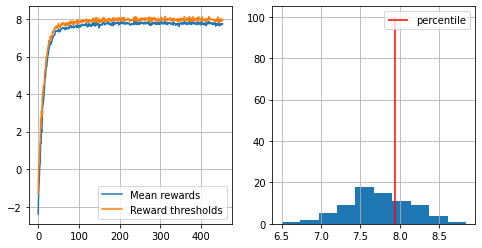

454
CPU times: user 3.31 s, sys: 77.8 ms, total: 3.39 s
Wall time: 3.31 s
mean reward = 7.679, threshold=7.892


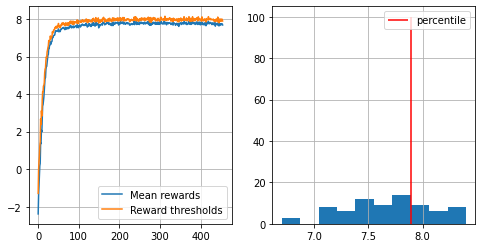

455
CPU times: user 3.29 s, sys: 61.2 ms, total: 3.35 s
Wall time: 3.29 s
mean reward = 7.800, threshold=7.976


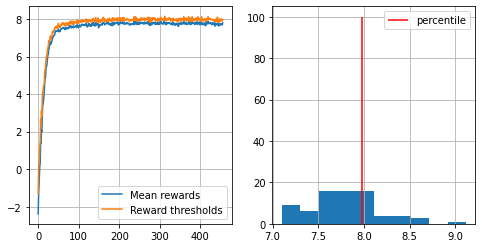

456
CPU times: user 3.31 s, sys: 85 ms, total: 3.4 s
Wall time: 3.32 s
mean reward = 7.723, threshold=8.000


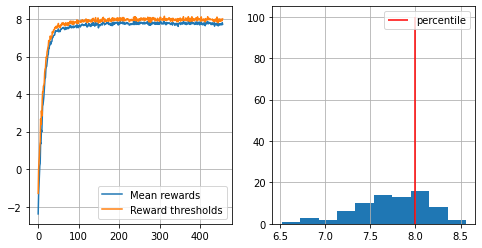

457
CPU times: user 3.27 s, sys: 58.6 ms, total: 3.33 s
Wall time: 3.27 s
mean reward = 7.832, threshold=8.036


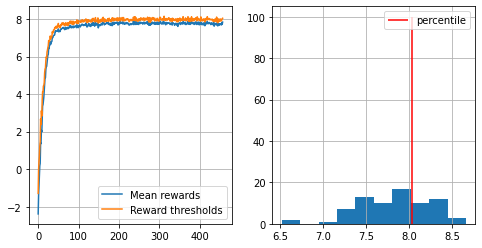

458
CPU times: user 3.4 s, sys: 75 ms, total: 3.47 s
Wall time: 3.4 s
mean reward = 7.705, threshold=7.956


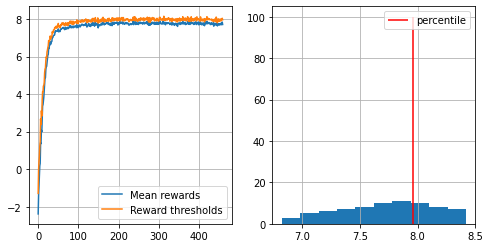

459
CPU times: user 3.26 s, sys: 58.3 ms, total: 3.32 s
Wall time: 3.25 s
mean reward = 7.879, threshold=8.108


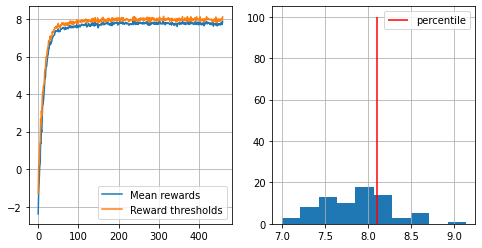

460
CPU times: user 3.38 s, sys: 71.9 ms, total: 3.45 s
Wall time: 3.39 s
mean reward = 7.750, threshold=7.936


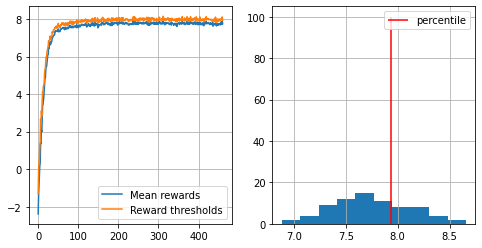

461
CPU times: user 3.88 s, sys: 116 ms, total: 3.99 s
Wall time: 4.1 s
mean reward = 7.811, threshold=8.016


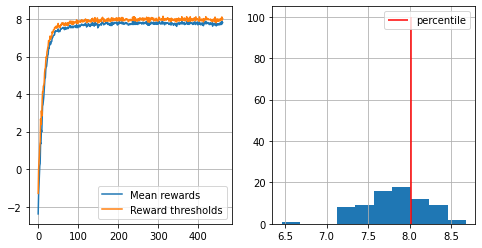

462
CPU times: user 3.61 s, sys: 103 ms, total: 3.71 s
Wall time: 3.68 s
mean reward = 7.728, threshold=7.936


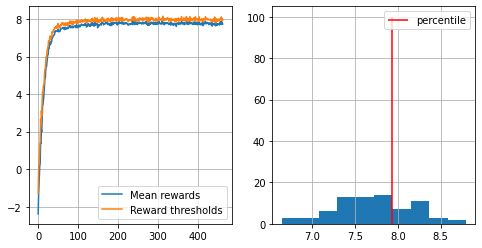

463
CPU times: user 3.91 s, sys: 95.1 ms, total: 4.01 s
Wall time: 4.09 s
mean reward = 7.829, threshold=8.052


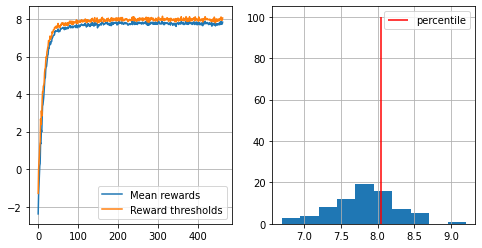

464


KeyboardInterrupt: 

mean reward = 7.829, threshold=8.052


KeyboardInterrupt: 

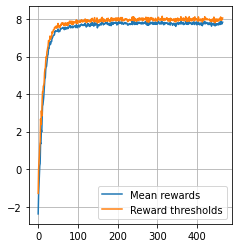

In [37]:
drawTaxi=False

numOfGames=50

def generate_session(policy,t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states,actions = [],[]
    total_reward = 0.
    
    
    arr=np.array(list(range(n_actions)))
    for games in range(numOfGames):
        s = env.reset()[0]
        for t in range(t_max):
            if drawTaxi == True:
                clear_output(wait=True)
                plt.imshow(env.render())
                plt.axis('off') # Hide axes for cleaner display
                plt.show()

            a=0

            a = np.random.choice(arr, p = policy[s])

            new_s,r,done,tr,info = env.step(a)

            #print(new_s)

            #Record state, action and add up reward to states,actions and total_reward accordingly. 
            #add state
            states.append(s)

            #add action
            actions.append(a)

            #add reward
            total_reward+=r

            s = new_s


            if done:
                break
    return states,actions,total_reward/numOfGames
        


n_sessions = 75  #sample this many sessions
perc = 70  #take this percent of session with highest rewards
learning_rate = 0.3  #add this thing to all counts for stability

log = []
mean = []

randActionProb=0.5
for i in range(1000):
    print(i)
    %time sessions = [generate_session(policy) for _ in range(n_sessions)]
    randActionProb*=0.95

    states_batch,actions_batch,rewards_batch = zip(*sessions)

    elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=perc)




    #set new policy
    new_policy = update_policy(elite_states,elite_actions)

    #update policy
    policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy

    #add mean value
    #curMean.append(np.mean(rewards_batch))

    
    #code here

    show_progress(rewards_batch,log)
    
    if(np.mean(rewards_batch) > 8):
        print("win!")
        break
        
        
drawTaxi=False
current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


0
CPU times: user 1min 6s, sys: 950 ms, total: 1min 7s
Wall time: 1min 6s
mean reward = 7.790, threshold=7.843


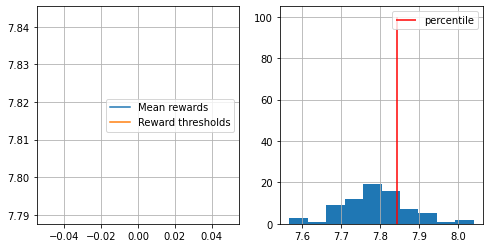

1
CPU times: user 1min 5s, sys: 880 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.777, threshold=7.834


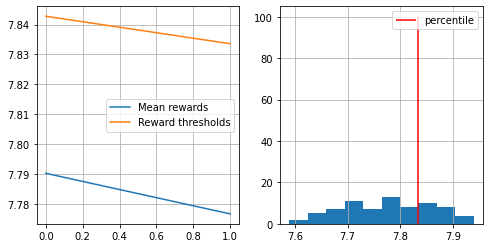

2
CPU times: user 1min 6s, sys: 948 ms, total: 1min 7s
Wall time: 1min 6s
mean reward = 7.799, threshold=7.839


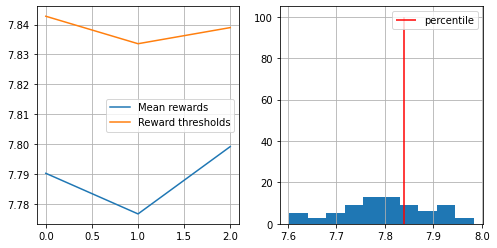

3
CPU times: user 1min 5s, sys: 867 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.802, threshold=7.846


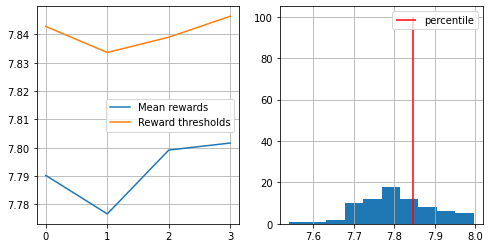

4
CPU times: user 1min 5s, sys: 892 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.796, threshold=7.858


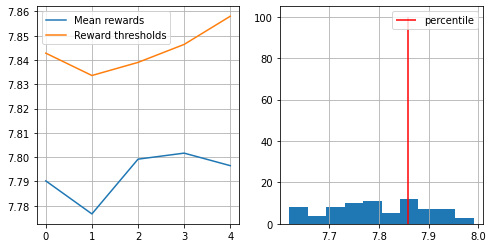

5
CPU times: user 1min 5s, sys: 875 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.793, threshold=7.833


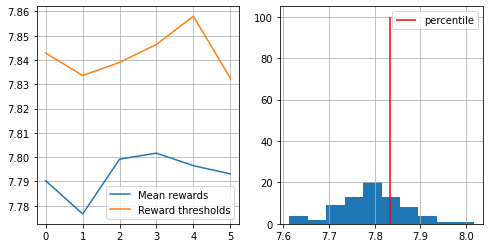

6
CPU times: user 1min 5s, sys: 938 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.798, threshold=7.832


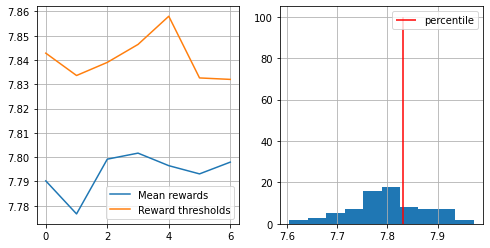

7
CPU times: user 1min 6s, sys: 957 ms, total: 1min 7s
Wall time: 1min 6s
mean reward = 7.811, threshold=7.861


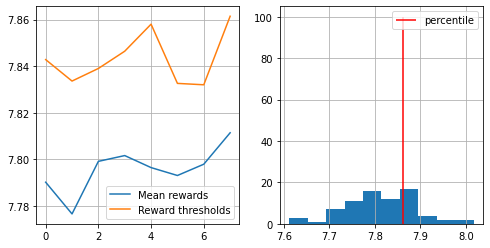

8
CPU times: user 1min 5s, sys: 861 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.819, threshold=7.861


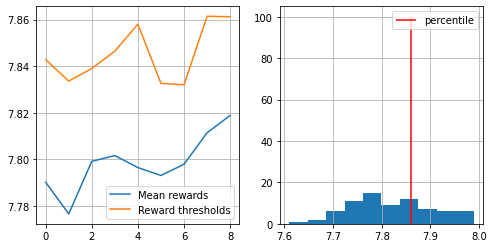

9
CPU times: user 1min 5s, sys: 895 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.815, threshold=7.875


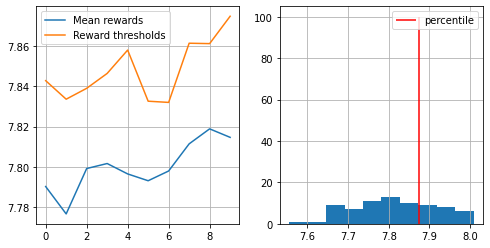

10
CPU times: user 1min 5s, sys: 881 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.792, threshold=7.833


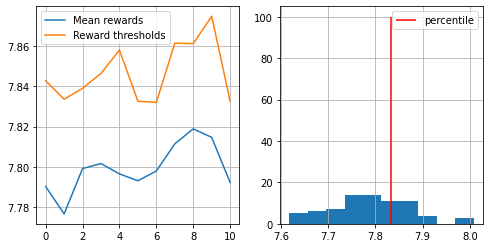

11
CPU times: user 1min 5s, sys: 892 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.806, threshold=7.851


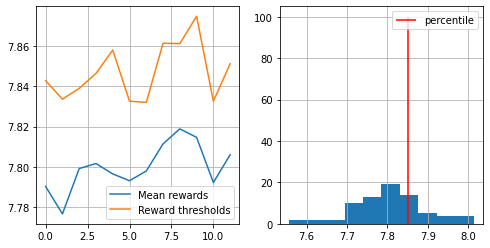

12
CPU times: user 1min 5s, sys: 889 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.817, threshold=7.855


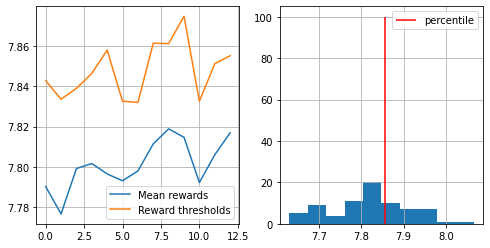

13
CPU times: user 1min 6s, sys: 920 ms, total: 1min 7s
Wall time: 1min 6s
mean reward = 7.808, threshold=7.859


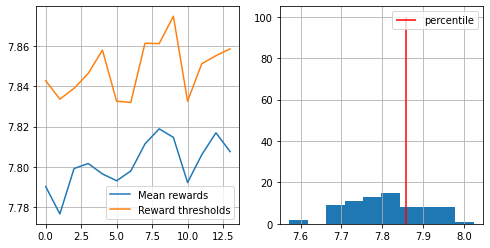

14
CPU times: user 1min 5s, sys: 857 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.816, threshold=7.860


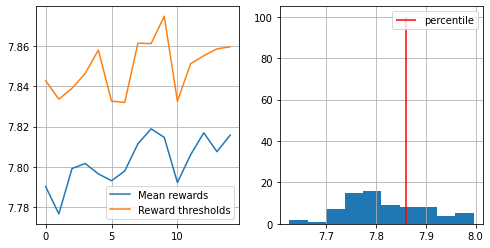

15
CPU times: user 1min 5s, sys: 881 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.831, threshold=7.881


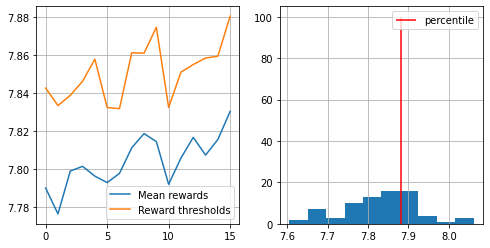

16
CPU times: user 1min 5s, sys: 897 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.823, threshold=7.875


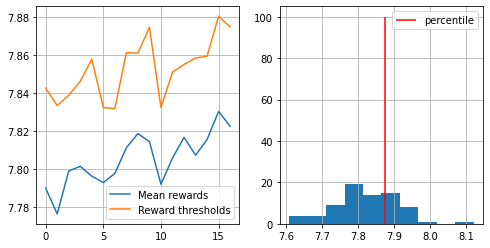

17
CPU times: user 1min 5s, sys: 906 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.828, threshold=7.878


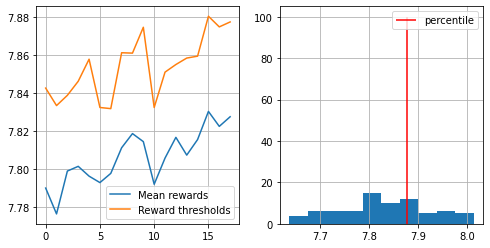

18
CPU times: user 1min 5s, sys: 874 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.834, threshold=7.871


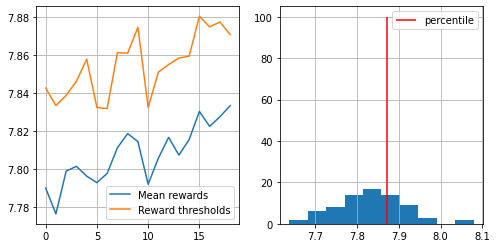

19
CPU times: user 1min 5s, sys: 866 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.837, threshold=7.881


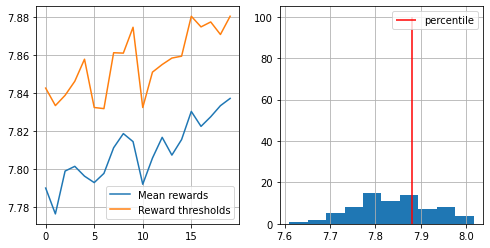

20
CPU times: user 1min 6s, sys: 973 ms, total: 1min 7s
Wall time: 1min 6s
mean reward = 7.837, threshold=7.884


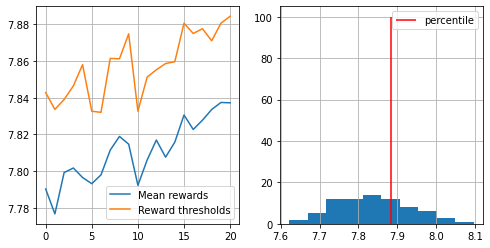

21
CPU times: user 1min 5s, sys: 894 ms, total: 1min 6s
Wall time: 1min 4s
mean reward = 7.852, threshold=7.902


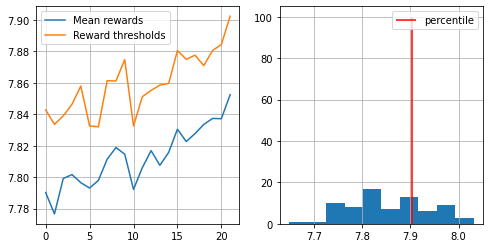

22
CPU times: user 1min 5s, sys: 894 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.824, threshold=7.878


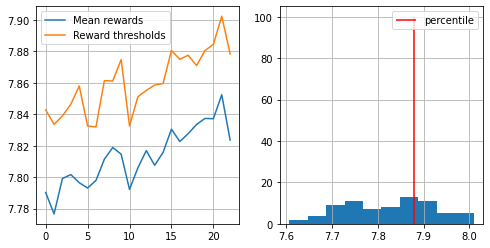

23
CPU times: user 1min 5s, sys: 907 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.831, threshold=7.878


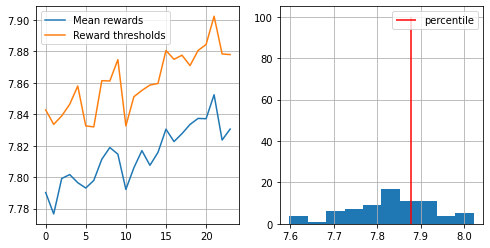

24
CPU times: user 1min 5s, sys: 861 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.833, threshold=7.876


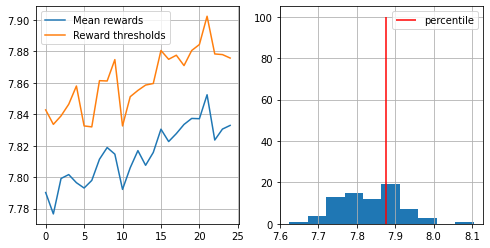

25
CPU times: user 1min 5s, sys: 876 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.833, threshold=7.878


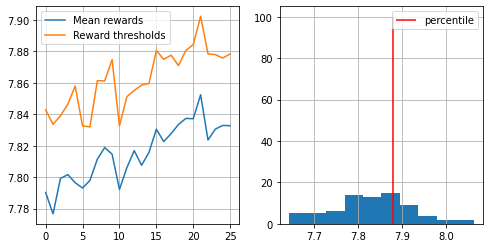

26
CPU times: user 1min 5s, sys: 915 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.837, threshold=7.871


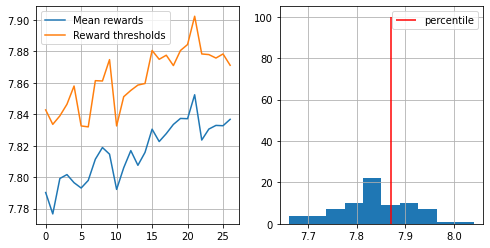

27
CPU times: user 1min 5s, sys: 878 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.849, threshold=7.890


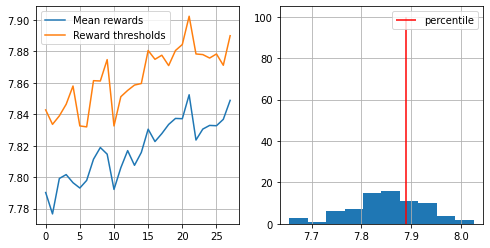

28
CPU times: user 1min 5s, sys: 858 ms, total: 1min 6s
Wall time: 1min 4s
mean reward = 7.825, threshold=7.869


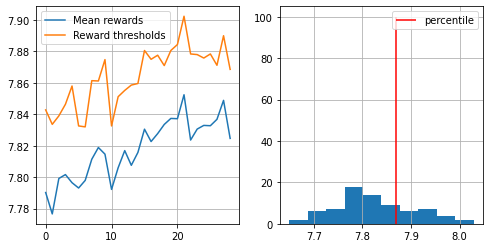

29
CPU times: user 1min 5s, sys: 912 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.825, threshold=7.886


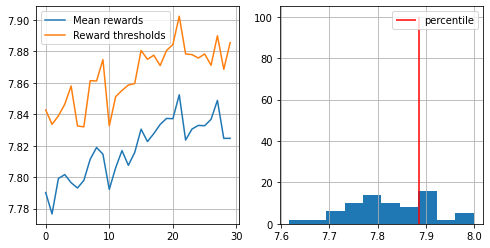

30
CPU times: user 1min 4s, sys: 869 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.829, threshold=7.859


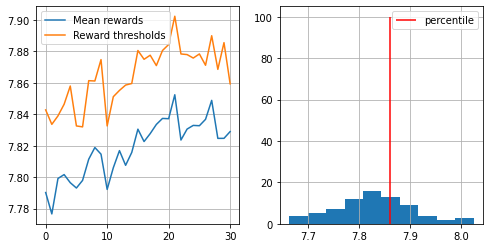

31
CPU times: user 1min 5s, sys: 967 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.845, threshold=7.882


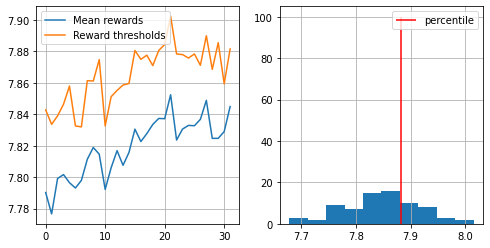

32
CPU times: user 1min 4s, sys: 842 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.832, threshold=7.892


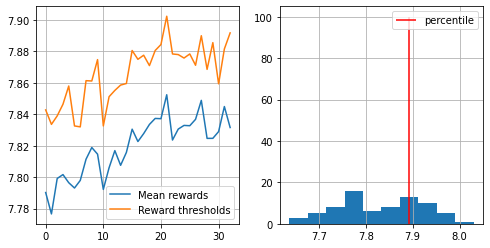

33
CPU times: user 1min 5s, sys: 952 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.838, threshold=7.881


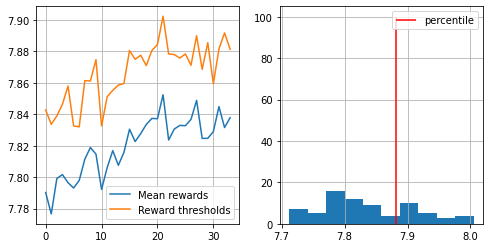

34
CPU times: user 1min 4s, sys: 816 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.847, threshold=7.888


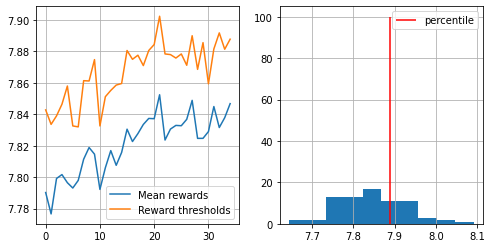

35
CPU times: user 1min 5s, sys: 864 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.821, threshold=7.861


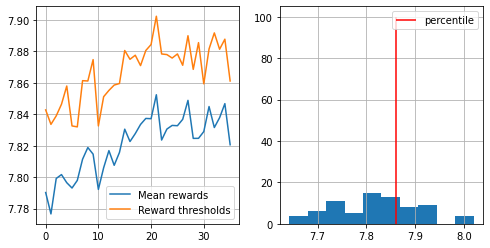

36
CPU times: user 1min 5s, sys: 982 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.817, threshold=7.857


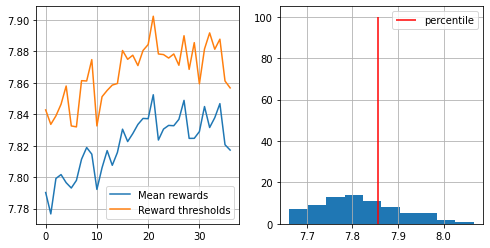

37
CPU times: user 1min 5s, sys: 864 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.824, threshold=7.862


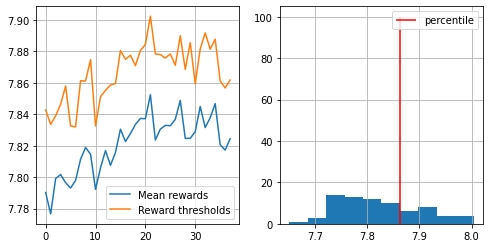

38
CPU times: user 1min 5s, sys: 947 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.832, threshold=7.884


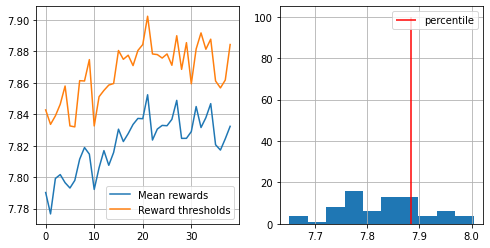

39
CPU times: user 1min 4s, sys: 858 ms, total: 1min 5s
Wall time: 1min 4s
mean reward = 7.858, threshold=7.902


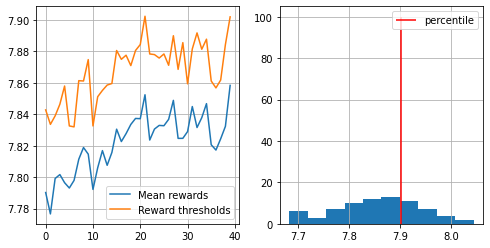

40
CPU times: user 1min 5s, sys: 909 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.829, threshold=7.866


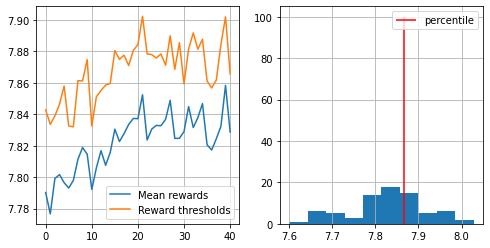

41
CPU times: user 1min 5s, sys: 965 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.843, threshold=7.888


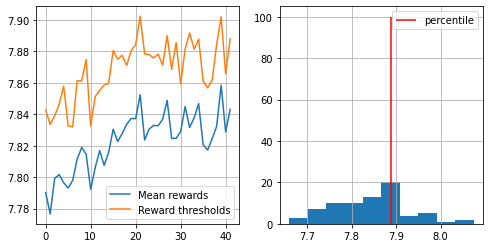

42
CPU times: user 1min 17s, sys: 1.71 s, total: 1min 19s
Wall time: 1min 24s
mean reward = 7.831, threshold=7.870


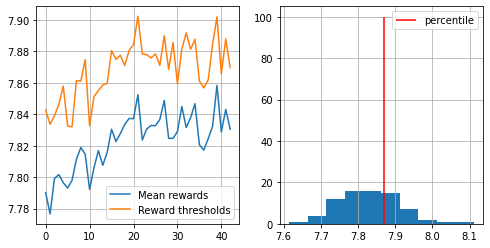

43
CPU times: user 1min 5s, sys: 865 ms, total: 1min 6s
Wall time: 1min 5s
mean reward = 7.838, threshold=7.870


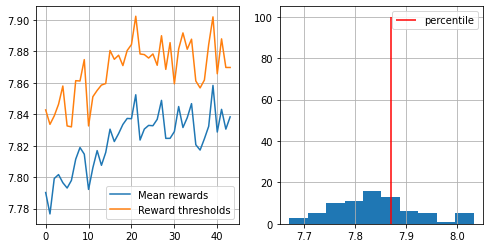

44


KeyboardInterrupt: 

KeyboardInterrupt: 

In [41]:

policyOld = policy.copy()
#print(policyOld)

numOfGames=1000

def generate_session(policy,t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states,actions = [],[]
    total_reward = 0.
    
    
    arr=np.array(list(range(n_actions)))
    for games in range(numOfGames):
        s = env.reset()[0]
        for t in range(t_max):
            if drawTaxi == True:
                clear_output(wait=True)
                plt.imshow(env.render())
                plt.axis('off') # Hide axes for cleaner display
                plt.show()

            a=0

            a = np.random.choice(arr, p = policy[s])

            new_s,r,done,tr,info = env.step(a)

            #print(new_s)

            #Record state, action and add up reward to states,actions and total_reward accordingly. 
            #add state
            states.append(s)

            #add action
            actions.append(a)

            #add reward
            total_reward+=r

            s = new_s


            if done:
                break
    return states,actions,total_reward/numOfGames
        


n_sessions = 75  #sample this many sessions
perc = 70  #take this percent of session with highest rewards
learning_rate = 0.5  #add this thing to all counts for stability

log = []
mean = []
#policy = policyOld.copy()
randActionProb=0.5
for i in range(2000):
    print(i)
    %time sessions = [generate_session(policy) for _ in range(n_sessions)]
    randActionProb*=0.95

    states_batch,actions_batch,rewards_batch = zip(*sessions)

    elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=perc)




    #set new policy
    new_policy = update_policy(elite_states,elite_actions)

    #update policy
    policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy

    #add mean value
    #curMean.append(np.mean(rewards_batch))

    
    #code here

    show_progress(rewards_batch,log)
  
    if(np.mean(rewards_batch) > 8):
        print("win!")
        break
    

current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


0
CPU times: user 11min 11s, sys: 10.6 s, total: 11min 22s
Wall time: 11min 15s
mean reward = 7.841, threshold=7.855


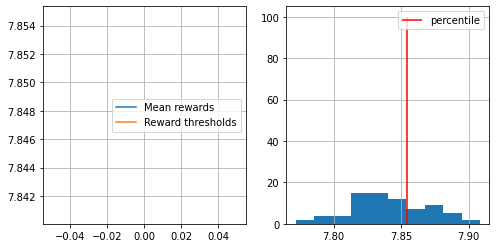

1
CPU times: user 10min 52s, sys: 9.19 s, total: 11min 1s
Wall time: 10min 51s
mean reward = 7.842, threshold=7.856


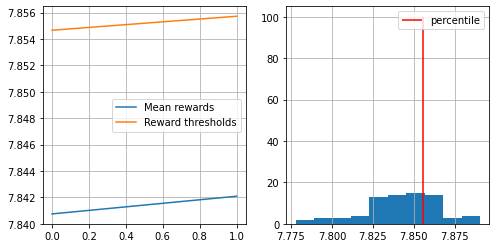

2
CPU times: user 10min 50s, sys: 9.01 s, total: 10min 59s
Wall time: 10min 48s
mean reward = 7.839, threshold=7.851


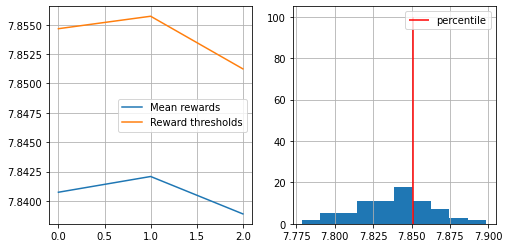

3
CPU times: user 10min 51s, sys: 9.06 s, total: 11min
Wall time: 10min 49s
mean reward = 7.842, threshold=7.855


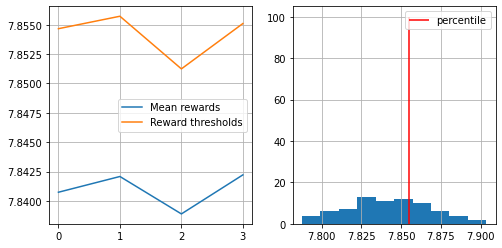

4
CPU times: user 10min 49s, sys: 8.74 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.844, threshold=7.858


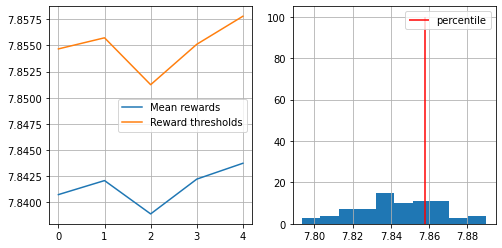

5
CPU times: user 10min 51s, sys: 8.84 s, total: 11min
Wall time: 10min 49s
mean reward = 7.838, threshold=7.852


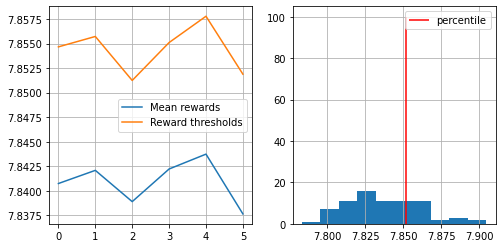

6
CPU times: user 10min 49s, sys: 8.92 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.837, threshold=7.850


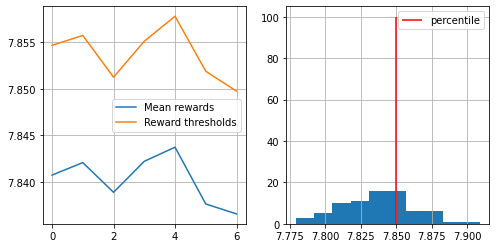

7
CPU times: user 10min 51s, sys: 8.68 s, total: 11min
Wall time: 10min 49s
mean reward = 7.845, threshold=7.859


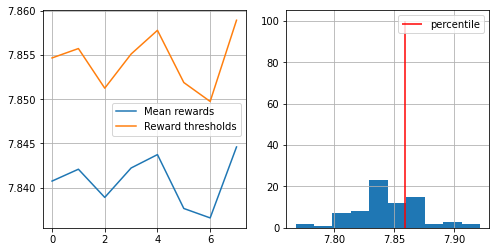

8
CPU times: user 10min 50s, sys: 9.01 s, total: 10min 59s
Wall time: 10min 48s
mean reward = 7.845, threshold=7.860


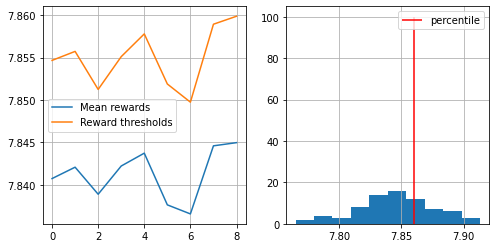

9
CPU times: user 10min 51s, sys: 8.98 s, total: 11min
Wall time: 10min 50s
mean reward = 7.842, threshold=7.856


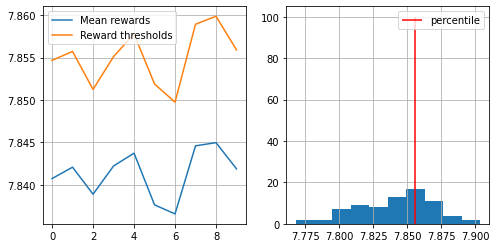

10
CPU times: user 10min 49s, sys: 8.82 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.841, threshold=7.851


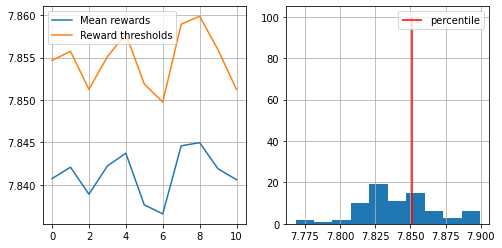

11
CPU times: user 10min 53s, sys: 9.06 s, total: 11min 2s
Wall time: 10min 51s
mean reward = 7.837, threshold=7.849


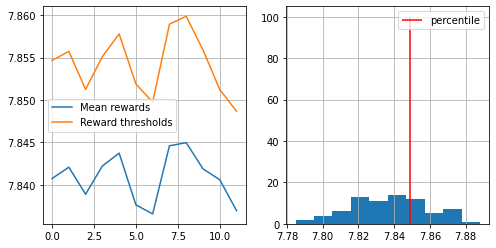

12
CPU times: user 10min 50s, sys: 9.05 s, total: 11min
Wall time: 10min 48s
mean reward = 7.838, threshold=7.856


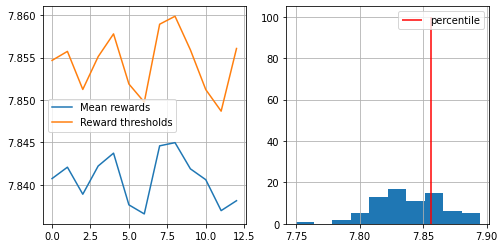

13
CPU times: user 10min 49s, sys: 8.68 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.840, threshold=7.857


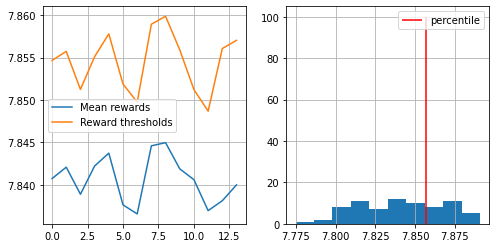

14
CPU times: user 10min 46s, sys: 8.67 s, total: 10min 55s
Wall time: 10min 44s
mean reward = 7.843, threshold=7.858


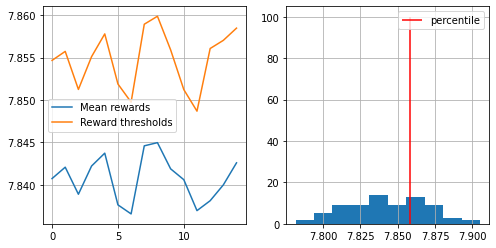

15
CPU times: user 10min 48s, sys: 8.72 s, total: 10min 57s
Wall time: 10min 47s
mean reward = 7.838, threshold=7.855


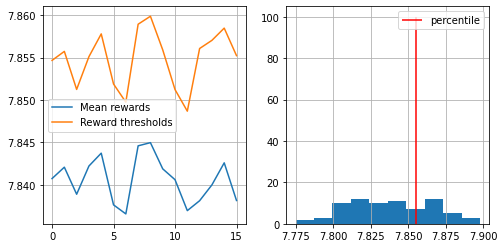

16
CPU times: user 10min 49s, sys: 8.97 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.844, threshold=7.860


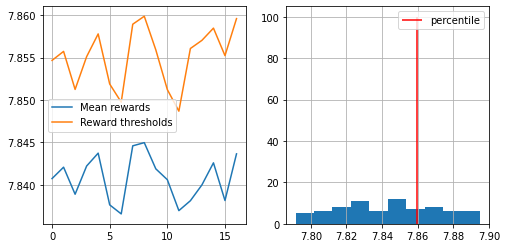

17
CPU times: user 10min 48s, sys: 8.64 s, total: 10min 57s
Wall time: 10min 46s
mean reward = 7.839, threshold=7.854


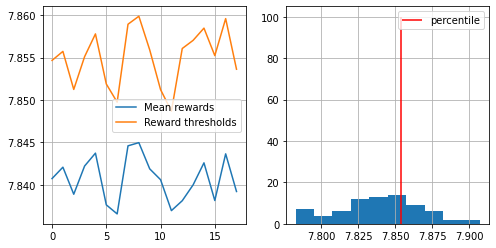

18
CPU times: user 10min 47s, sys: 8.85 s, total: 10min 56s
Wall time: 10min 45s
mean reward = 7.844, threshold=7.859


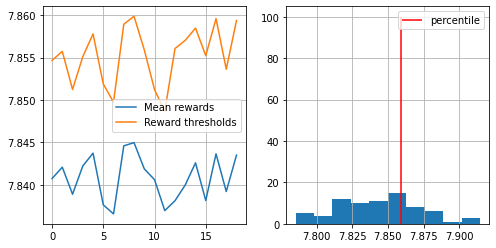

19
CPU times: user 10min 45s, sys: 8.62 s, total: 10min 54s
Wall time: 10min 43s
mean reward = 7.840, threshold=7.857


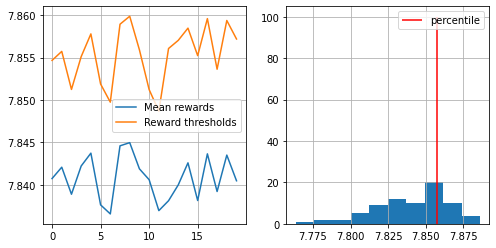

20
CPU times: user 10min 48s, sys: 8.95 s, total: 10min 57s
Wall time: 10min 47s
mean reward = 7.843, threshold=7.858


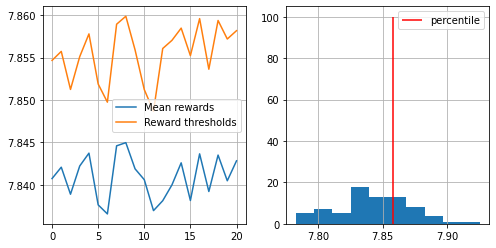

21
CPU times: user 10min 47s, sys: 8.67 s, total: 10min 56s
Wall time: 10min 45s
mean reward = 7.847, threshold=7.863


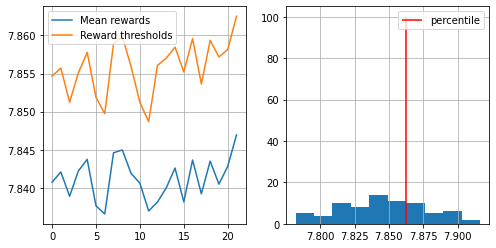

22
CPU times: user 10min 49s, sys: 9.52 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.845, threshold=7.862


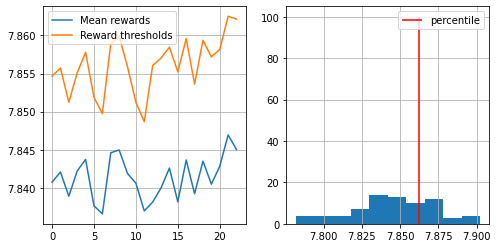

23
CPU times: user 10min 50s, sys: 9.02 s, total: 10min 59s
Wall time: 10min 48s
mean reward = 7.847, threshold=7.862


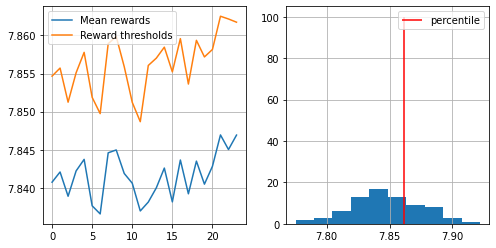

24
CPU times: user 10min 48s, sys: 8.73 s, total: 10min 57s
Wall time: 10min 46s
mean reward = 7.841, threshold=7.854


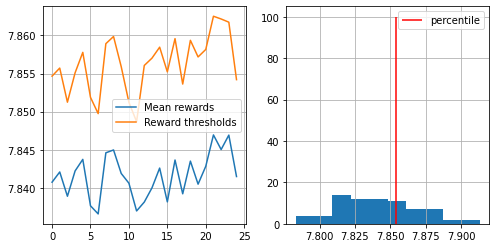

25
CPU times: user 10min 50s, sys: 8.92 s, total: 10min 59s
Wall time: 10min 48s
mean reward = 7.842, threshold=7.855


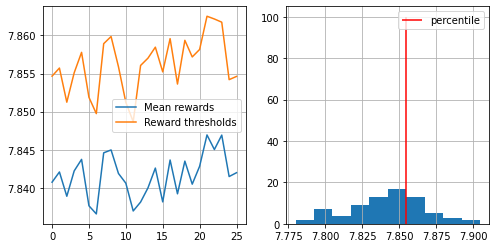

26
CPU times: user 10min 48s, sys: 8.98 s, total: 10min 57s
Wall time: 10min 46s
mean reward = 7.844, threshold=7.853


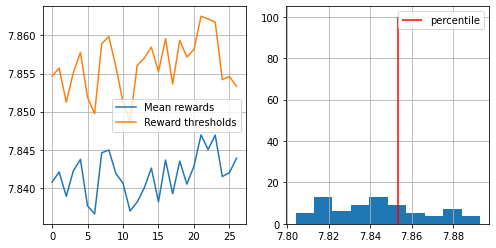

27
CPU times: user 10min 48s, sys: 8.6 s, total: 10min 57s
Wall time: 10min 46s
mean reward = 7.839, threshold=7.852


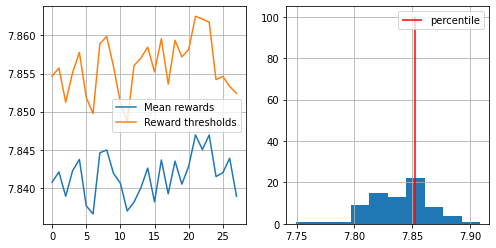

28
CPU times: user 10min 49s, sys: 9.09 s, total: 10min 58s
Wall time: 10min 47s
mean reward = 7.844, threshold=7.858


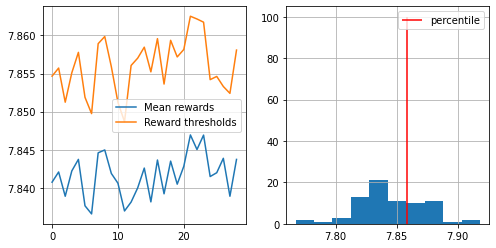

29


KeyboardInterrupt: 

In [53]:
drawTaxi=False

policy = policyLast.copy()

numOfGames=10000

def generate_session(policy,t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states,actions = [],[]
    total_reward = 0.
    
    
    arr=np.array(list(range(n_actions)))
    for games in range(numOfGames):
        s = env.reset()[0]
        for t in range(t_max):
            if drawTaxi == True:
                clear_output(wait=True)
                plt.imshow(env.render())
                plt.axis('off') # Hide axes for cleaner display
                plt.show()

            a=0

            a = np.random.choice(arr, p = policy[s])

            new_s,r,done,tr,info = env.step(a)

            #print(new_s)

            #Record state, action and add up reward to states,actions and total_reward accordingly. 
            #add state
            states.append(s)

            #add action
            actions.append(a)

            #add reward
            total_reward+=r

            s = new_s


            if done:
                break
    return states,actions,total_reward/numOfGames
        


n_sessions = 75  #sample this many sessions
perc = 70  #take this percent of session with highest rewards
learning_rate = 0.3  #add this thing to all counts for stability

log = []
mean = []

randActionProb=0.5
for i in range(1000):
    print(i)
    %time sessions = [generate_session(policy) for _ in range(n_sessions)]
    randActionProb*=0.95

    states_batch,actions_batch,rewards_batch = zip(*sessions)

    elite_states, elite_actions = select_elites(states_batch,actions_batch,np.array(rewards_batch),percentile=perc)




    #set new policy
    new_policy = update_policy(elite_states,elite_actions)

    #update policy
    policy = policy*(1-learning_rate) + new_policy * learning_rate #update policy

    #add mean value
    #curMean.append(np.mean(rewards_batch))

    
    #code here

    show_progress(rewards_batch,log)
    
    if(np.mean(rewards_batch) > 8):
        print("win!")
        break
        
        
drawTaxi=False
current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


In [54]:
doArgmax=False
#policyLast = policy.copy()
drawTaxi=False

def generate_session(policy,t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states,actions = [],[]
    total_reward = 0.
    
    
    arr=np.array(list(range(n_actions)))
    s = env.reset()[0]
    for t in range(t_max):
        if drawTaxi == True:
            clear_output(wait=True)
            plt.imshow(env.render())
            plt.axis('off') # Hide axes for cleaner display
            plt.show()

        a=0
        if doArgmax==False:
            a = np.random.choice(arr, p = policy[s])
        else:
            a = np.argmax(policy[s])
        #print(a)

        new_s,r,done,tr,info = env.step(a)


        #print(new_s)

        #Record state, action and add up reward to states,actions and total_reward accordingly. 
        #add state
        states.append(s)

        #add action
        actions.append(a)

        #add reward
        total_reward+=r

        s = new_s


        if done:
            break
    return states,actions,total_reward



%time sessions = [generate_session(policy) for _ in range(5000)]

states_batch,actions_batch,rewards_batch = zip(*sessions)

print(np.mean(rewards_batch))

doArgmax=True

%time sessions = [generate_session(policy) for _ in range(5000)]

states_batch,actions_batch,rewards_batch = zip(*sessions)

print(np.mean(rewards_batch))


doArgmax=False

CPU times: user 6.53 s, sys: 150 ms, total: 6.68 s
Wall time: 6.8 s
7.8334
CPU times: user 3.17 s, sys: 296 ms, total: 3.47 s
Wall time: 3.22 s
7.8922


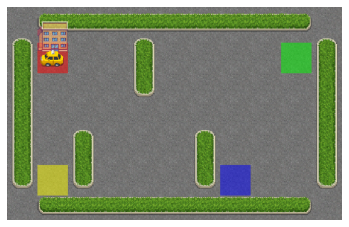

([372, 472, 476, 376, 276, 256, 236, 136, 36, 16],
 [0, 4, 1, 1, 3, 3, 1, 1, 3, 5],
 11.0)

In [55]:
doArgmax=False
current_datetime = datetime.now()
formatted_time = current_datetime.strftime("%H:%M:%S")
print(f"Formatted current time: {formatted_time}")


from IPython.display import clear_output
drawTaxi=True
randActionProb=0
generate_session(policy)

# Digging deeper: approximate crossentropy with neural nets (2 pts)

In this section we will train a neural network policy for continuous state space game

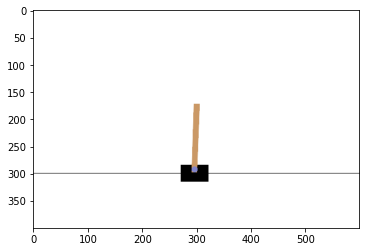

In [56]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
env = gym.make("CartPole-v1", render_mode="rgb_array").env  #if you see "<classname> has no attribute .env", remove .env or update gym

env.reset()
n_actions = env.action_space.n

plt.imshow(env.render())

In this case use NN as a black box. All your should know that it is more complex than a tabular method. 

In [57]:
#create agent
from sklearn.neural_network import MLPClassifier
agent = MLPClassifier(hidden_layer_sizes=(20,20),
                      activation='tanh',
                      warm_start=True, #keep progress between .fit(...) calls
                      max_iter=1 #make only 1 iteration on each .fit(...)
                     )

print(env.reset())
#initialize agent to the dimension of state an amount of actions
agent.fit([env.reset()[0]]*n_actions,range(n_actions));


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


(array([0.00560936, 0.00899447, 0.0284185 , 0.01529063], dtype=float32), {})


/Users/Apple/Library/Python/3.9/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  warnings.warn(


In [63]:
drawPole=False

def generate_session(t_max=1000):

    states,actions = [],[]
    total_reward = 0

    s = env.reset()[0]
    

    for t in range(t_max):

        #clear_output(wait=True)
        if drawPole==True:
            clear_output(wait=True)
            plt.imshow(env.render())
            plt.axis('off') # Hide axes for cleaner display
            plt.show()

        #predict array of action probabilities hint: predict_proba
        probs = agent.predict_proba([s])[0]

        a = np.random.choice(np.arange(n_actions), p=probs)

        new_s,r,done,tr,info = env.step(a)

        r-=(abs(s[0])**3+abs(s[1])+abs(s[2])+abs(s[3]))/10

        #record sessions like you did before
        states.append(s)

        #add action
        actions.append(a)

        #add reward
        total_reward+=r


        s = new_s
        if done: break
    return states,actions,total_reward


In [60]:
def select_elites(states_batch,actions_batch,rewards_batch,percentile=50):
    """
    Select states and actions from games that have rewards >= percentile
    :param states_batch: list of lists of states, states_batch[session_i][t]
    :param actions_batch: list of lists of actions, actions_batch[session_i][t]
    :param rewards_batch: list of rewards, rewards_batch[session_i][t]
    
    :returns: elite_states,elite_actions, both 1D lists of states and respective actions from elite sessions
    
    Please return elite states and actions in their original order 
    [i.e. sorted by session number and timestep within session]
    
    If you're confused, see examples below. Please don't assume that states are integers (they'll get different later).
    """ 
    reward_threshold = np.percentile(rewards_batch,percentile) #recalc threshold. hint : np.percentile

    ind=np.where(rewards_batch>=reward_threshold)[0]
    
    elite_states1 = [states_batch[i] for i in ind]
    elite_states = [
        x
        for xs in elite_states1
        for x in xs
    ]
    
    elite_actions1 = [actions_batch[i] for i in ind]
    elite_actions = [
        x
        for xs in elite_actions1
        for x in xs
    ]
    
    #if(len(np.array(states_batch[0]).shape) == 1):
    #    elite_states = np.hstack()#states)
    #else:
    #    elite_states = np.vstack()#states)
    #        
    #elite_actions = np.hstack()#actions)
    
    return elite_states,elite_actions
    

To train this classification model use fit(states, actions). In this case we are training classificator to predict the correct class (action) in a given state

mean reward = 15.567, threshold=18.063


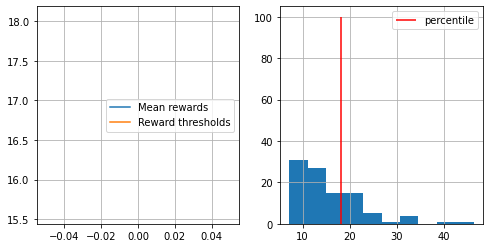

mean reward = 17.356, threshold=19.613


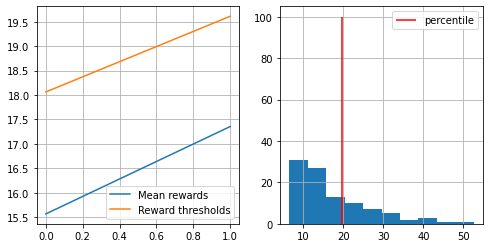

mean reward = 19.330, threshold=21.239


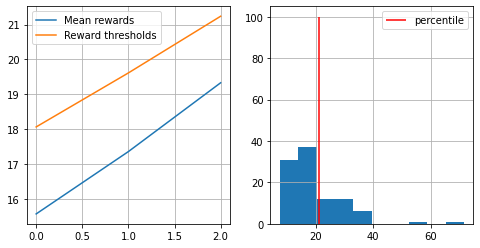

mean reward = 22.786, threshold=25.490


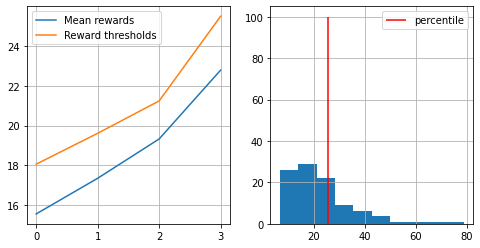

mean reward = 27.491, threshold=31.480


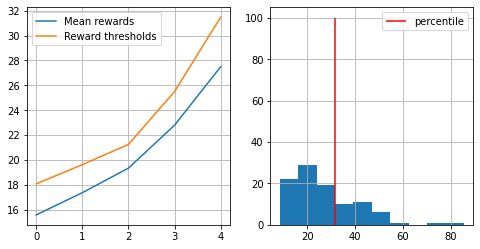

mean reward = 31.732, threshold=36.184


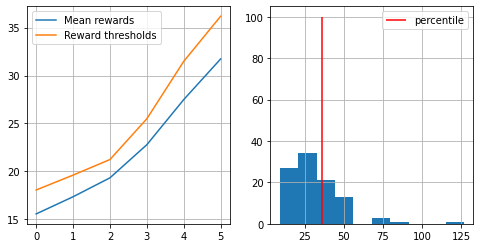

mean reward = 34.878, threshold=41.952


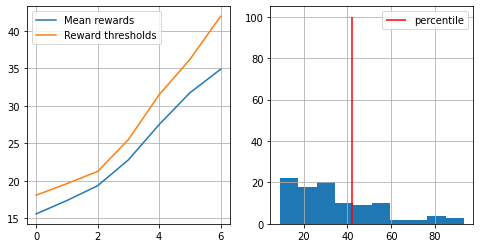

mean reward = 38.873, threshold=47.024


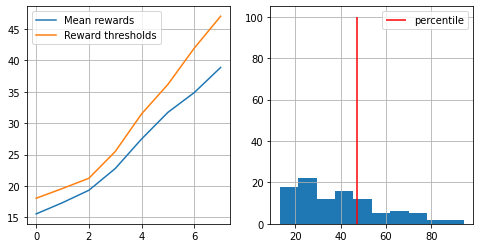

mean reward = 43.958, threshold=50.089


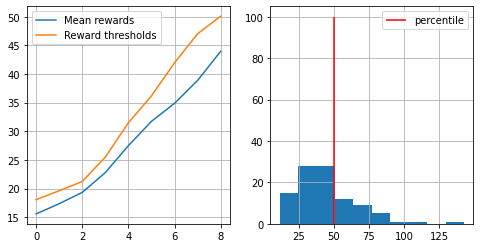

mean reward = 43.263, threshold=48.520


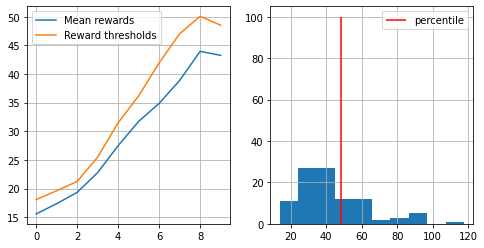

mean reward = 45.547, threshold=53.813


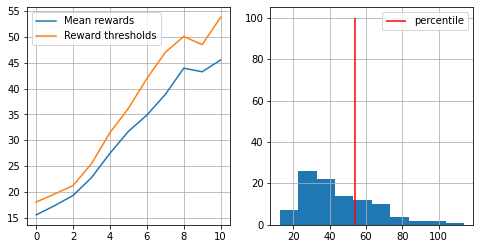

mean reward = 50.679, threshold=58.255


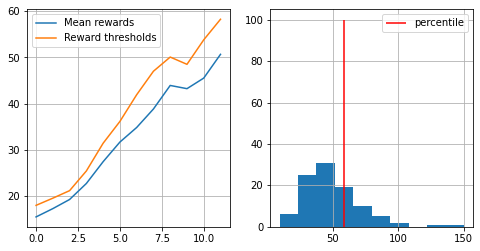

mean reward = 50.211, threshold=56.717


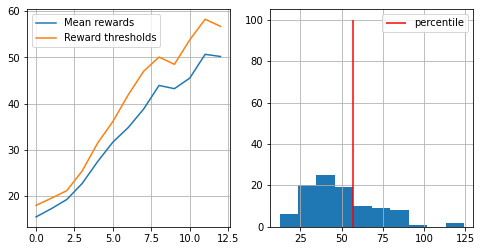

mean reward = 49.065, threshold=55.549


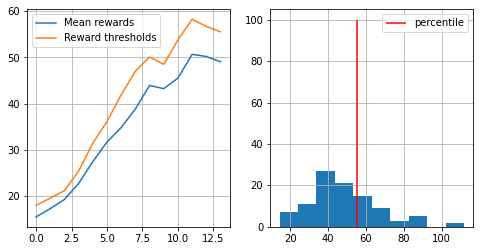

mean reward = 48.502, threshold=54.627


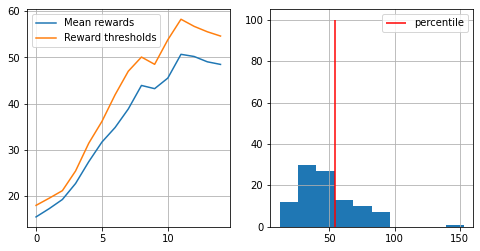

mean reward = 57.222, threshold=65.021


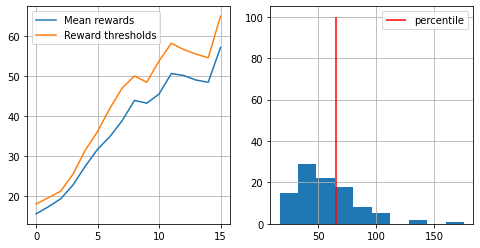

mean reward = 56.664, threshold=61.797


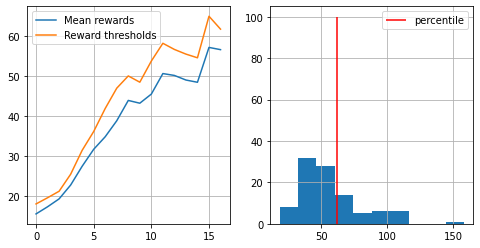

mean reward = 62.257, threshold=66.754


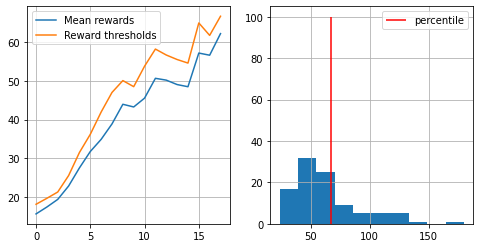

mean reward = 57.802, threshold=65.896


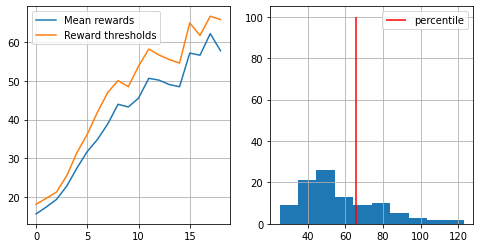

mean reward = 66.675, threshold=76.813


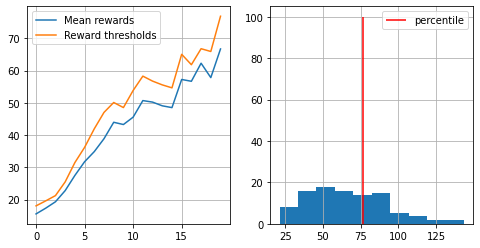

mean reward = 69.028, threshold=76.987


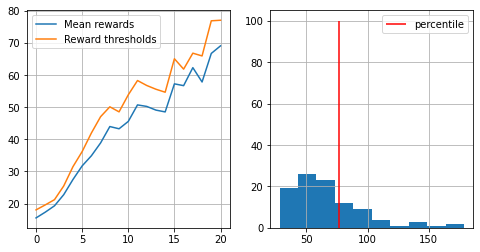

mean reward = 71.661, threshold=80.161


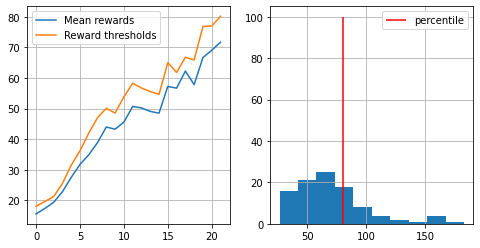

mean reward = 72.890, threshold=76.247


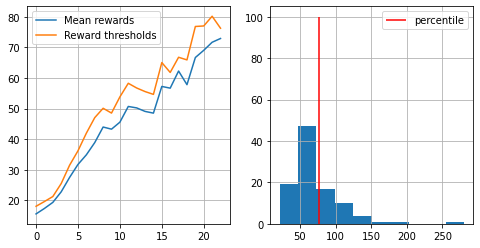

mean reward = 75.103, threshold=85.863


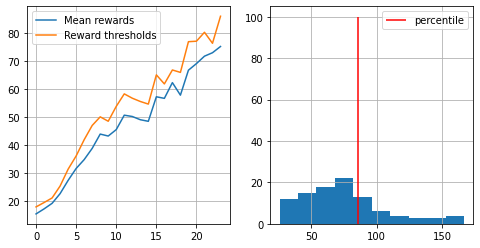

mean reward = 77.726, threshold=89.056


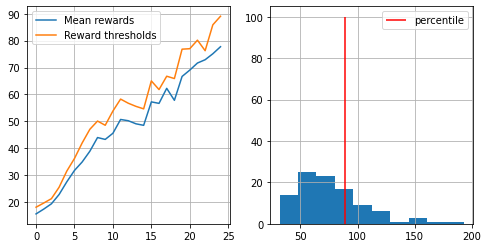

mean reward = 79.979, threshold=86.188


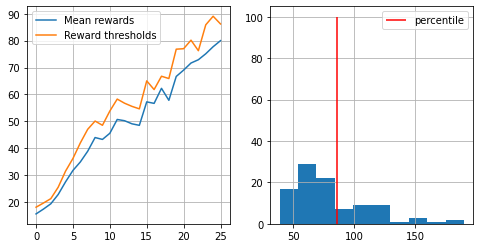

mean reward = 86.808, threshold=99.253


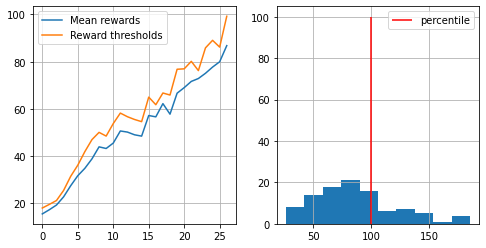

mean reward = 90.446, threshold=100.047


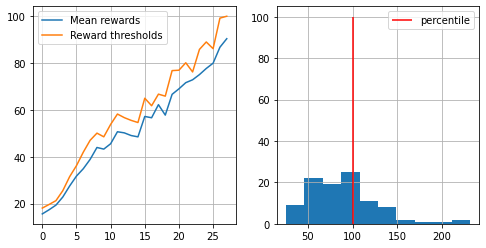

mean reward = 88.107, threshold=102.430


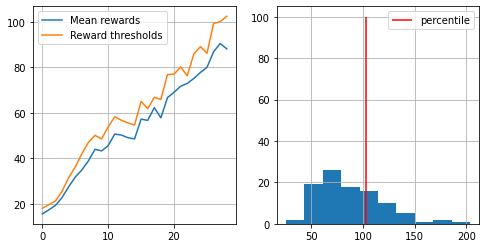

mean reward = 95.957, threshold=106.217


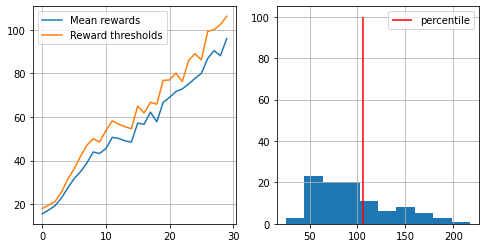

mean reward = 109.152, threshold=121.112


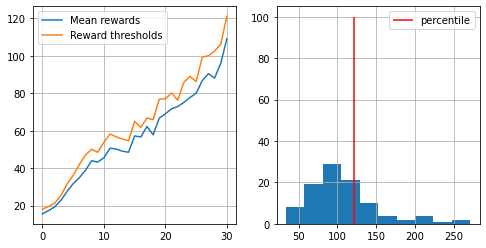

mean reward = 112.918, threshold=129.795


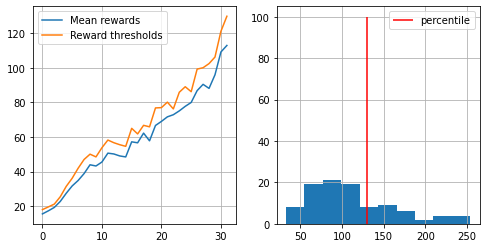

mean reward = 124.685, threshold=130.113


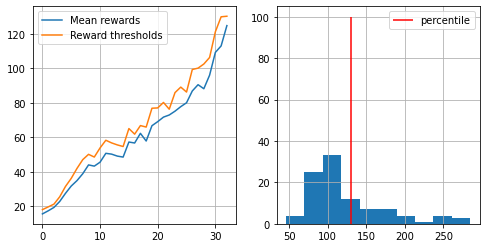

mean reward = 132.228, threshold=141.480


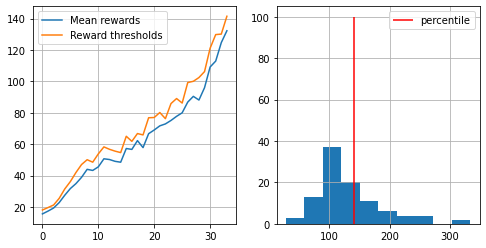

mean reward = 129.188, threshold=142.529


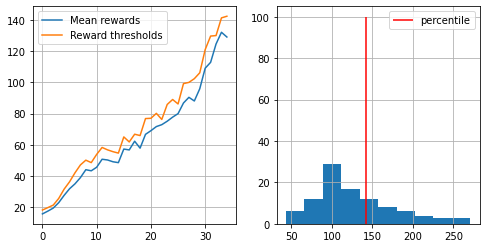

mean reward = 140.999, threshold=155.072


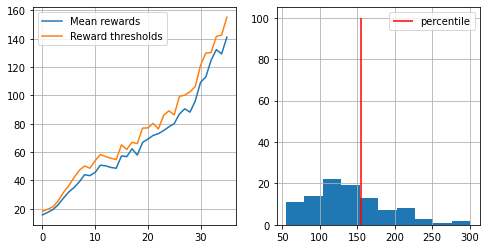

mean reward = 148.285, threshold=165.698


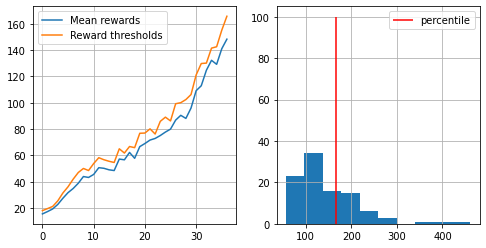

mean reward = 165.602, threshold=181.486


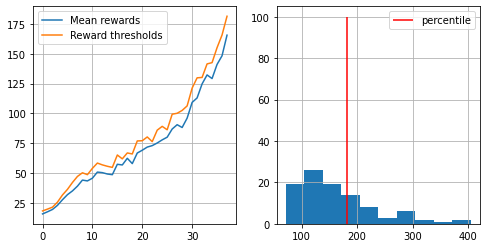

mean reward = 164.335, threshold=177.786


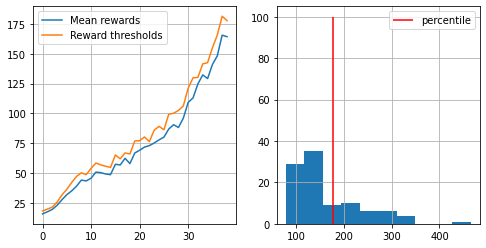

mean reward = 180.499, threshold=208.016


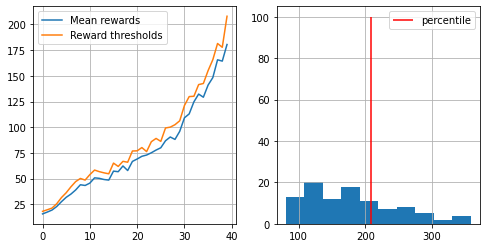

mean reward = 165.405, threshold=200.127


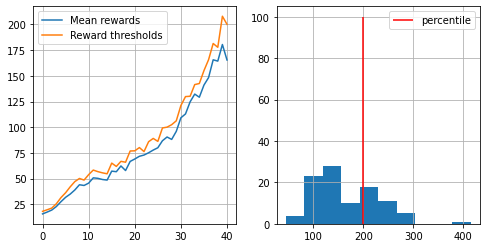

mean reward = 177.938, threshold=216.829


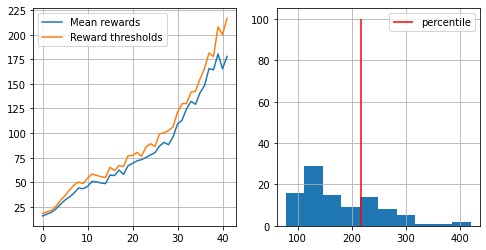

mean reward = 174.305, threshold=194.316


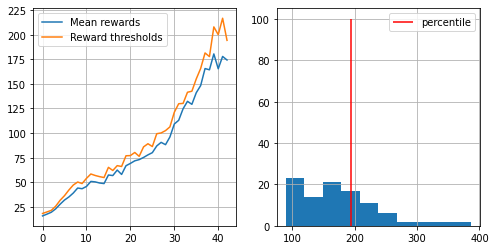

mean reward = 181.795, threshold=220.131


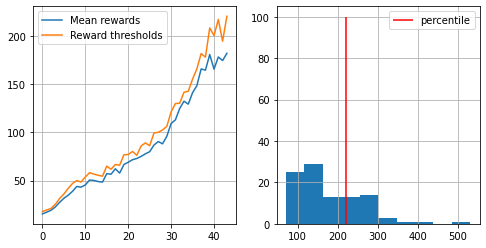

mean reward = 179.768, threshold=206.146


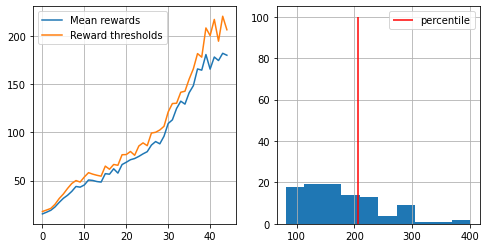

mean reward = 184.265, threshold=212.458


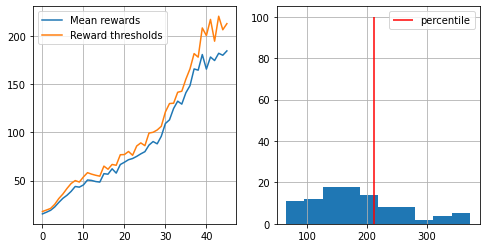

mean reward = 209.411, threshold=252.991


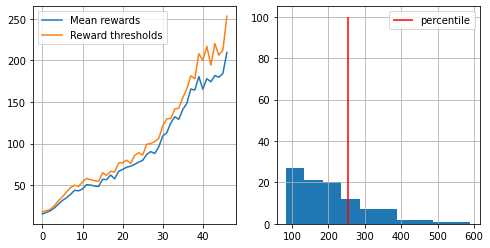

mean reward = 227.957, threshold=272.019


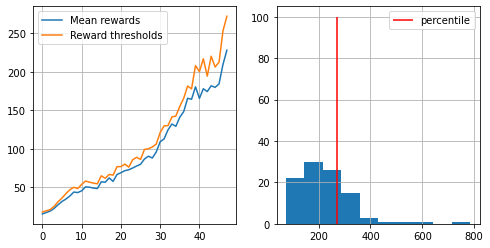

mean reward = 211.213, threshold=236.991


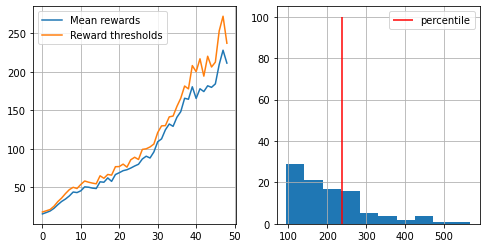

mean reward = 215.572, threshold=240.172


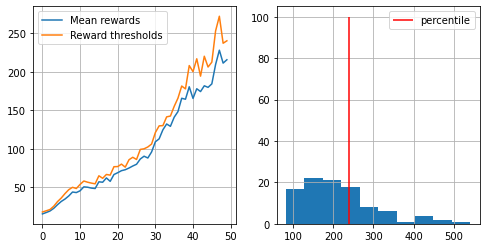

mean reward = 225.754, threshold=275.522


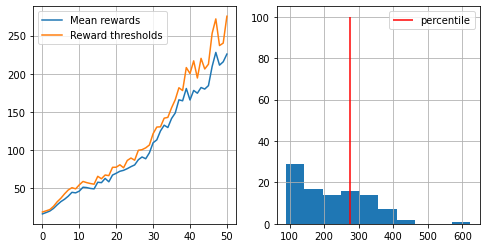

mean reward = 241.674, threshold=279.580


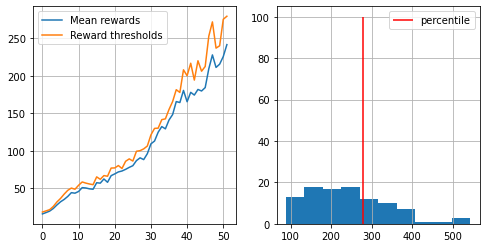

mean reward = 256.901, threshold=308.837


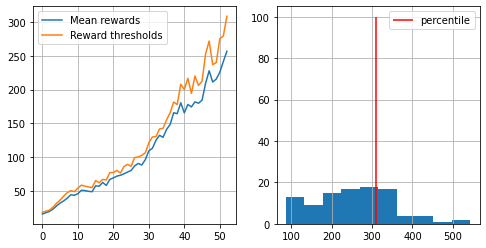

mean reward = 271.953, threshold=315.624


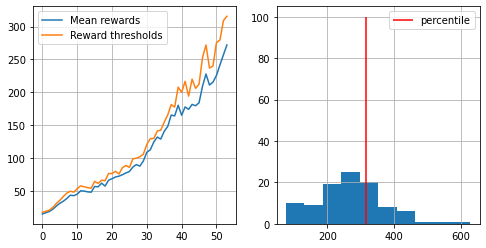

mean reward = 284.314, threshold=312.790


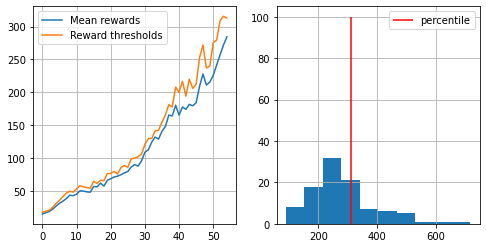

mean reward = 278.070, threshold=331.478


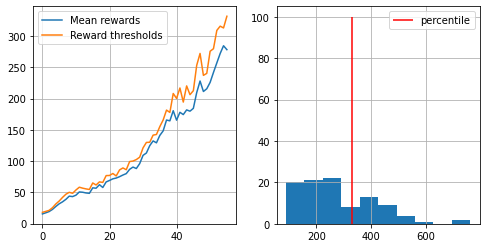

mean reward = 289.933, threshold=319.958


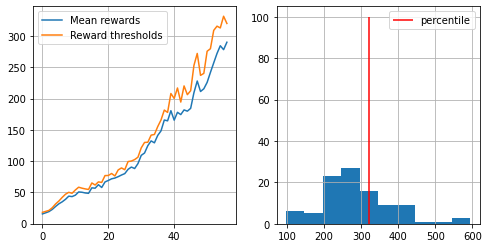

mean reward = 325.130, threshold=354.617


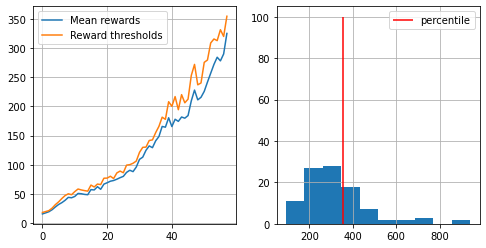

mean reward = 372.208, threshold=431.677


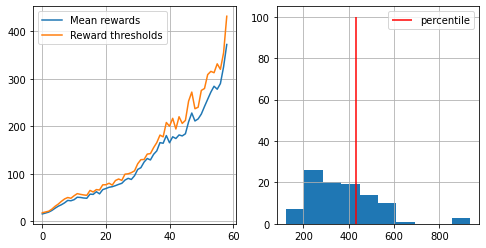

mean reward = 427.448, threshold=494.800


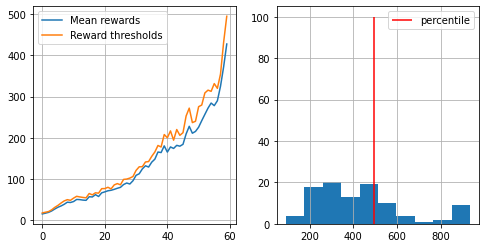

mean reward = 534.435, threshold=643.069


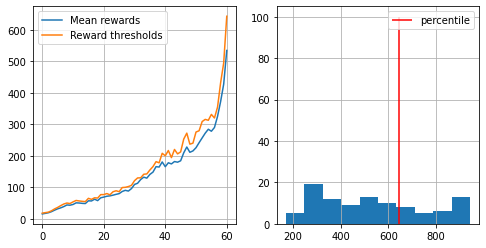

mean reward = 602.198, threshold=731.511


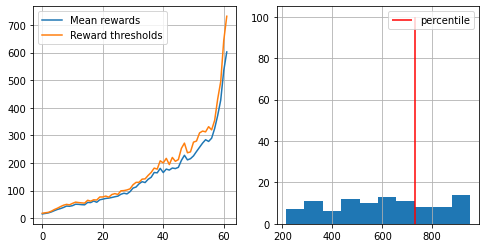

mean reward = 776.432, threshold=914.087


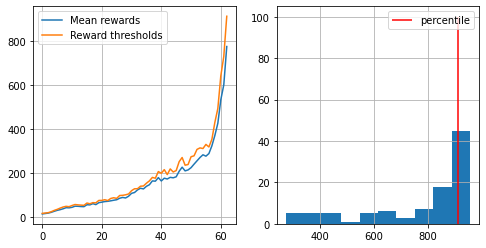

mean reward = 927.704, threshold=940.387


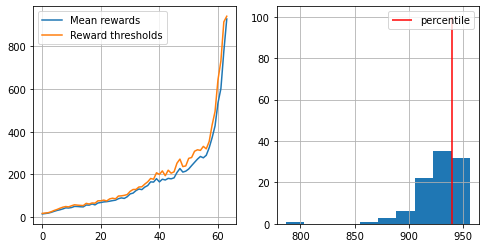

mean reward = 932.241, threshold=940.262


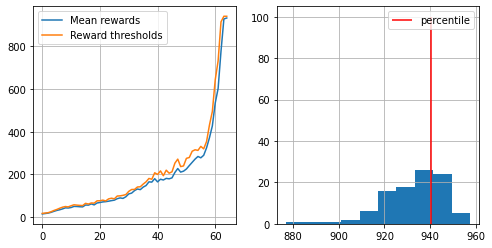

mean reward = 938.967, threshold=945.442


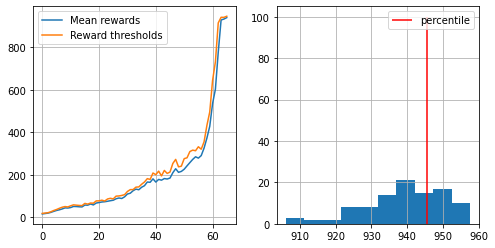

mean reward = 947.463, threshold=952.121


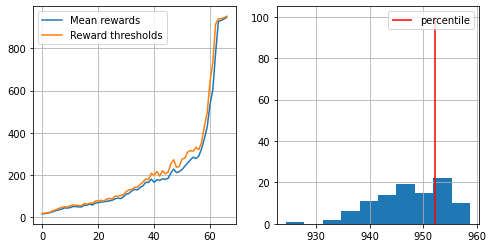

mean reward = 953.265, threshold=955.343


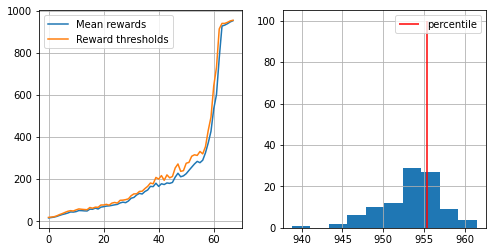

mean reward = 953.601, threshold=955.950


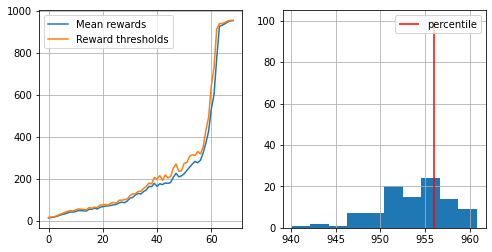

mean reward = 956.845, threshold=958.502


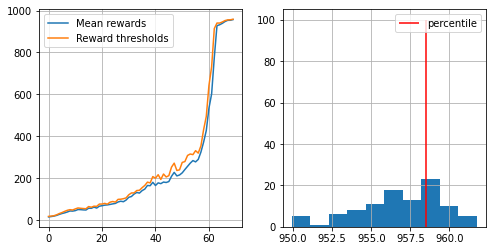

mean reward = 957.176, threshold=958.788


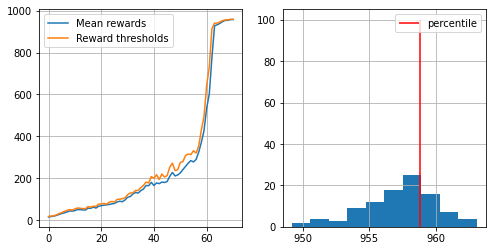

mean reward = 957.807, threshold=958.982


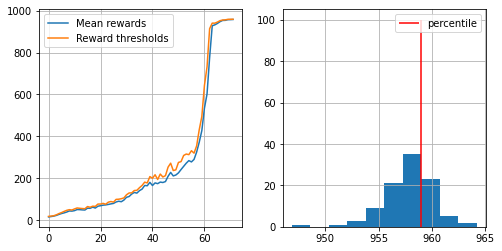

KeyboardInterrupt: 

In [61]:
n_sessions = 100
percentile = 70
log = []

drawPole=False

for i in range(100):
    #generate new sessions
    sessions = [generate_session() for _ in range(n_sessions)]

    states_batch,actions_batch,rewards_batch = zip(*sessions)
    #print(states_batch.shape)

    elite_states, elite_actions = select_elites(states_batch,actions_batch,rewards_batch,percentile=50)

    #fit agent

    agent.fit(elite_states,elite_actions)

    show_progress(rewards_batch,log)


In [64]:
drawPole=True
generate_session()

KeyboardInterrupt: 

# Report (1 pts)

## Первая задача
В первой задаче наилучшими параметрами оказались --- 30% элитных агентов, больше 100 сессий создавать не имеет смысла. Агент с сессией из 1 игры обучается гораздо быстрее, но агент с сессией из 10 игр обучается на более высокий уровень.

---

## Вторая задача
Во второй задаче агент хорошо обучается и без оптимизаций.